In [1]:
import matplotlib.pyplot as plt
import numpy as np
import math 
import sklearn.preprocessing 
import random
import yaml
import h5py
import logging
import datetime
import os
import time
import sys

import pprint
from tqdm import tqdm_notebook as tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, SequentialSampler, BatchSampler
import torch.nn.functional as F


from load_matlab_timedata import get_data_from
from src.TSGenerator import f_Y, f_X, get_func_timeseries
from src.DataLoader import TimeSeriesDataset
from src.model_utils import init_logger, plot_shared_scale, plot_multiscale
from src.Model import LSTM
from src.Losses import myLoss, aux_loss_jordan, prognose_dy

from torch.optim.lr_scheduler import ReduceLROnPlateau  


## Loading config files, setup execution parameters, init objects

In [2]:
plt.rcParams['figure.figsize'] = 20, 7.
CONFIG_FILENAME = "model_params_jordan.yaml"
# ! ls DC_motor_simulation
with open(CONFIG_FILENAME, 'r') as f:
        config = yaml.load(f, Loader=yaml.FullLoader)
   
pprint.pprint(config)


p_net = config['network_params']

p_train = config['train_params']

p_gen = config['generator_params']

p_data = config['data_params']
need_normalize = p_data['need_normalize']

{'data_params': {'best_discrete_k': 3,
                 'integration_step': 0.01,
                 'leave_nth': 13,
                 'mat_file': 'DC_motor_simulation/train_3_parameters.mat',
                 'need_normalize': True,
                 'specific_data_source': 'DC_motor_simulation/test_3_parameters_5_15_1_20_additive_noise.mat',
                 'specific_data_sources': ['DC_motor_simulation/test_3_parameters_5_15_1_20_additive_noise.mat',
                                           'DC_motor_simulation/test_3_parameters_5_15_1_20_additive_sin.mat',
                                           'DC_motor_simulation/test_3_parameters_d_001_2.mat',
                                           'DC_motor_simulation/test_3_parameters_v_0_33.mat'],
                 'test_size': 0.3,
                 'use_part_of_data': 1.0},
 'exp_path': 'only_batches',
 'generator_params': {'a': 0.5, 'b': 1.0, 'f_X': 'math.sin', 'f_Y': 'math.cos'},
 'is_debug': False,
 'jordan_path': 'jordan.pt',
 'ne

# Set parameters

In [3]:

# # If `per_element` is True, then LSTM reads in one timestep at a time.
if  p_net['per_element']:
    lstm_input_size = 1
else:
    lstm_input_size = p_net['input_size']
    
# if is_debug:
#     x, y = get_func_timeseries(f_Y = f_Y, f_X = f_X, a=p_generate['a'], b=p_generate['b'])
to_generate_data = config['to_generate_data'] 
if to_generate_data:
    p_gen = config['generator_params']
    print("Data generator params:")
    pprint.pprint(p_gen)
    a = p_gen['a']
    b = p_gen['b']
is_debug = config['is_debug']


init_logger(config)

logging.info("Experiment started with params")
logging.info(f"data_par: {p_data}")
logging.info(f"net_par: {p_net}")
logging.info(f"train_par: {p_train}") 

logger inited to file [only_batcheslogs/exp_2019-05-18_15:51:57.log]


## Init data loader and get appropriate part of data

## Creating objects from imported files

In [4]:
from src.Model import LSTM, LSTM_jordan
from src.Losses import myLoss, prognose_dy, myLoss_jordan  # imports here for faster rerun and debug procedure

model = LSTM_jordan(lstm_input_size,
             p_net['hidden_size'],
             batch_size=p_train['batch_size'],
            jordan_params=3,
             output_dim=1,
             num_layers=p_net['num_layers'],
                    lstm_bias=p_net['bias'])

loss_fn = myLoss_jordan


In [5]:
for name, parameter in model.named_parameters():
    print(name, '\t\t', parameter.shape)

jordan 		 torch.Size([1, 3])
lstm.weight_ih_l0 		 torch.Size([8, 4])
lstm.weight_hh_l0 		 torch.Size([8, 2])
lstm.bias_ih_l0 		 torch.Size([8])
lstm.bias_hh_l0 		 torch.Size([8])
linear.weight 		 torch.Size([1, 2])
linear.bias 		 torch.Size([1])


In [6]:
model.lstm.parameters

<bound method Module.parameters of LSTM(4, 2)>

In [7]:
model.jordan.requires_grad

True

In [8]:
p_optim = p_train['optimizer']

if p_optim['optimizer'] == "adam":
    optimizer = torch.optim.Adam(
#         filter(lambda p: p.requires_grad, model.parameters()),
#         lr=0.01
        [
                {
                    'params': filter(lambda p: p.requires_grad, [model.jordan]),
                    'lr': 0,
                    'betas': (0.8, 0.95),
                    'weight_decay':p_optim['jordan']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.lstm.parameters()), 
                    'lr': p_optim['lstm']['lr'],
                    'weight_decay':p_optim['lstm']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.linear.parameters()),
                    'lr': p_optim['linear']['lr'],
                    'weight_decay':p_optim['linear']['wd']
                }
            ]
    )

logging.info(f"Model n params: {model.get_num_params()}")
print(f"model has [{model.get_num_params()}] params")
num_epochs = p_train['num_epochs']
logging.info("Training process INITIALIZED")
optimizer

model has [70.0] params


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.8, 0.95)
    eps: 1e-08
    lr: 0
    weight_decay: 0

Parameter Group 1
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0

Parameter Group 2
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)

In [9]:
optim_jord = torch.optim.Adam(
        [
                {
                    'params': filter(lambda p: p.requires_grad, [model.jordan]),
                    'lr': p_optim['jordan']['lr'],
                    'betas': (0.8, 0.95),
                    'weight_decay':p_optim['jordan']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.lstm.parameters()), 
                    'lr': p_optim['lstm']['lr'],
                    'weight_decay':p_optim['lstm']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.linear.parameters()),
                    'lr': p_optim['linear']['lr'],
                    'weight_decay':p_optim['linear']['wd']
                }
            ]
    )

In [10]:
p_sched = p_train['lr_scheduler']
scheduler = ReduceLROnPlateau(optimizer=optimizer,
                              mode='min',
                              factor=p_sched['lr_drop'],
                              patience=p_sched['patience'],
                              cooldown=p_sched['cooldown'],
                              threshold=p_sched['threshold'],
                              threshold_mode='rel',
                              min_lr=10**p_sched['early_stop_order'],
                             verbose=True
                             )
print("LR scheduler set_uped")
scheduler.state_dict()

LR scheduler set_uped


{'factor': 0.4,
 'min_lrs': [1e-08, 1e-08, 1e-08],
 'patience': 60,
 'verbose': True,
 'cooldown': 4,
 'cooldown_counter': 0,
 'mode': 'min',
 'threshold': 0.01,
 'threshold_mode': 'rel',
 'best': inf,
 'num_bad_epochs': 0,
 'mode_worse': inf,
 'eps': 1e-08,
 'last_epoch': -1}

In [11]:
sample_x= torch.rand([p_net['retrospective_steps'], p_train['batch_size'], 1])
y, pars = model(sample_x)

In [12]:
sample_x.shape


torch.Size([64, 1024, 1])

using 1.0 of data
loading from [DC_motor_simulation/train_3_parameters.mat]
X normalized, norms: [14.99931682]
x shape (76924, 1)
x_normalized shape (76924, 1)


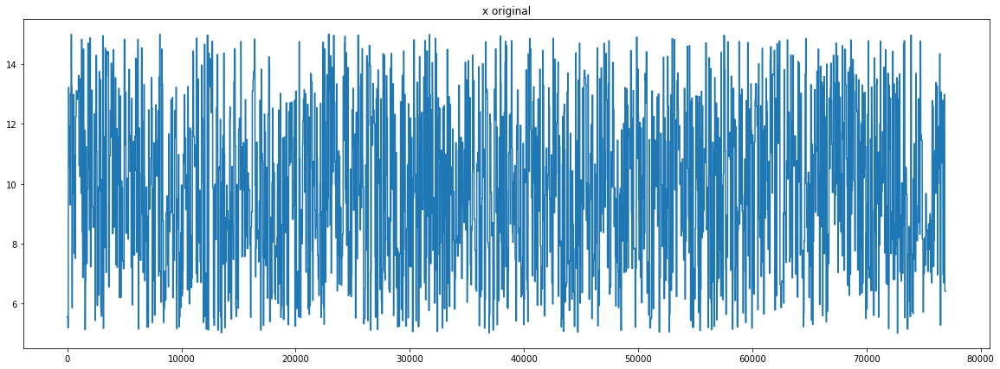

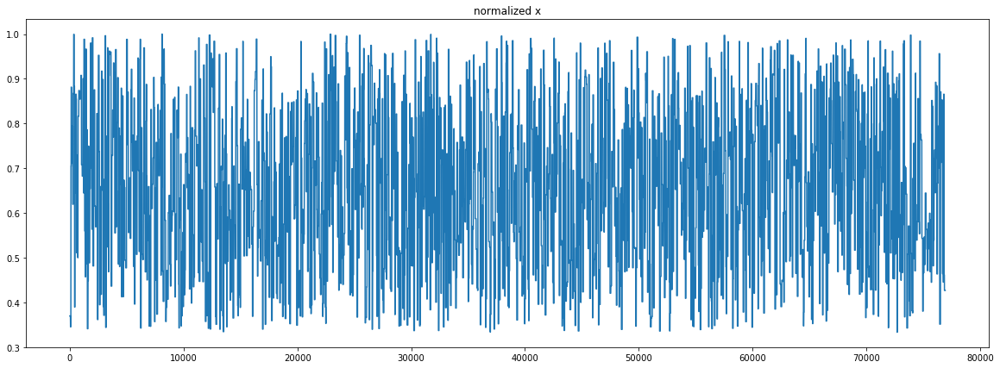

Y normalized, norms: [0.01324489]
input shape (76924, 1)
input partition shape (23078, 1)
output partition shape (23078, 1)
stacked Y shape  (23014, 1)
Y_tensor torch.Size([23014, 1])
X_tensor torch.Size([64, 23013, 1])
loading from [DC_motor_simulation/train_3_parameters.mat]
X normalized, norms: [14.99931682]
x shape (76924, 1)
x_normalized shape (76924, 1)


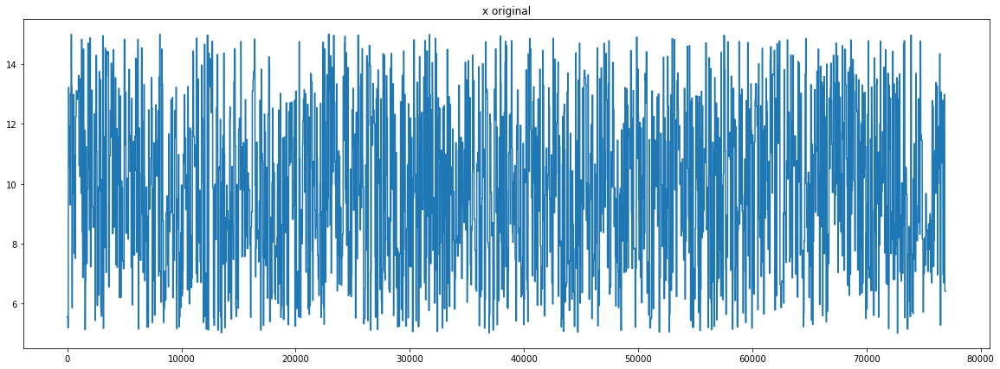

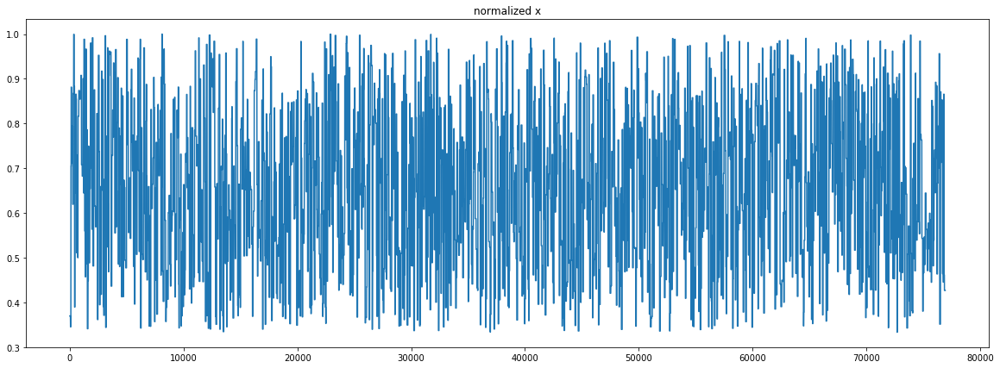

Y normalized, norms: [0.01324489]
input shape (76924, 1)
input partition shape (53846, 1)
output partition shape (53846, 1)
stacked Y shape  (53782, 1)
Y_tensor torch.Size([53782, 1])
X_tensor torch.Size([64, 53781, 1])
train set: [53782] batches
test set: [23014] batches
data_loading time 39.98870897293091 secs


In [13]:
# todo add time tracking for this cell
use_part = p_data['use_part_of_data']
print(f"using {use_part} of data")

t_tick = time.time()

test_ts_ds = TimeSeriesDataset(config=config,
                               partition=(use_part - use_part*p_data['test_size'], use_part),                        
                               logging=logging)

train_ts_ds = TimeSeriesDataset(config=config,
                                partition=(0, use_part - use_part*p_data['test_size']),
                                logging=logging)

print(f"train set: [{len(train_ts_ds)}] batches")
print(f"test set: [{len(test_ts_ds)}] batches")

if need_normalize:
    config['x_norm'] = train_ts_ds.x_norms[0]
    config['y_norm'] = train_ts_ds.y_norms[0]
    config['x_norm']
else:
    config['x_norm'] = 1
    config['y_norm'] = 1
    config['x_norm']

train_dl = DataLoader(dataset = train_ts_ds,
                      batch_sampler = BatchSampler(
                          sampler = SequentialSampler(train_ts_ds), 
                          batch_size = p_train['batch_size'],
                          drop_last = True)
                     )
test_dl = DataLoader(dataset = test_ts_ds,
                     batch_sampler = BatchSampler(
                     sampler = SequentialSampler(test_ts_ds), 
                     batch_size = p_train['batch_size'], 
                     drop_last = True)
                    )    
    
t_tock = time.time()
dataload_time = t_tock - t_tick
print(f"data_loading time {dataload_time} secs")

## Inspecting data we have, get several batches and look inside on pretty large scale to see individual iterations:

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 64, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


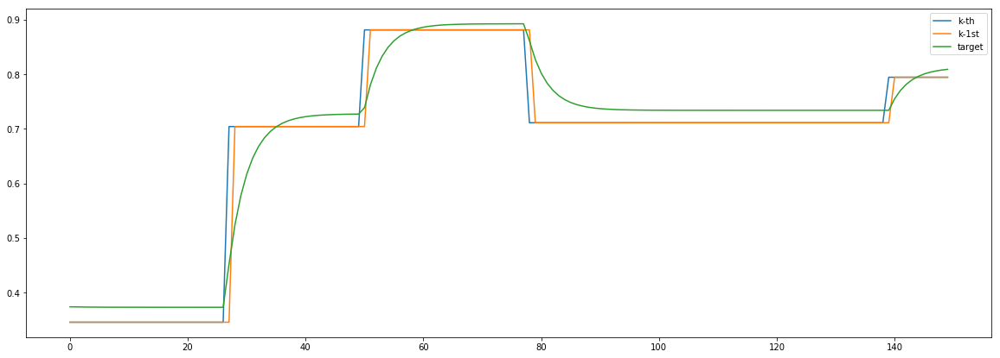

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 64, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


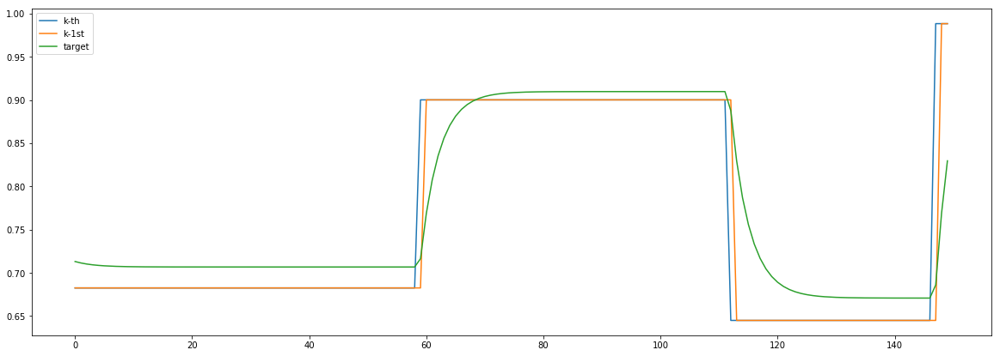

In [14]:
f, t = 0, 150
for i, batch in enumerate(train_dl):
    x, y, ind = batch
    print(f"x [batch_size, retrospective_steps, channels] :{x.shape}")
    print(f"y [batch_size, channels]: {y.shape}")
    y_kth = y.detach().numpy()[f:t, 0]
    print(f"y_last [slice_size]: {y_kth.shape}")
    x = x.transpose(0,1)
    plt.plot(x.detach().numpy()[-1][f:t], label='k-th')
    plt.plot(x.detach().numpy()[-2][f:t], label='k-1st')
    plt.plot(y_kth, label='target')
    plt.legend()
    plt.show()
    if i == 1:
        break

In [15]:
# #####################
# # 
# #####################
# from torch.nn import init
# for layer_p in a._all_weights:
#     for p in layer_p:
#         if 'weight' in p:
#             # print(p, a.__getattr__(p))
#             init.normal(a.__getattr__(p), 0.0, 0.02)

In [16]:
logging.info("History INITIALIZED")

hist = {
    
    "train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "jordan":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    "eval_train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "jordan":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    "eval_test":{
        "batches":{
            "main":np.zeros(len(test_dl)),
            "aux":np.zeros(len(test_dl)),
            "jordan":np.zeros(len(test_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    'mean_params_sample':
    {
        '1':np.zeros(num_epochs),
        '2':np.zeros(num_epochs),    
        '3':np.zeros(num_epochs)
    },
    'lr': np.zeros(num_epochs),
    'loss_rate': np.zeros(num_epochs),
    'weights_sum': np.zeros(num_epochs), 
    'weights_var': np.zeros(num_epochs),
    
    'grads':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'weights':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'vars':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'param_grads':{
        'batches':{"p1":np.zeros(len(train_dl)),
                   "p2":np.zeros(len(train_dl)),
                   "p3":np.zeros(len(train_dl))
                  },
        'epochs':{
            "p1":np.zeros(num_epochs), 
            "p2":np.zeros(num_epochs),
            "p3":np.zeros(num_epochs)
        }
    },
    'aux_global':[],
    'grad_global':{'p1':[], 'p2':[],'p3':[],'lstm':[], 'linear':[]}
}

In [17]:
def batch_iteration(iter_index, model, optimizer, batch_data, backprop, hist_part):
    
    x_batch, y_batch, indexes = batch_data
    x_batch.transpose_(0, 1) # todo get rid of it
    model.hidden = model.init_hidden()   
    
    
    if backprop:
        y_pred, jordan = model(x_batch)
        
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=False,
                        core_flag=False,
                      aux_flag=True,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses
        
        optimizer.zero_grad()
        aux_loss *= 10**p_train['aux_loss']['scaling_order']
        aux_loss.backward()
        optimizer.step()
        
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=True,
                        core_flag=False,
                      aux_flag=False,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses
        
        optim_jord.zero_grad()
        jordan_loss *= 10**p_train['jordan_loss']['scaling_order'] # TODO change to special
        jordan_loss.backward()
        optim_jord.step()

        main_loss *= 0 #10*p_train['core_loss']['scaling_order']
        
        
        
        
    else:
        y_pred, jordan = model(x_batch)
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=True,
                        core_flag=True,
                      aux_flag=True,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses

#         optimizer.zero_grad()
        
#         aux_loss.backward()
        
#         combined_loss.backward()
    # TODO or manually add weight decay here when grad is ready
    #         print(f"losses after scaling: m[{main_loss.item()}] a[{aux_loss.item()}] c[{const_loss.item()}]")
        for name, parameter in model.named_parameters():
            hist['grads']['batches'][name][iter_index] = parameter.grad.sum().item()
            hist['weights']['batches'][name][iter_index] = parameter.sum().item()
            hist['vars']['batches'][name][iter_index] = parameter.var().item()
        hist['param_grads']['batches']['p1'][iter_index] = model.jordan.grad[0][0].item()
        hist['param_grads']['batches']['p2'][iter_index] = model.jordan.grad[0][1].item()
        hist['param_grads']['batches']['p3'][iter_index] = model.jordan.grad[0][2].item()
        
        hist['grad_global']['p1'].append(model.jordan.grad[0][0].item())
        hist['grad_global']['p2'].append(model.jordan.grad[0][1].item())
        hist['grad_global']['p3'].append(model.jordan.grad[0][2].item())
        
        hist['grad_global']['lstm'].append(sum([p.grad.abs().sum() for p in model.lstm.parameters()]).item())
        hist['grad_global']['linear'].append(sum([p.grad.abs().sum() for p in model.linear.parameters()]).item())
        hist['aux_global'].append(aux_loss.item())
        
#         optimizer.step()
    
    hist_part["main"][iter_index] = main_loss.item()
    hist_part["aux"][iter_index] = aux_loss.item()
    hist_part["jordan"][iter_index] = jordan_loss.item()
    
    return y_pred, jordan

In [18]:
def update_long_term_hist(batches_hist, long_term_hist):
    mean_main = np.average(batches_hist["main"])
    mean_aux = np.average(batches_hist["aux"])
    mean_jord = np.average(batches_hist["jordan"])
    long_term_hist["main"][t] = mean_main
    long_term_hist["aux"][t] = mean_aux
    long_term_hist["jordan"][t] = mean_jord
    return mean_main, mean_aux, mean_jord

In [19]:
def slice_loss_sum(losses_dict, index):
    return sum([val[index] for val in losses_dict.values()])

In [20]:
for p in model.parameters():
    print(p)

Parameter containing:
tensor([[0., 0., 0.]], requires_grad=True)
Parameter containing:
tensor([[-6.8911e-01, -3.9355e-02, -6.8556e-01,  5.1773e-01],
        [ 1.3971e-01,  1.6993e-01,  5.1153e-01, -4.5246e-01],
        [-3.6423e-01, -1.3189e-01,  6.7313e-01, -4.6047e-01],
        [-3.8929e-01, -1.4951e-01,  2.1083e-01, -6.1880e-01],
        [-2.3039e-01, -2.5492e-02, -4.3120e-01, -1.9874e-01],
        [ 4.2013e-01,  5.9865e-01,  5.5987e-01,  5.1086e-01],
        [ 1.9518e-01, -7.6473e-05, -8.3961e-03, -1.5544e-01],
        [-1.2477e-01,  6.4673e-01, -2.4088e-01, -9.8937e-02]],
       requires_grad=True)
Parameter containing:
tensor([[-0.5868,  0.2652],
        [ 0.2865, -0.5744],
        [ 0.2667,  0.5260],
        [-0.2926,  0.5012],
        [ 0.6910, -0.1416],
        [-0.0367,  0.3352],
        [-0.0336, -0.0181],
        [ 0.6518, -0.2846]], requires_grad=True)
Parameter containing:
tensor([ 0.6848,  0.1297,  0.5384, -0.2369, -0.2007, -0.4878,  0.0997, -0.4162],
       requires_gra

## Train model


aux preds: 0.10794390738010406           0.3276282250881195           0.21049810945987701
main loss 0.0
aux loss 0.0
jord loss 6268336.427884615
combined loss 6268336.427884615 



Parameter containing:
tensor([[0.1079, 0.3276, 0.2105]], requires_grad=True)


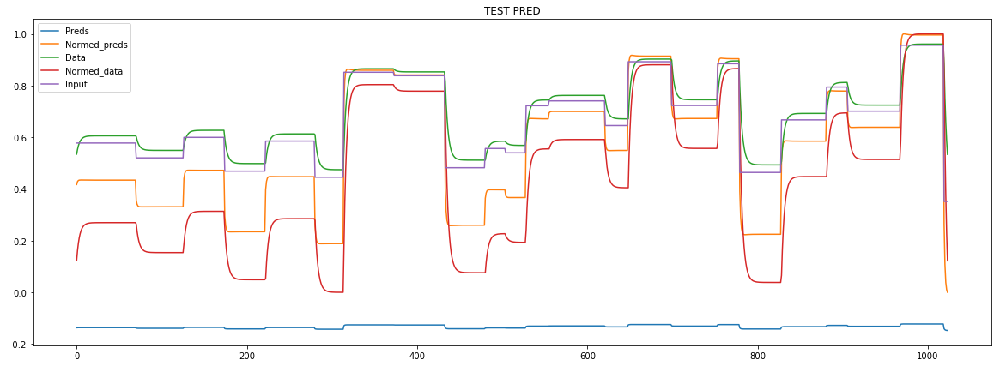

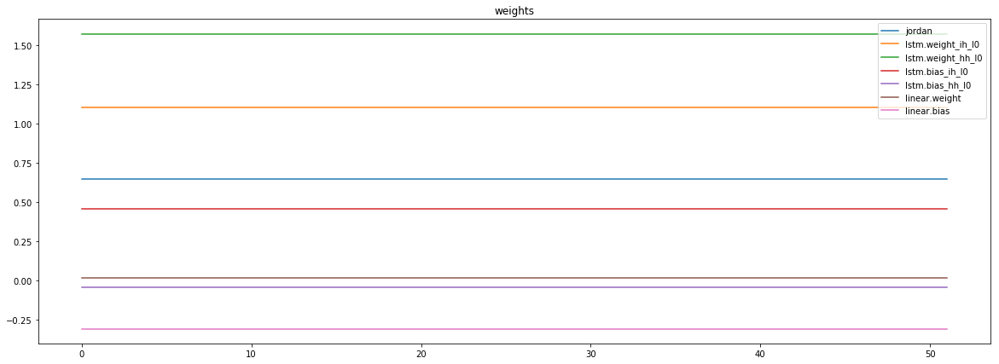

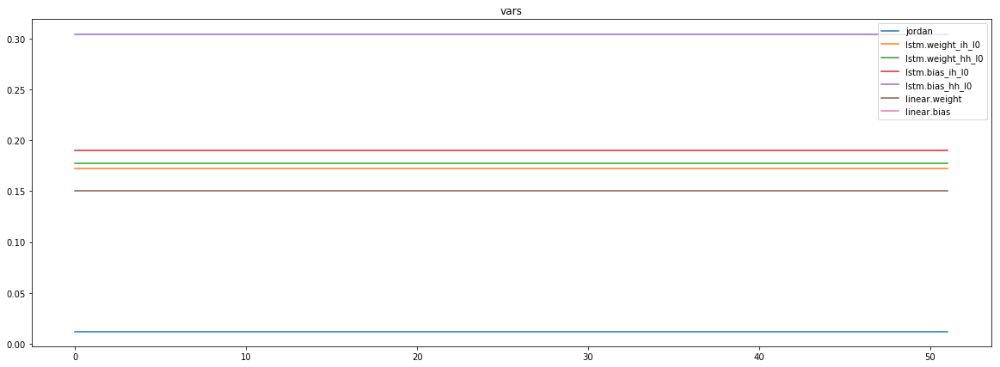

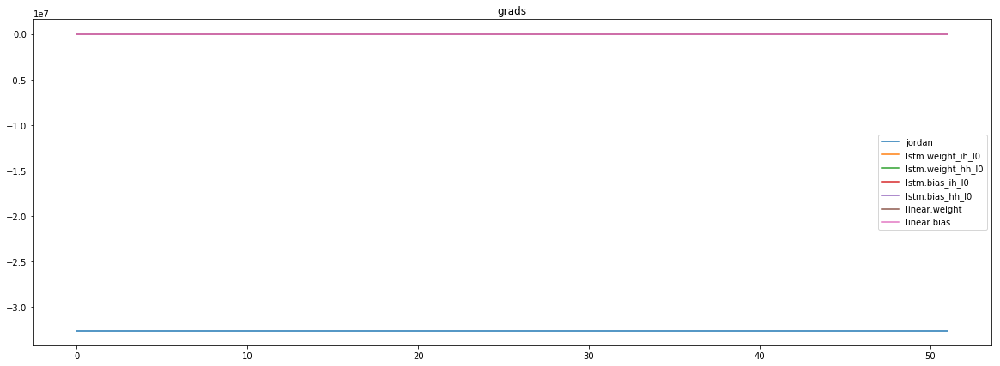

mean_p1 : -28595668.0
mean_p2 : -3931705.5
mean_p3 : -39227.609375


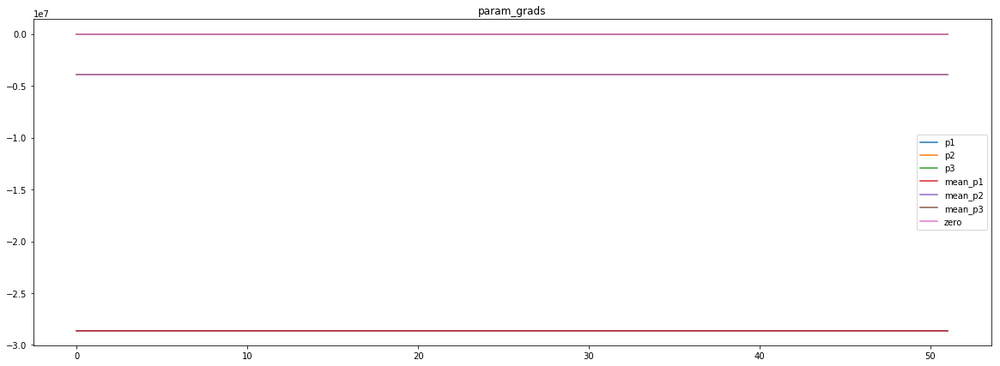

Epoch [0] 
     train_loss[6268336.427884615] 
     eval_train[7.106937161333358] 
     eval_test[7.2687614572403785]



aux preds: 0.15541578829288483           0.7305333614349365           0.5206427574157715
main loss 0.0
aux loss 0.0
jord loss 1794891.1983173077
combined loss 1794891.1983173077 



Parameter containing:
tensor([[0.1554, 0.7305, 0.5206]], requires_grad=True)


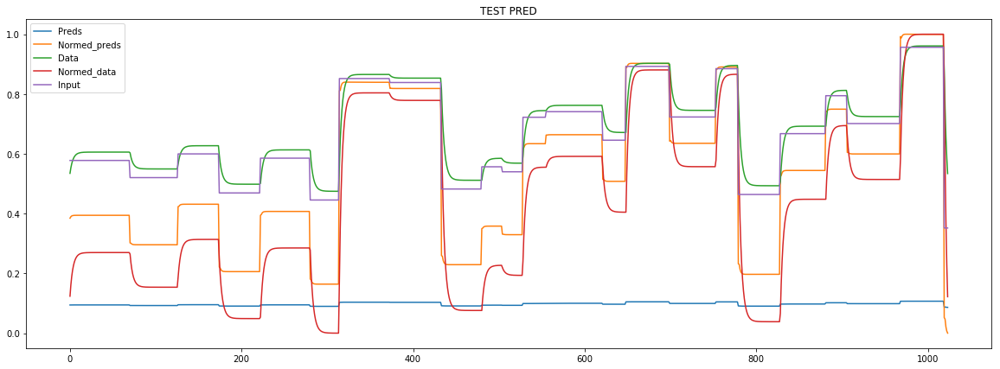

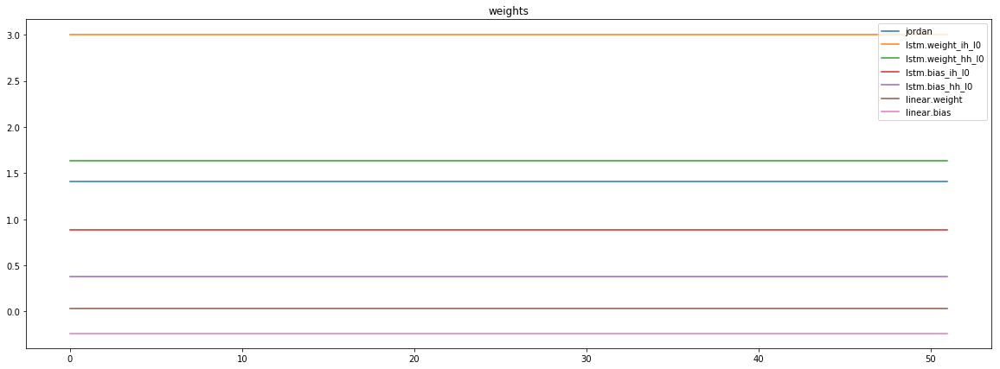

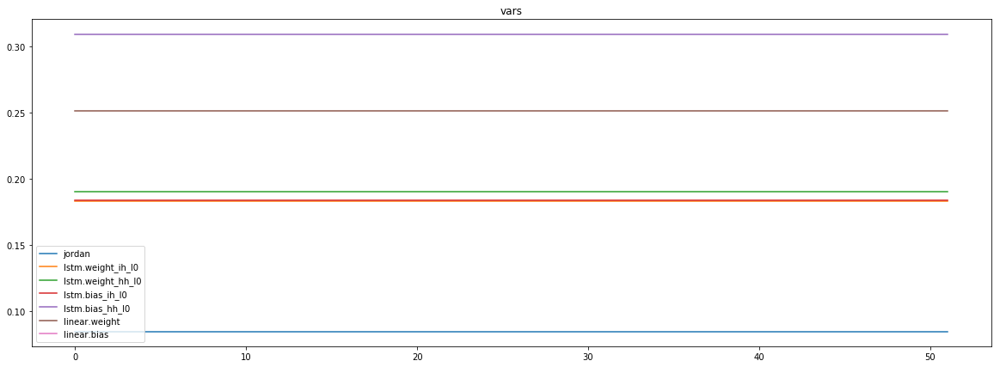

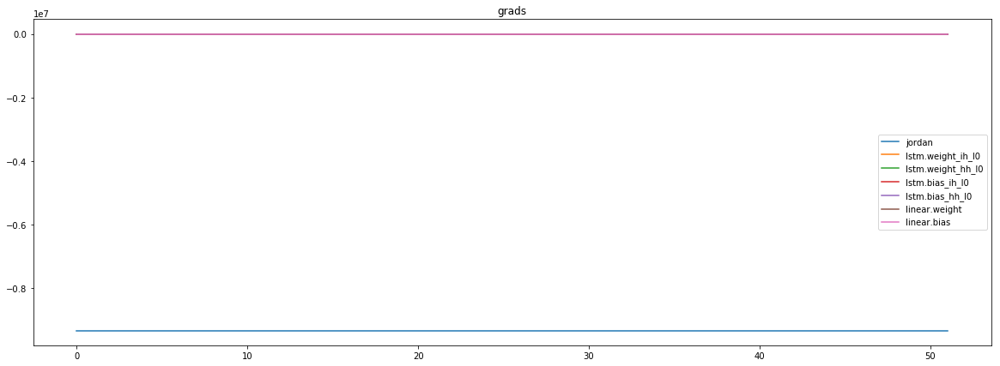

mean_p1 : -6613586.0
mean_p2 : -2696018.0
mean_p3 : -26849.955078125


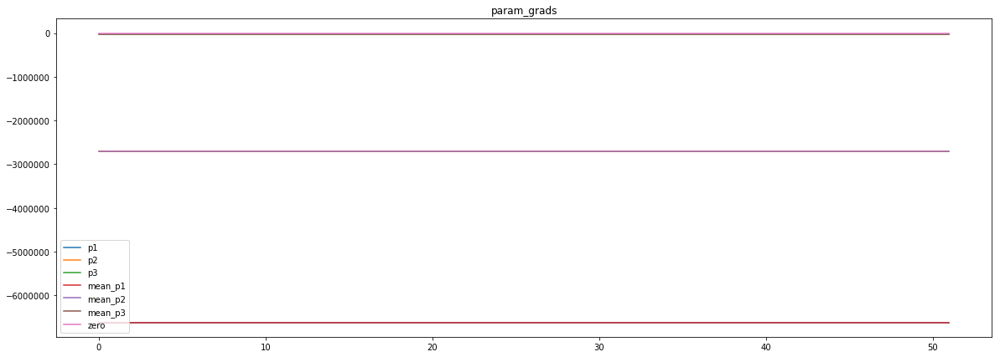

Epoch [1] 
     train_loss[1794891.1983173077] 
     eval_train[3.4654914145939983] 
     eval_test[3.553501174404201]



aux preds: 0.1869986653327942           1.0955209732055664           0.8753365874290466
main loss 0.0
aux loss 0.0
jord loss 400832.22340745194
combined loss 400832.22340745194 



Parameter containing:
tensor([[0.1870, 1.0955, 0.8753]], requires_grad=True)


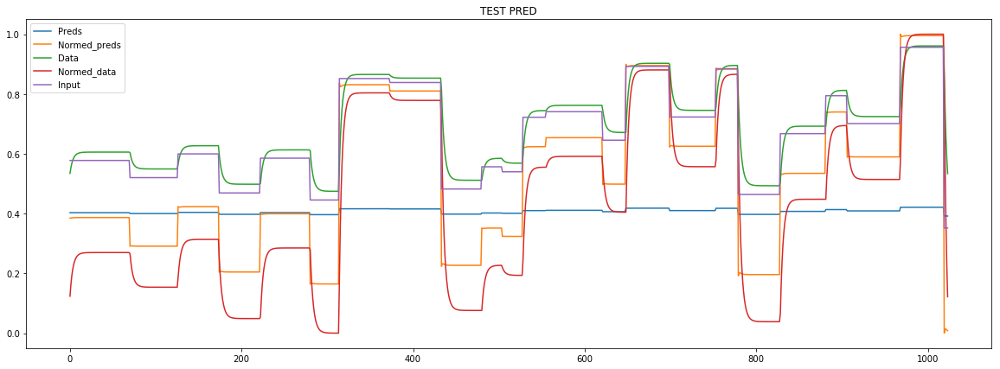

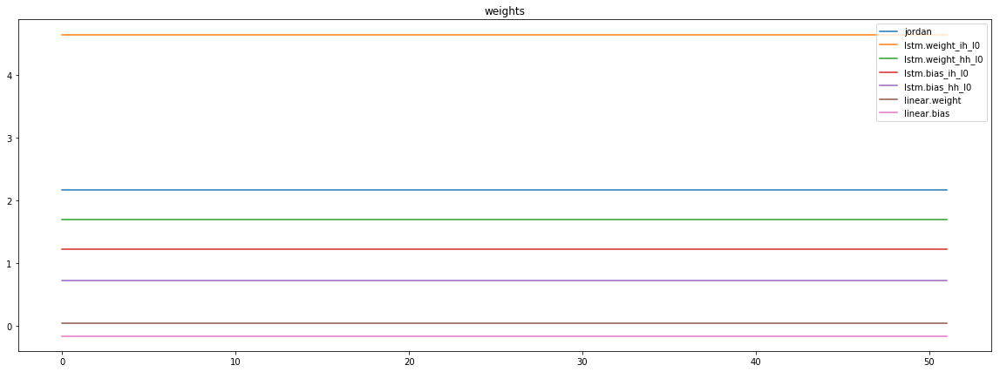

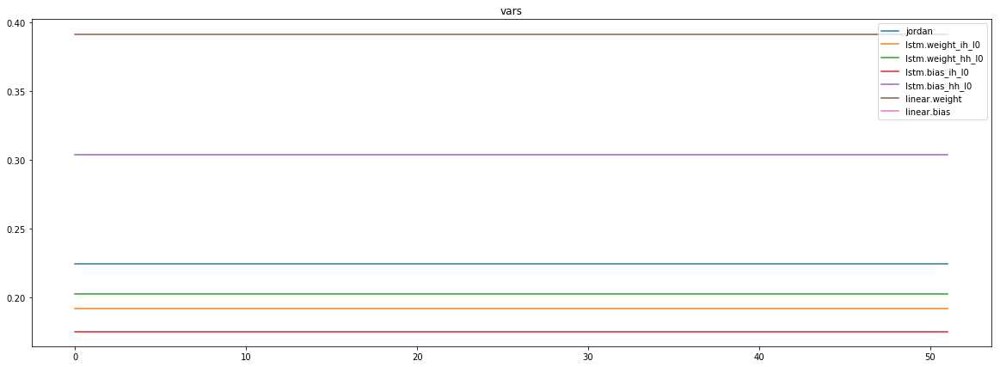

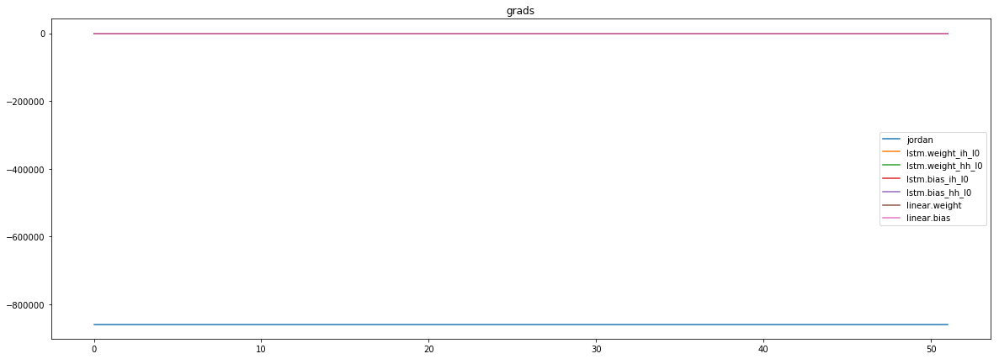

mean_p1 : -833717.5
mean_p2 : -22513.28125
mean_p3 : -3166.798828125


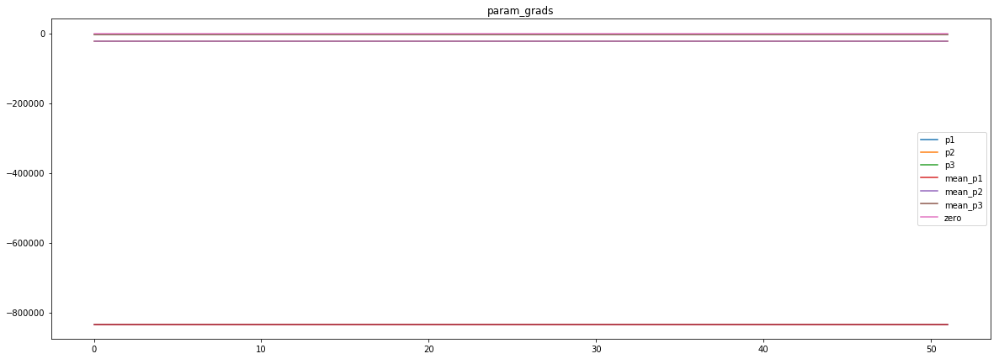

Epoch [2] 
     train_loss[400832.22340745194] 
     eval_train[1.0352316849905319] 
     eval_test[1.0837500971868972]



aux preds: 0.2206127941608429           1.087813138961792           1.038701057434082
main loss 0.0
aux loss 0.0
jord loss 91940.47213040866
combined loss 91940.47213040866 



Parameter containing:
tensor([[0.2206, 1.0878, 1.0387]], requires_grad=True)


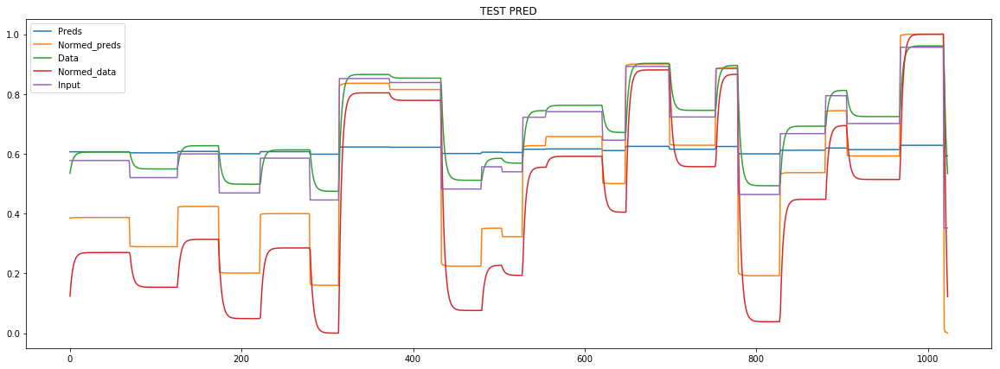

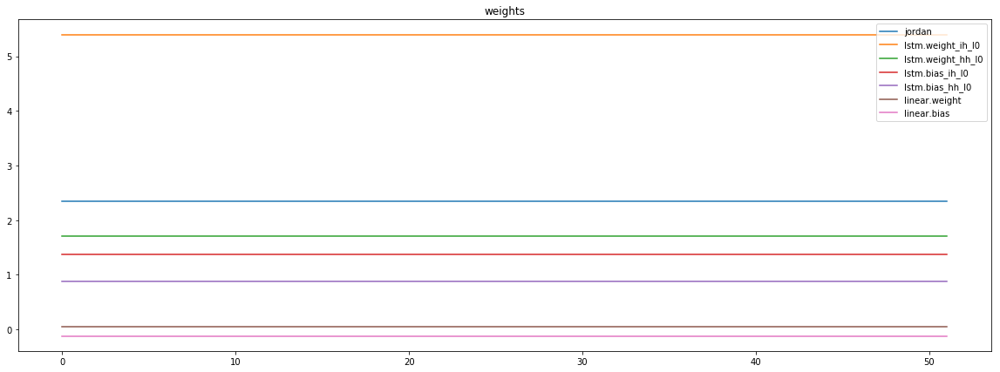

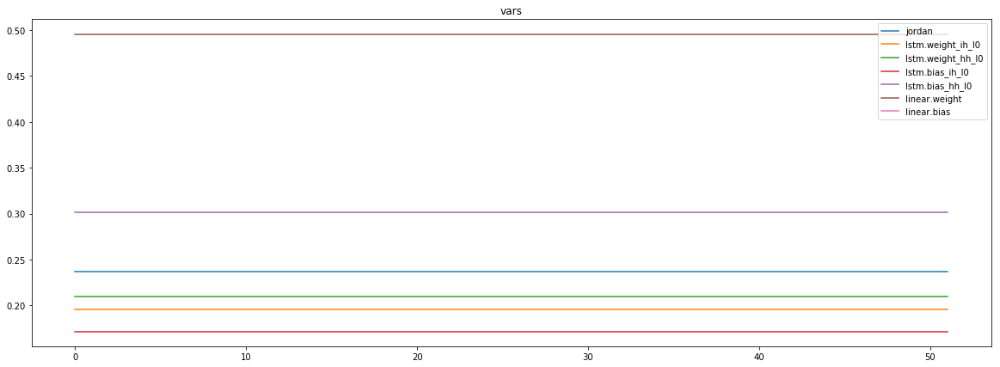

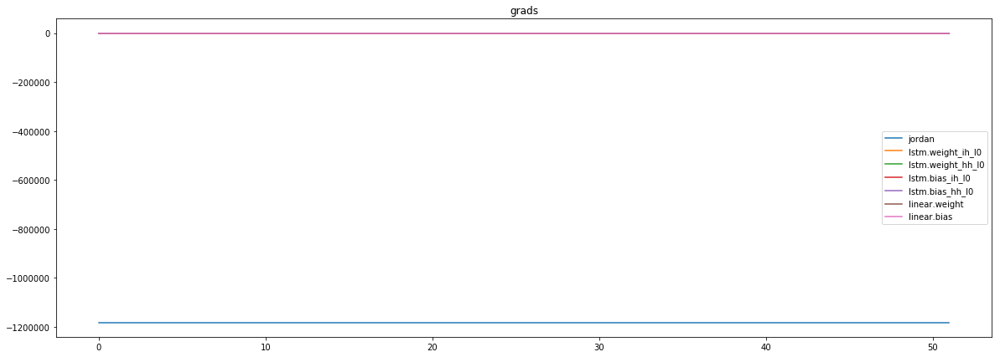

mean_p1 : -615701.8125
mean_p2 : -557687.875
mean_p3 : -8198.66796875


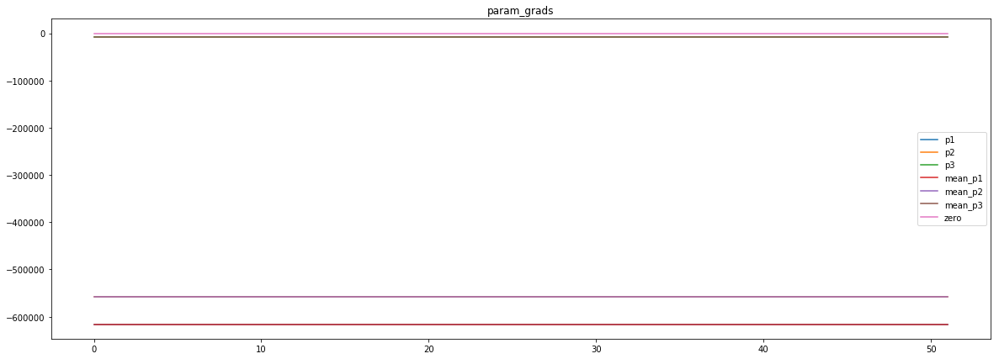

Epoch [3] 
     train_loss[91940.47213040866] 
     eval_train[0.545347100620767] 
     eval_test[0.5533236803603359]



aux preds: 0.2988438308238983           1.0852752923965454           1.2843478918075562
main loss 0.0
aux loss 0.0
jord loss 63977.827073317305
combined loss 63977.827073317305 



Parameter containing:
tensor([[0.2988, 1.0853, 1.2843]], requires_grad=True)


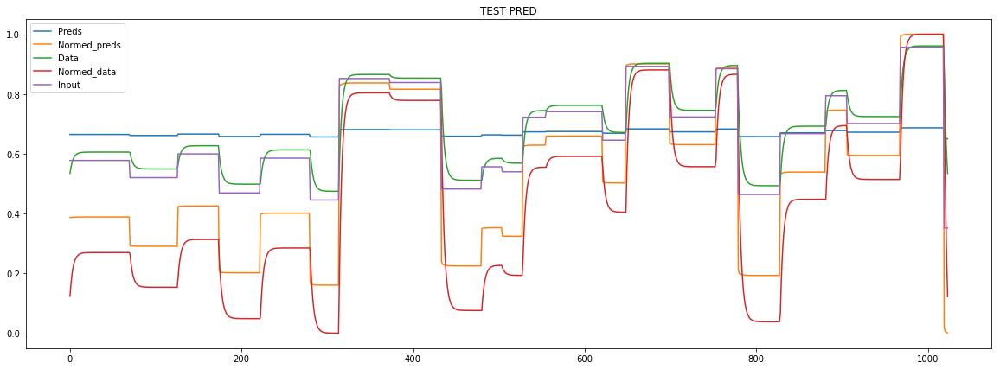

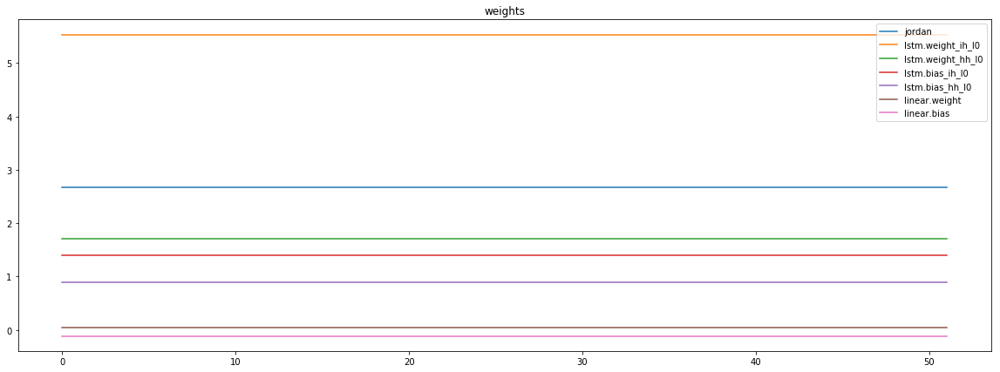

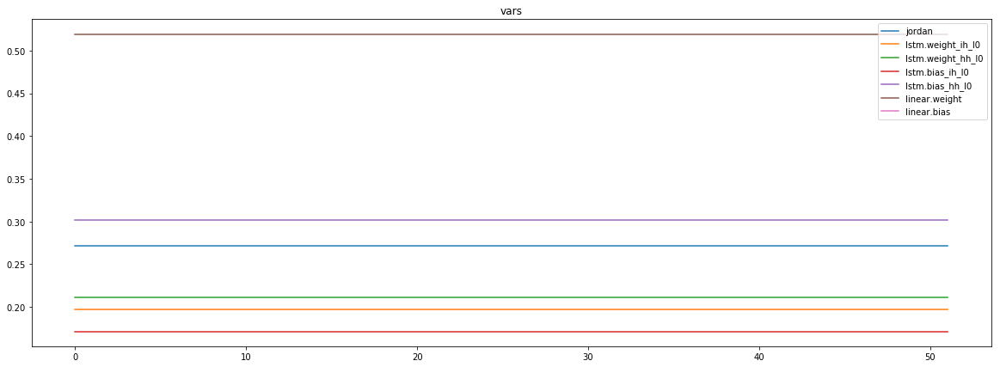

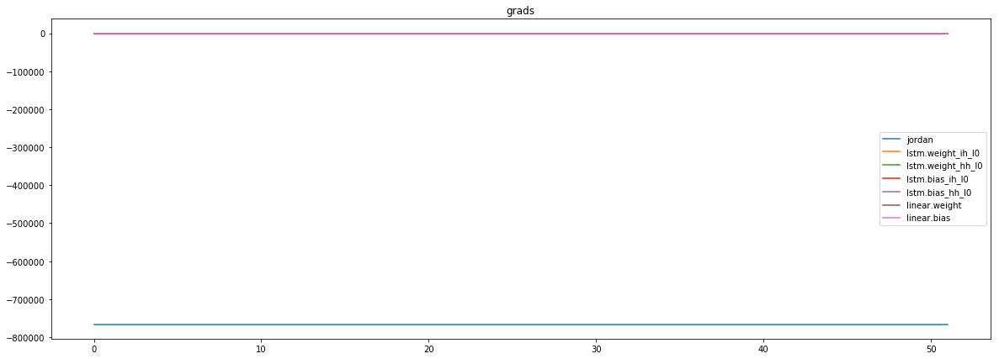

mean_p1 : -335497.28125
mean_p2 : -424088.84375
mean_p3 : -6219.7861328125


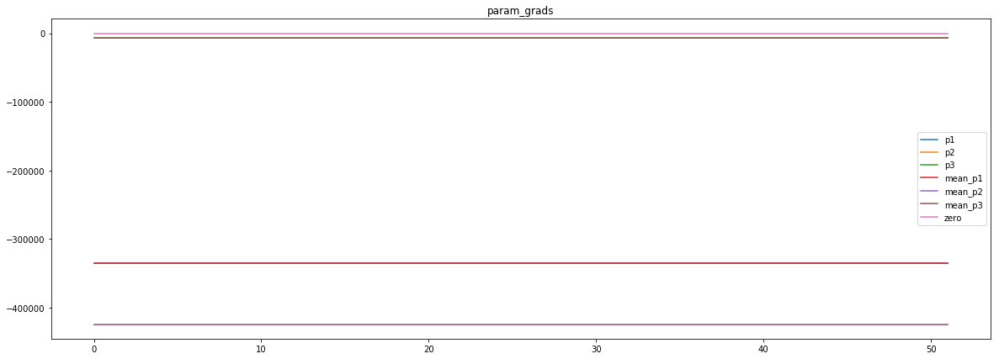

loss rate [0.7838729937330944]
Epoch [4] 
     train_loss[63977.827073317305] 
     eval_train[0.3735532901549819] 
     eval_test[0.3739411417230836]



aux preds: 0.4351162612438202           1.0824593305587769           1.5377912521362305
main loss 0.0
aux loss 0.0
jord loss 32618.39708533654
combined loss 32618.39708533654 



Parameter containing:
tensor([[0.4351, 1.0825, 1.5378]], requires_grad=True)


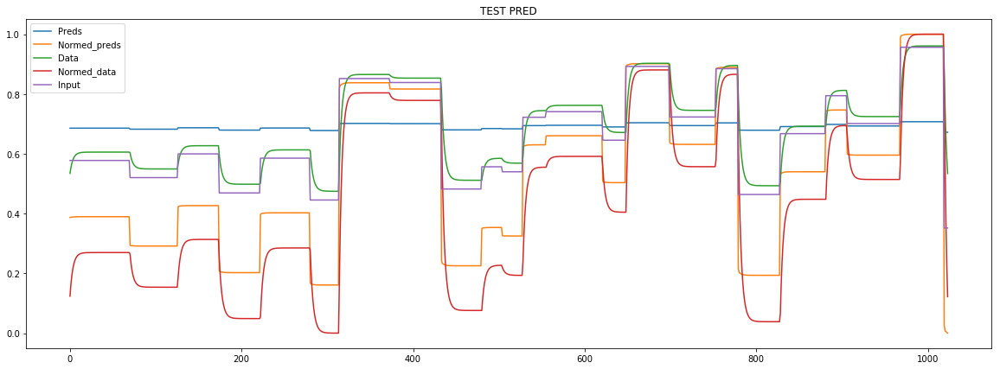

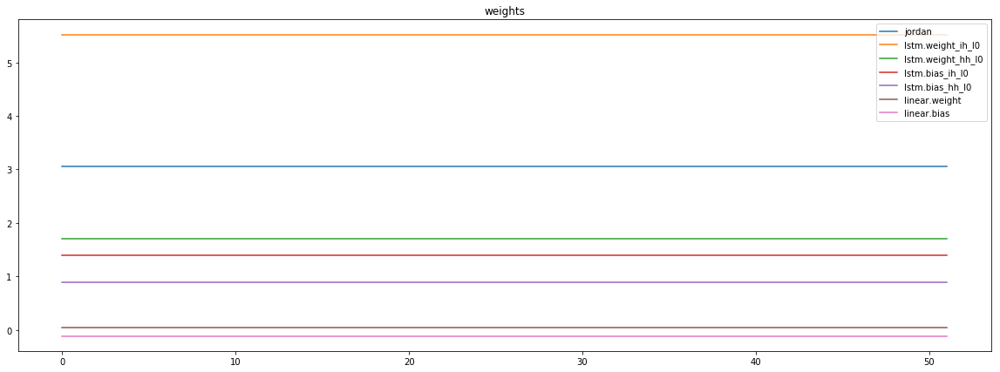

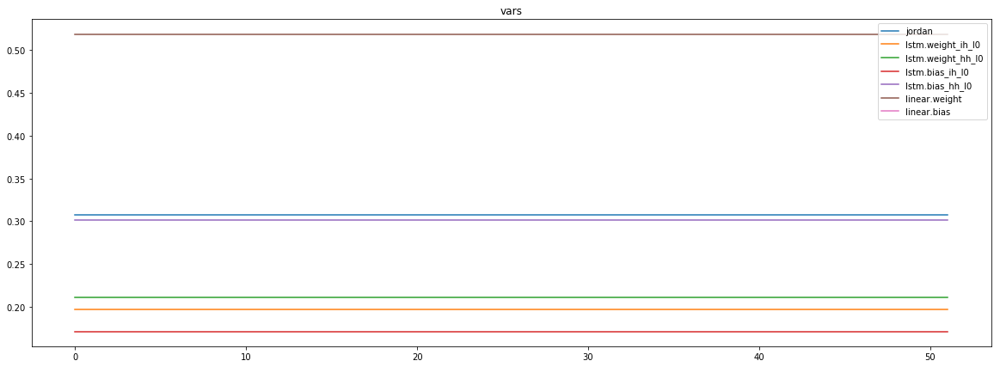

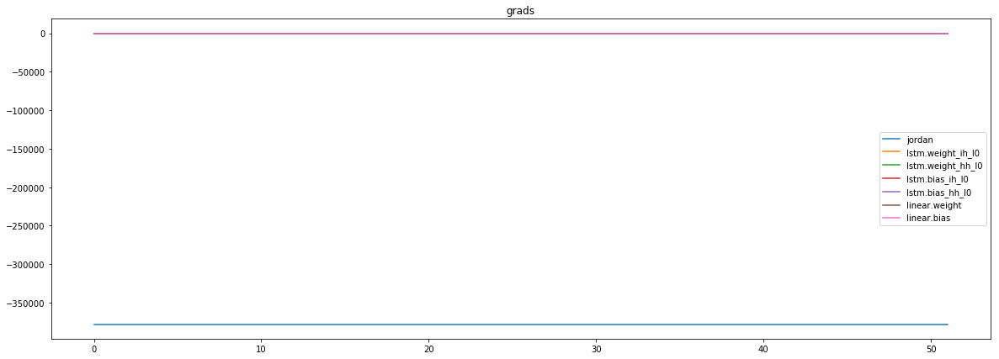

mean_p1 : -96114.421875
mean_p2 : -277362.03125
mean_p3 : -4347.99072265625


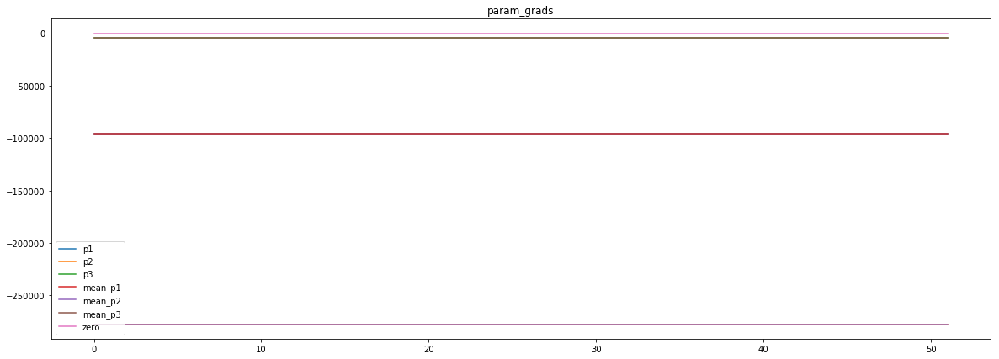

loss rate [0.6362706671333183]
Epoch [5] 
     train_loss[32618.39708533654] 
     eval_train[0.24636447366524059] 
     eval_test[0.24382170499037864]



aux preds: 0.4722760319709778           1.0828906297683716           1.8126165866851807
main loss 0.0
aux loss 0.0
jord loss 18378.559438852164
combined loss 18378.559438852164 



Parameter containing:
tensor([[0.4723, 1.0829, 1.8126]], requires_grad=True)


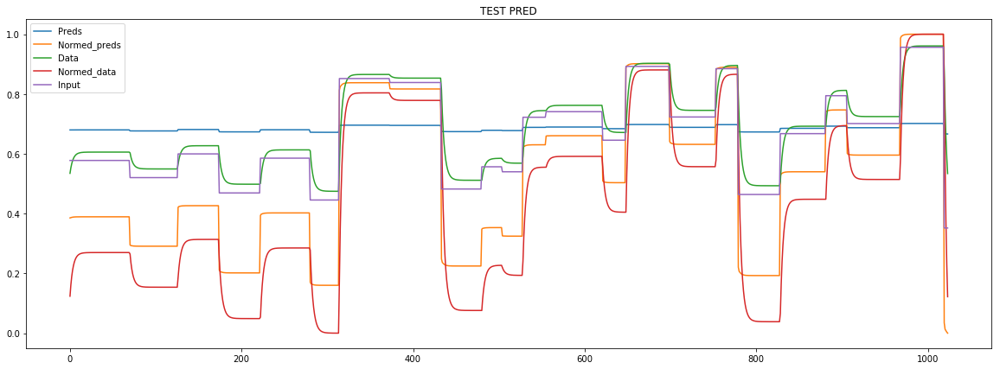

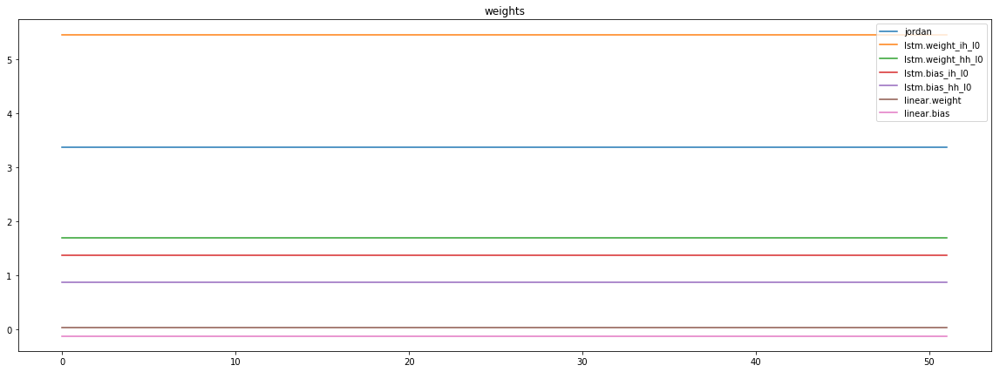

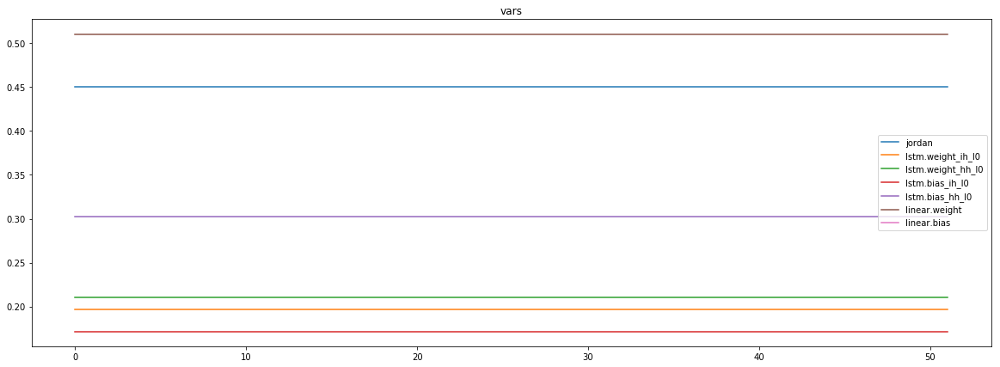

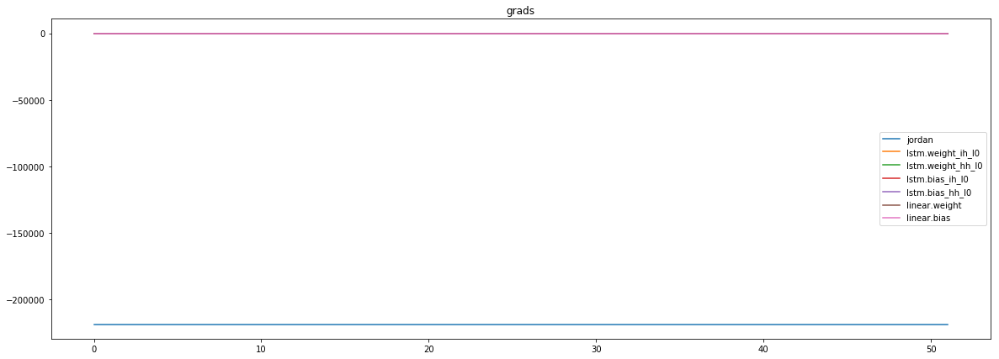

mean_p1 : 8783.5986328125
mean_p2 : -223776.390625
mean_p3 : -3708.349609375


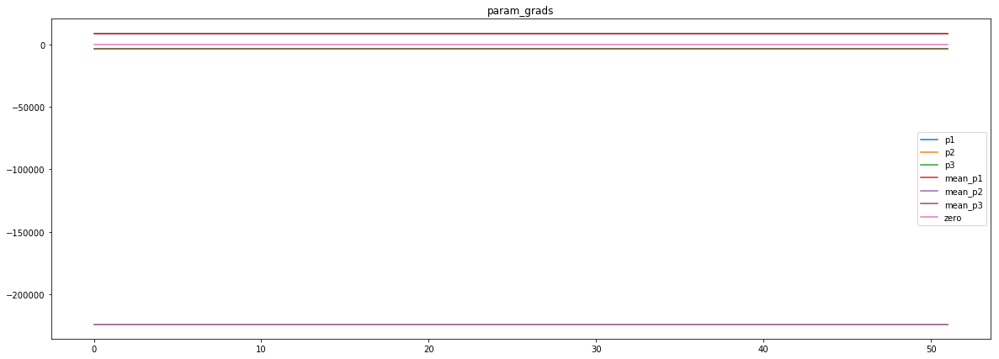

loss rate [0.4220621121906538]
Epoch [6] 
     train_loss[18378.559438852164] 
     eval_train[0.2276103503581208] 
     eval_test[0.22560509129967118]



aux preds: 0.47236424684524536           1.0819571018218994           2.0876376628875732
main loss 0.0
aux loss 0.0
jord loss 17873.397611177883
combined loss 17873.397611177883 



Parameter containing:
tensor([[0.4724, 1.0820, 2.0876]], requires_grad=True)


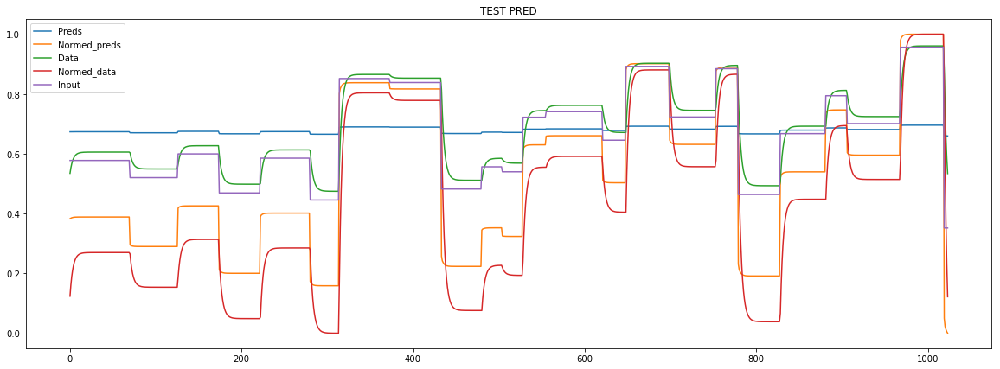

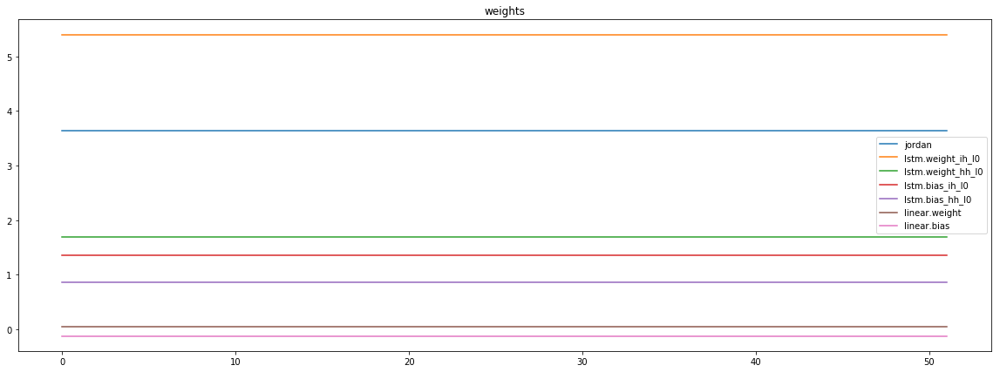

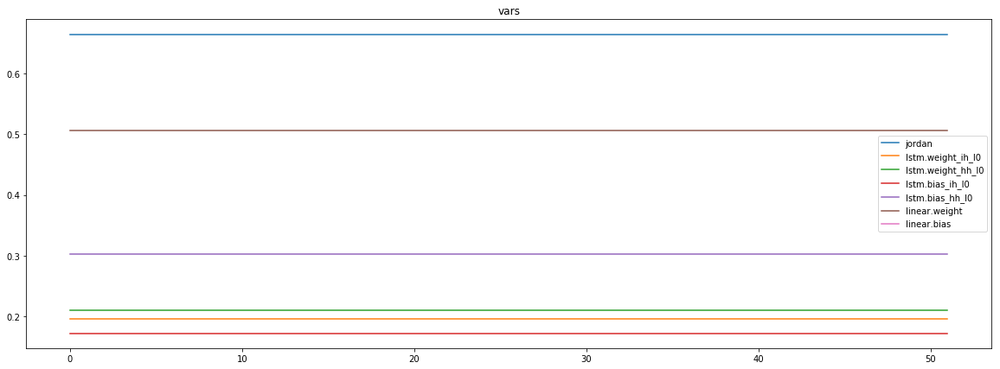

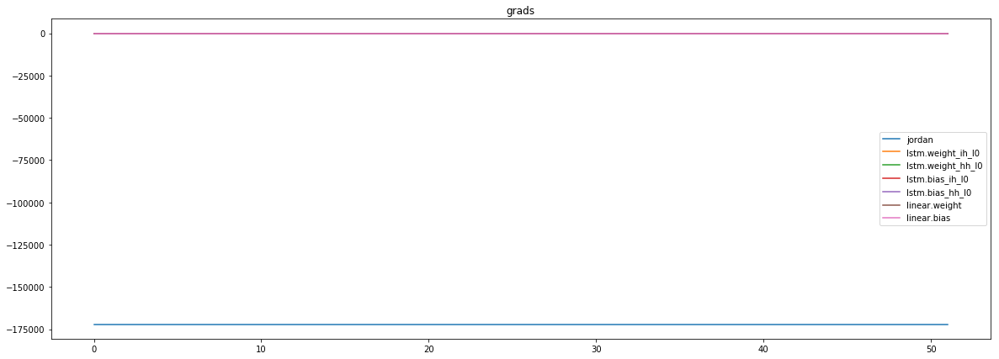

mean_p1 : 11289.205078125
mean_p2 : -180022.84375
mean_p3 : -3272.794921875


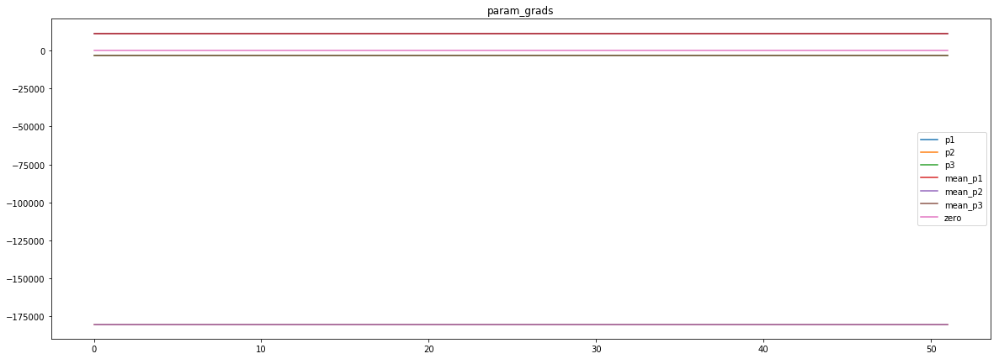

loss rate [0.19934426511378567]
Epoch [7] 
     train_loss[17873.397611177883] 
     eval_train[0.2266243147101844] 
     eval_test[0.2250824587297922]



aux preds: 0.4665916860103607           1.0777701139450073           2.3628058433532715
main loss 0.0
aux loss 0.0
jord loss 17485.461294320914
combined loss 17485.461294320914 



Parameter containing:
tensor([[0.4666, 1.0778, 2.3628]], requires_grad=True)


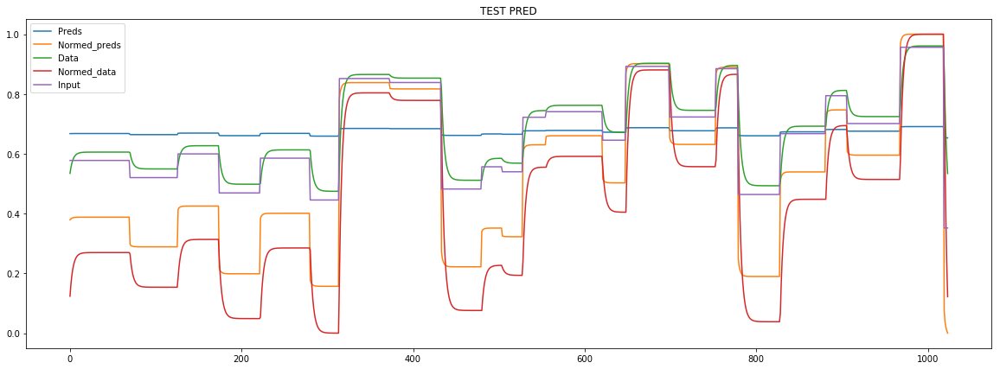

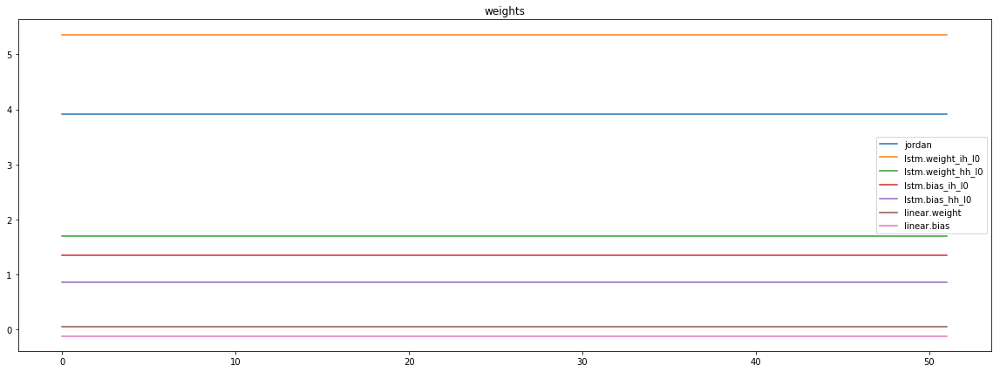

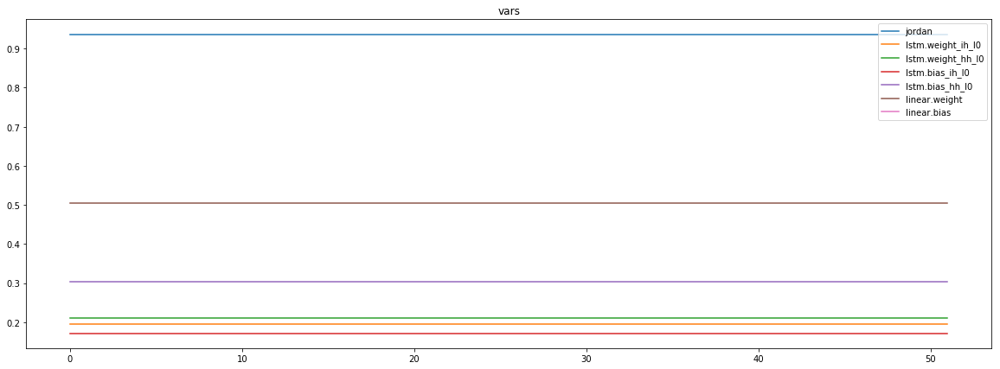

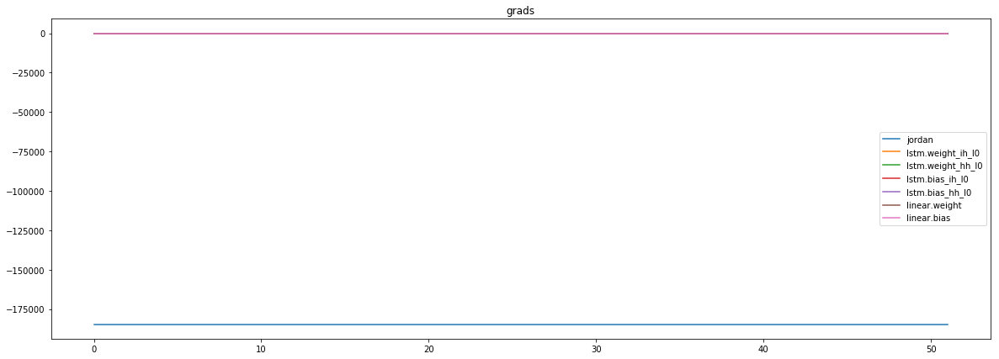

mean_p1 : 901.0164184570312
mean_p2 : -182168.03125
mean_p3 : -3320.252197265625


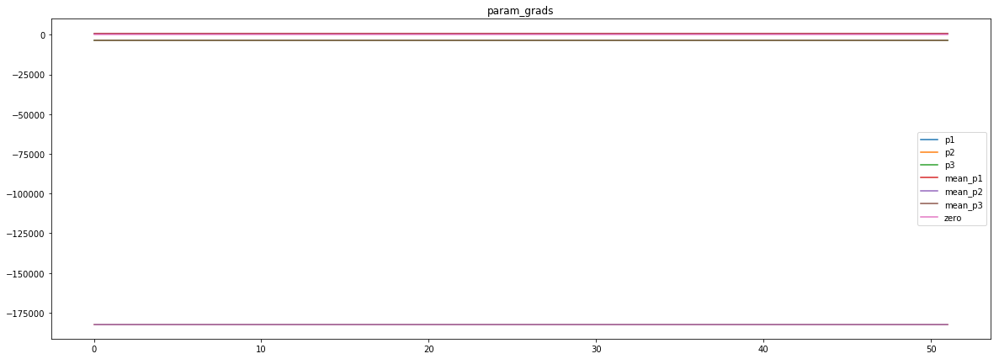

loss rate [0.021309028165232058]
Epoch [8] 
     train_loss[17485.461294320914] 
     eval_train[0.22761624631395816] 
     eval_test[0.22656997924786992]



aux preds: 0.4650440216064453           1.0749728679656982           2.645681858062744
main loss 0.0
aux loss 0.0
jord loss 17023.888803335336
combined loss 17023.888803335336 



Parameter containing:
tensor([[0.4650, 1.0750, 2.6457]], requires_grad=True)


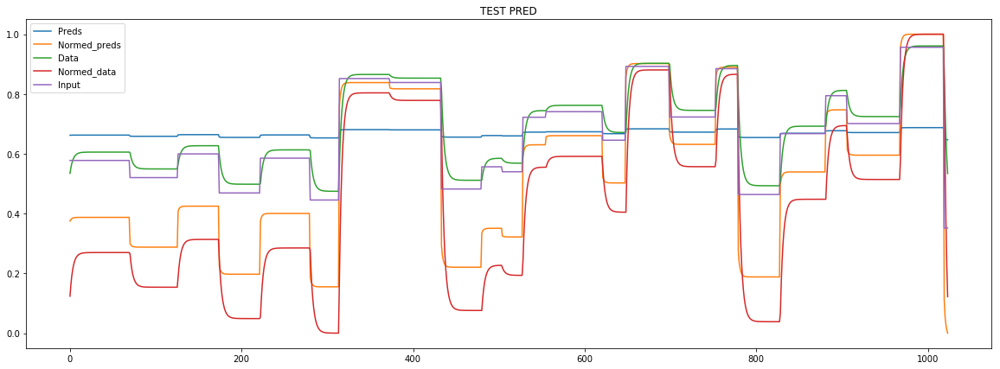

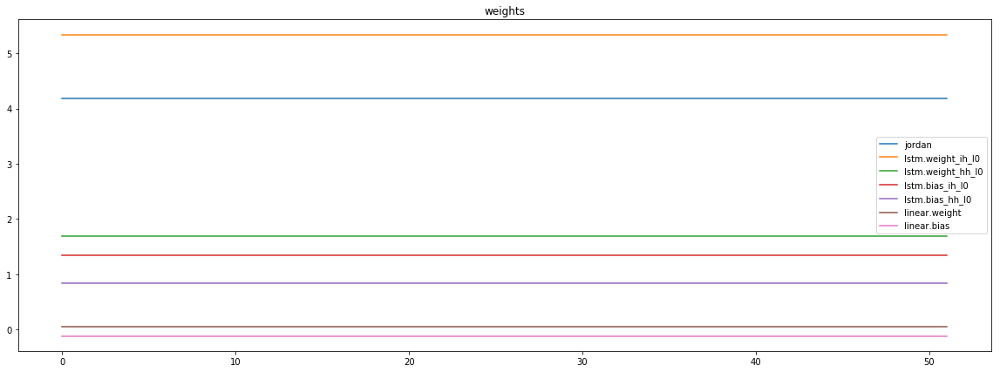

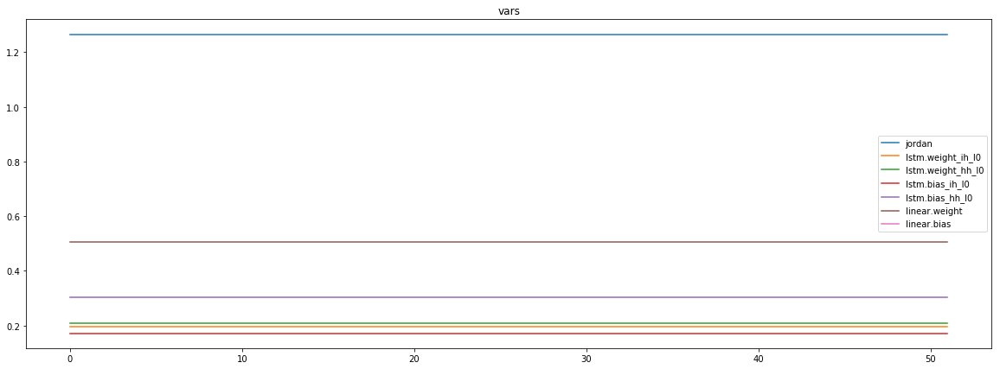

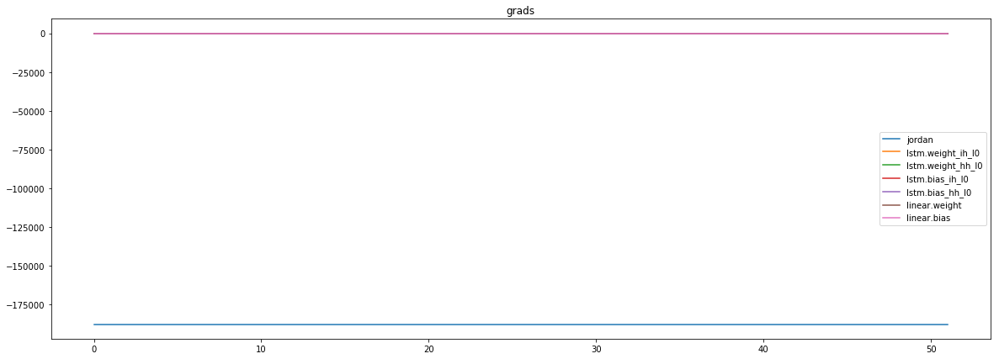

mean_p1 : -995.4758911132812
mean_p2 : -183560.796875
mean_p3 : -3345.482421875


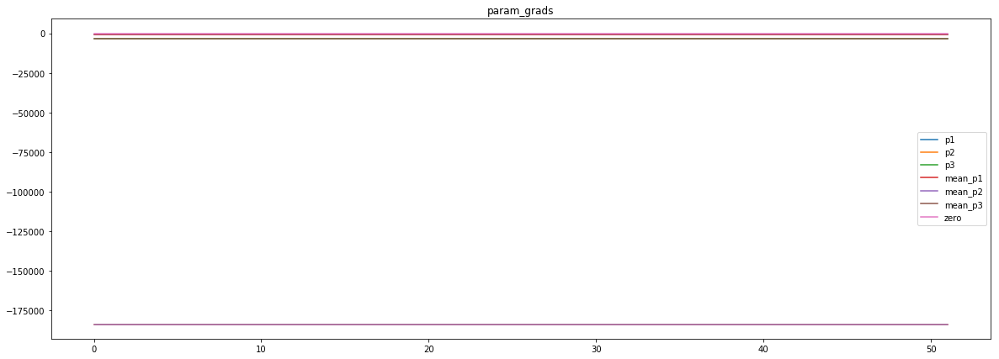

loss rate [-0.0013248524410005569]
Epoch [9] 
     train_loss[17023.888803335336] 
     eval_train[0.22680280304204925] 
     eval_test[0.22605159852272746]



aux preds: 0.4660484492778778           1.0719006061553955           2.9245989322662354
main loss 0.0
aux loss 0.0
jord loss 16594.81580528846
combined loss 16594.81580528846 



Parameter containing:
tensor([[0.4660, 1.0719, 2.9246]], requires_grad=True)


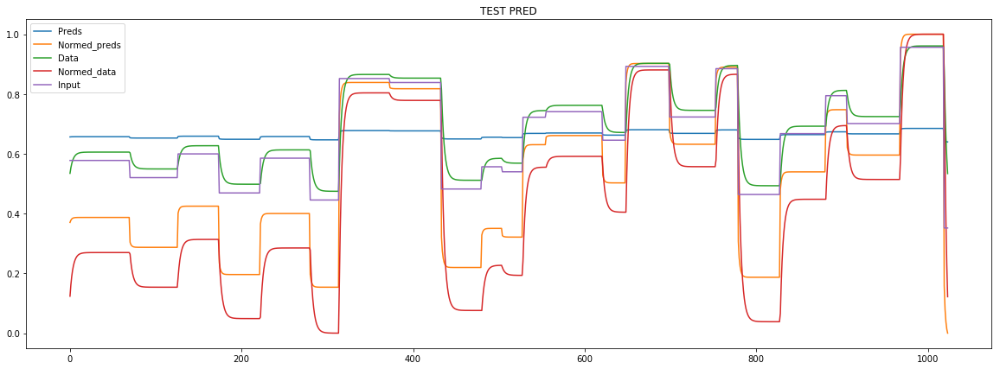

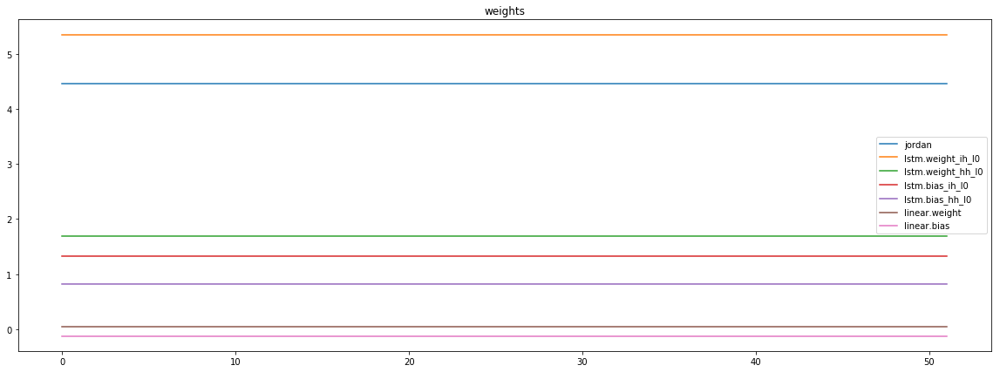

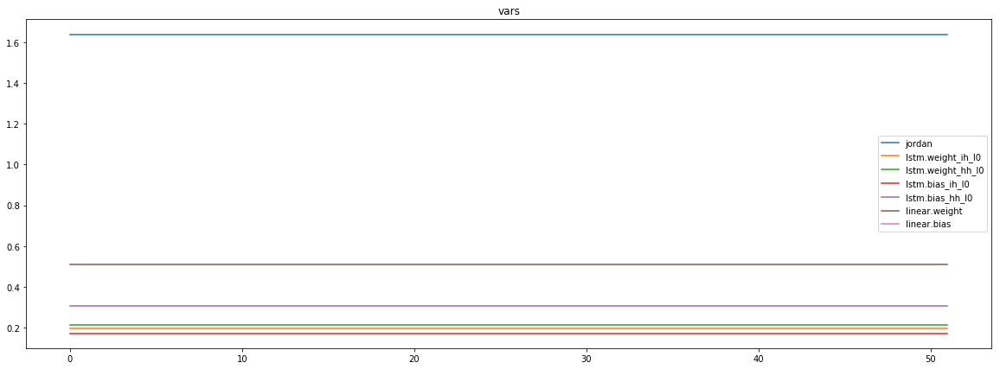

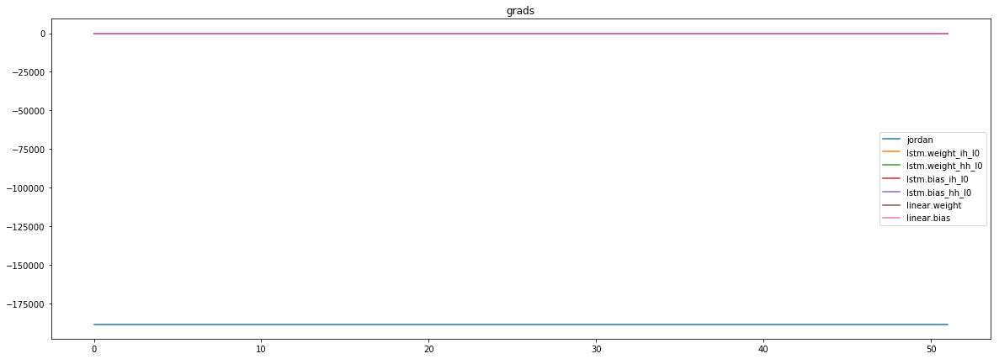

mean_p1 : 1283.927001953125
mean_p2 : -186295.828125
mean_p3 : -3370.799072265625


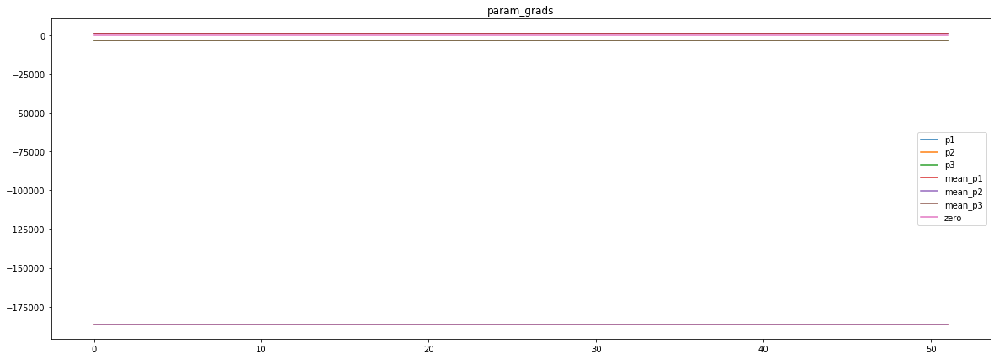

loss rate [0.008342897049917308]
Epoch [10] 
     train_loss[16594.81580528846] 
     eval_train[0.22441091588161025] 
     eval_test[0.22401667383118448]



aux preds: 0.4654509723186493           1.0699902772903442           3.201343059539795
main loss 0.0
aux loss 0.0
jord loss 16186.568340594951
combined loss 16186.568340594951 



Parameter containing:
tensor([[0.4655, 1.0700, 3.2013]], requires_grad=True)


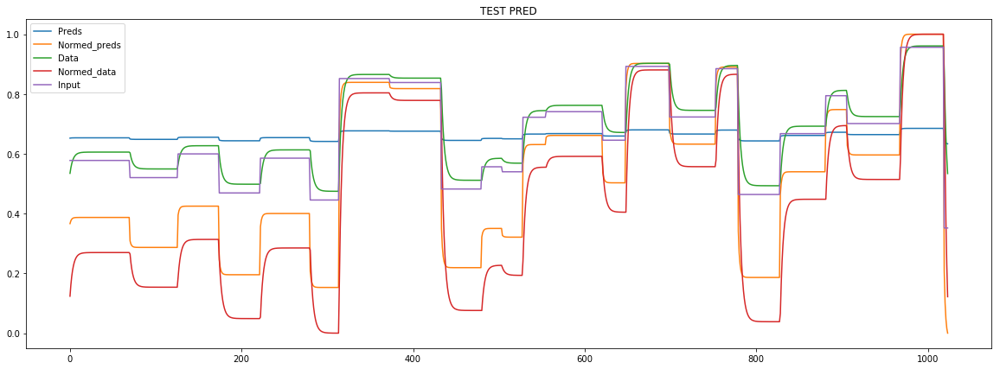

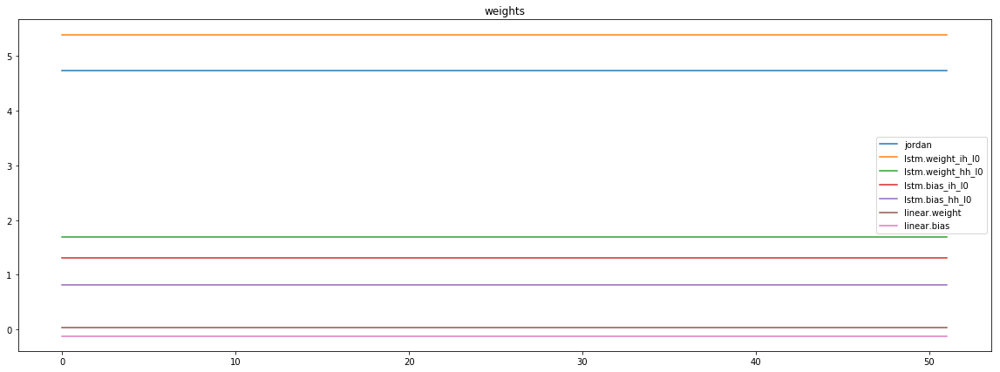

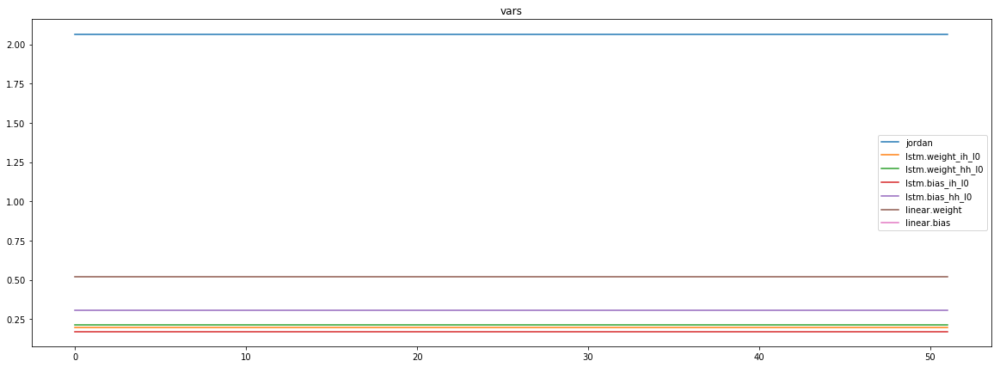

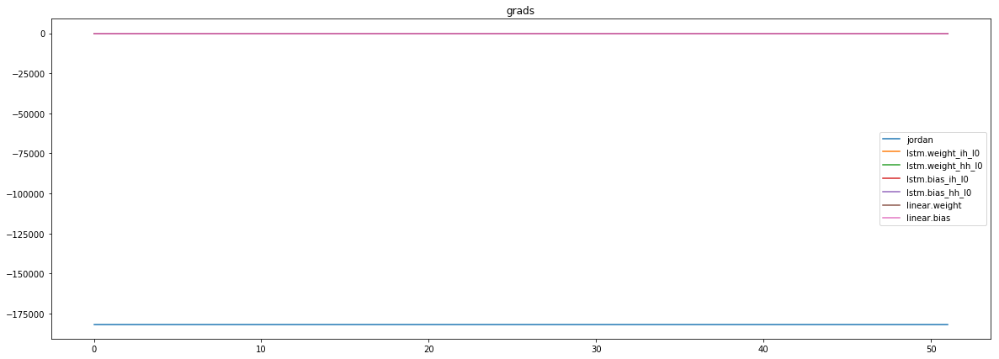

mean_p1 : -801.2886962890625
mean_p2 : -177466.84375
mean_p3 : -3293.334228515625


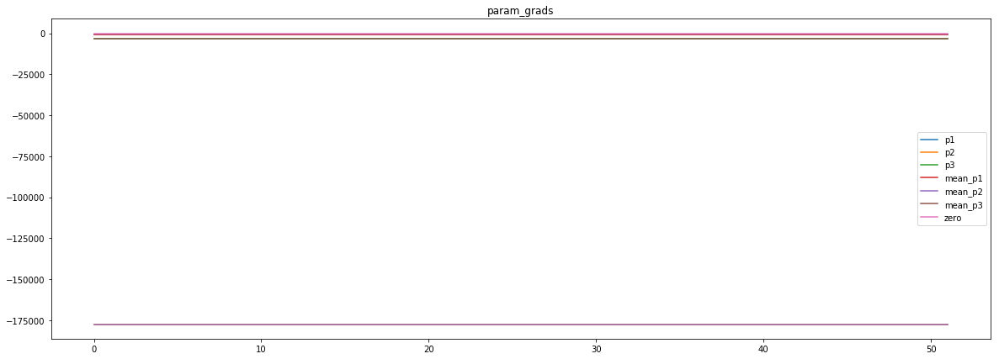

loss rate [0.016394847031687254]
Epoch [11] 
     train_loss[16186.568340594951] 
     eval_train[0.22206062029335255] 
     eval_test[0.2218482903236608]



aux preds: 0.46630024909973145           1.0680224895477295           3.4826149940490723
main loss 0.0
aux loss 0.0
jord loss 15714.69580078125
combined loss 15714.69580078125 



Parameter containing:
tensor([[0.4663, 1.0680, 3.4826]], requires_grad=True)


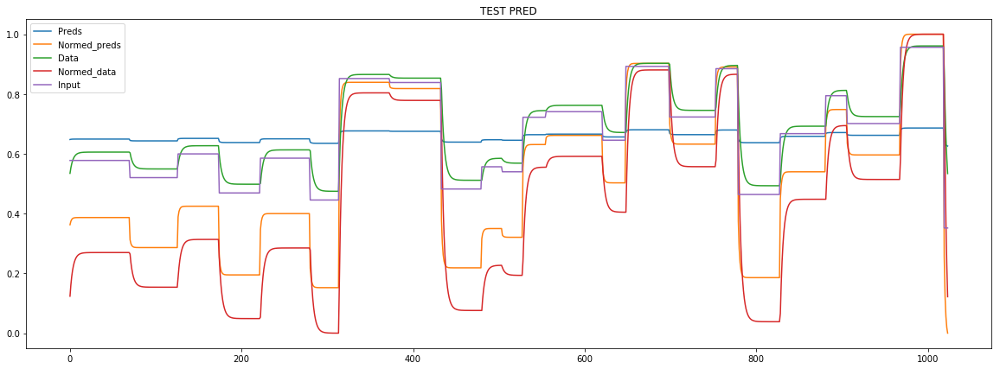

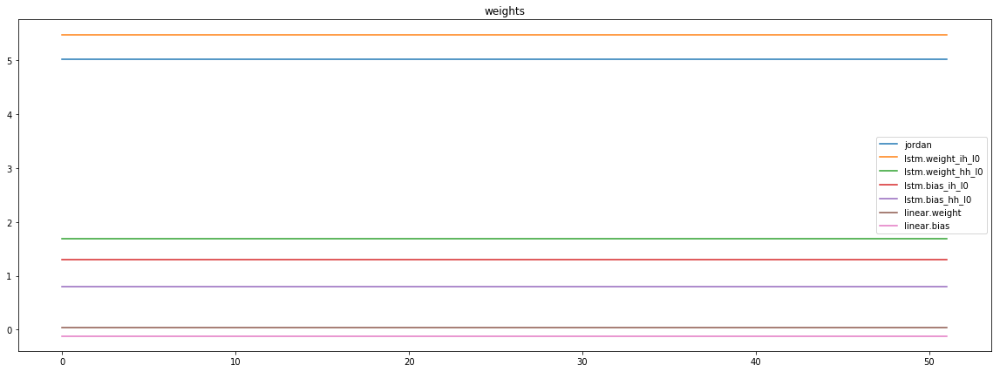

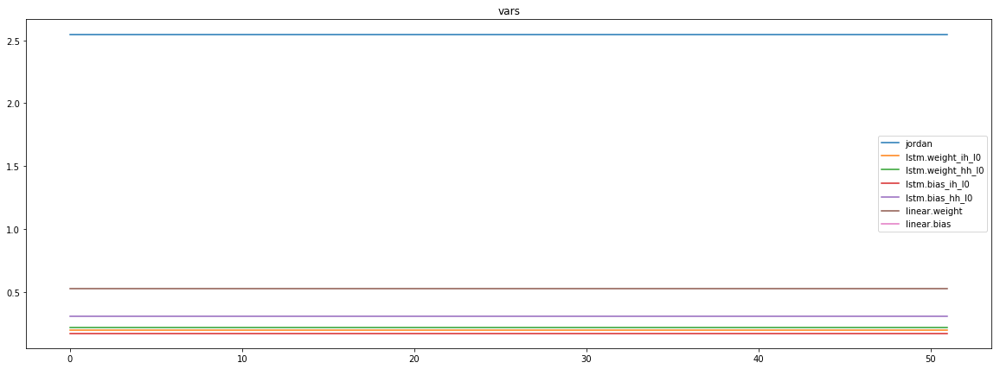

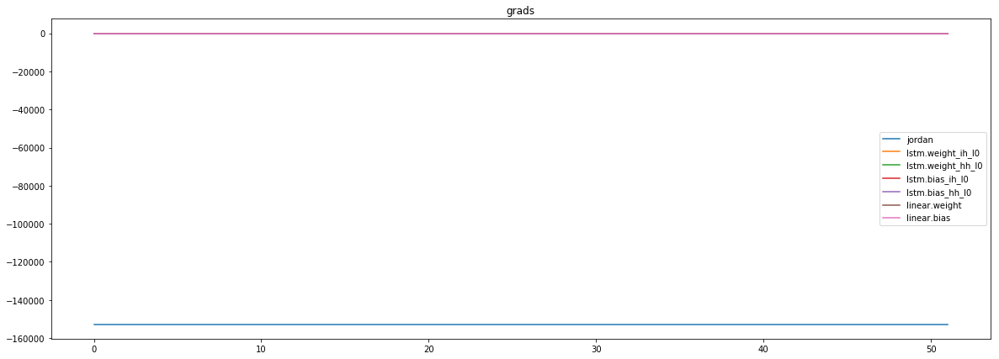

mean_p1 : 7160.32568359375
mean_p2 : -156790.25
mean_p3 : -3069.406005859375


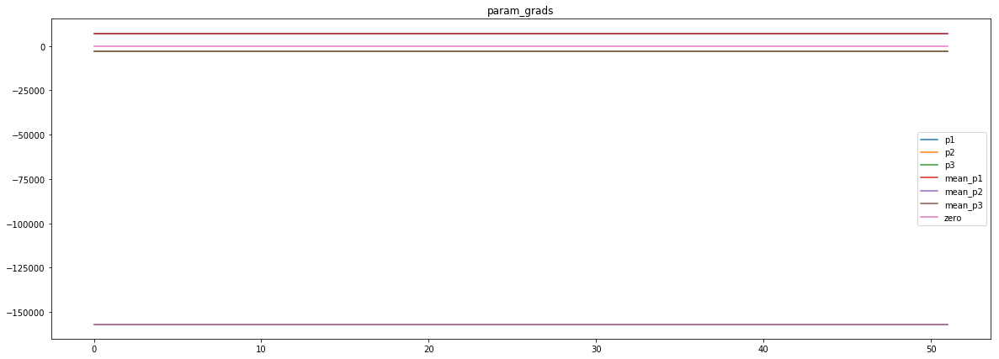

loss rate [0.025254847134832836]
Epoch [12] 
     train_loss[15714.69580078125] 
     eval_train[0.21833770957667956] 
     eval_test[0.21831580419992944]



aux preds: 0.4632317125797272           1.0647767782211304           3.7655019760131836
main loss 0.0
aux loss 0.0
jord loss 15226.65009014423
combined loss 15226.65009014423 



Parameter containing:
tensor([[0.4632, 1.0648, 3.7655]], requires_grad=True)


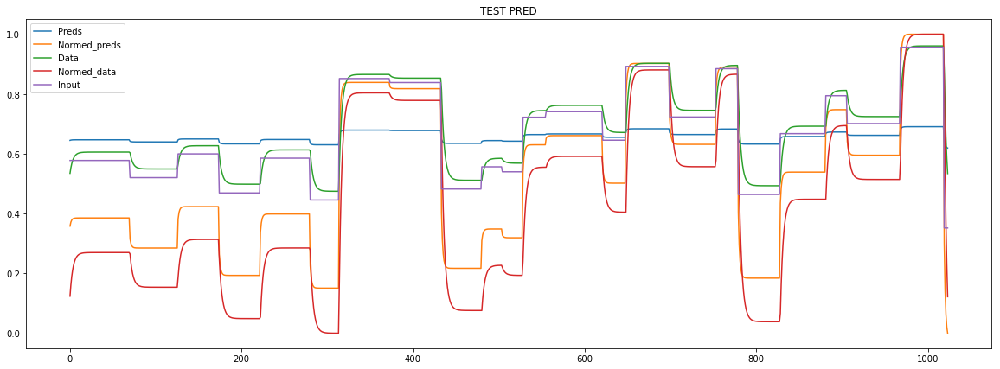

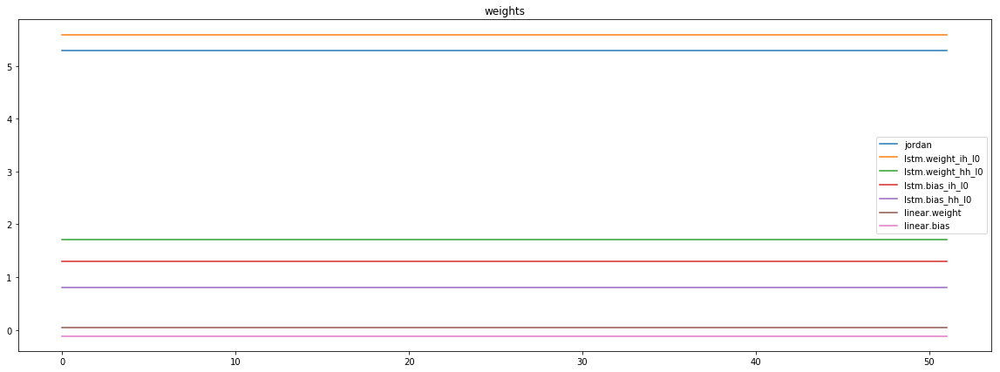

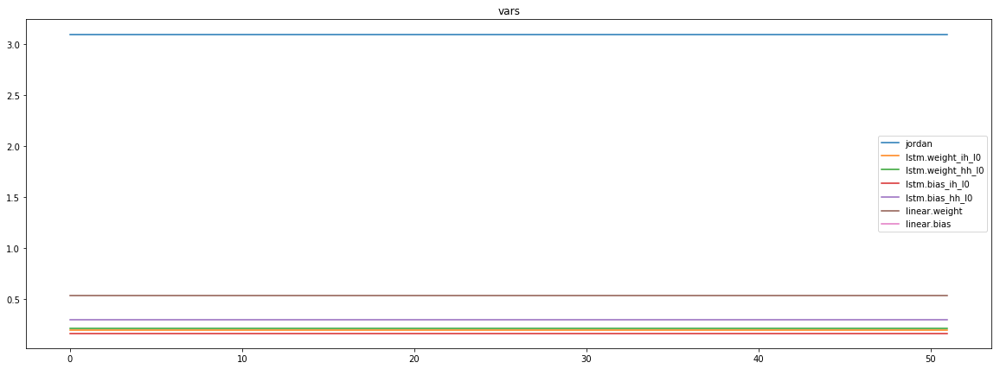

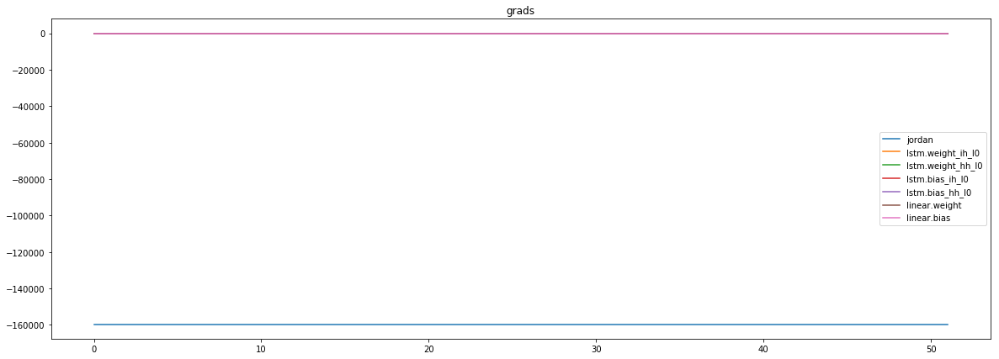

mean_p1 : 2865.970458984375
mean_p2 : -159326.703125
mean_p3 : -3112.490966796875


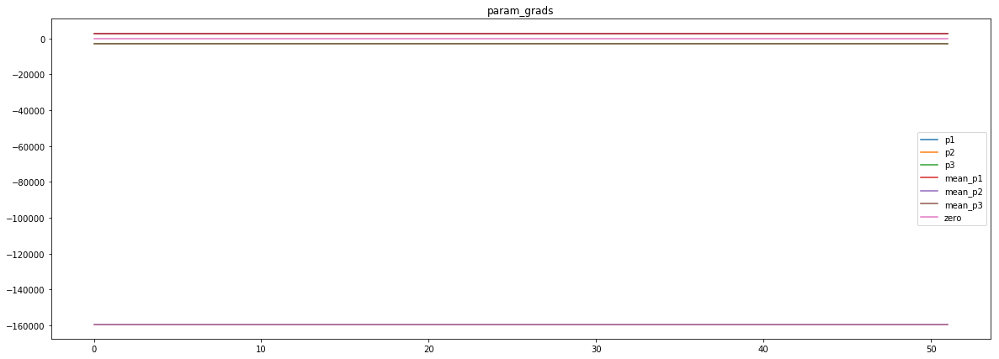

loss rate [0.028176161293237523]
Epoch [13] 
     train_loss[15226.65009014423] 
     eval_train[0.21507765972077883] 
     eval_test[0.21515556796591473]



aux preds: 0.46484997868537903           1.0604125261306763           4.055314064025879
main loss 0.0
aux loss 0.0
jord loss 14813.34979717548
combined loss 14813.34979717548 



Parameter containing:
tensor([[0.4648, 1.0604, 4.0553]], requires_grad=True)


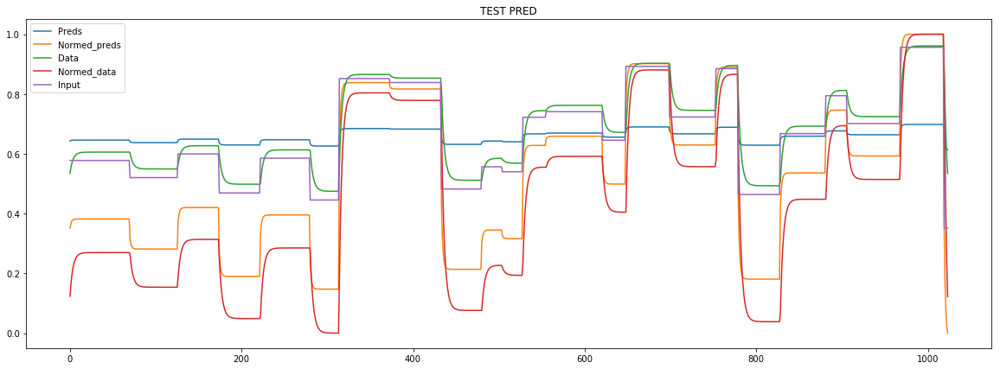

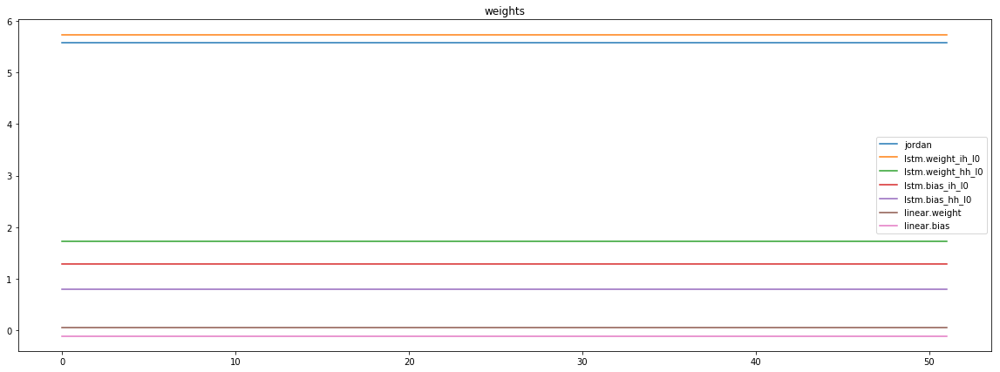

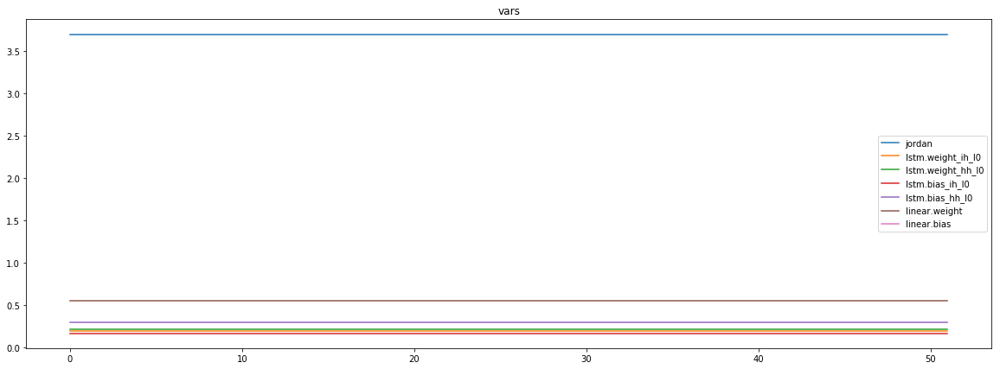

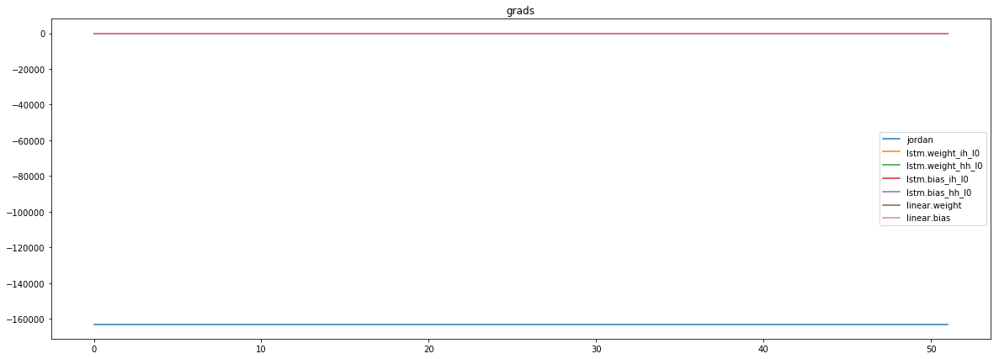

mean_p1 : 8409.16796875
mean_p2 : -168265.9375
mean_p3 : -3183.6064453125


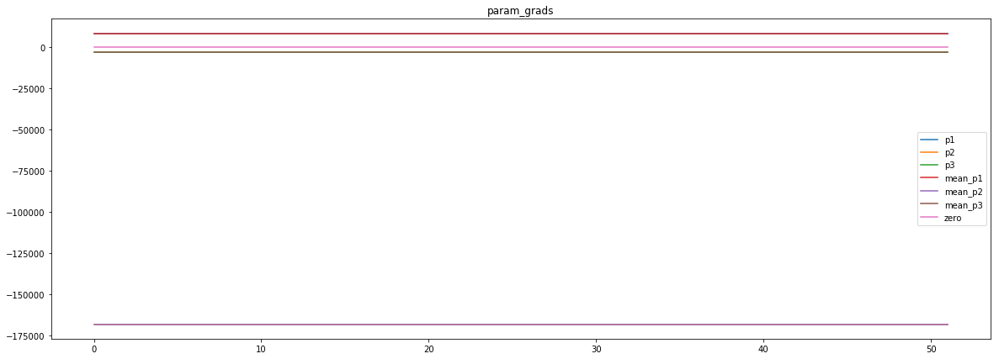

loss rate [0.04362468180768264]
Epoch [14] 
     train_loss[14813.34979717548] 
     eval_train[0.20876257934679207] 
     eval_test[0.2089105169103608]



aux preds: 0.46443116664886475           1.056657314300537           4.343417167663574
main loss 0.0
aux loss 0.0
jord loss 14351.11211688702
combined loss 14351.11211688702 



Parameter containing:
tensor([[0.4644, 1.0567, 4.3434]], requires_grad=True)


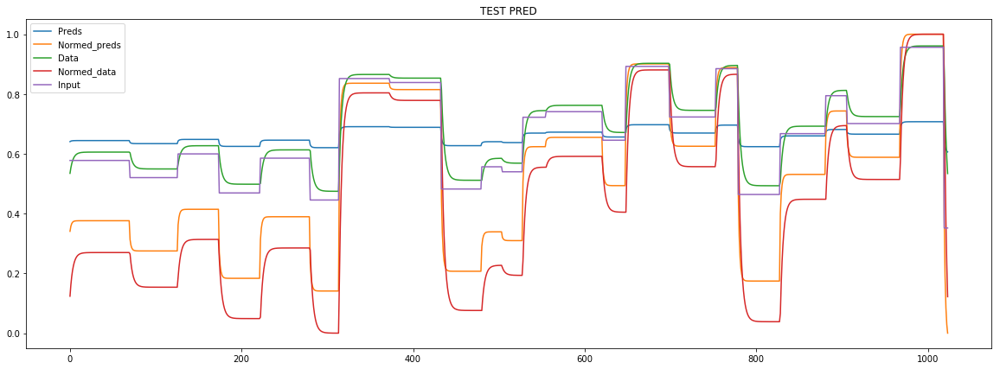

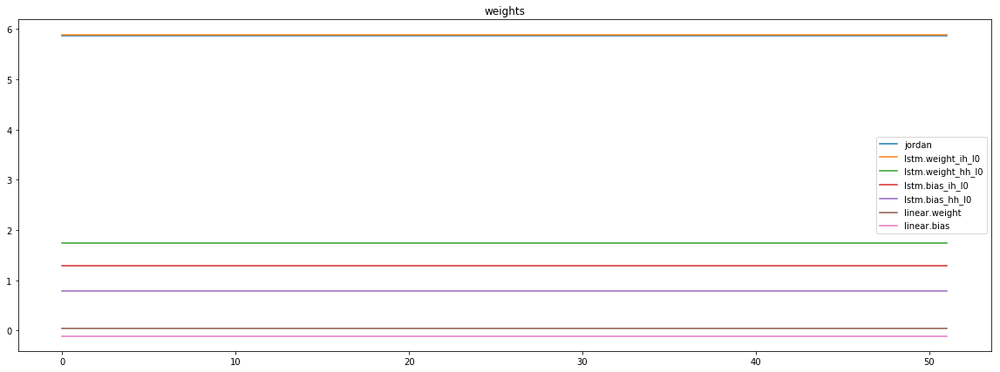

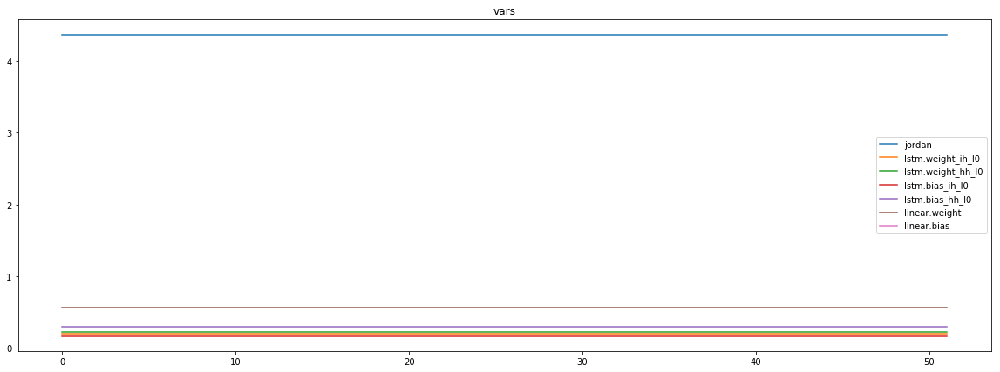

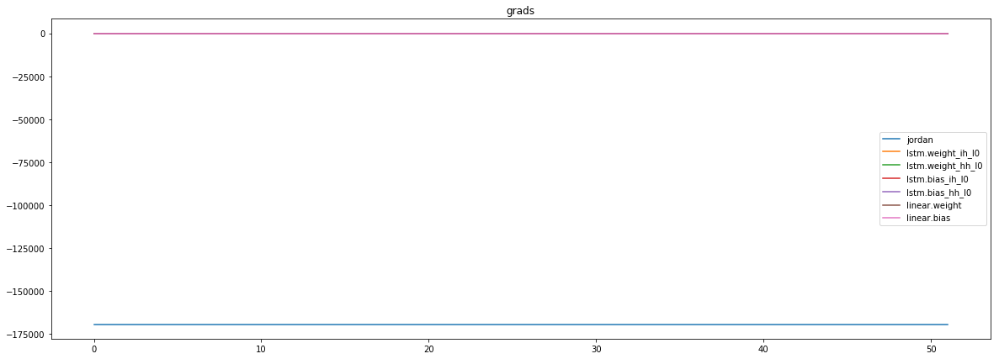

mean_p1 : 10595.8974609375
mean_p2 : -176738.0
mean_p3 : -3263.815673828125


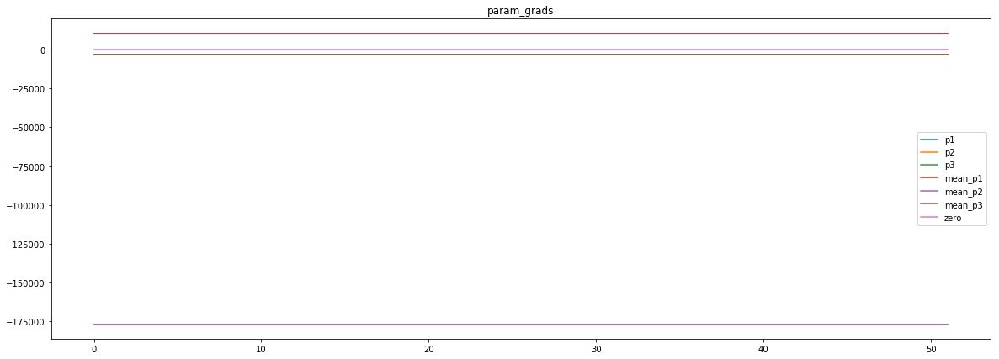

loss rate [0.0552420670125392]
Epoch [15] 
     train_loss[14351.11211688702] 
     eval_train[0.20210430367800514] 
     eval_test[0.2022984619040719]



aux preds: 0.46225905418395996           1.053370475769043           4.6287078857421875
main loss 0.0
aux loss 0.0
jord loss 13877.039494441105
combined loss 13877.039494441105 



Parameter containing:
tensor([[0.4623, 1.0534, 4.6287]], requires_grad=True)


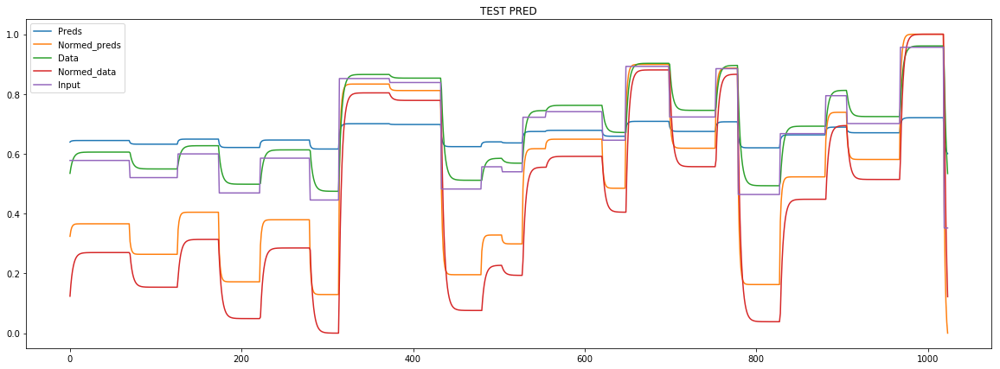

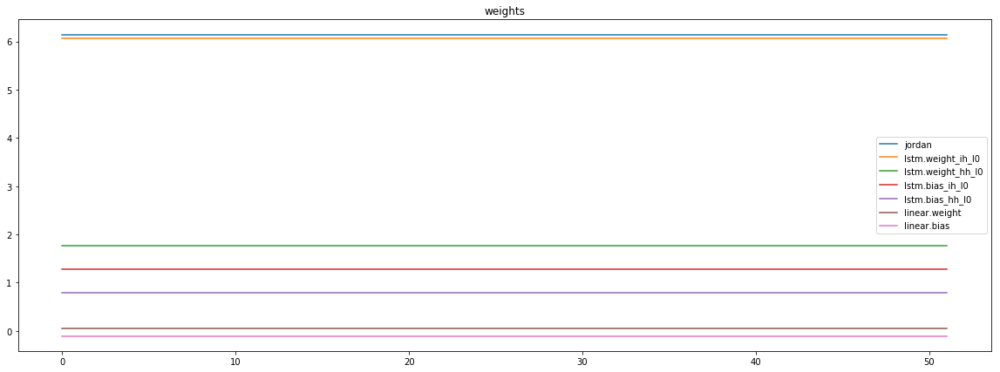

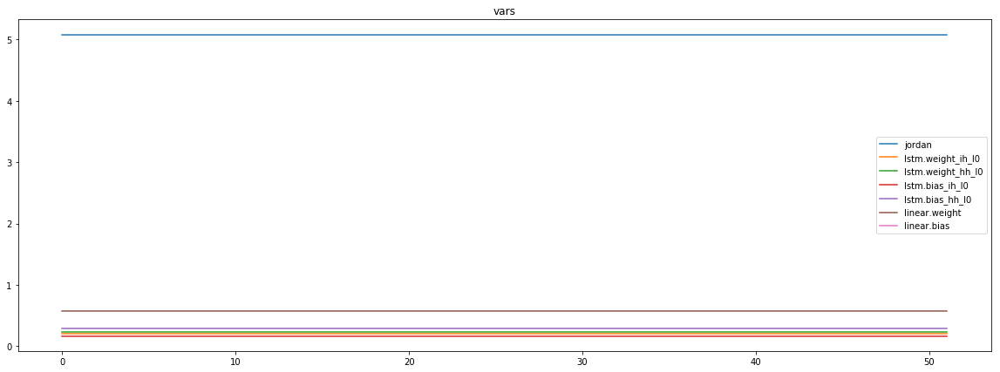

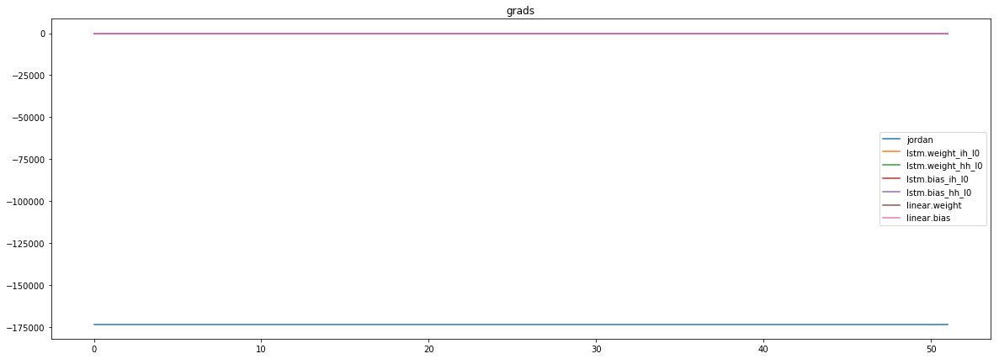

mean_p1 : 9284.556640625
mean_p2 : -179322.171875
mean_p3 : -3301.25537109375


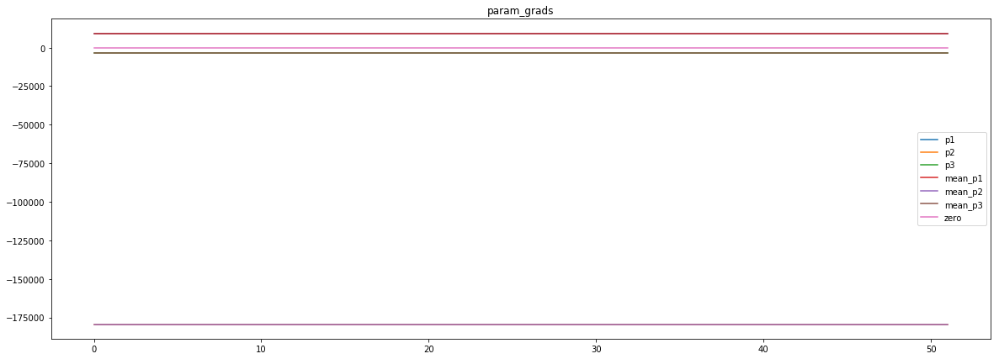

loss rate [0.0687268565368716]
Epoch [16] 
     train_loss[13877.039494441105] 
     eval_train[0.19434540308094048] 
     eval_test[0.1944388268113306]



aux preds: 0.4622911810874939           1.0499006509780884           4.9015583992004395
main loss 0.0
aux loss 0.0
jord loss 13493.43594125601
combined loss 13493.43594125601 



Parameter containing:
tensor([[0.4623, 1.0499, 4.9016]], requires_grad=True)


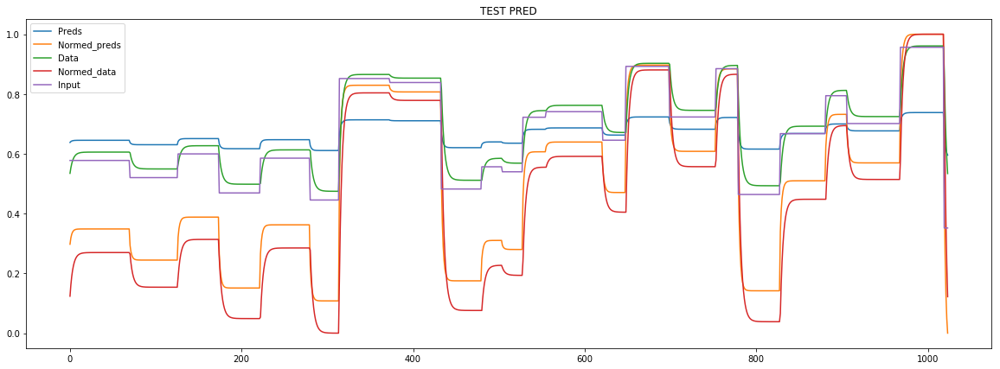

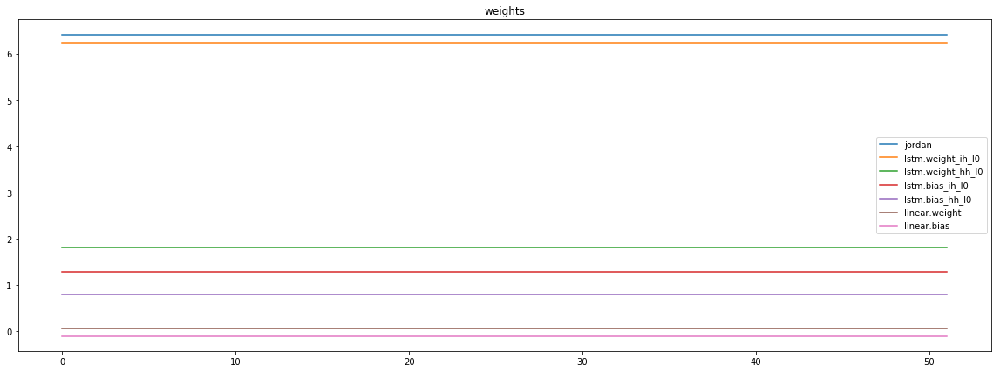

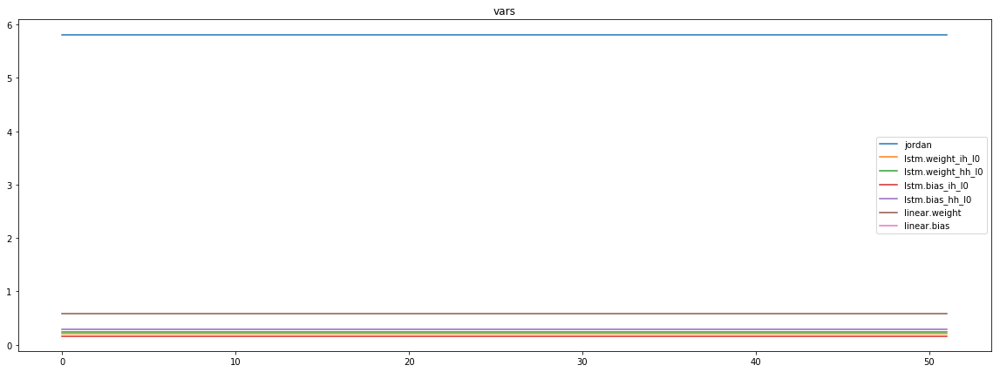

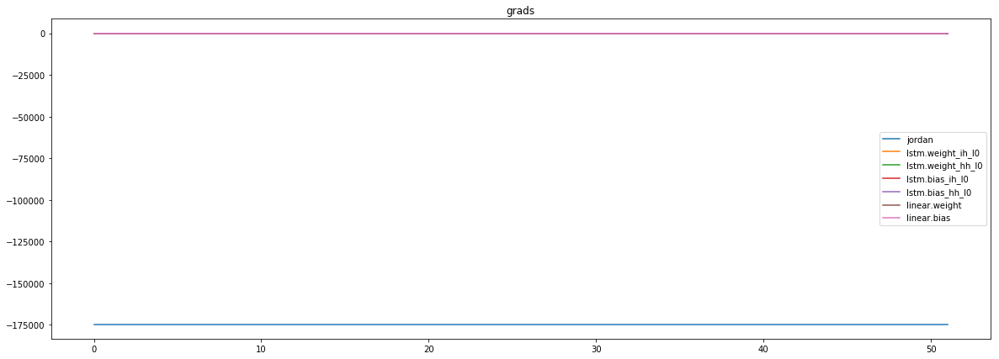

mean_p1 : 12704.67578125
mean_p2 : -183880.640625
mean_p3 : -3337.004150390625


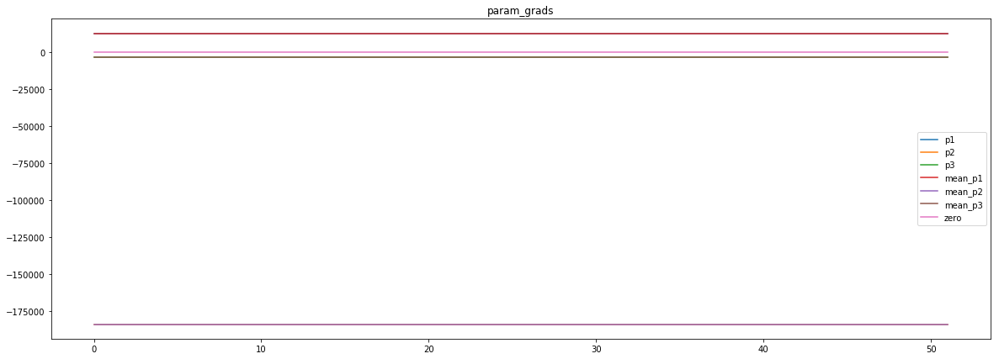

loss rate [0.09023030908638341]
Epoch [17] 
     train_loss[13493.43594125601] 
     eval_train[0.1837501378982919] 
     eval_test[0.18366667230888695]



aux preds: 0.4585222601890564           1.0484057664871216           5.183529376983643
main loss 0.0
aux loss 0.0
jord loss 13002.290602463941
combined loss 13002.290602463941 



Parameter containing:
tensor([[0.4585, 1.0484, 5.1835]], requires_grad=True)


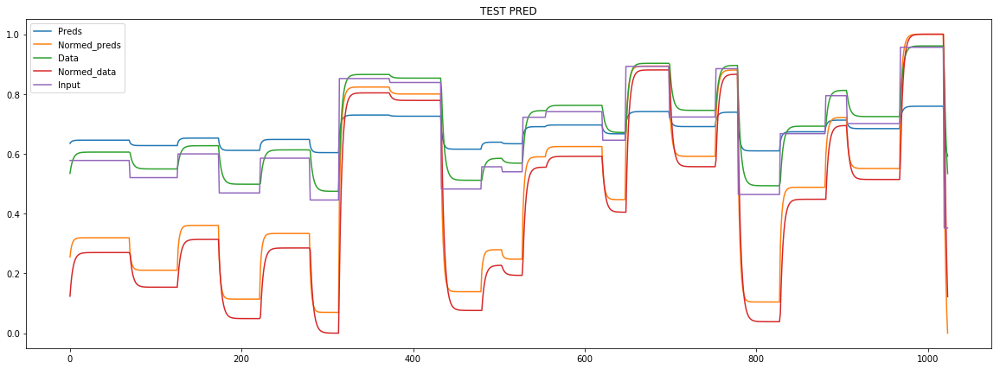

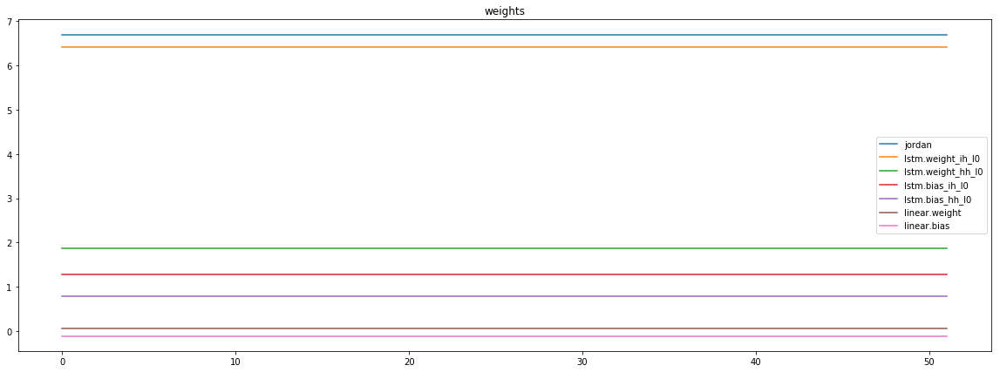

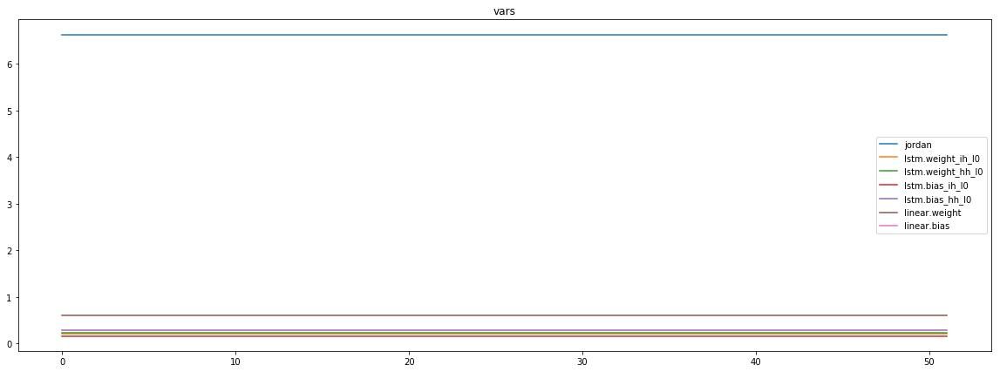

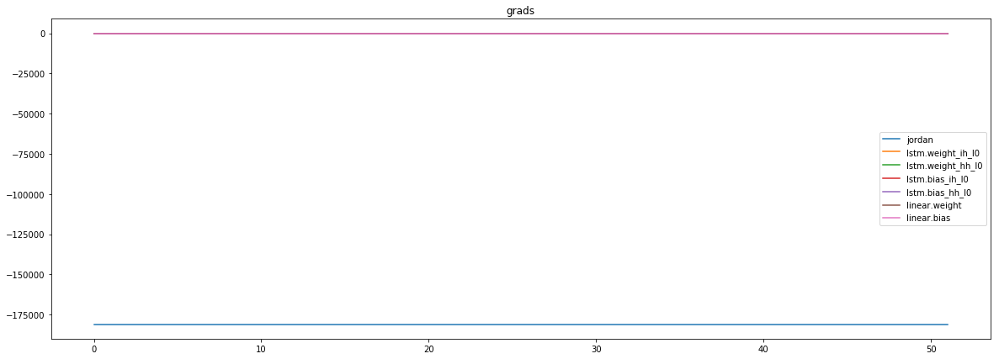

mean_p1 : 10574.44140625
mean_p2 : -188127.703125
mean_p3 : -3394.902587890625


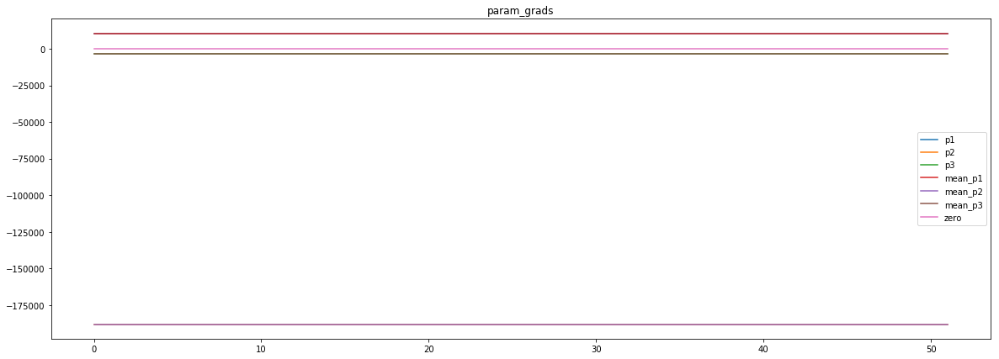

loss rate [0.11598575199737149]
Epoch [18] 
     train_loss[13002.290602463941] 
     eval_train[0.1715373160483208] 
     eval_test[0.17102845704754474]



aux preds: 0.4575112462043762           1.044050931930542           5.478847026824951
main loss 0.0
aux loss 0.0
jord loss 12543.54325045072
combined loss 12543.54325045072 



Parameter containing:
tensor([[0.4575, 1.0441, 5.4788]], requires_grad=True)


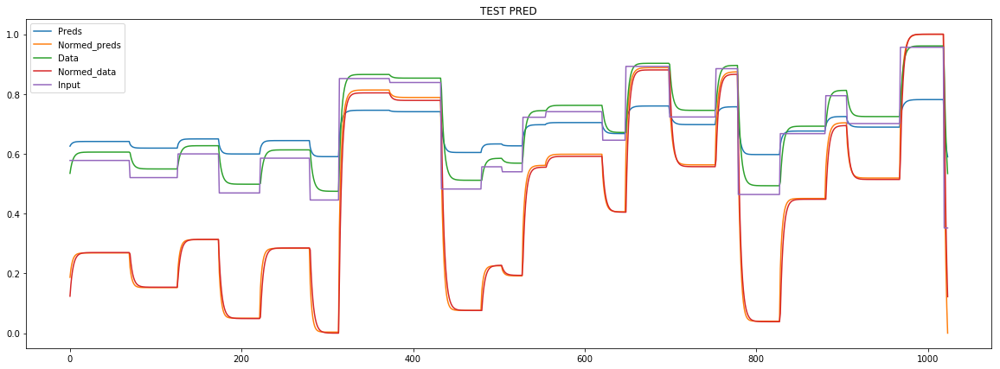

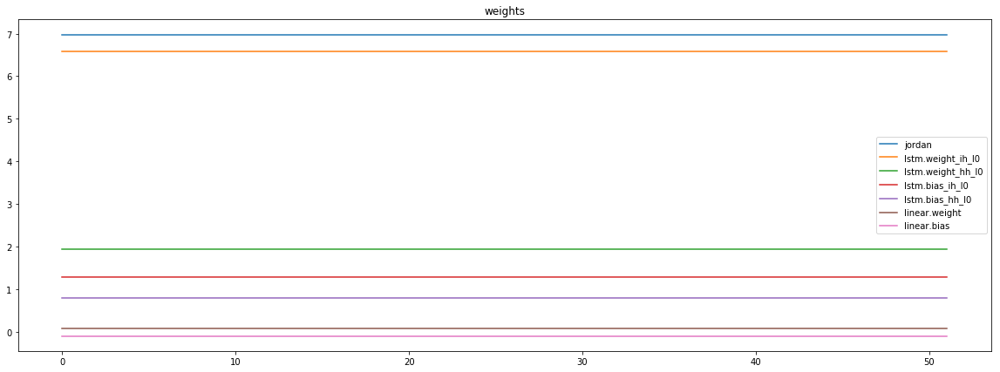

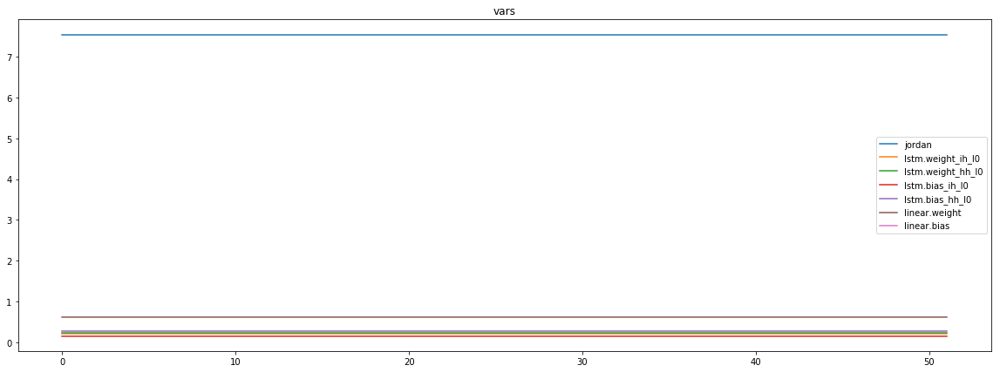

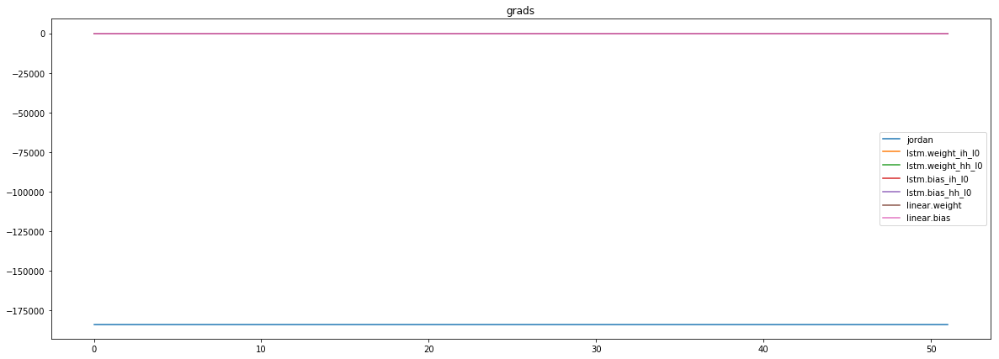

mean_p1 : 12424.2626953125
mean_p2 : -192798.78125
mean_p3 : -3441.465576171875


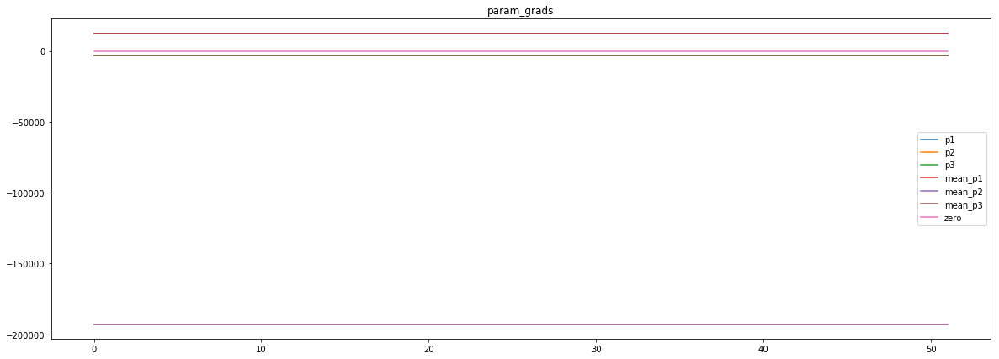

loss rate [0.15457745480652263]
Epoch [19] 
     train_loss[12543.54325045072] 
     eval_train[0.15521326392627088] 
     eval_test[0.154750075625171]



aux preds: 0.45491597056388855           1.0426404476165771           5.749050140380859
main loss 0.0
aux loss 0.0
jord loss 12170.082575871395
combined loss 12170.082575871395 



Parameter containing:
tensor([[0.4549, 1.0426, 5.7491]], requires_grad=True)


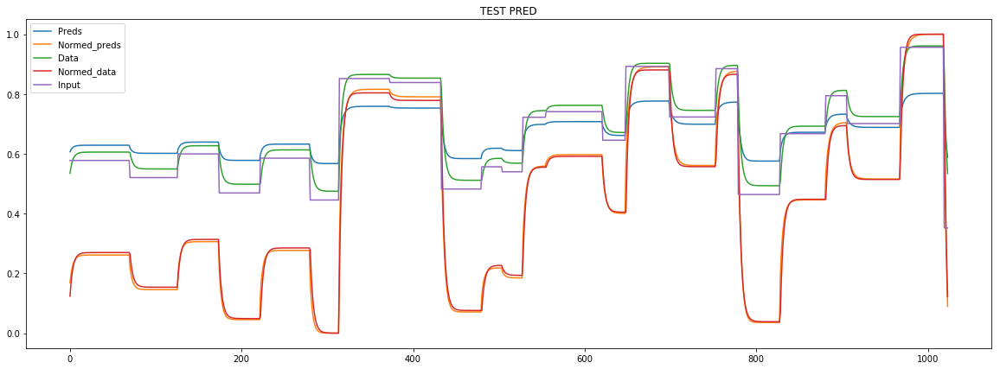

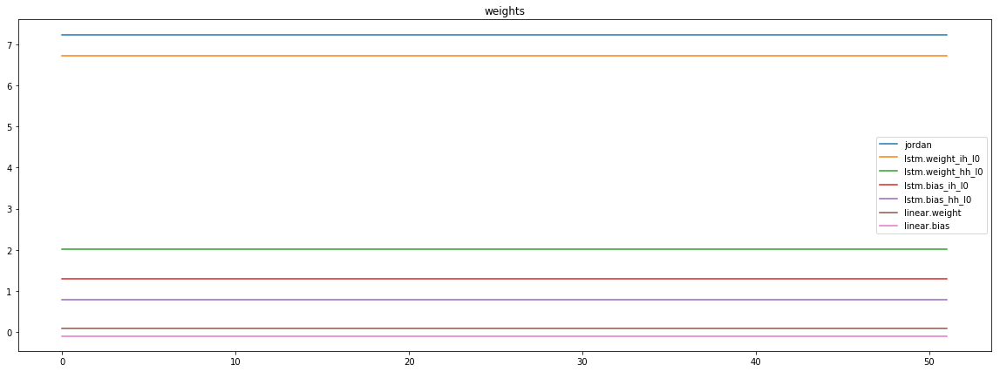

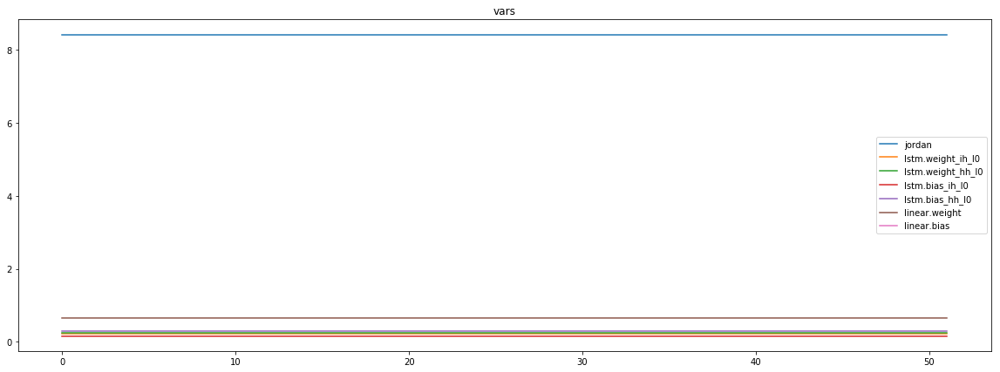

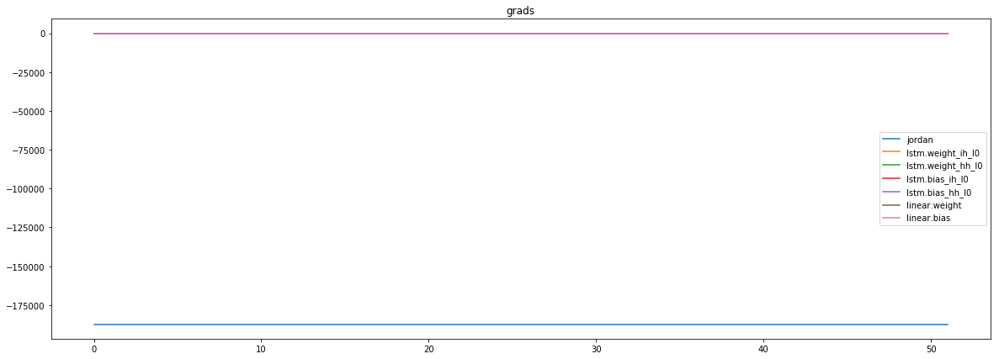

mean_p1 : 9966.2783203125
mean_p2 : -193766.125
mean_p3 : -3469.615966796875


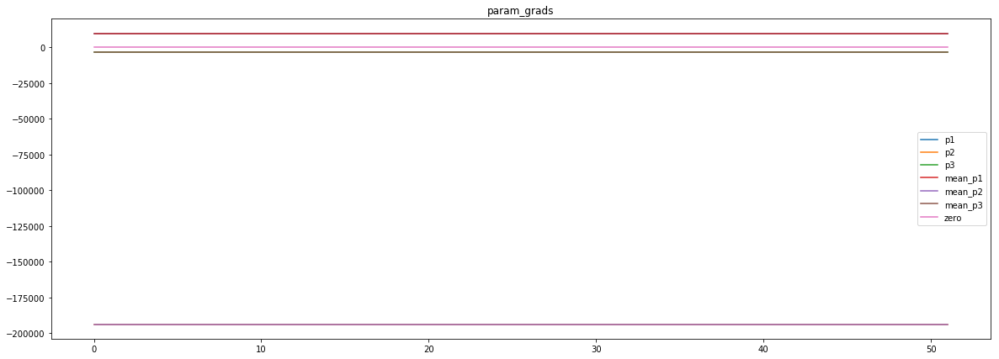

loss rate [0.19965292529776058]
Epoch [20] 
     train_loss[12170.082575871395] 
     eval_train[0.13616400580548754] 
     eval_test[0.13591099317603617]



aux preds: 0.4546394646167755           1.0392382144927979           6.023172378540039
main loss 0.0
aux loss 0.0
jord loss 11740.60135591947
combined loss 11740.60135591947 



Parameter containing:
tensor([[0.4546, 1.0392, 6.0232]], requires_grad=True)


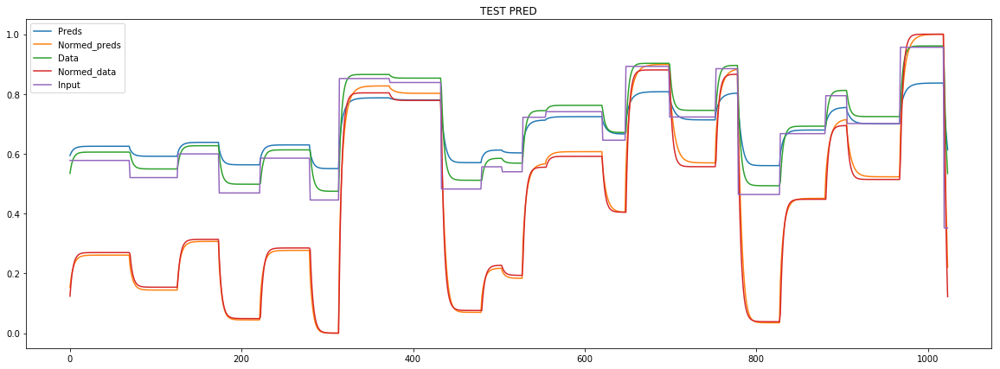

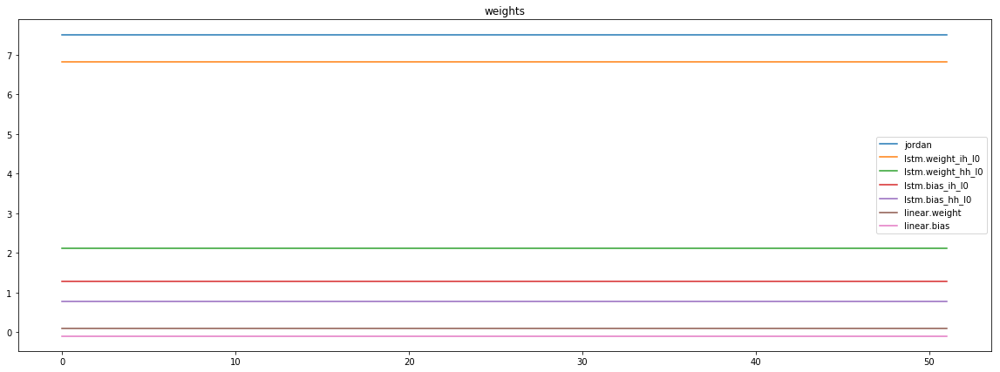

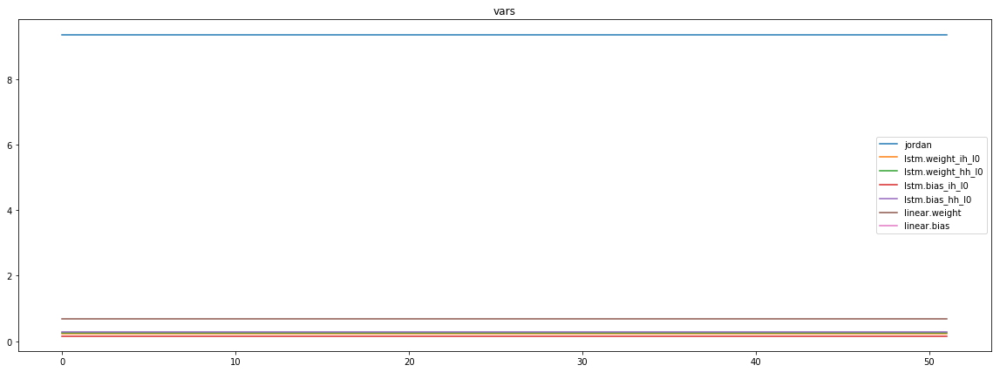

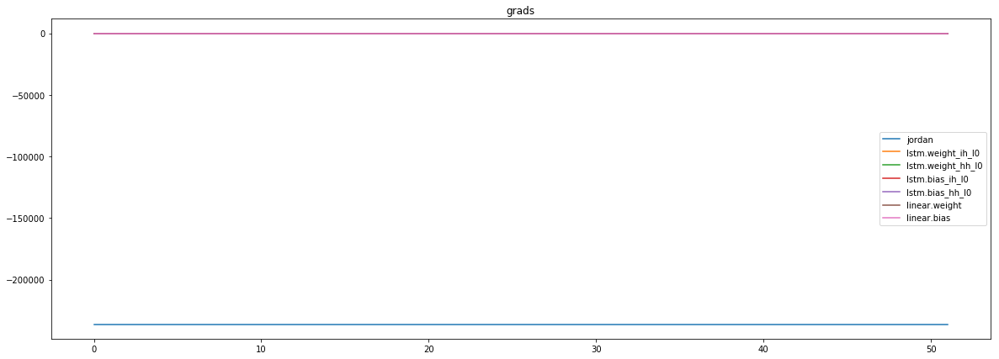

mean_p1 : 11626.580078125
mean_p2 : -243852.5
mean_p3 : -3957.0390625


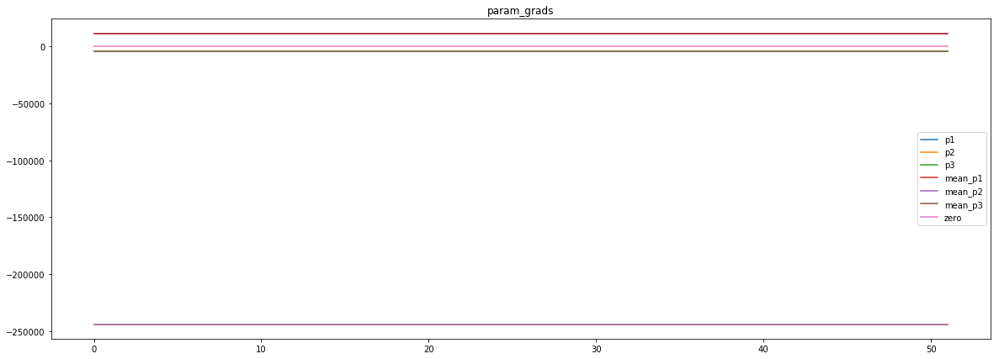

loss rate [0.2737474298510284]
Epoch [21] 
     train_loss[11740.60135591947] 
     eval_train[0.11228916433006256] 
     eval_test[0.11176773491950537]



aux preds: 0.45423710346221924           1.0347580909729004           6.291789531707764
main loss 0.0
aux loss 0.0
jord loss 11342.367131159855
combined loss 11342.367131159855 



Parameter containing:
tensor([[0.4542, 1.0348, 6.2918]], requires_grad=True)


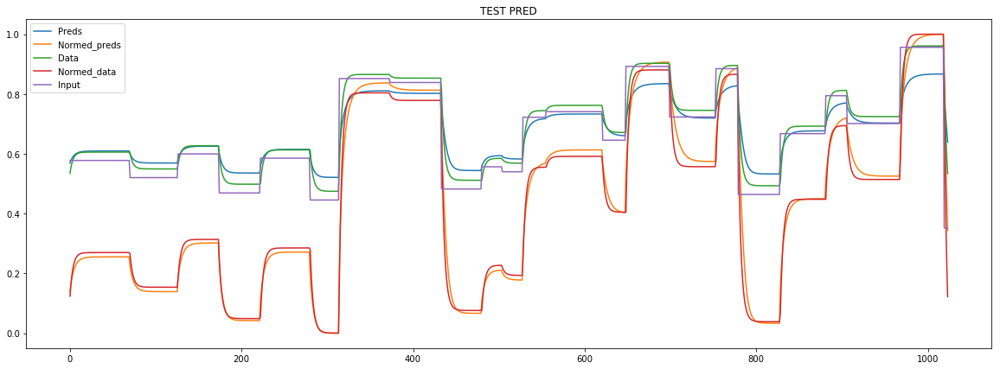

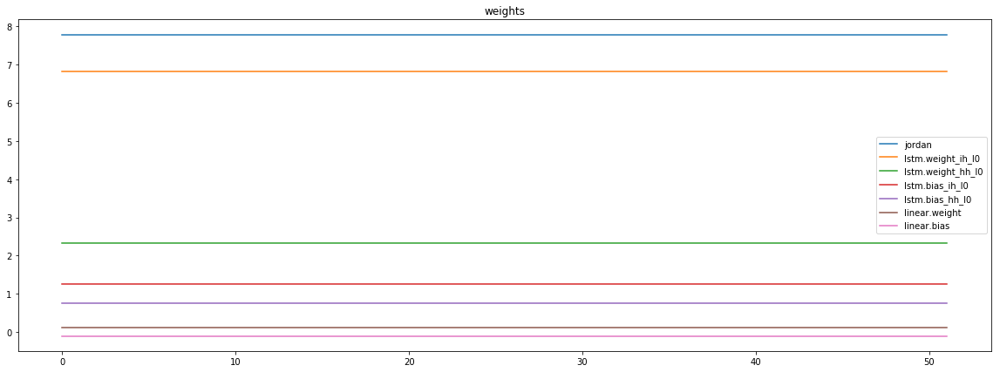

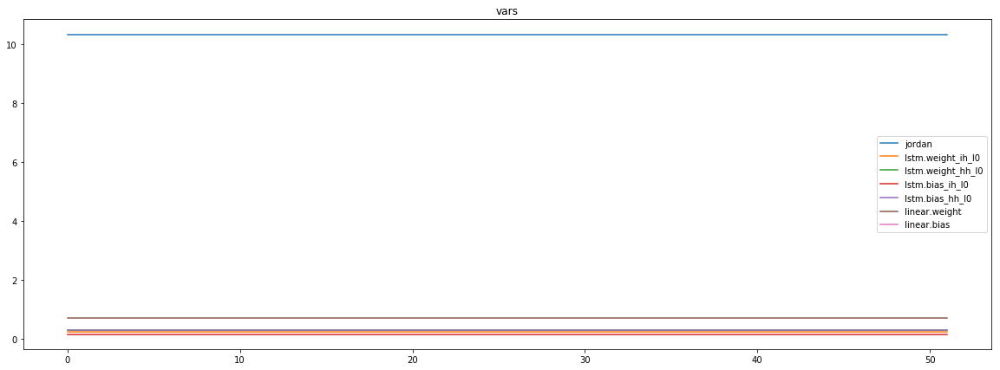

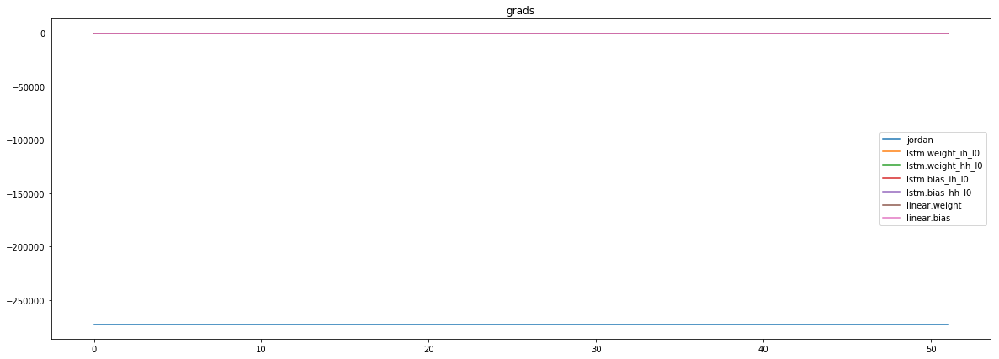

mean_p1 : 9469.0234375
mean_p2 : -277787.9375
mean_p3 : -4284.8076171875


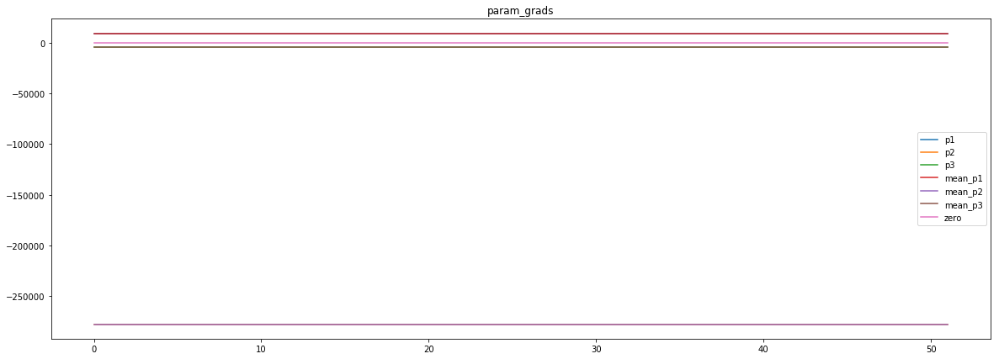

loss rate [0.3491512443481266]
Epoch [22] 
     train_loss[11342.367131159855] 
     eval_train[0.08768497387455472] 
     eval_test[0.08730676204669925]



aux preds: 0.4532656967639923           1.0325148105621338           6.553804397583008
main loss 0.0
aux loss 0.0
jord loss 10906.079279972957
combined loss 10906.079279972957 



Parameter containing:
tensor([[0.4533, 1.0325, 6.5538]], requires_grad=True)


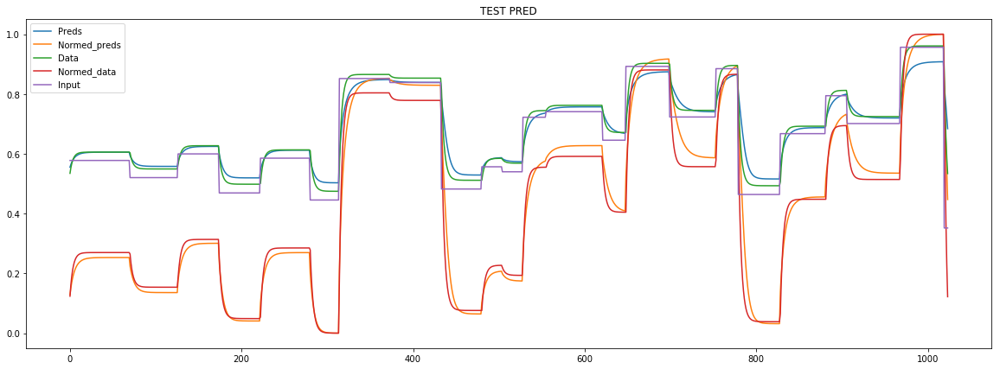

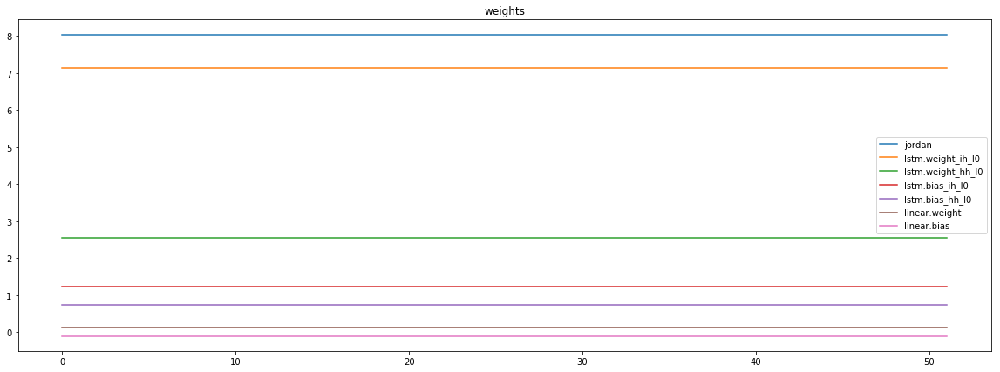

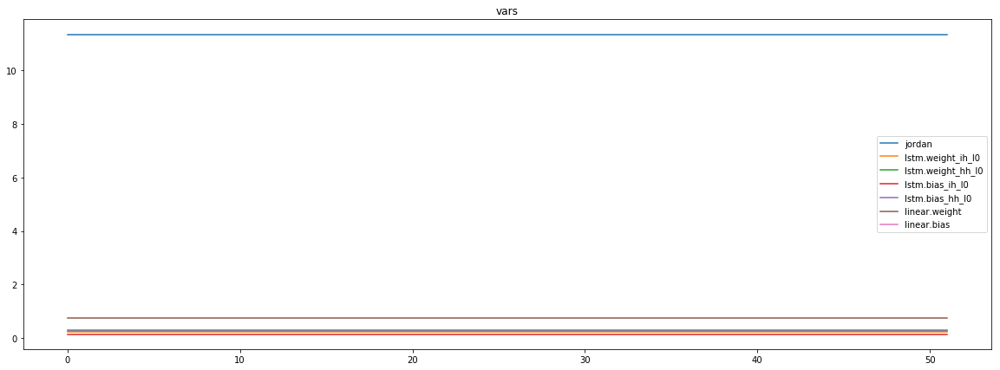

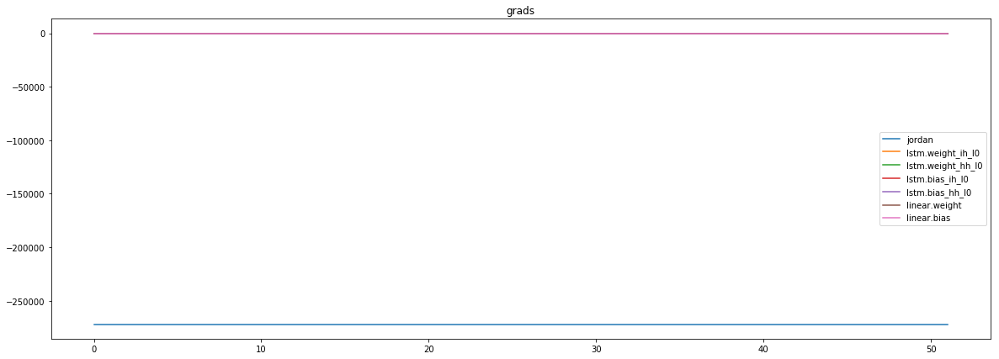

mean_p1 : 8932.474609375
mean_p2 : -276597.53125
mean_p3 : -4281.54931640625


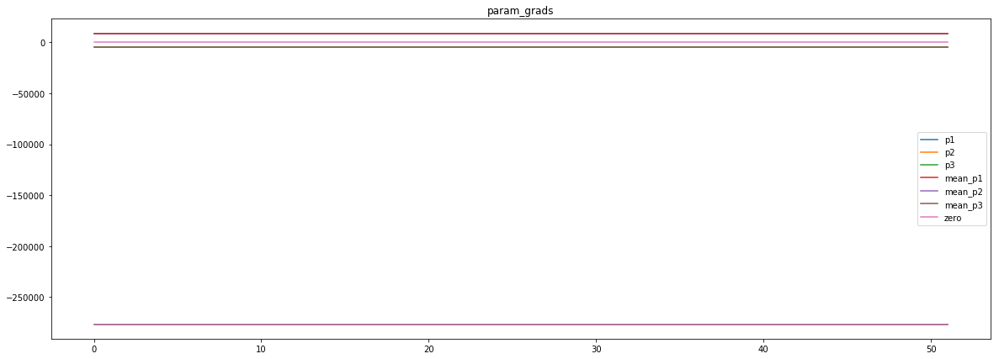

loss rate [0.4363188196955762]
Epoch [23] 
     train_loss[10906.079279972957] 
     eval_train[0.06328308306407192] 
     eval_test[0.06294167215607807]



aux preds: 0.452559232711792           1.0298856496810913           6.828597068786621
main loss 0.0
aux loss 0.0
jord loss 10433.459256685697
combined loss 10433.459256685697 



Parameter containing:
tensor([[0.4526, 1.0299, 6.8286]], requires_grad=True)


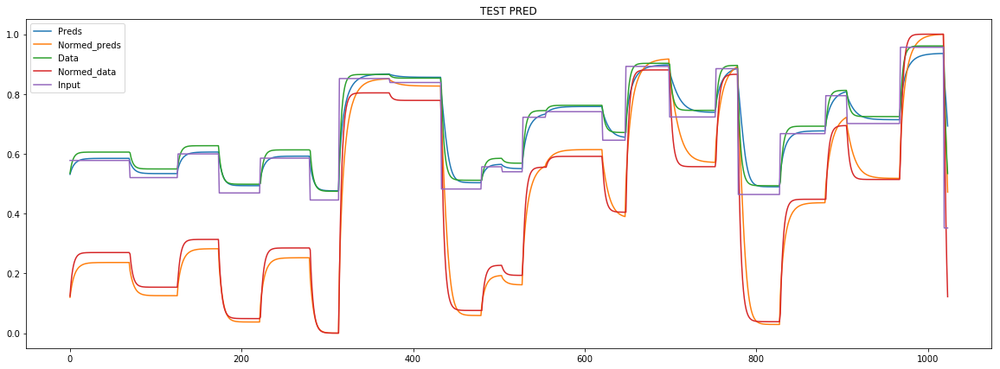

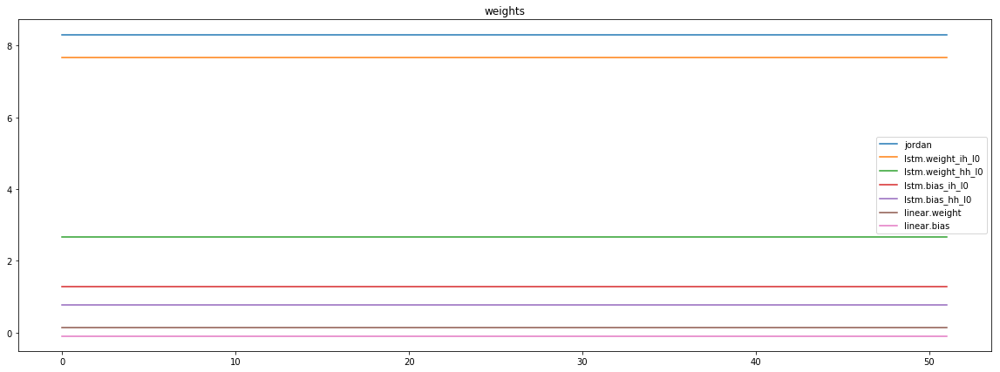

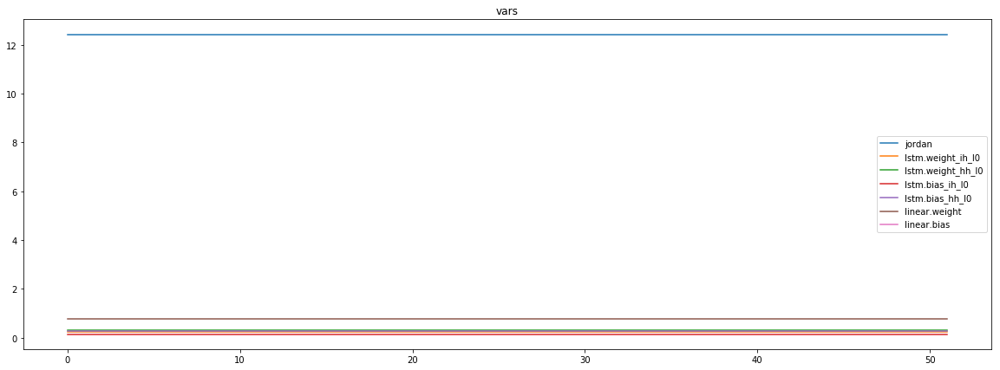

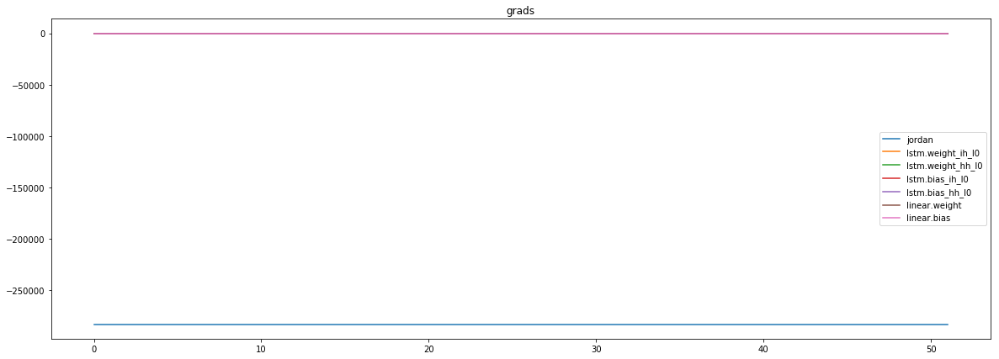

mean_p1 : 11734.888671875
mean_p2 : -290592.90625
mean_p3 : -4403.66552734375


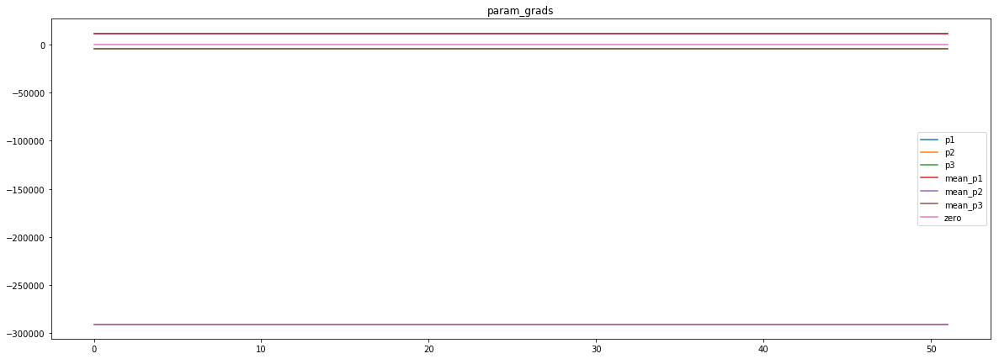

loss rate [0.417978321989389]
Epoch [24] 
     train_loss[10433.459256685697] 
     eval_train[0.0503598295701802] 
     eval_test[0.050833030139487666]



aux preds: 0.4511050581932068           1.0294350385665894           7.108277320861816
main loss 0.0
aux loss 0.0
jord loss 10000.131704477164
combined loss 10000.131704477164 



Parameter containing:
tensor([[0.4511, 1.0294, 7.1083]], requires_grad=True)


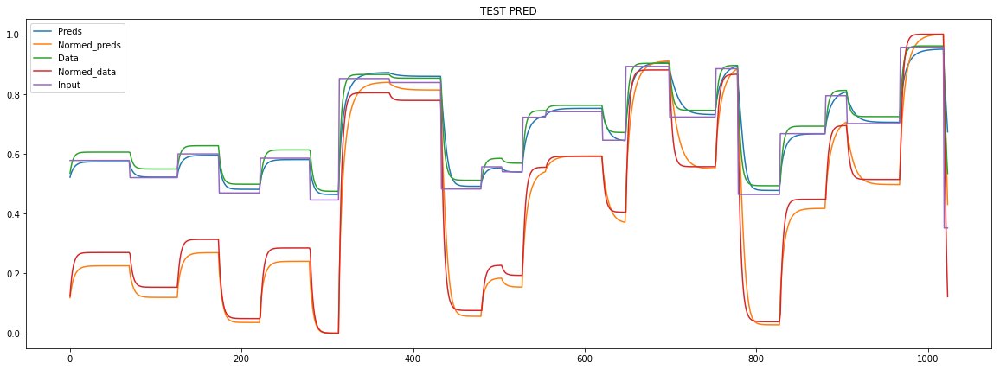

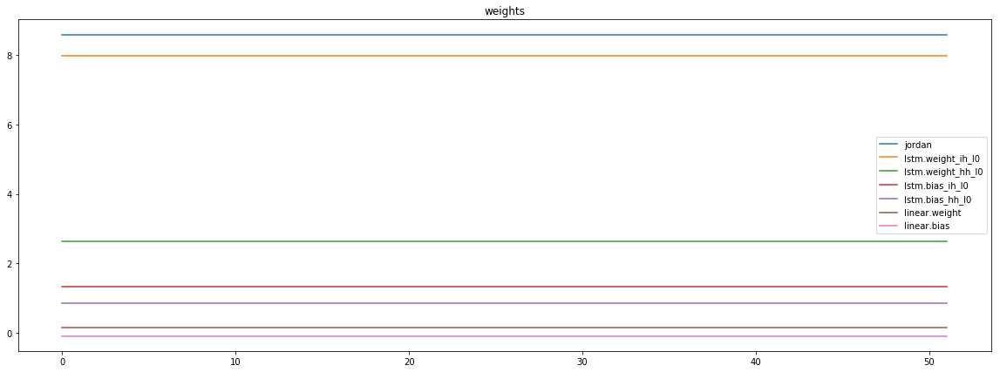

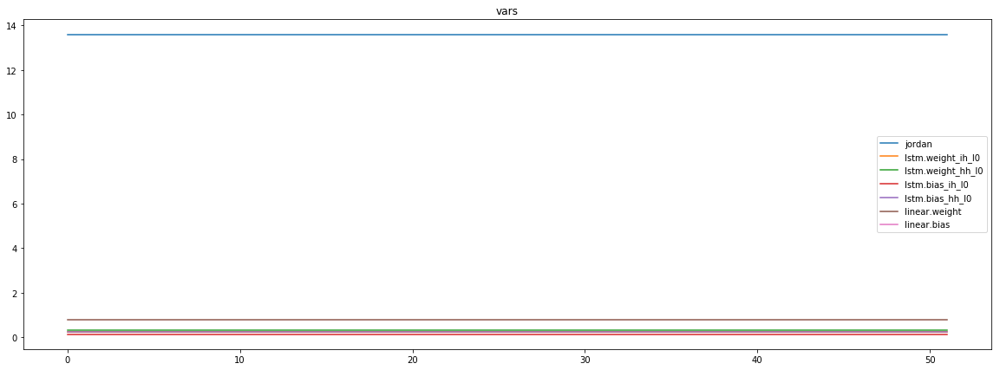

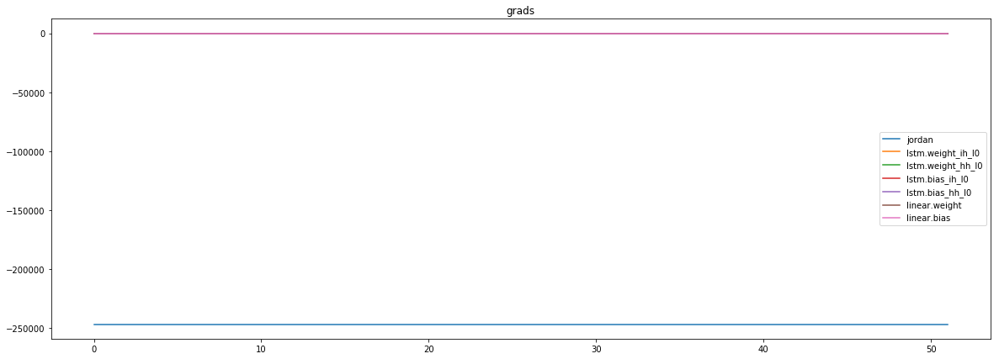

mean_p1 : 12070.1689453125
mean_p2 : -254670.90625
mean_p3 : -4075.537841796875


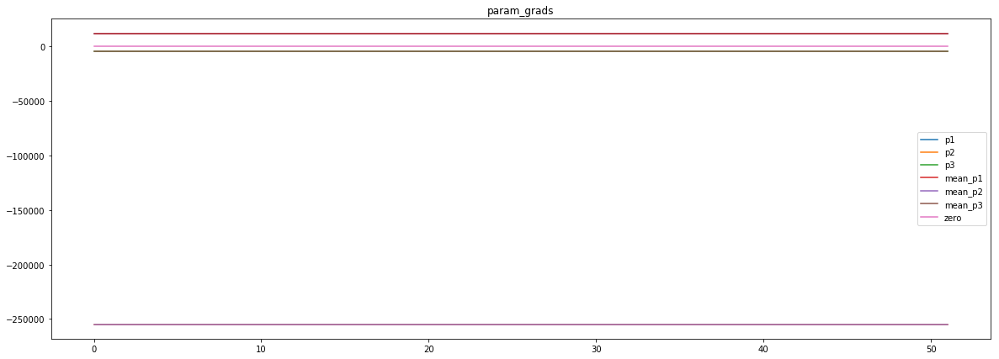

loss rate [0.2768989010555861]
Epoch [25] 
     train_loss[10000.131704477164] 
     eval_train[0.0477993163804058] 
     eval_test[0.04846740928108127]



aux preds: 0.4493536651134491           1.0266790390014648           7.3927788734436035
main loss 0.0
aux loss 0.0
jord loss 9535.028695913461
combined loss 9535.028695913461 



Parameter containing:
tensor([[0.4494, 1.0267, 7.3928]], requires_grad=True)


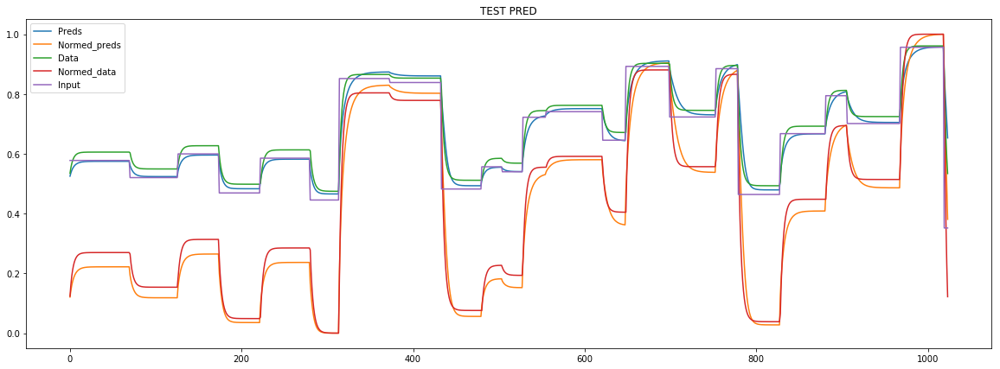

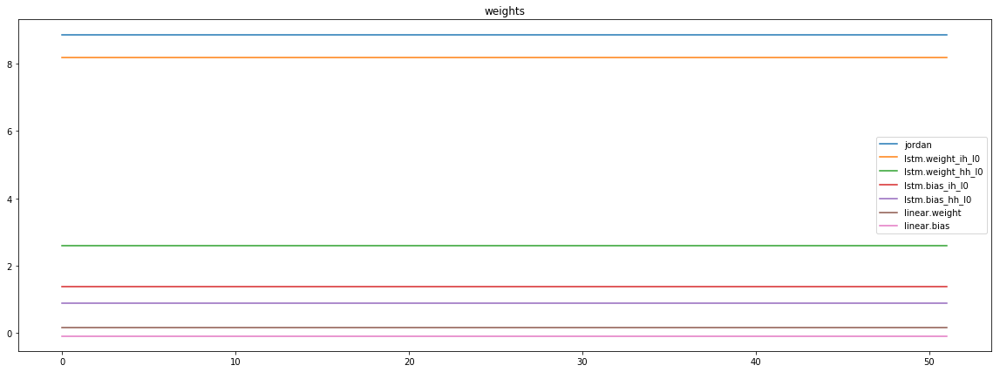

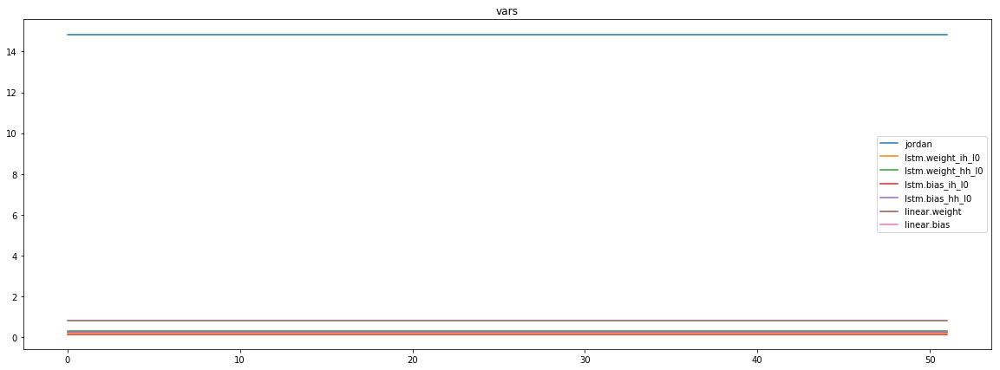

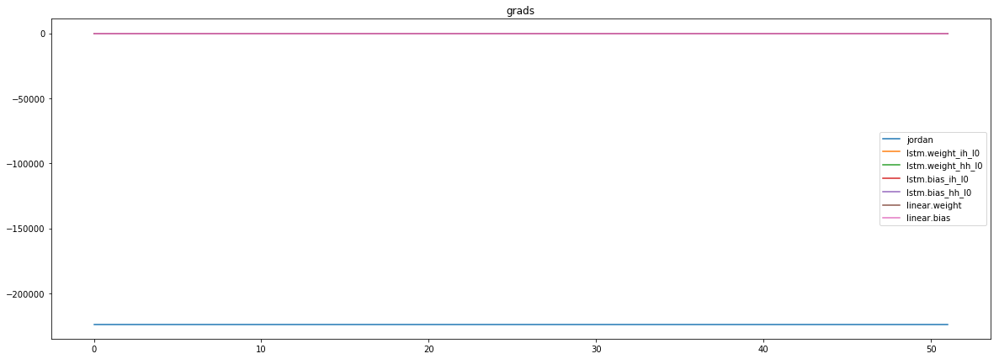

mean_p1 : 5679.3447265625
mean_p2 : -225533.5
mean_p3 : -3819.17138671875


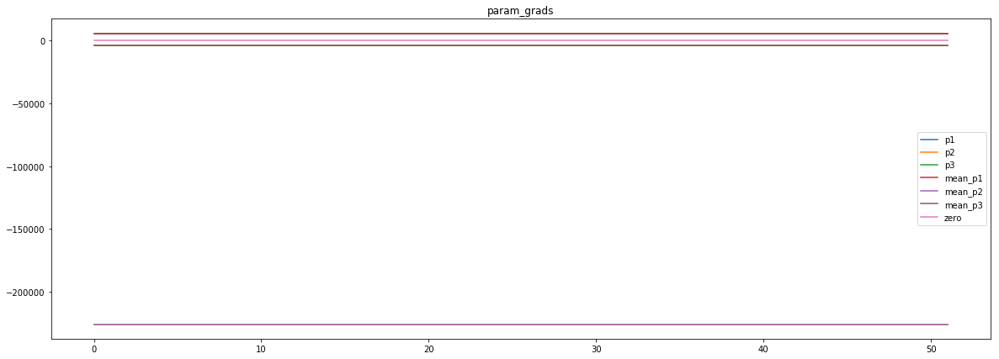

loss rate [0.17055330755424047]
Epoch [26] 
     train_loss[9535.028695913461] 
     eval_train[0.04441835224441512] 
     eval_test[0.04485706094088858]



aux preds: 0.4469223618507385           1.0218616724014282           7.667665958404541
main loss 0.0
aux loss 0.0
jord loss 9115.568246694711
combined loss 9115.568246694711 



Parameter containing:
tensor([[0.4469, 1.0219, 7.6677]], requires_grad=True)


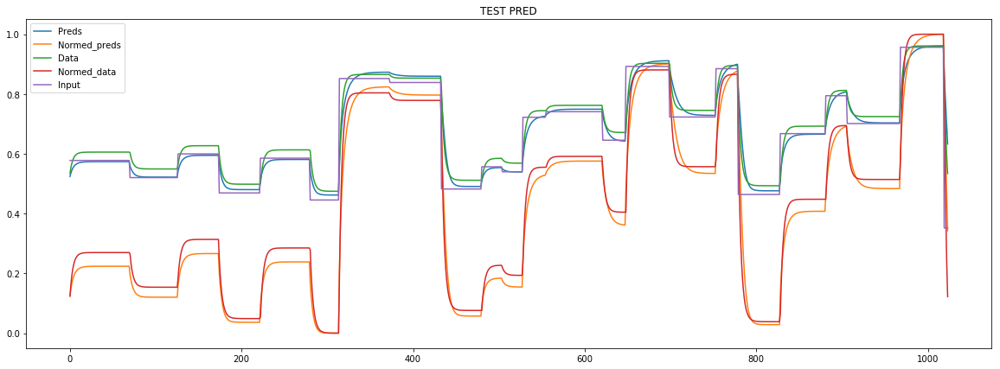

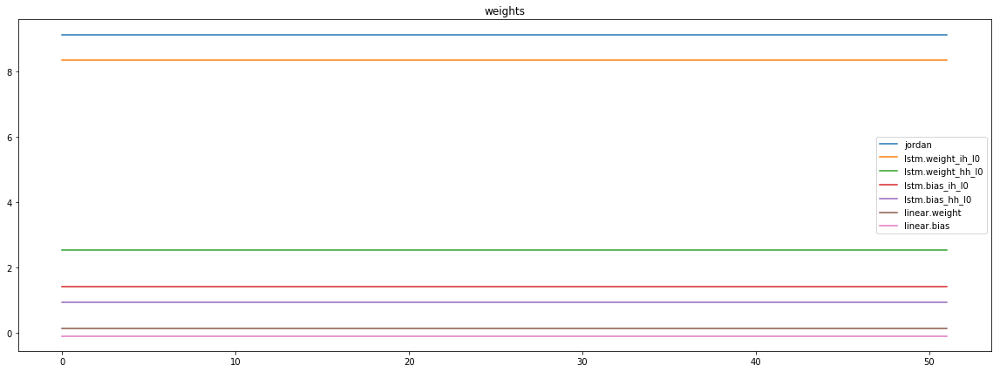

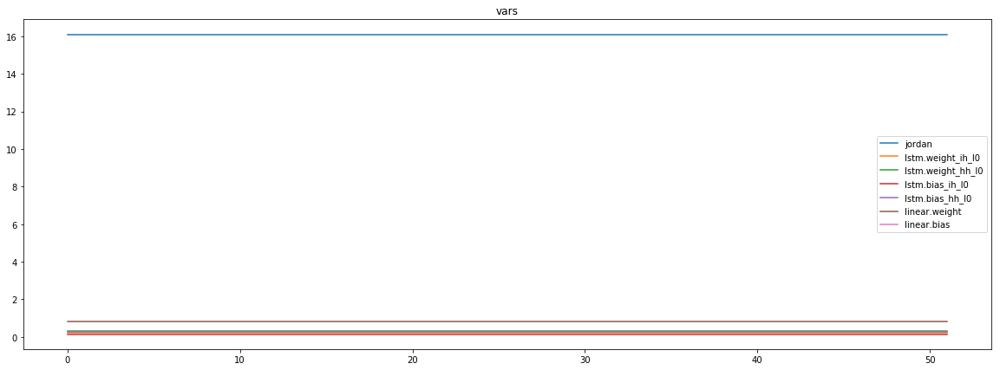

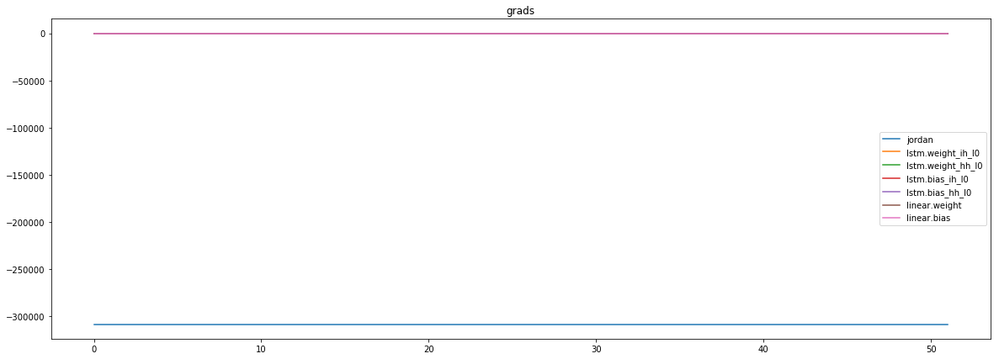

mean_p1 : 2323.299560546875
mean_p2 : -306396.59375
mean_p3 : -4589.005859375


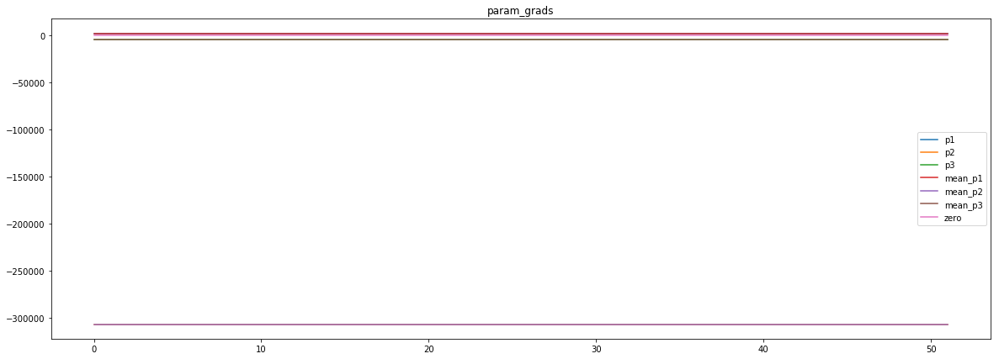

loss rate [0.08291237558925657]
Epoch [27] 
     train_loss[9115.568246694711] 
     eval_train[0.043329282602756466] 
     eval_test[0.044068353182493324]



aux preds: 0.44606512784957886           1.0207422971725464           7.923374652862549
main loss 0.0
aux loss 0.0
jord loss 8736.446523813102
combined loss 8736.446523813102 



Parameter containing:
tensor([[0.4461, 1.0207, 7.9234]], requires_grad=True)


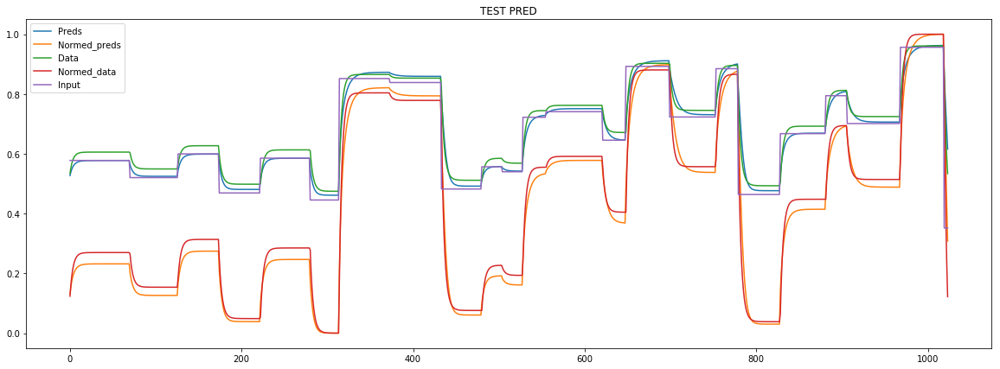

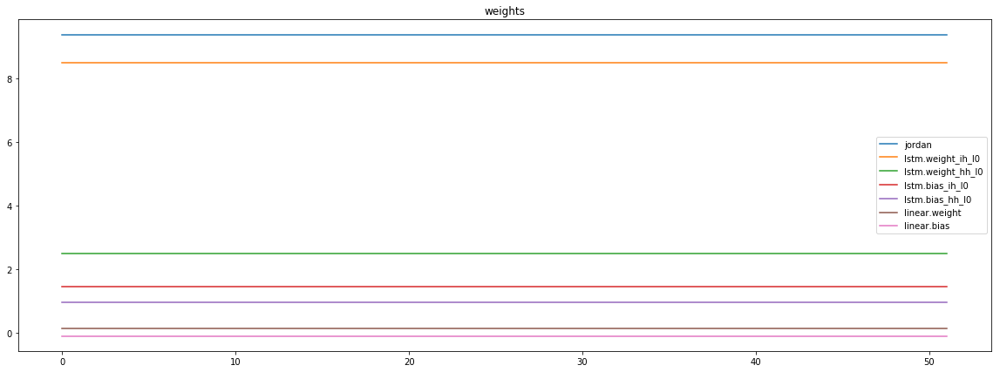

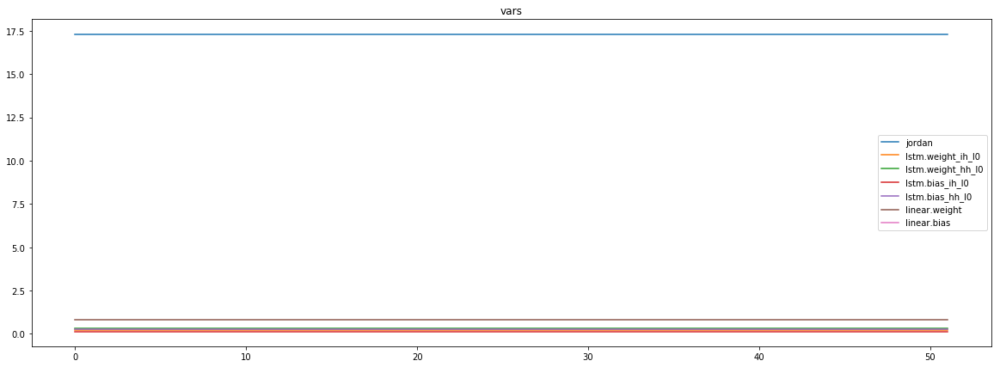

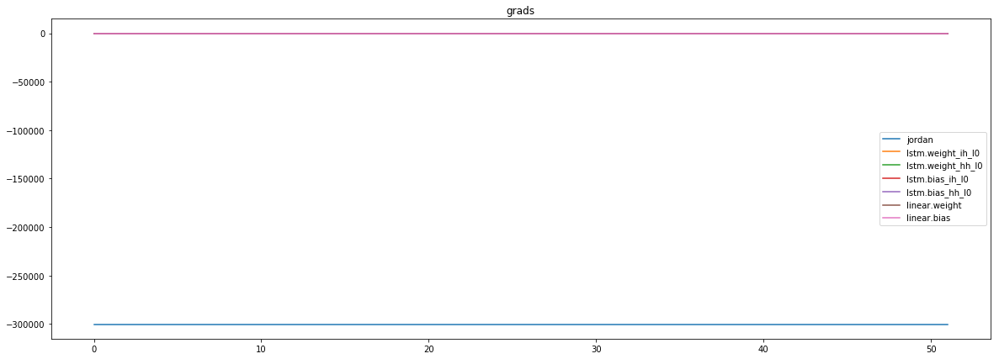

mean_p1 : 544.943115234375
mean_p2 : -296149.75
mean_p3 : -4502.9794921875


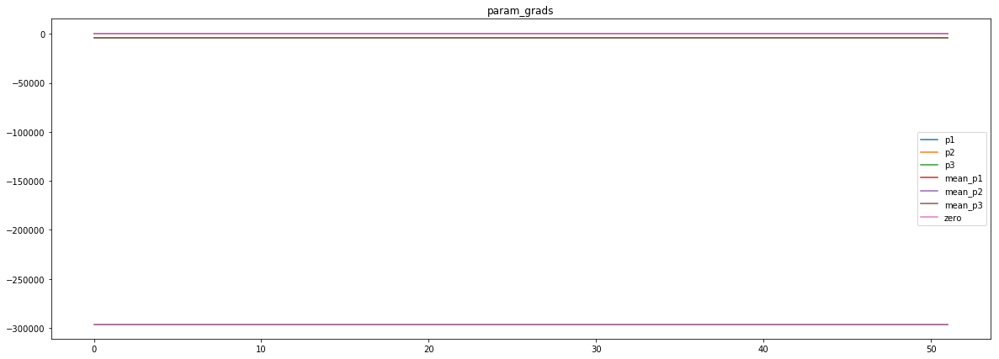

loss rate [0.1399151174220179]
Epoch [28] 
     train_loss[8736.446523813102] 
     eval_train[0.03860570681969805] 
     eval_test[0.03938983012829505]



aux preds: 0.4474641978740692           1.0190949440002441           8.170877456665039
main loss 0.0
aux loss 0.0
jord loss 8343.695152869592
combined loss 8343.695152869592 



Parameter containing:
tensor([[0.4475, 1.0191, 8.1709]], requires_grad=True)


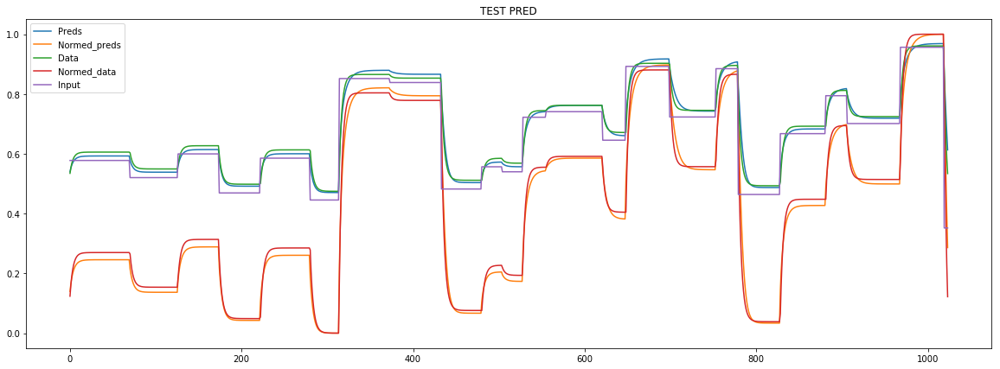

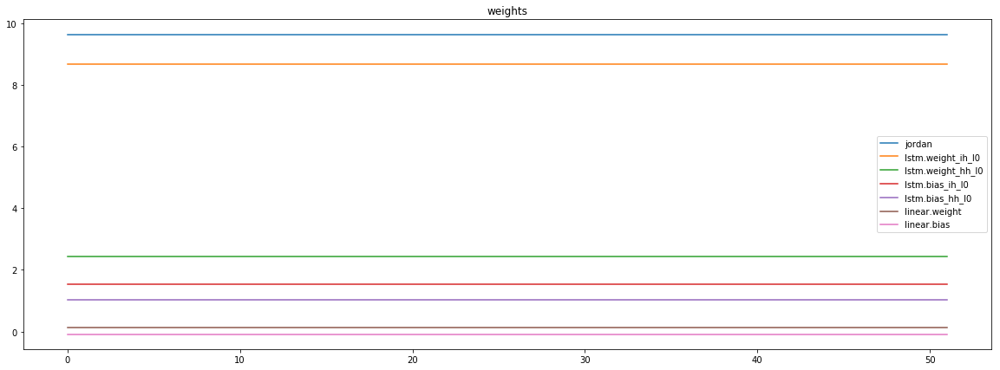

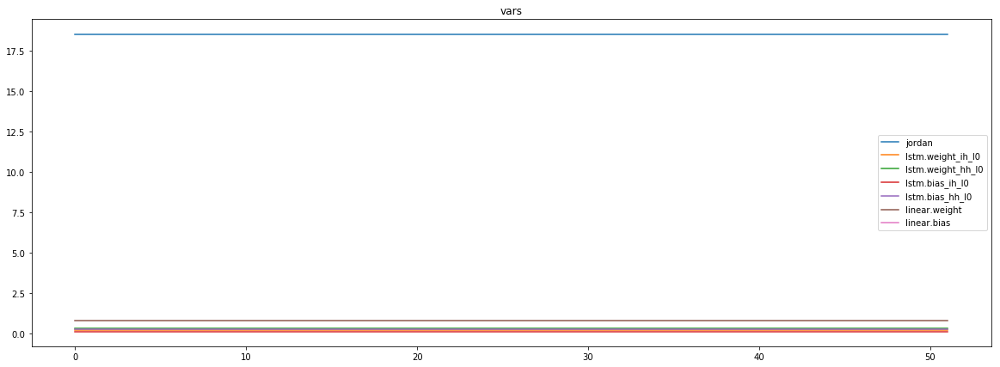

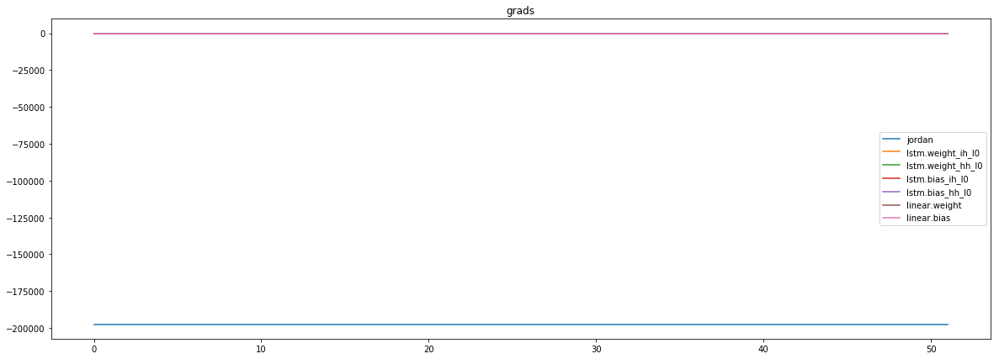

mean_p1 : 4478.41015625
mean_p2 : -198291.015625
mean_p3 : -3564.033203125


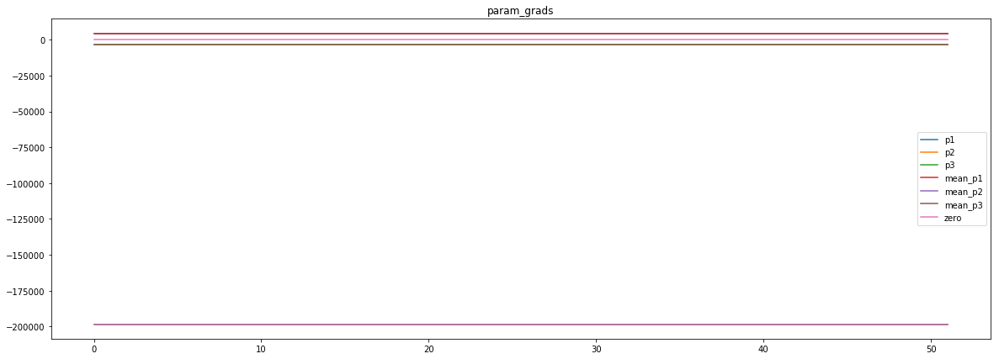

loss rate [0.29162395550518394]
Epoch [29] 
     train_loss[8343.695152869592] 
     eval_train[0.029514280379981543] 
     eval_test[0.030298481723796365]



aux preds: 0.4488588273525238           1.015653133392334           8.406917572021484
main loss 0.0
aux loss 0.0
jord loss 7974.32080078125
combined loss 7974.32080078125 



Parameter containing:
tensor([[0.4489, 1.0157, 8.4069]], requires_grad=True)


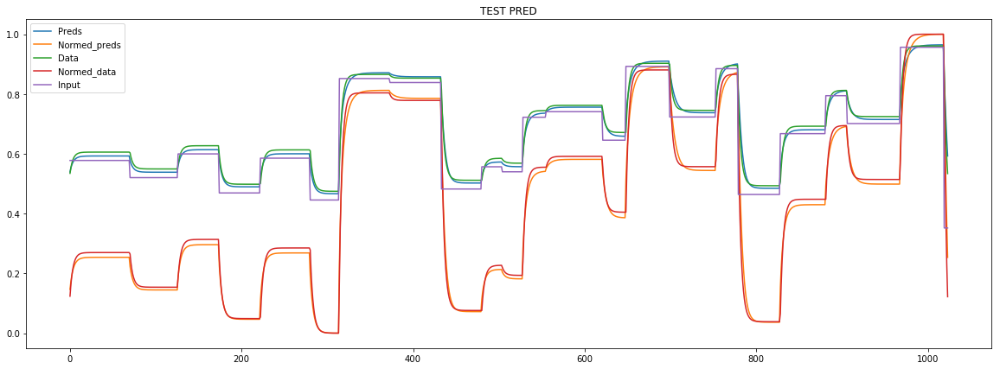

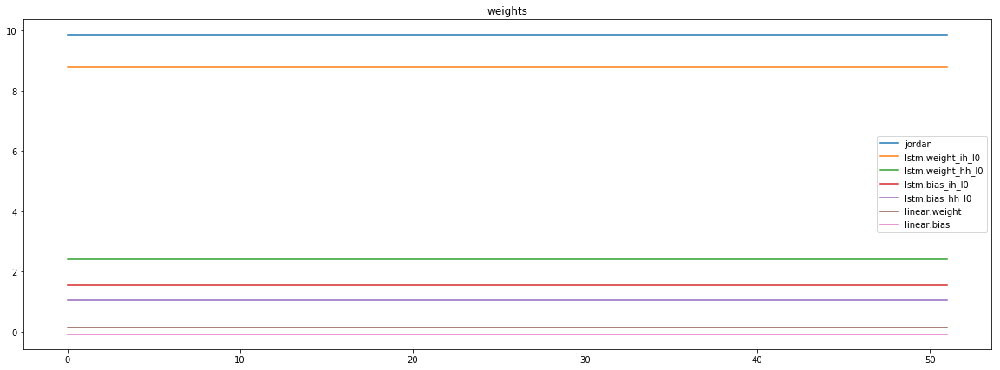

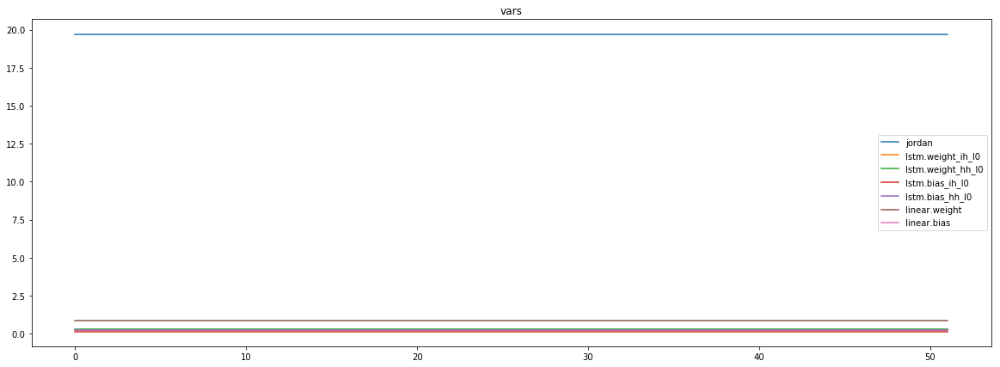

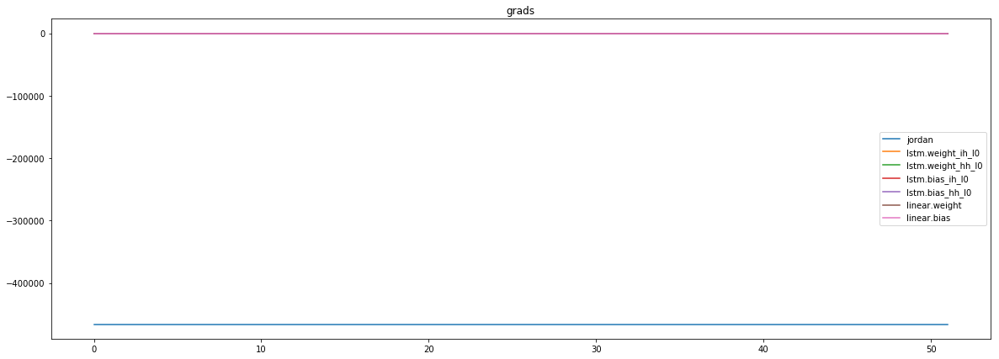

mean_p1 : 14988.1494140625
mean_p2 : -474903.59375
mean_p3 : -6071.9677734375


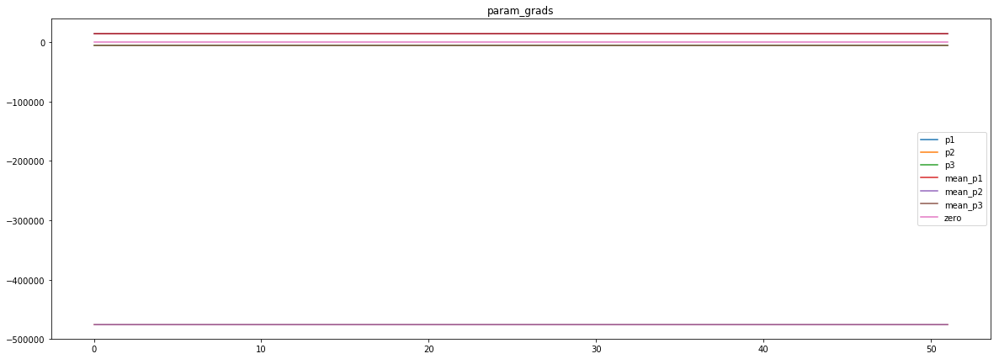

loss rate [0.23210620976343432]
Epoch [30] 
     train_loss[7974.32080078125] 
     eval_train[0.02877398892661194] 
     eval_test[0.02911767889269289]



aux preds: 0.4486719071865082           1.015683889389038           8.615943908691406
main loss 0.0
aux loss 0.0
jord loss 7657.37299992488
combined loss 7657.37299992488 



Parameter containing:
tensor([[0.4487, 1.0157, 8.6159]], requires_grad=True)


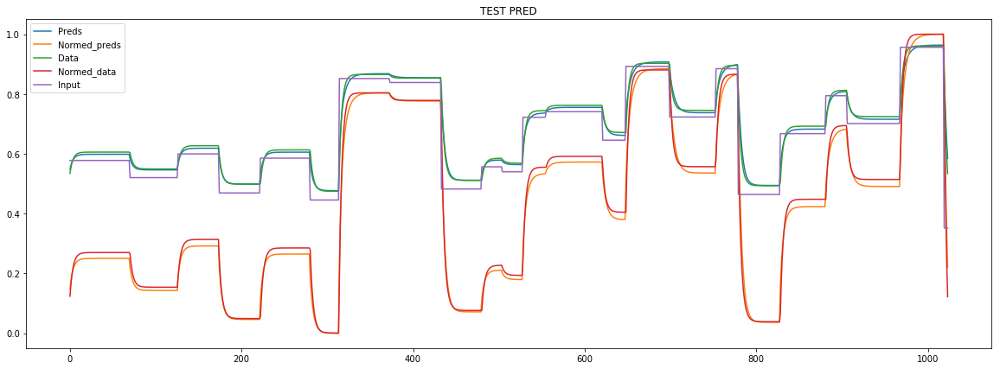

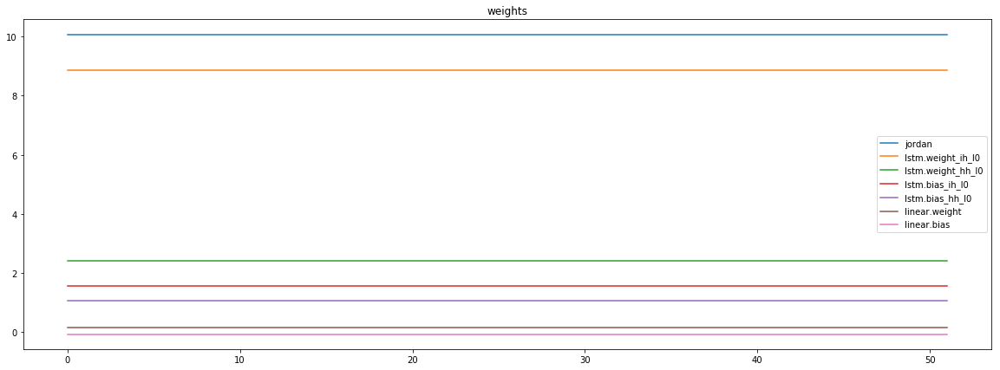

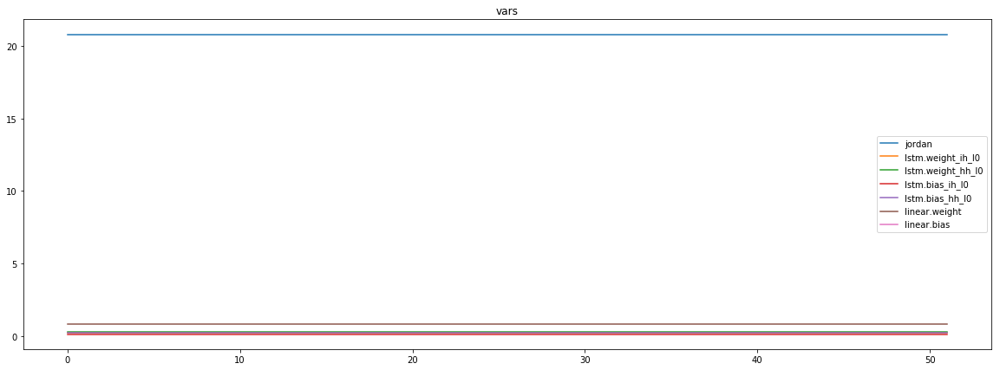

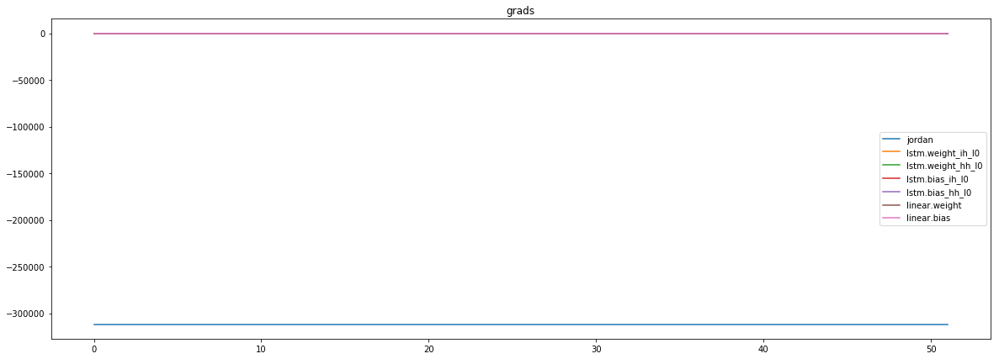

mean_p1 : -59948.58984375
mean_p2 : -247745.171875
mean_p3 : -4006.4716796875


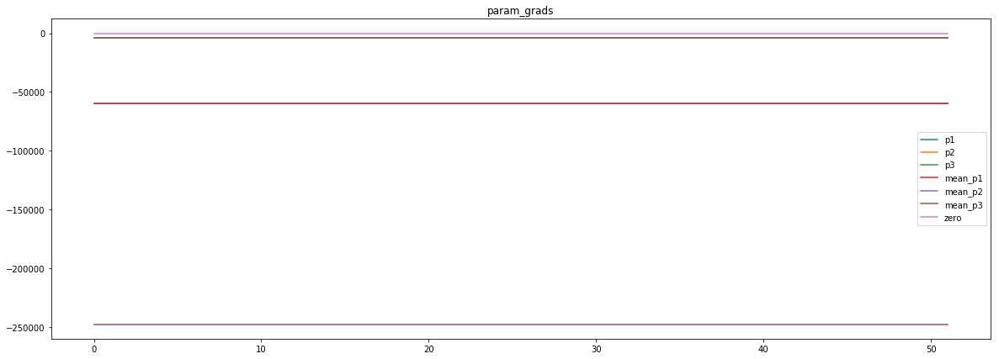

loss rate [0.22295963394799023]
Epoch [31] 
     train_loss[7657.37299992488] 
     eval_train[0.025149911223986868] 
     eval_test[0.02559208107215289]



aux preds: 0.4449995160102844           1.0141091346740723           8.803571701049805
main loss 0.0
aux loss 0.0
jord loss 7386.434053861178
combined loss 7386.434053861178 



Parameter containing:
tensor([[0.4450, 1.0141, 8.8036]], requires_grad=True)


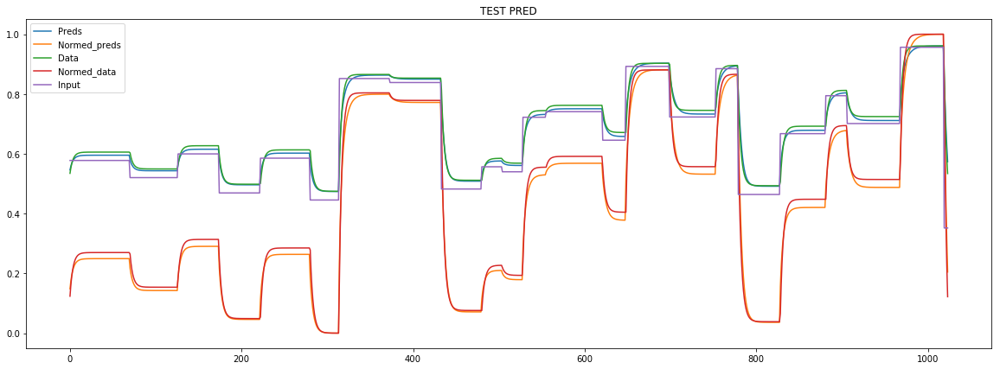

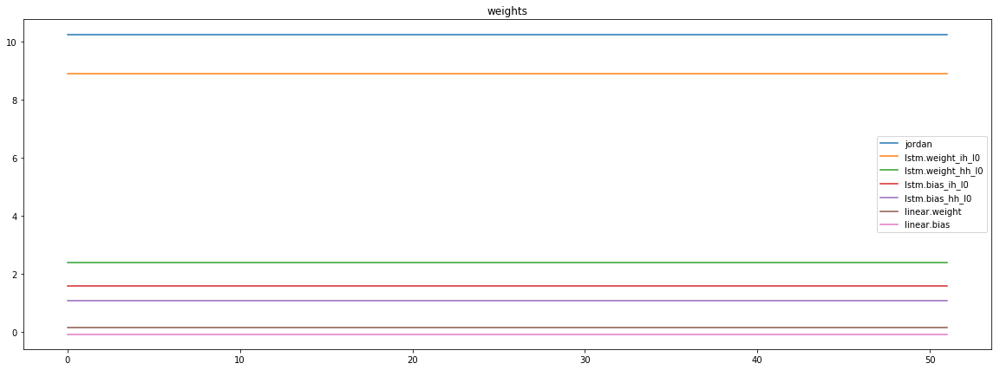

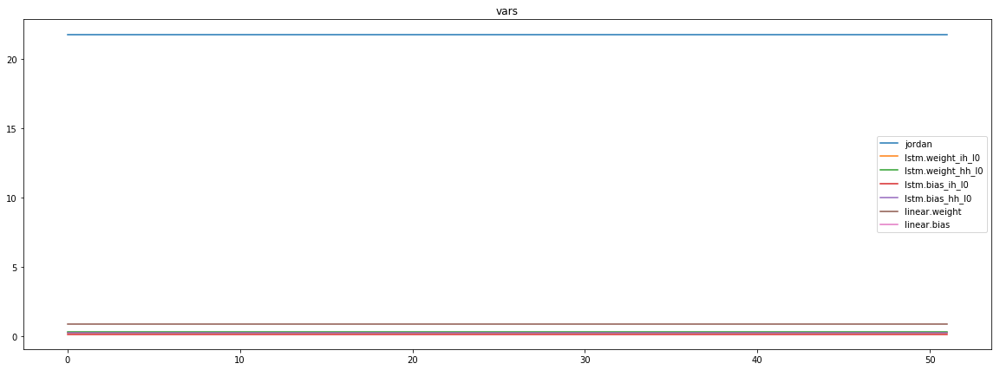

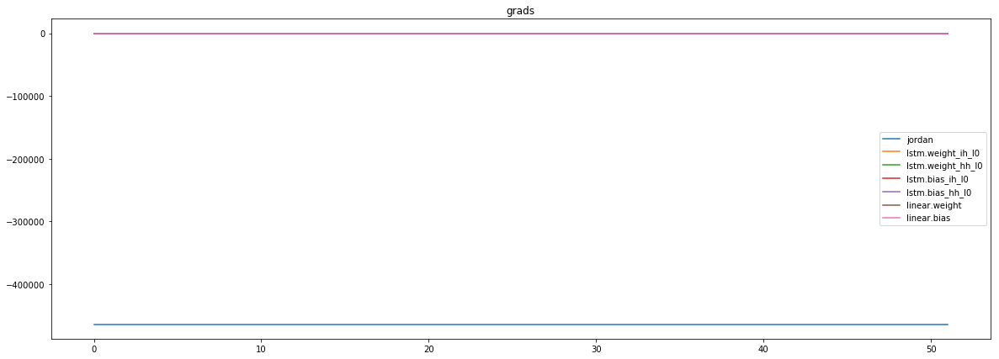

mean_p1 : 13967.873046875
mean_p2 : -471969.53125
mean_p3 : -6061.23046875


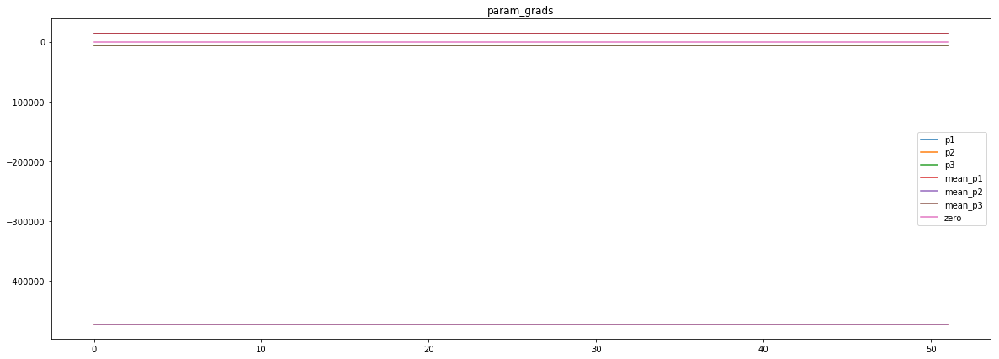

loss rate [0.05593773642000943]
Epoch [32] 
     train_loss[7386.434053861178] 
     eval_train[0.026475961962765165] 
     eval_test[0.026751024357178143]



aux preds: 0.445521742105484           1.0126433372497559           8.986429214477539
main loss 0.0
aux loss 0.0
jord loss 7010.250591571515
combined loss 7010.250591571515 



Parameter containing:
tensor([[0.4455, 1.0126, 8.9864]], requires_grad=True)


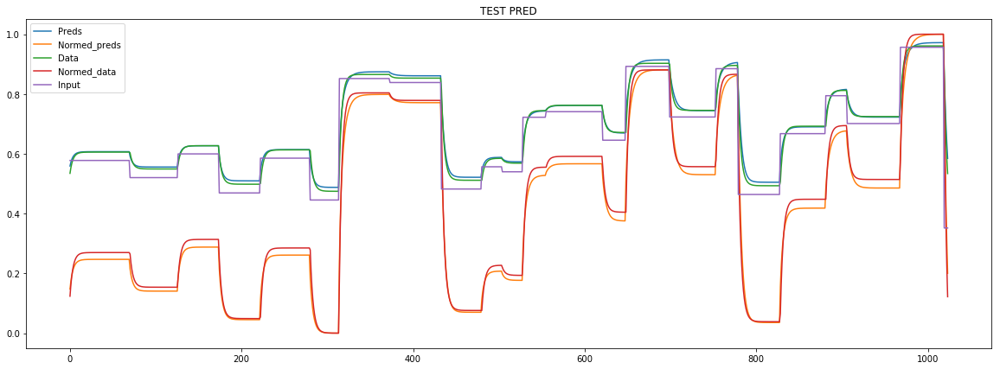

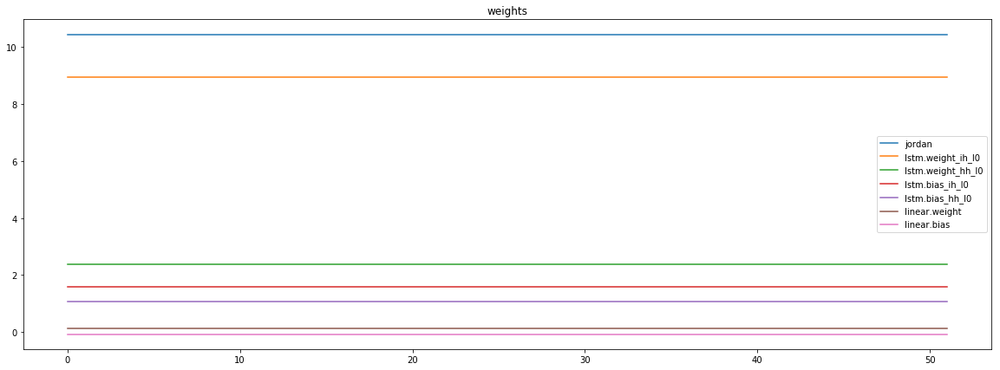

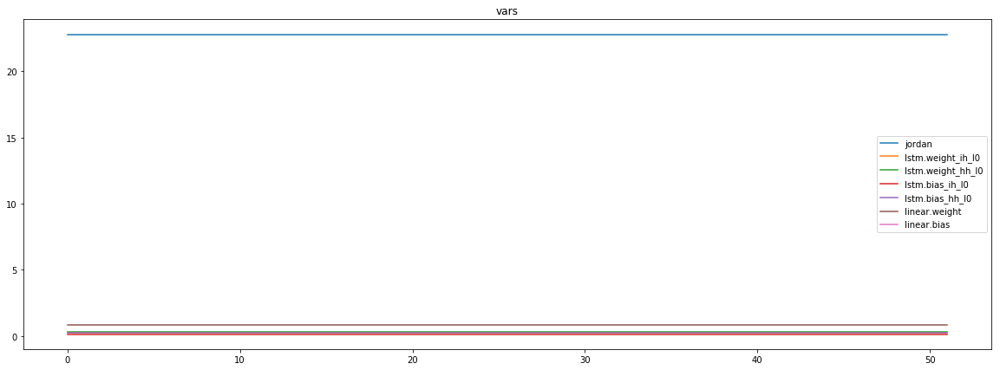

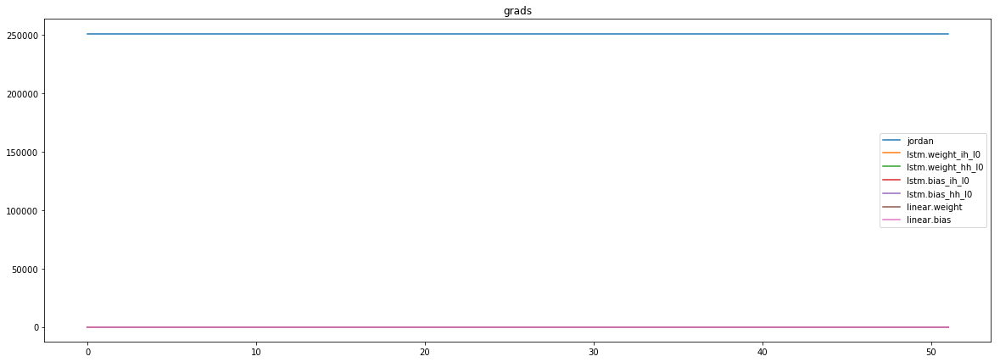

mean_p1 : 21392.48046875
mean_p2 : 229018.953125
mean_p3 : 967.686279296875


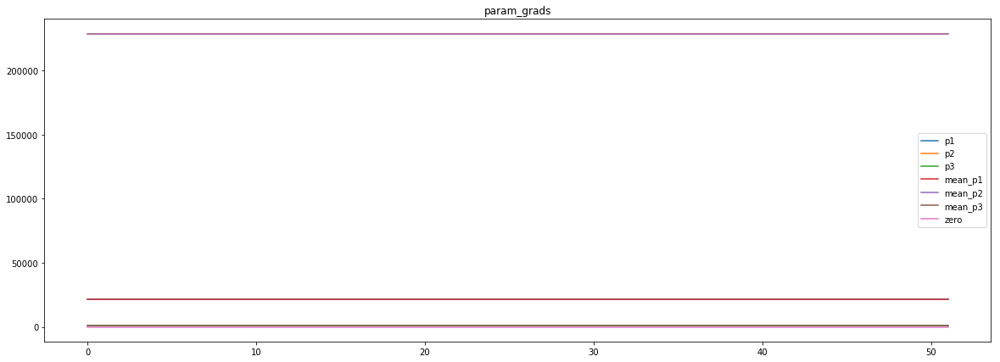

loss rate [-0.10495489151578963]
Epoch [33] 
     train_loss[7010.250591571515] 
     eval_train[0.029698353844231373] 
     eval_test[0.030003497367777694]



aux preds: 0.4460304379463196           1.0093365907669067           9.151402473449707
main loss 0.0
aux loss 0.0
jord loss 6725.21035531851
combined loss 6725.21035531851 



Parameter containing:
tensor([[0.4460, 1.0093, 9.1514]], requires_grad=True)


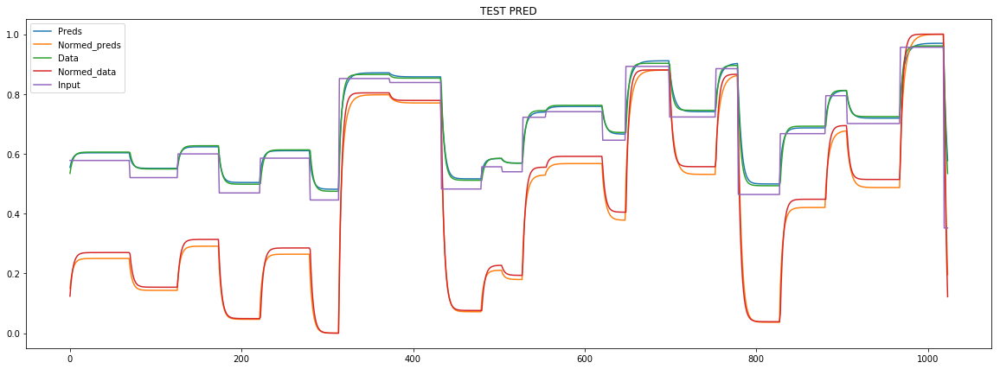

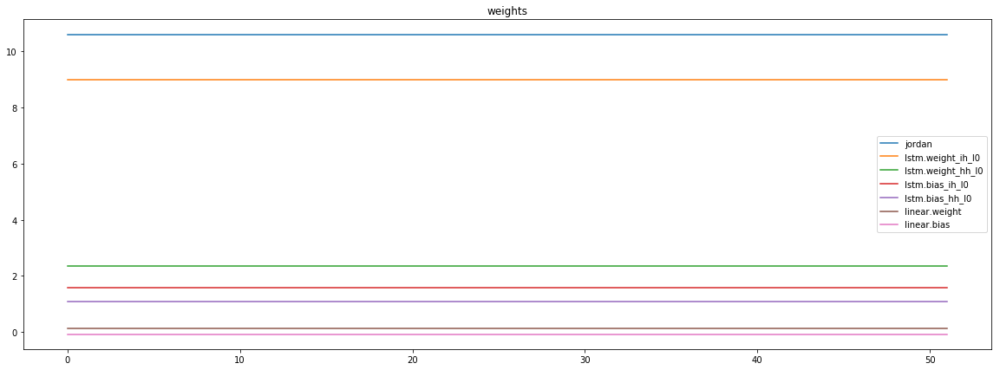

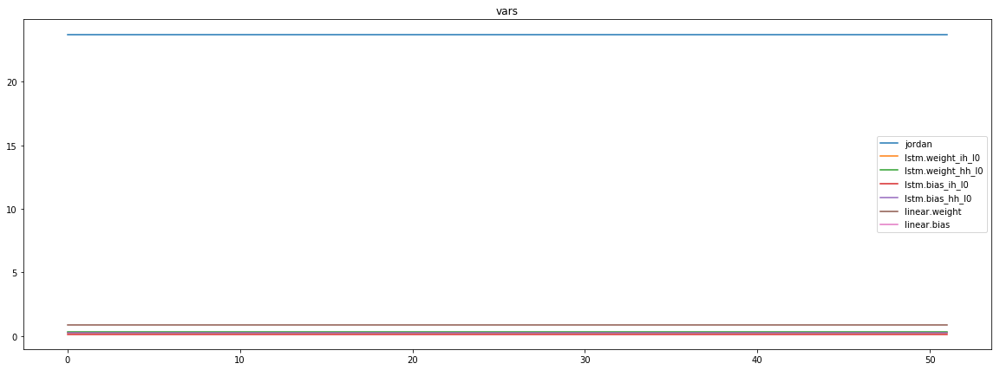

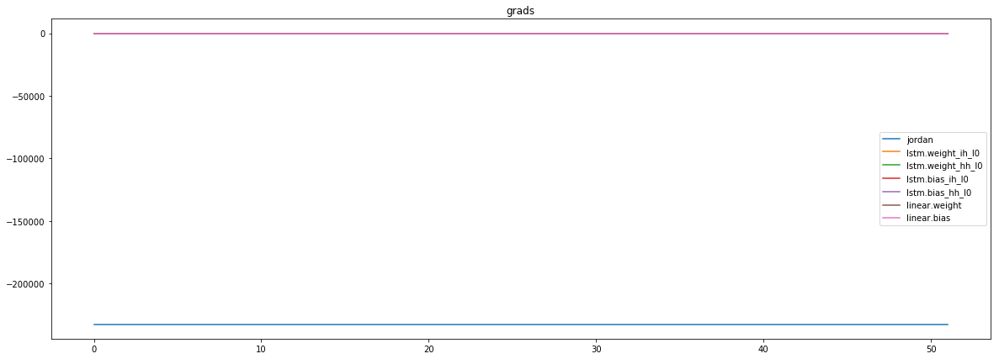

mean_p1 : -68359.09375
mean_p2 : -160861.671875
mean_p3 : -3125.95654296875


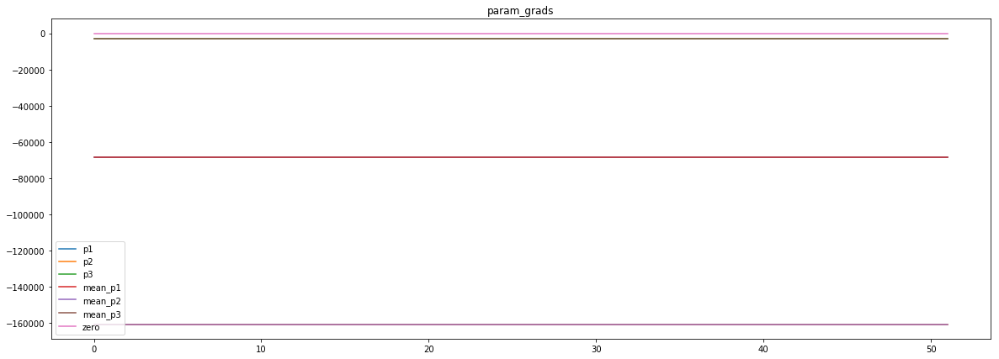

loss rate [0.10794463124016163]
Epoch [34] 
     train_loss[6725.21035531851] 
     eval_train[0.024032346069781434] 
     eval_test[0.024485909708098254]



aux preds: 0.4469802975654602           1.0059200525283813           9.312997817993164
main loss 0.0
aux loss 0.0
jord loss 6523.140934870793
combined loss 6523.140934870793 



Parameter containing:
tensor([[0.4470, 1.0059, 9.3130]], requires_grad=True)


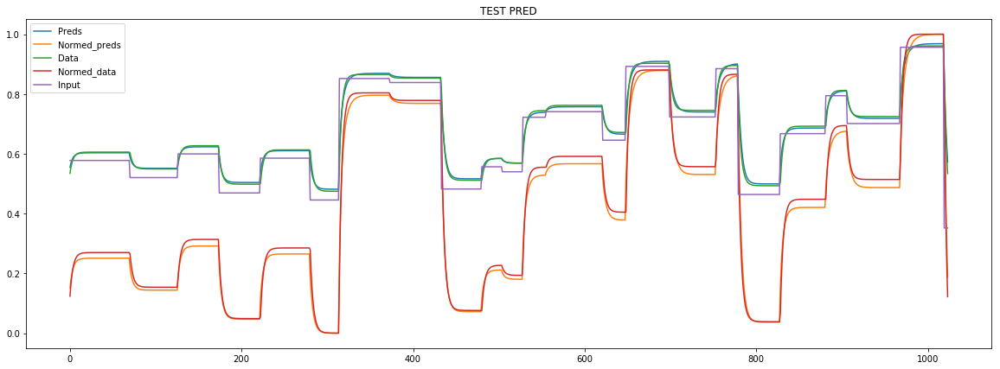

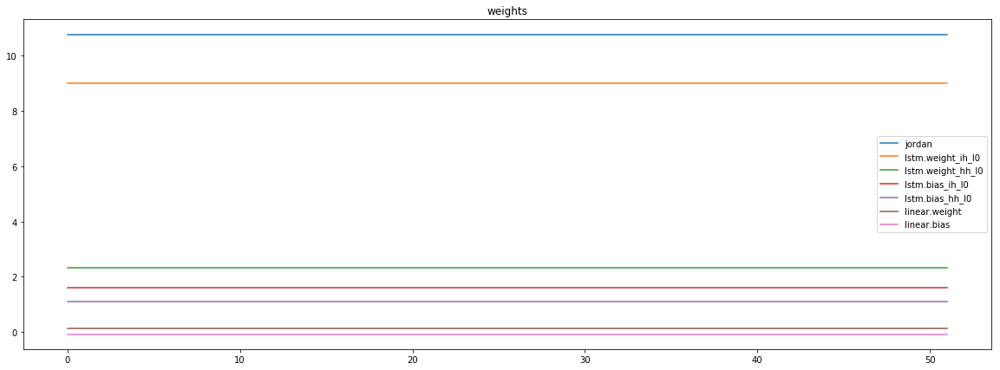

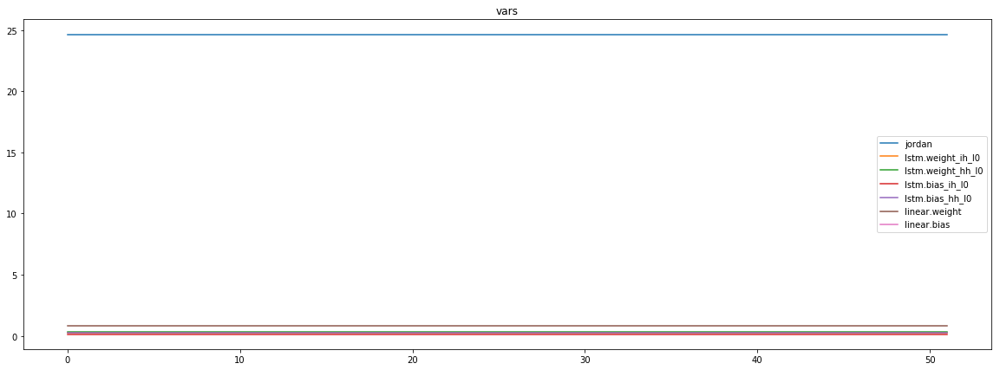

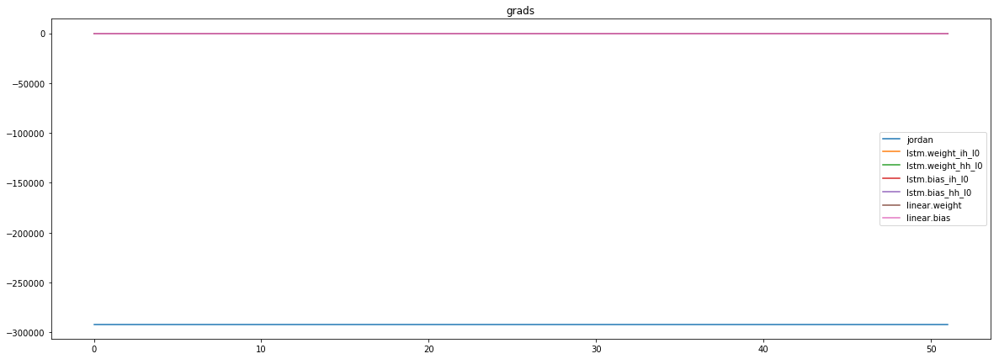

mean_p1 : -7546.90087890625
mean_p2 : -279931.28125
mean_p3 : -4274.34814453125


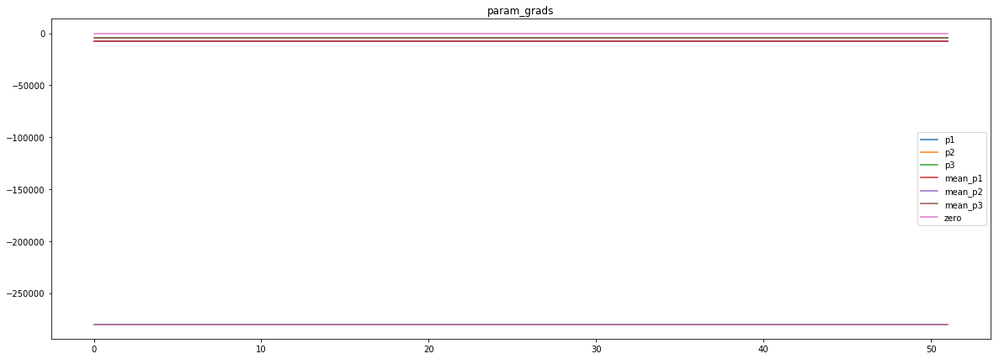

loss rate [0.12807453078297182]
Epoch [35] 
     train_loss[6523.140934870793] 
     eval_train[0.02319260736434304] 
     eval_test[0.023611867098886498]



aux preds: 0.448651522397995           1.005670189857483           9.432147026062012
main loss 0.0
aux loss 0.0
jord loss 6359.021512545072
combined loss 6359.021512545072 



Parameter containing:
tensor([[0.4487, 1.0057, 9.4321]], requires_grad=True)


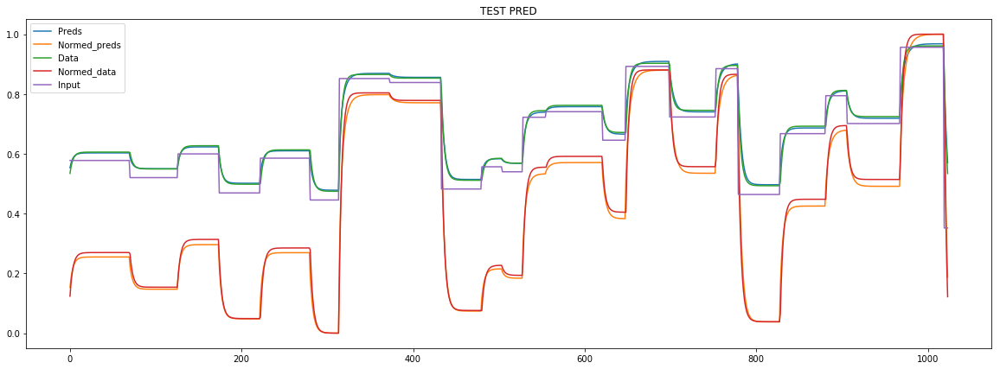

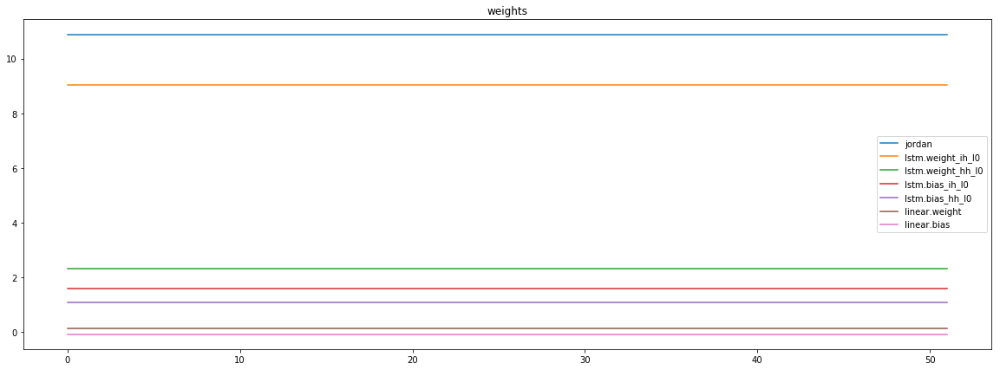

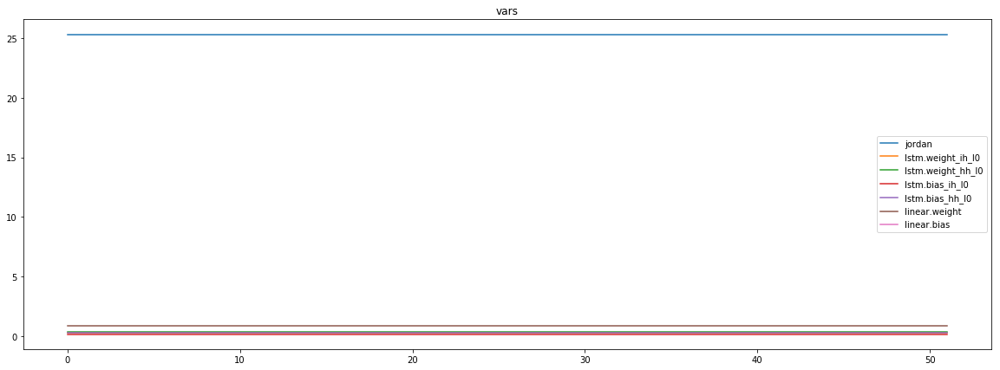

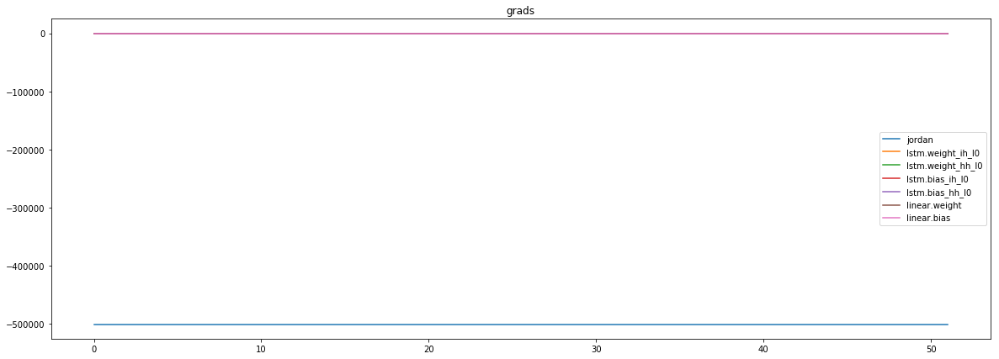

mean_p1 : -37929.65234375
mean_p2 : -456759.625
mean_p3 : -5818.77001953125


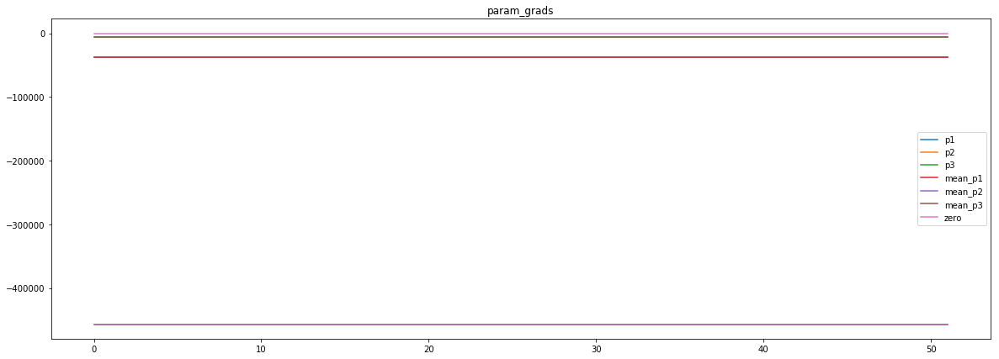

loss rate [0.14138178190722928]
Epoch [36] 
     train_loss[6359.021512545072] 
     eval_train[0.02206923892502416] 
     eval_test[0.02235305895423649]



aux preds: 0.4470936954021454           1.004520058631897           9.5514554977417
main loss 0.0
aux loss 0.0
jord loss 6122.96812086839
combined loss 6122.96812086839 



Parameter containing:
tensor([[0.4471, 1.0045, 9.5515]], requires_grad=True)


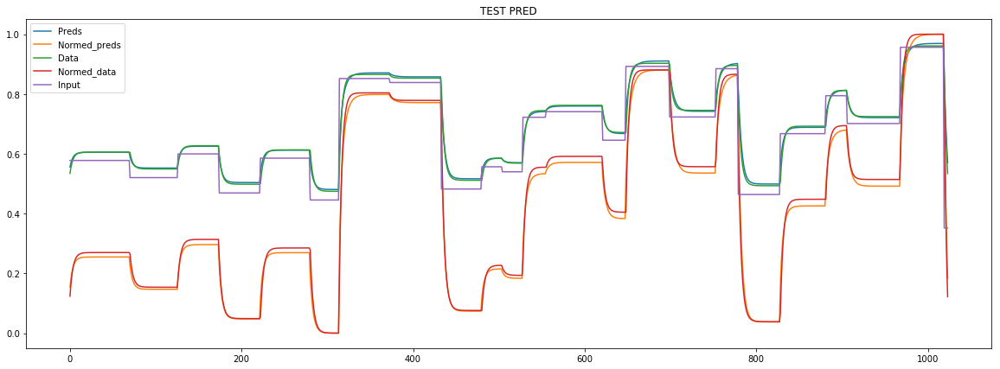

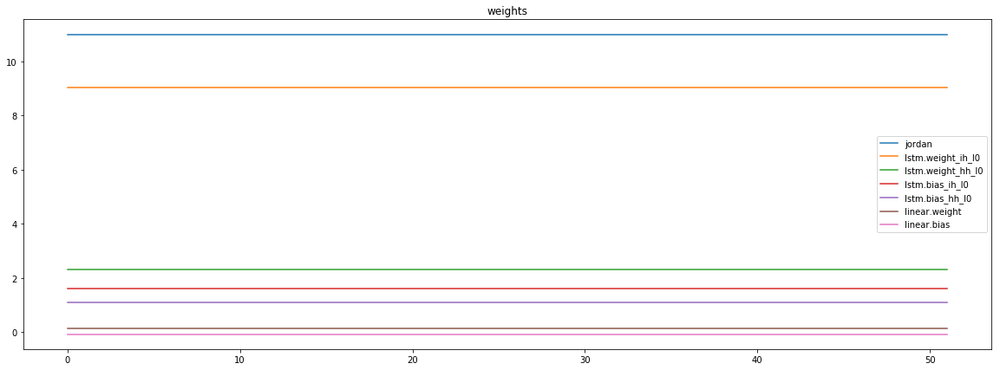

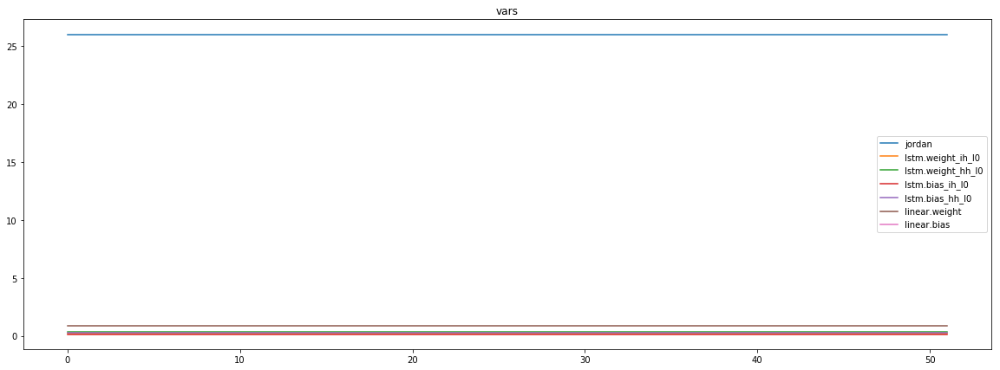

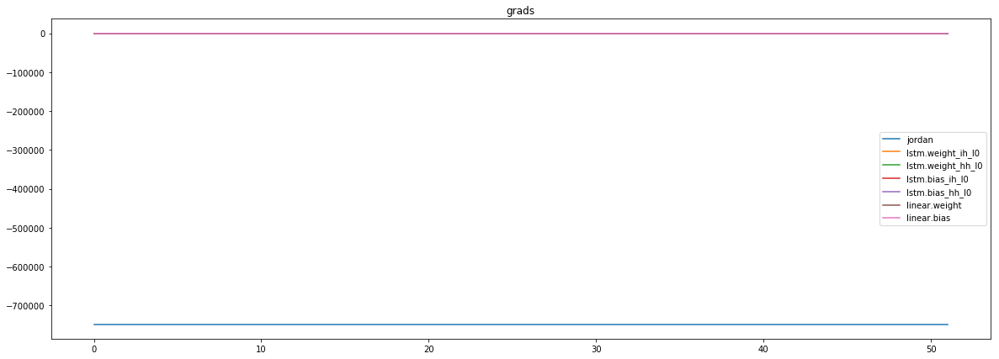

mean_p1 : -41288.84375
mean_p2 : -699161.1875
mean_p3 : -7611.11279296875


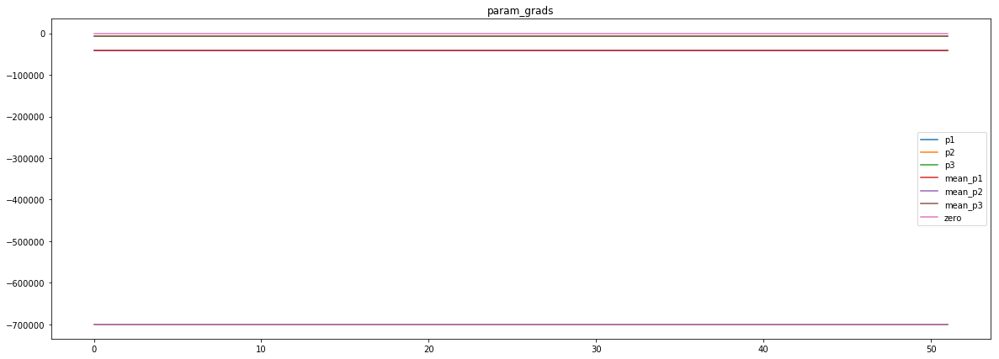

loss rate [0.045625417685344116]
Epoch [37] 
     train_loss[6122.96812086839] 
     eval_train[0.0219988659945067] 
     eval_test[0.022412162317777984]



aux preds: 0.4481886327266693           1.0033856630325317           9.639389991760254
main loss 0.0
aux loss 0.0
jord loss 6111.3820566030645
combined loss 6111.3820566030645 



Parameter containing:
tensor([[0.4482, 1.0034, 9.6394]], requires_grad=True)


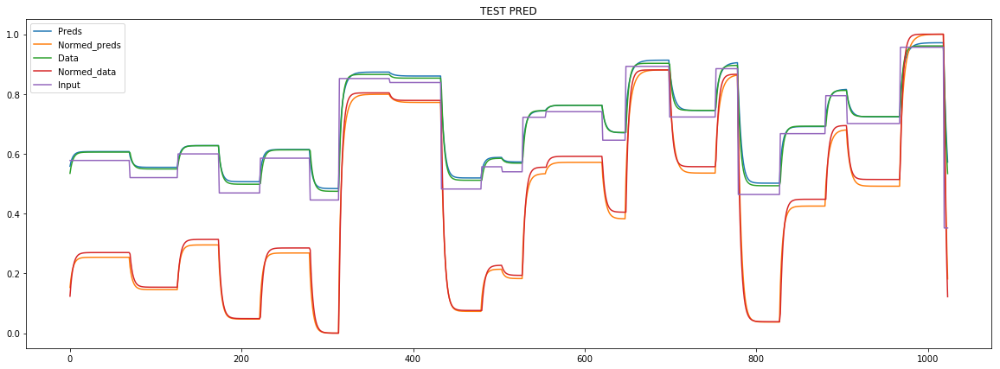

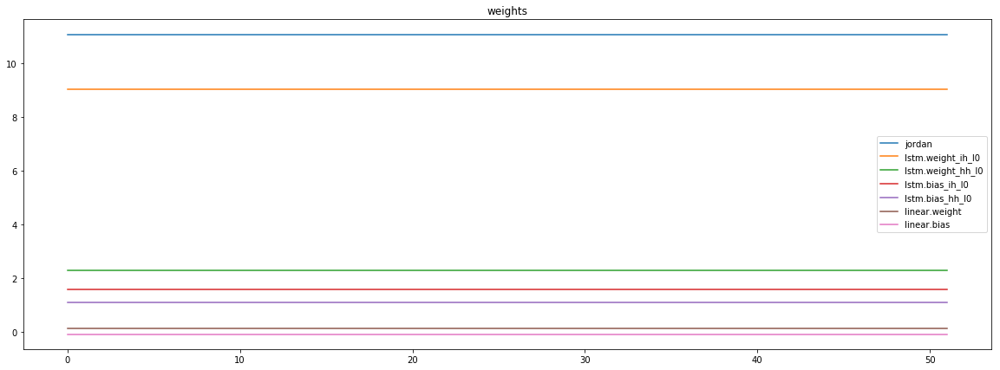

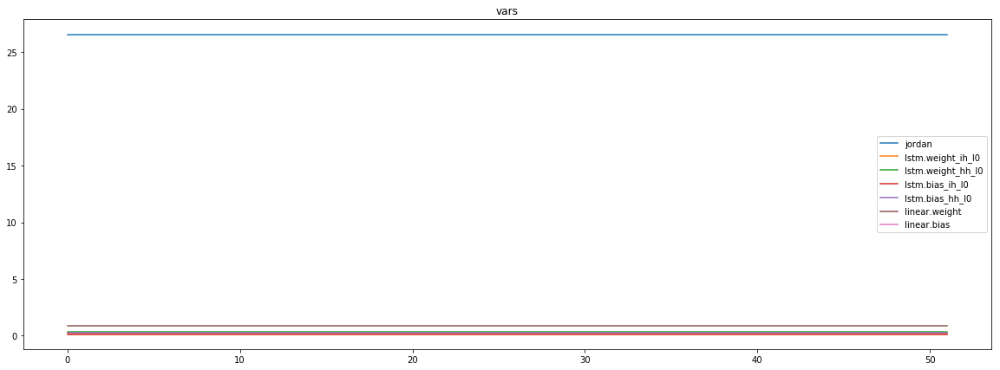

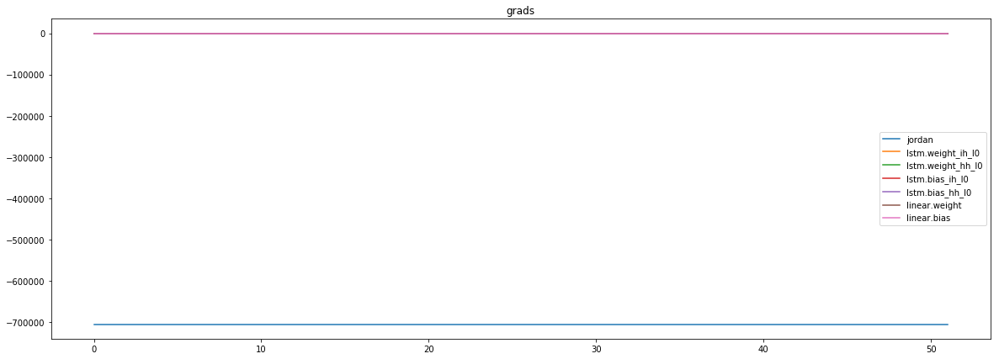

mean_p1 : -57651.6796875
mean_p2 : -641097.1875
mean_p3 : -7180.3818359375


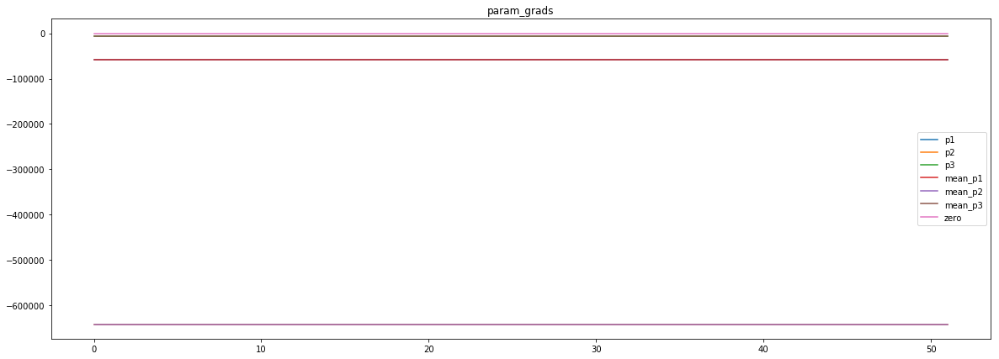

loss rate [-0.04303762511462961]
Epoch [38] 
     train_loss[6111.3820566030645] 
     eval_train[0.02319325630476389] 
     eval_test[0.023773291955545905]



aux preds: 0.44960302114486694           1.0047051906585693           9.707429885864258
main loss 0.0
aux loss 0.0
jord loss 5938.478154109074
combined loss 5938.478154109074 



Parameter containing:
tensor([[0.4496, 1.0047, 9.7074]], requires_grad=True)


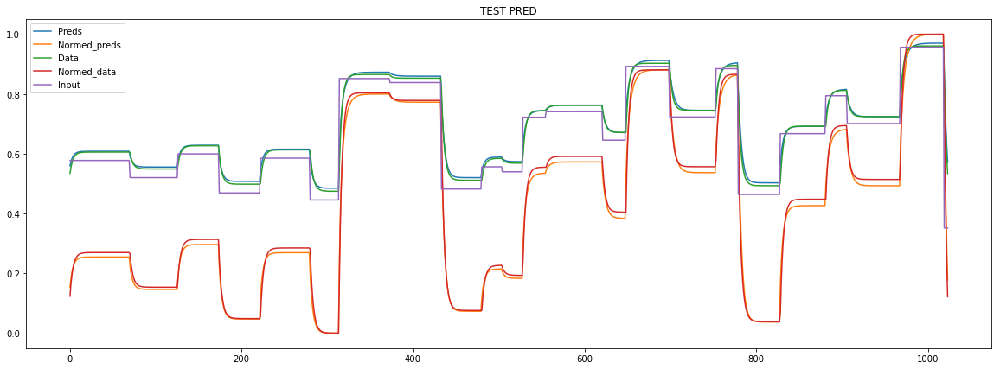

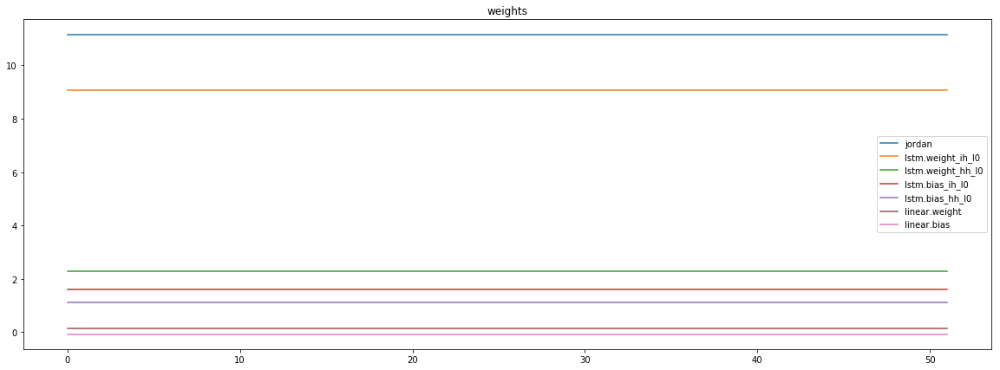

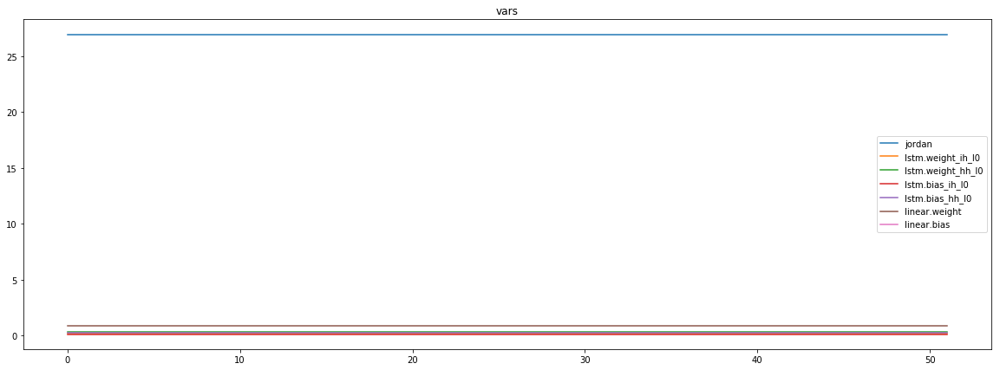

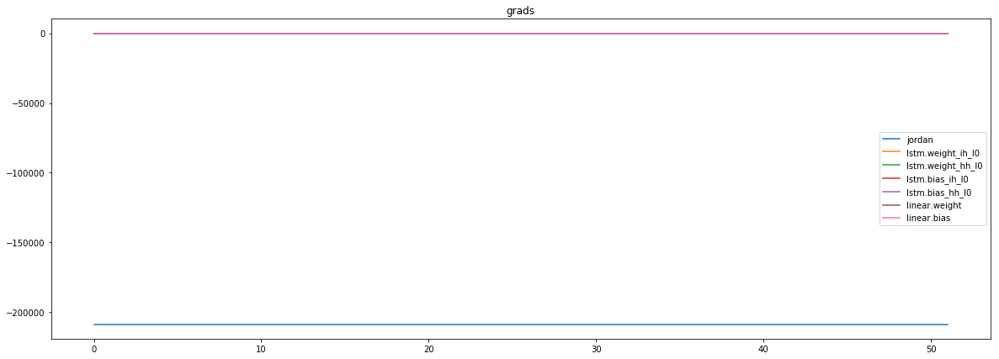

mean_p1 : -3431.55126953125
mean_p2 : -201644.53125
mean_p3 : -3423.026123046875


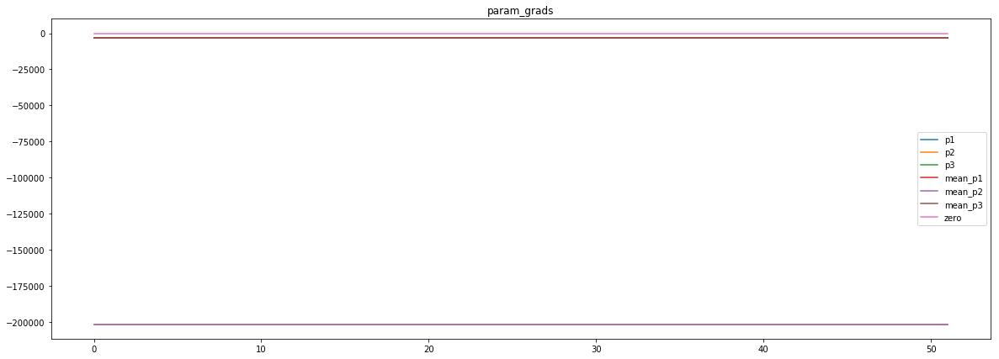

loss rate [-0.1458652981138524]
Epoch [39] 
     train_loss[5938.478154109074] 
     eval_train[0.025588566351591277] 
     eval_test[0.0261786346305929]



aux preds: 0.45076674222946167           1.003404974937439           9.766622543334961
main loss 0.0
aux loss 0.0
jord loss 6210.070739746094
combined loss 6210.070739746094 



Parameter containing:
tensor([[0.4508, 1.0034, 9.7666]], requires_grad=True)


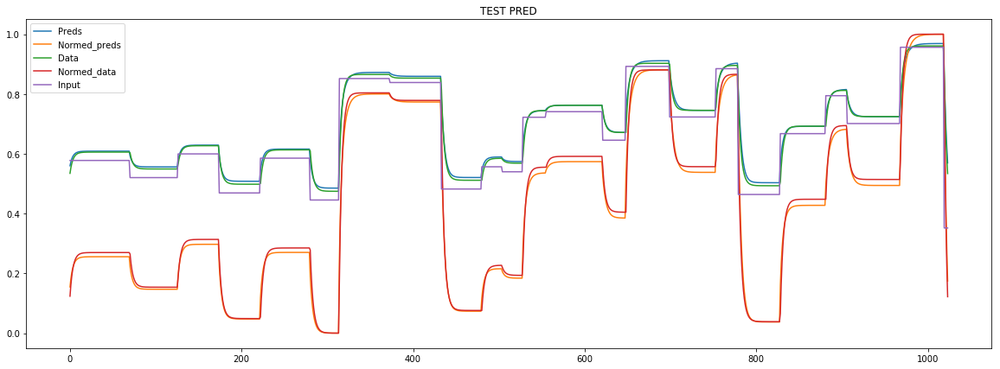

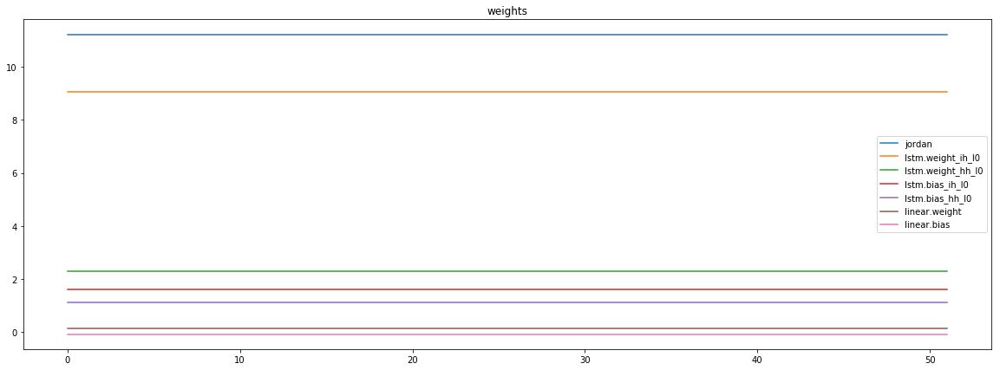

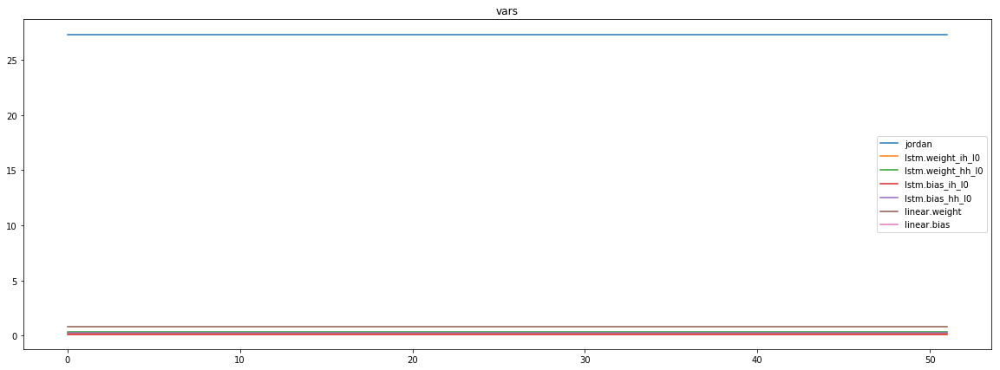

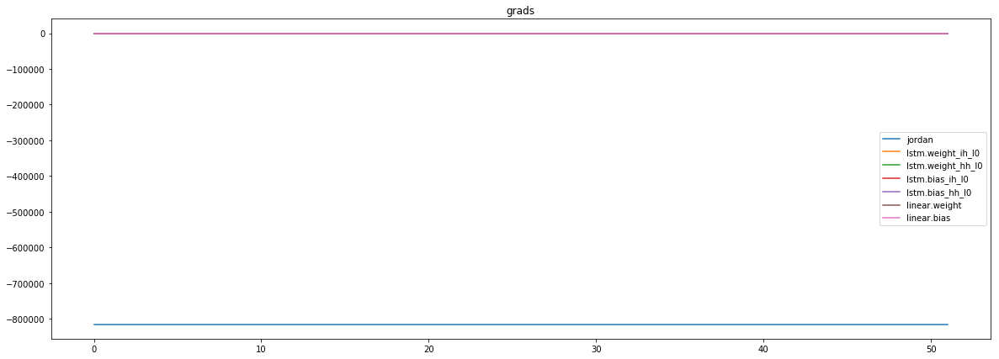

mean_p1 : 28257.259765625
mean_p2 : -834587.3125
mean_p3 : -8457.3642578125


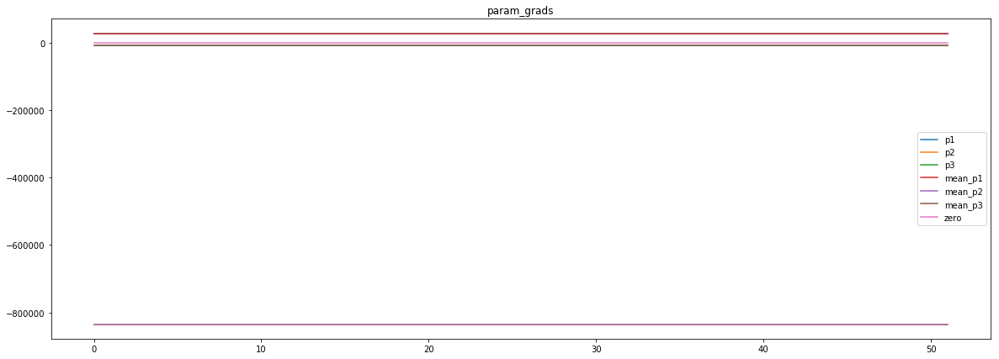

loss rate [-0.034986017475267195]
Epoch [40] 
     train_loss[6210.070739746094] 
     eval_train[0.02443815771542946] 
     eval_test[0.024965273394297004]



aux preds: 0.45057690143585205           1.002405047416687           9.78874397277832
main loss 0.0
aux loss 0.0
jord loss 5988.485600398137
combined loss 5988.485600398137 



Parameter containing:
tensor([[0.4506, 1.0024, 9.7887]], requires_grad=True)


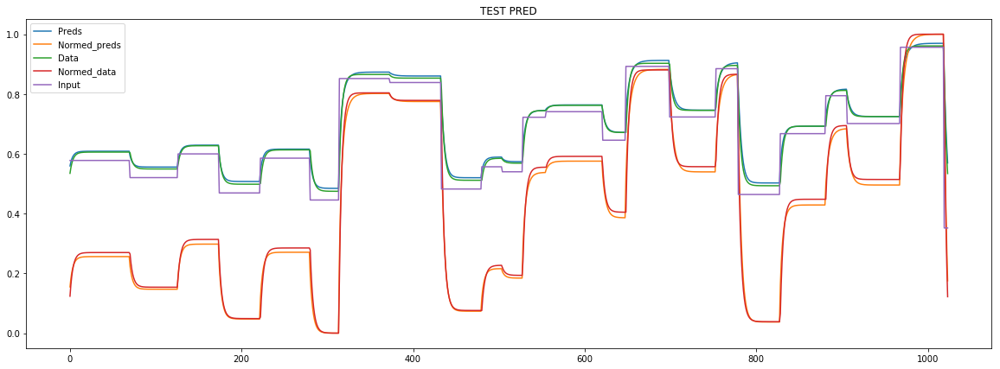

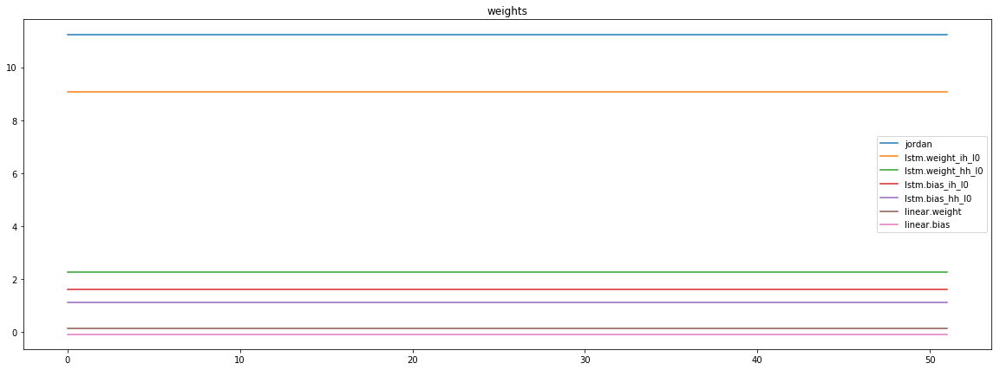

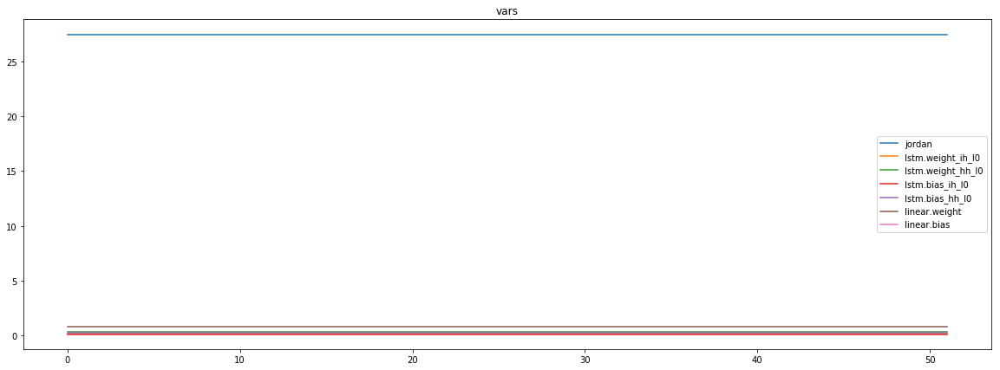

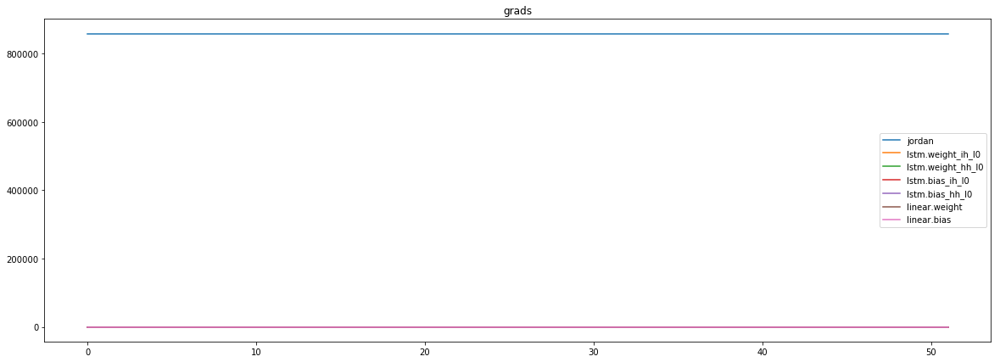

mean_p1 : -35172.12109375
mean_p2 : 885463.9375
mean_p3 : 8849.5927734375


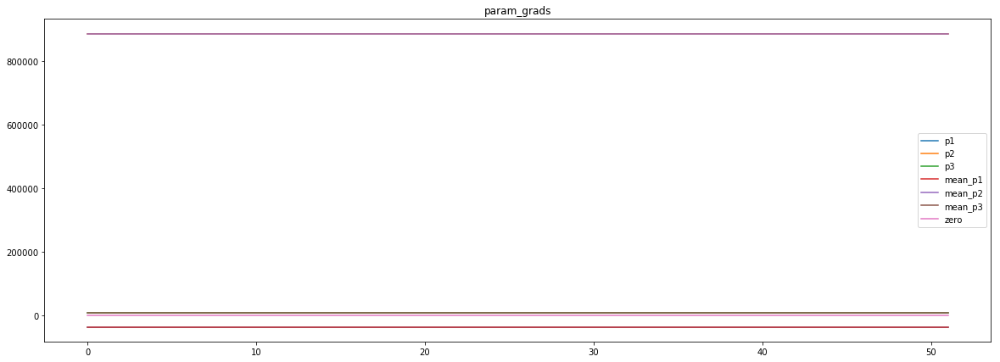

loss rate [0.034176356820703524]
Epoch [41] 
     train_loss[5988.485600398137] 
     eval_train[0.023564446330895477] 
     eval_test[0.024118934340632142]



aux preds: 0.4462589919567108           1.000839352607727           9.821866035461426
main loss 0.0
aux loss 0.0
jord loss 6139.841810960036
combined loss 6139.841810960036 



Parameter containing:
tensor([[0.4463, 1.0008, 9.8219]], requires_grad=True)


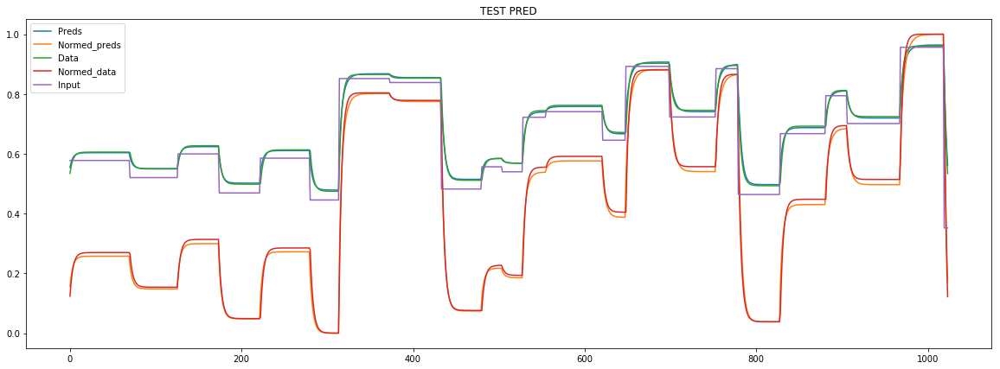

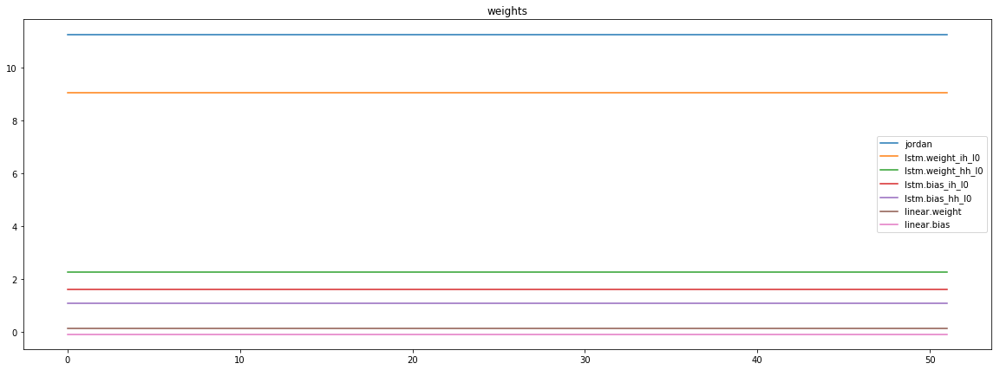

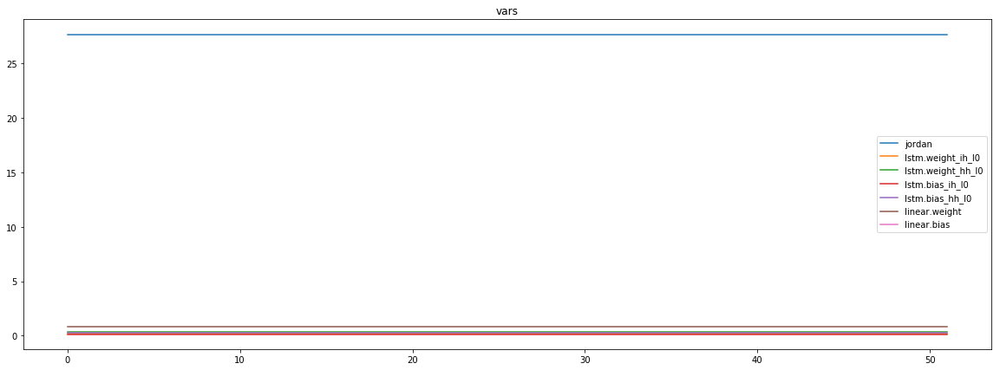

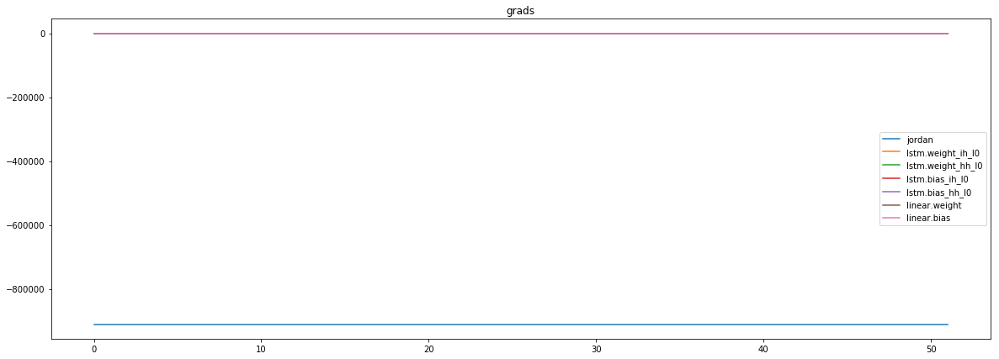

mean_p1 : -15819.3388671875
mean_p2 : -885776.75
mean_p3 : -8841.271484375


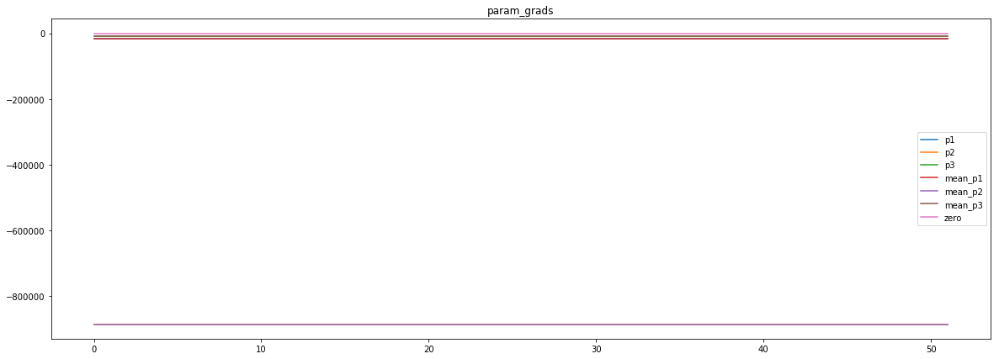

loss rate [0.1520402952064972]
Epoch [42] 
     train_loss[6139.841810960036] 
     eval_train[0.020983794602915835] 
     eval_test[0.02127328586472934]



aux preds: 0.44810664653778076           1.0022143125534058           9.845355033874512
main loss 0.0
aux loss 0.0
jord loss 6133.9187246469355
combined loss 6133.9187246469355 



Parameter containing:
tensor([[0.4481, 1.0022, 9.8454]], requires_grad=True)


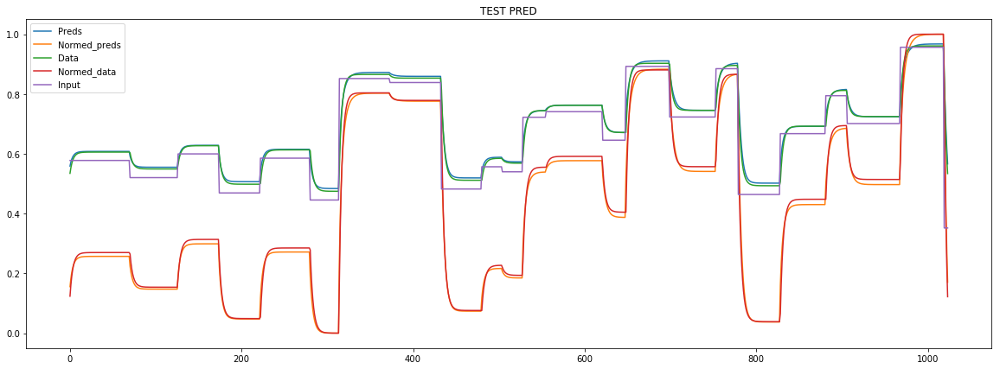

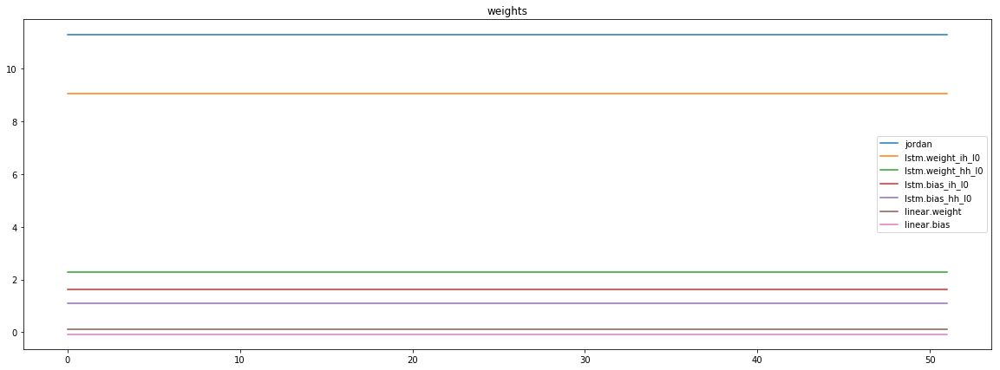

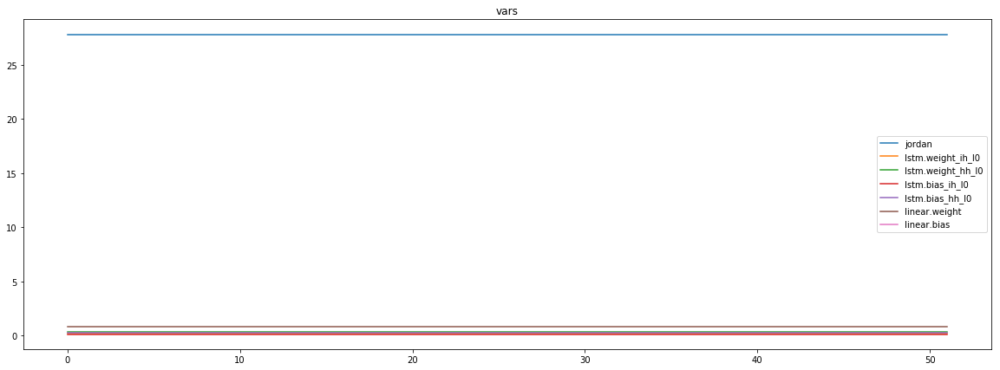

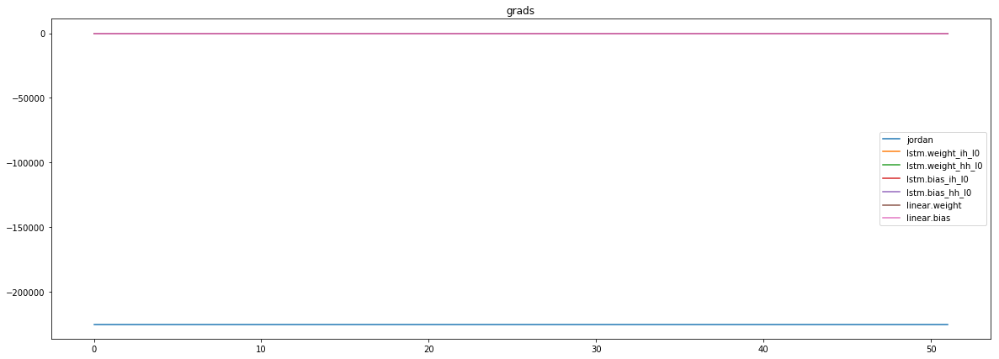

mean_p1 : 21405.84765625
mean_p2 : -242917.3125
mean_p3 : -3755.45263671875


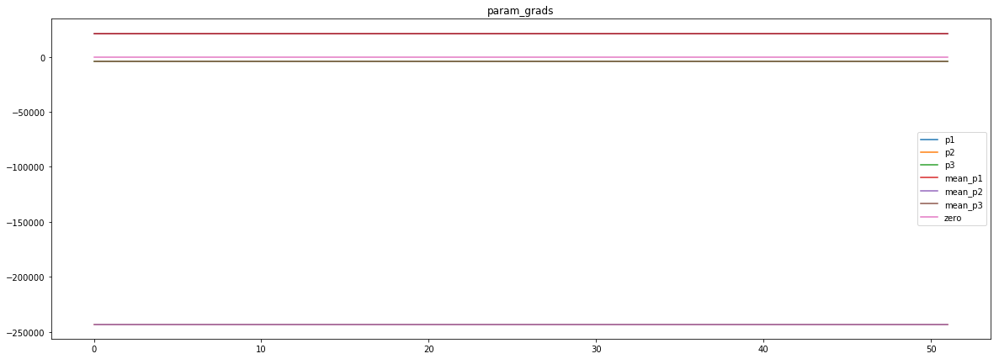

loss rate [-0.0010064871301851408]
Epoch [43] 
     train_loss[6133.9187246469355] 
     eval_train[0.02296059632037493] 
     eval_test[0.02347610250382621]



aux preds: 0.4498496949672699           1.0016162395477295           9.8577241897583
main loss 0.0
aux loss 0.0
jord loss 5890.0766038161055
combined loss 5890.0766038161055 



Parameter containing:
tensor([[0.4498, 1.0016, 9.8577]], requires_grad=True)


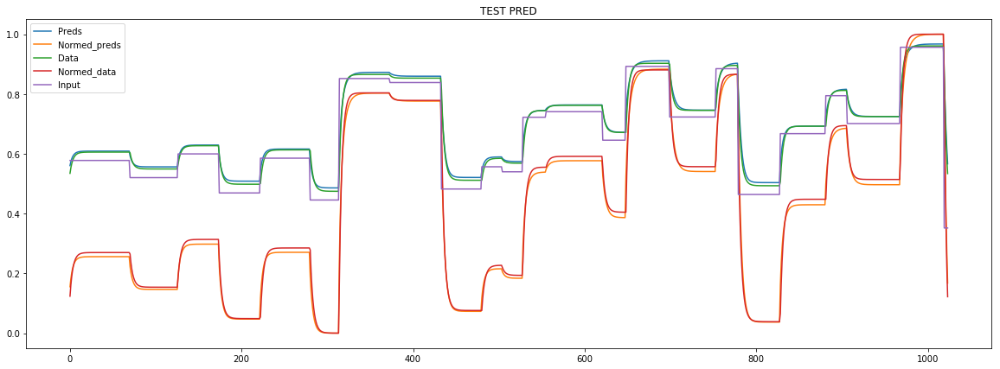

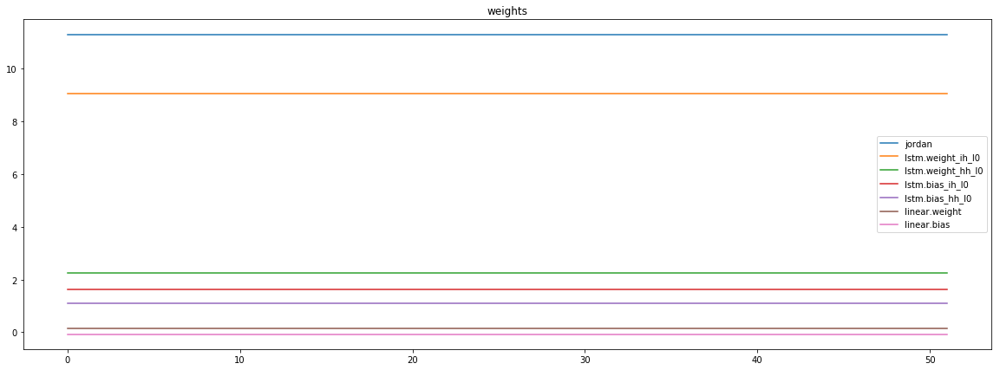

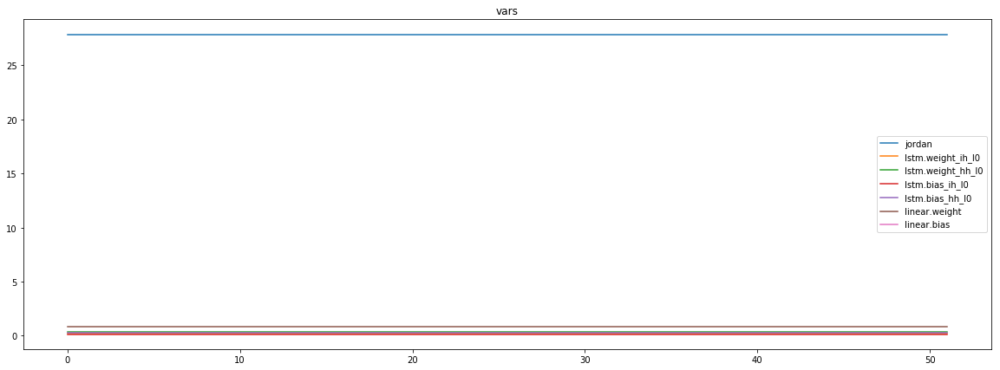

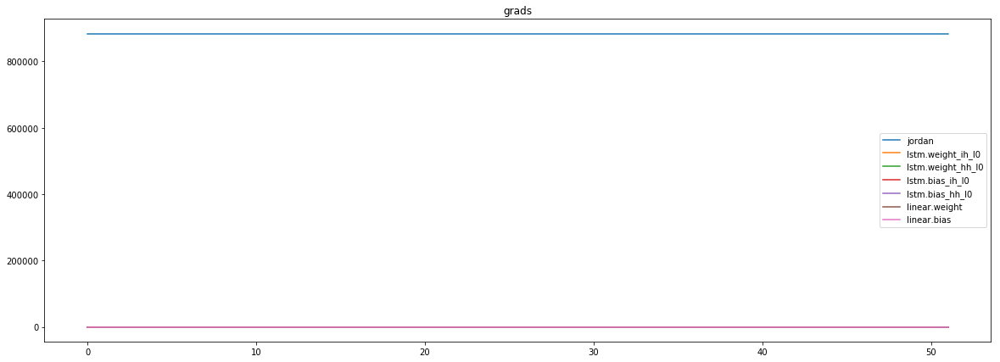

mean_p1 : -13133.6103515625
mean_p2 : 888295.375
mean_p3 : 8951.8916015625


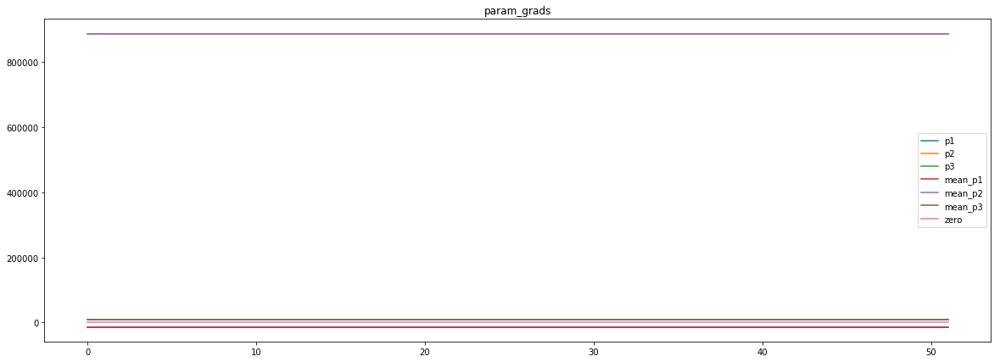

loss rate [-0.05515555517917958]
Epoch [44] 
     train_loss[5890.0766038161055] 
     eval_train[0.023859825554469492] 
     eval_test[0.024222264427490613]



aux preds: 0.4455223083496094           1.0017184019088745           9.877286911010742
main loss 0.0
aux loss 0.0
jord loss 5908.59779710036
combined loss 5908.59779710036 



Parameter containing:
tensor([[0.4455, 1.0017, 9.8773]], requires_grad=True)


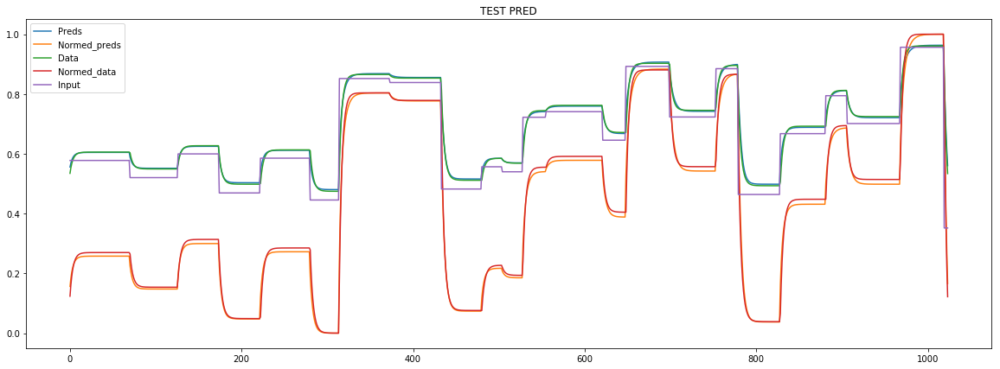

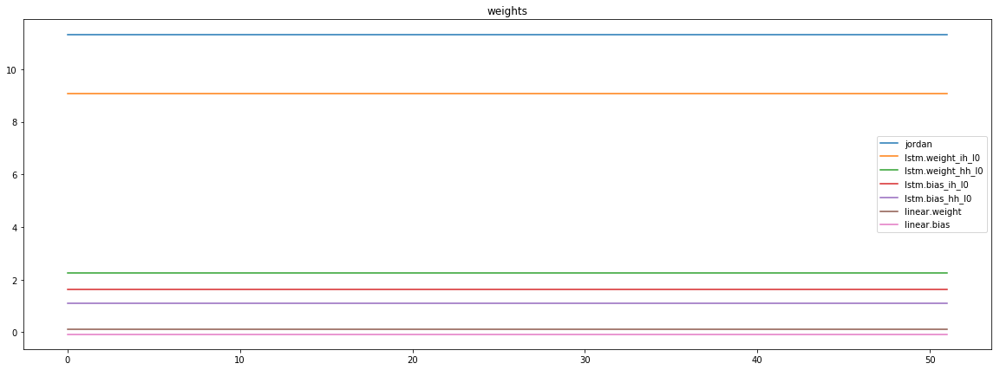

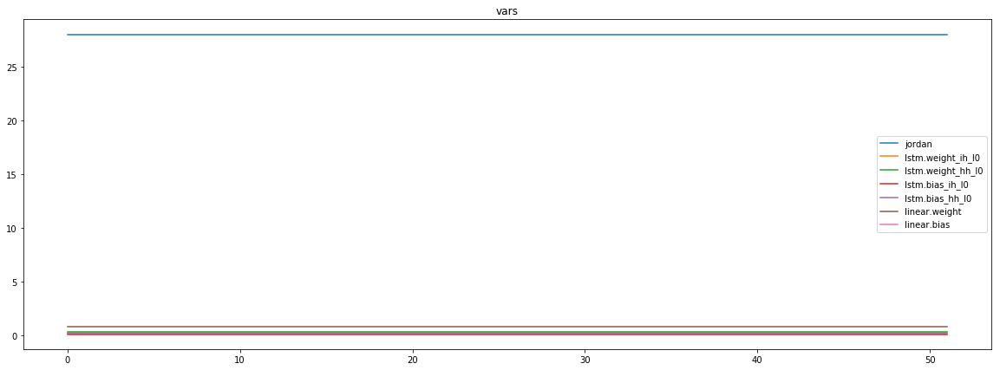

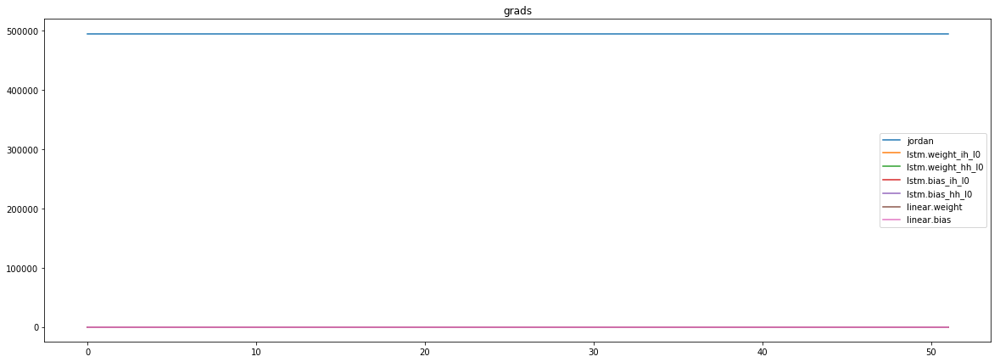

mean_p1 : 26145.125
mean_p2 : 465114.0
mean_p3 : 3934.111083984375


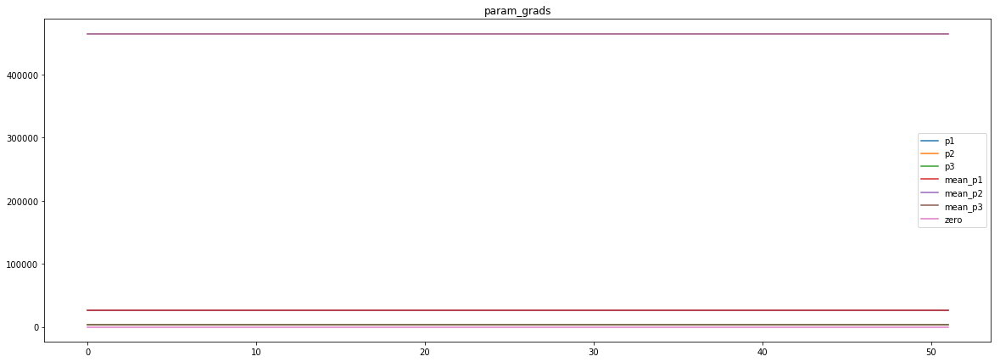

loss rate [0.0862130231879289]
Epoch [45] 
     train_loss[5908.59779710036] 
     eval_train[0.020655380102163272] 
     eval_test[0.021008466031410288]



aux preds: 0.44826140999794006           1.0005055665969849           9.8803071975708
main loss 0.0
aux loss 0.0
jord loss 5929.839393028846
combined loss 5929.839393028846 



Parameter containing:
tensor([[0.4483, 1.0005, 9.8803]], requires_grad=True)


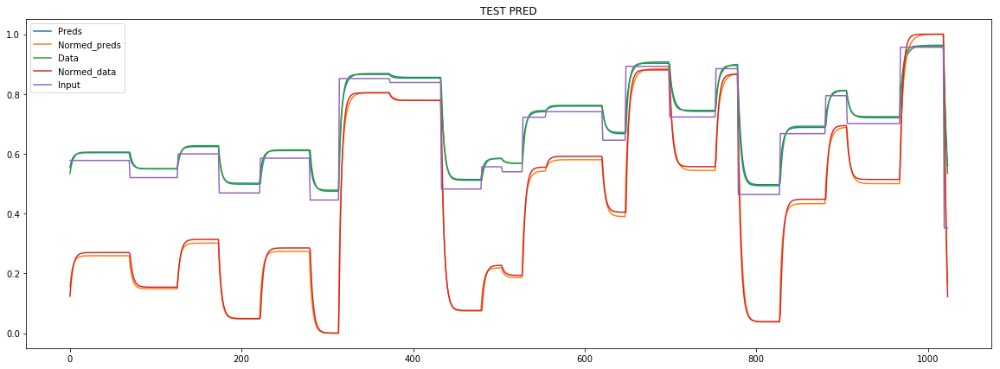

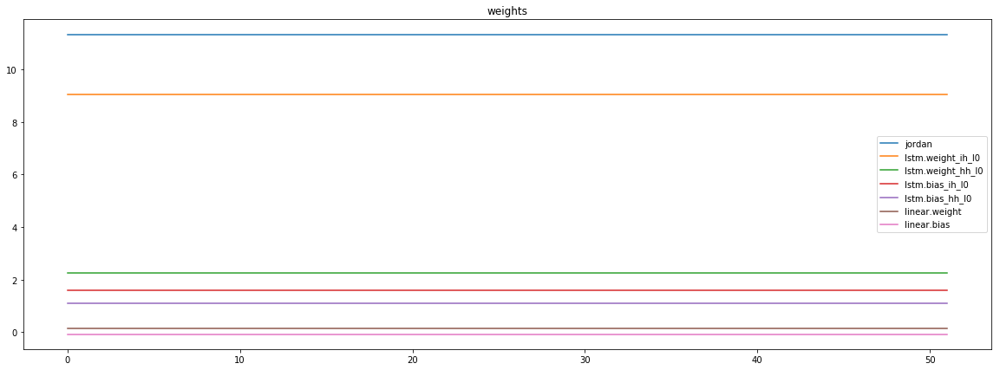

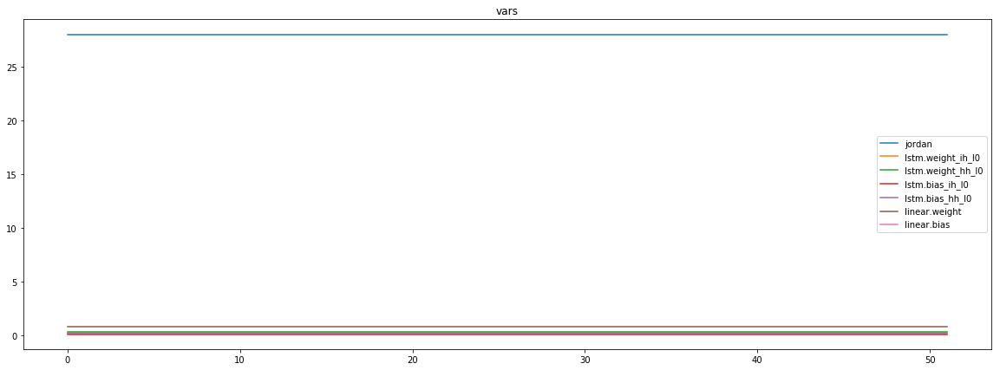

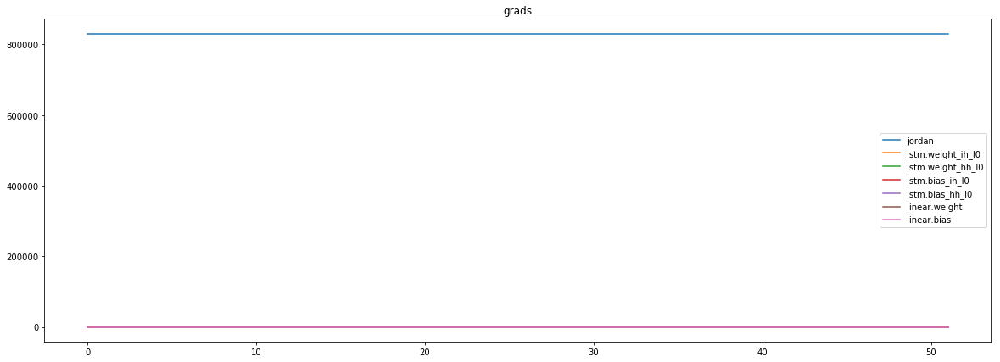

mean_p1 : 22065.46875
mean_p2 : 800776.8125
mean_p3 : 8119.95751953125


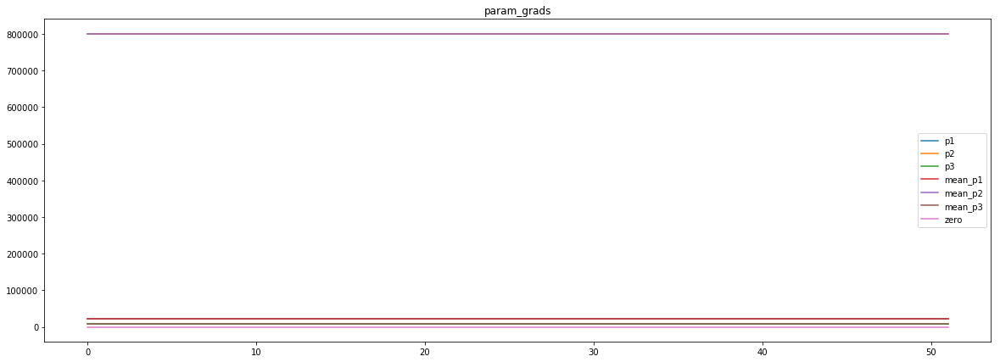

loss rate [0.10006726080778916]
Epoch [46] 
     train_loss[5929.839393028846] 
     eval_train[0.020290978424012653] 
     eval_test[0.020610509463122897]



aux preds: 0.44696465134620667           0.9994332194328308           9.895817756652832
main loss 0.0
aux loss 0.0
jord loss 5963.101797250601
combined loss 5963.101797250601 



Parameter containing:
tensor([[0.4470, 0.9994, 9.8958]], requires_grad=True)


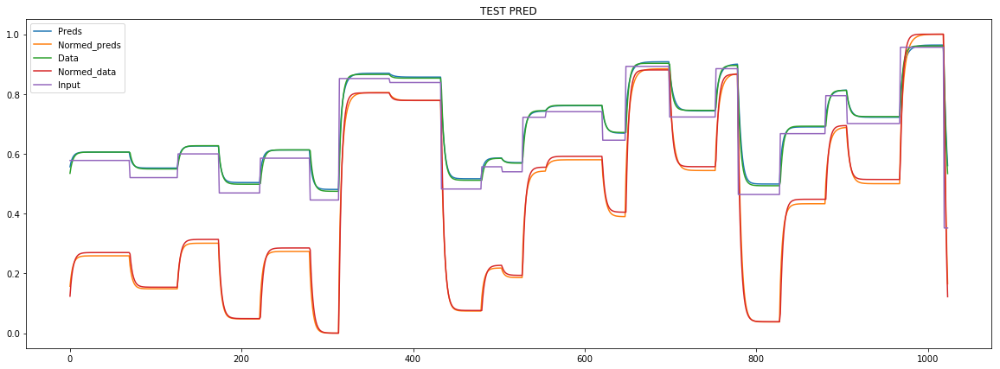

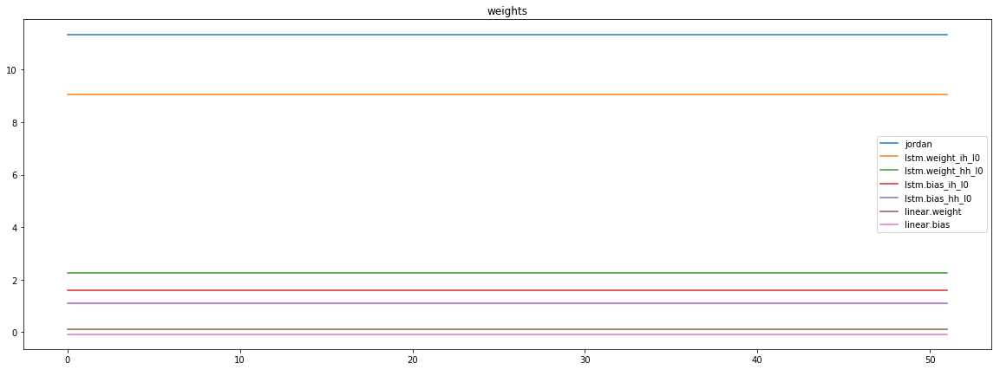

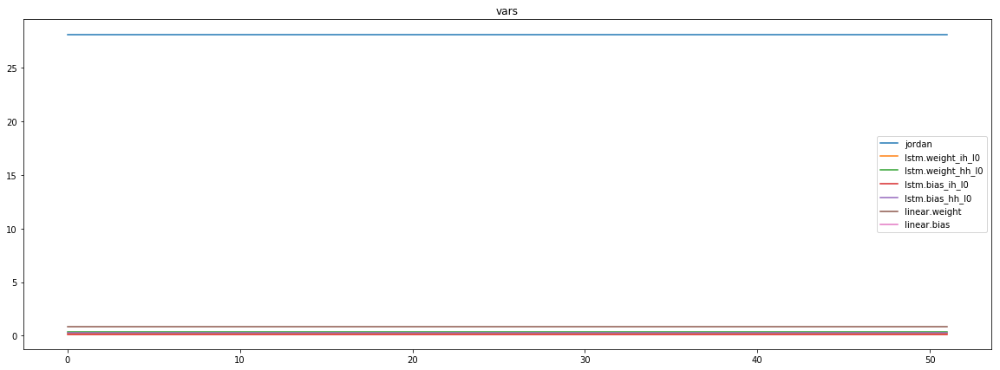

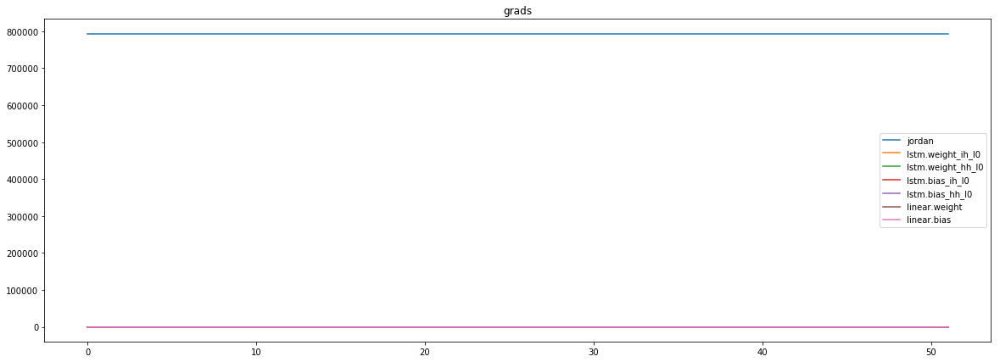

mean_p1 : -62795.38671875
mean_p2 : 848179.5625
mean_p3 : 8464.3134765625


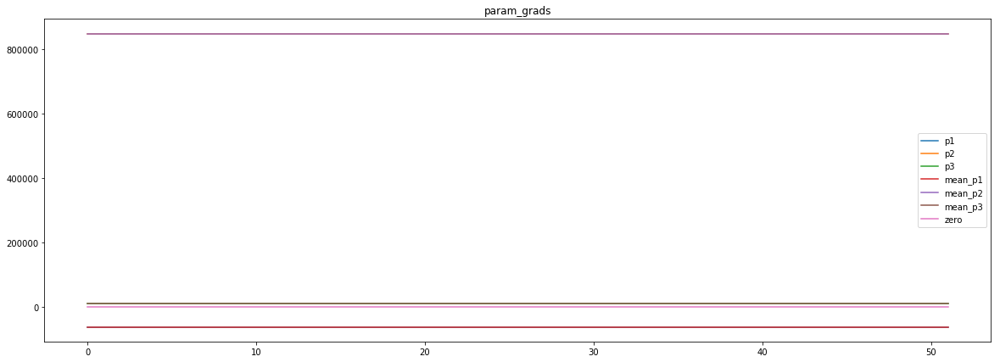

loss rate [0.01459210214923512]
Epoch [47] 
     train_loss[5963.101797250601] 
     eval_train[0.02125350811568821] 
     eval_test[0.02162682594114978]



aux preds: 0.44835779070854187           0.9992929697036743           9.897992134094238
main loss 0.0
aux loss 0.0
jord loss 5968.330181415265
combined loss 5968.330181415265 



Parameter containing:
tensor([[0.4484, 0.9993, 9.8980]], requires_grad=True)


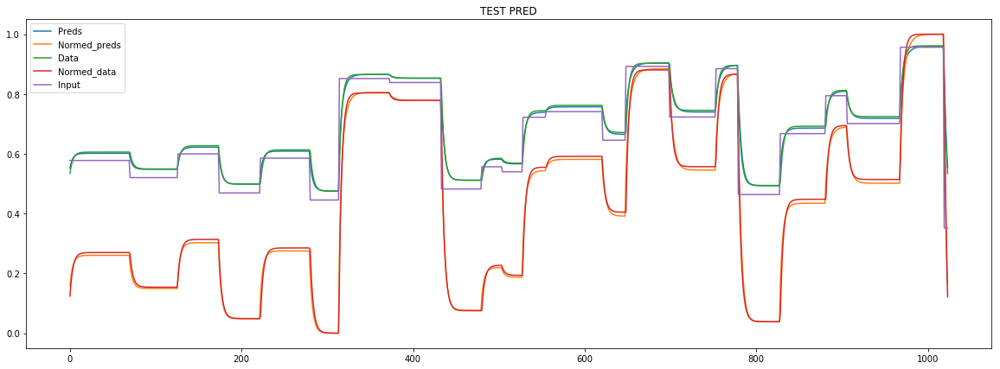

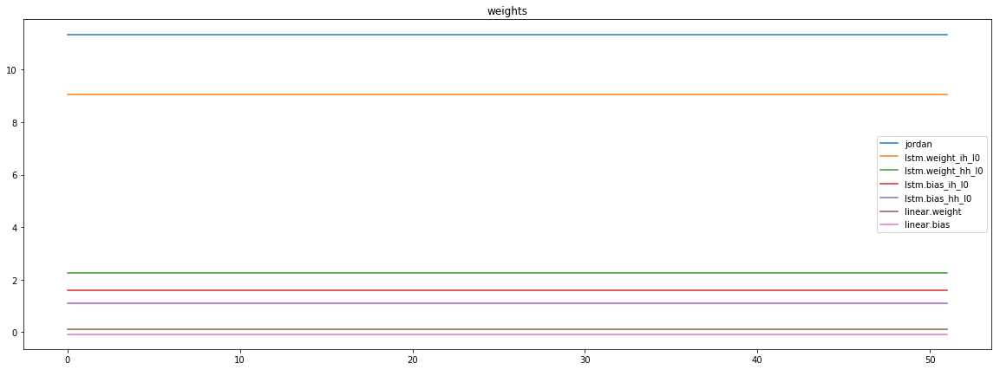

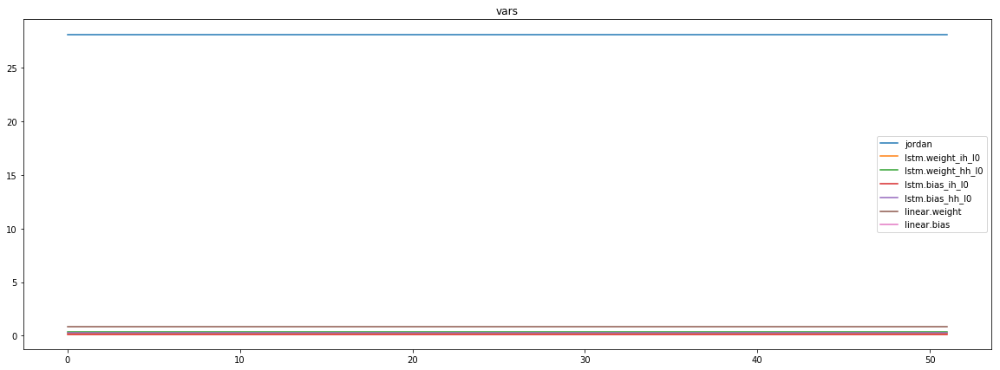

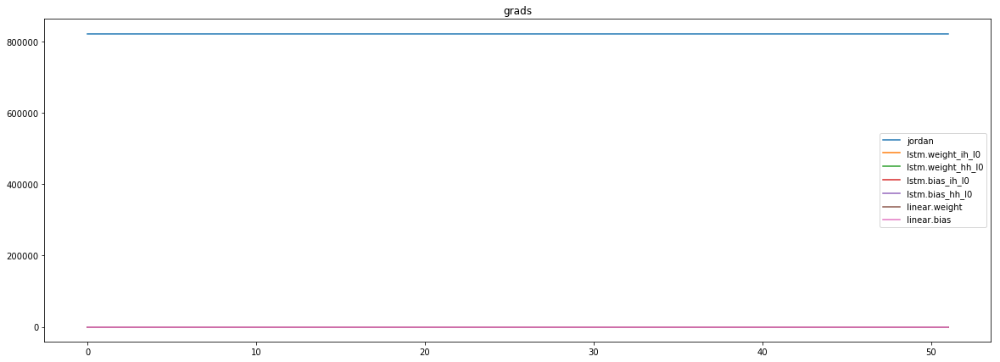

mean_p1 : 12657.228515625
mean_p2 : 802417.1875
mean_p3 : 8139.79345703125


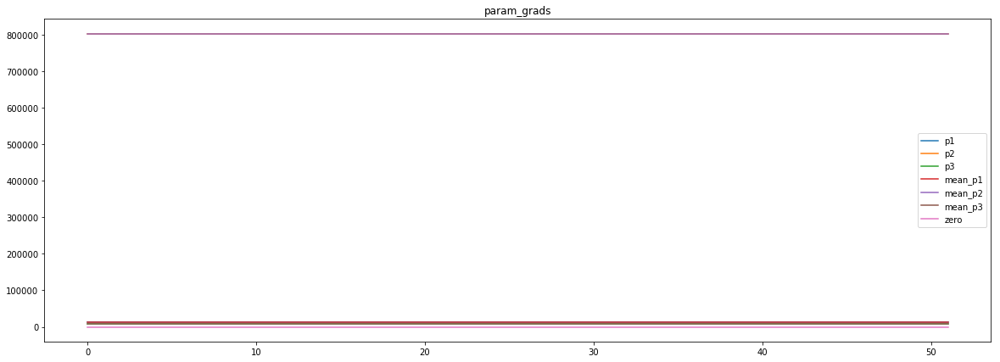

loss rate [-0.07378192787927218]
Epoch [48] 
     train_loss[5968.330181415265] 
     eval_train[0.022492625735279805] 
     eval_test[0.02263739953195909]



aux preds: 0.44904711842536926           0.9996694922447205           9.908557891845703
main loss 0.0
aux loss 0.0
jord loss 5944.827200082632
combined loss 5944.827200082632 



Parameter containing:
tensor([[0.4490, 0.9997, 9.9086]], requires_grad=True)


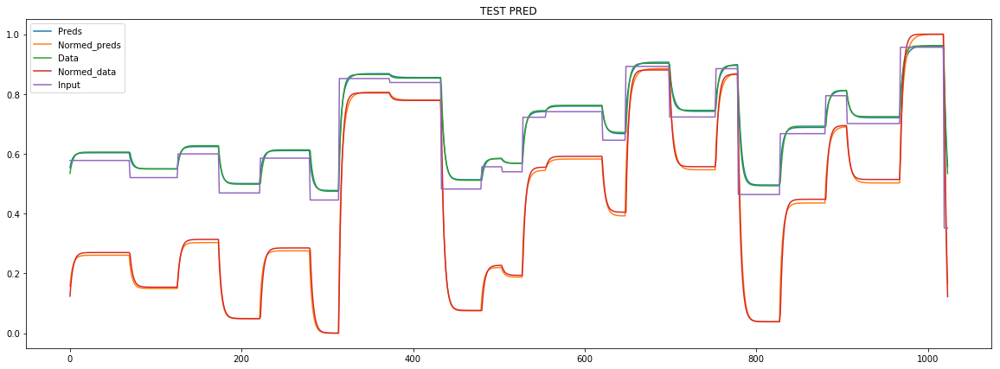

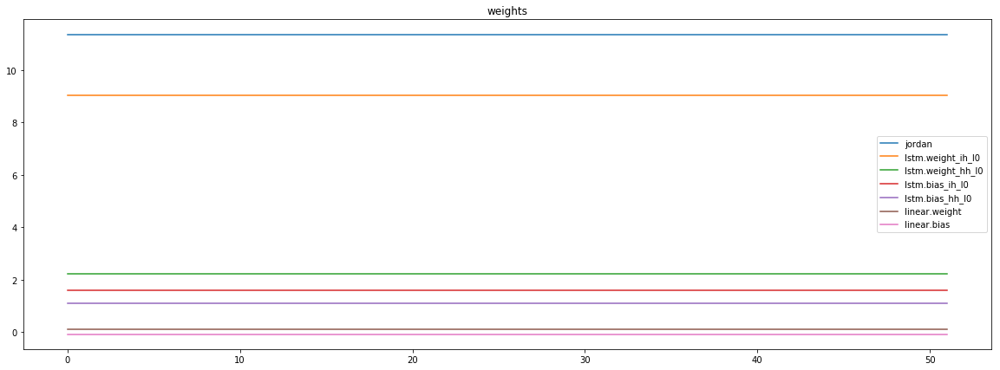

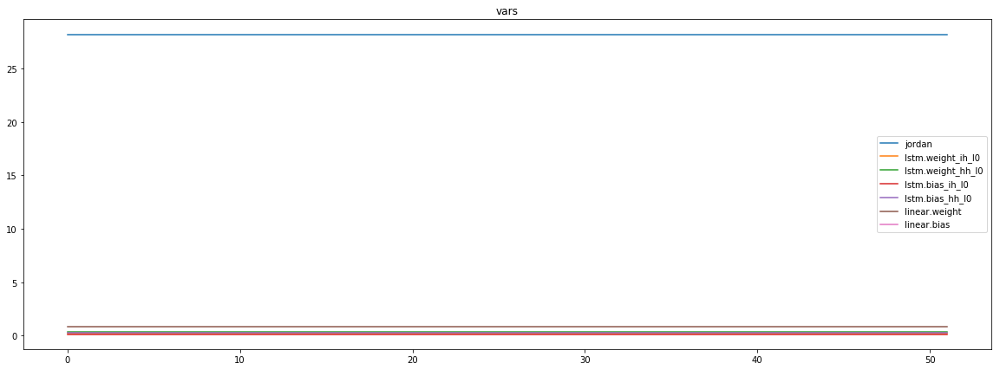

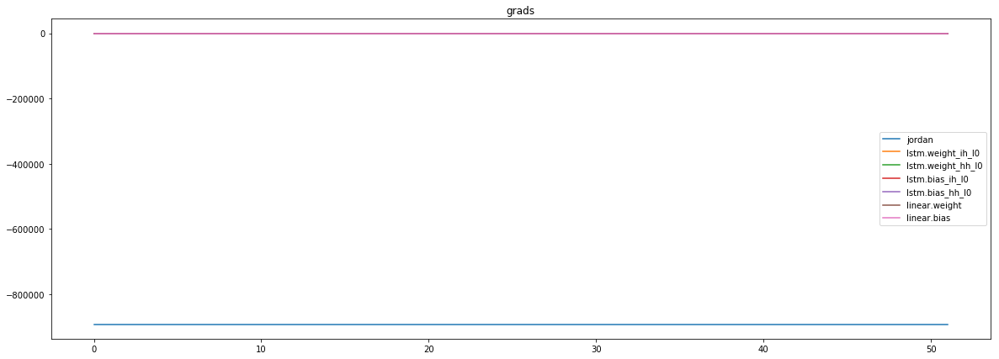

mean_p1 : -12199.947265625
mean_p2 : -871543.5
mean_p3 : -8705.248046875


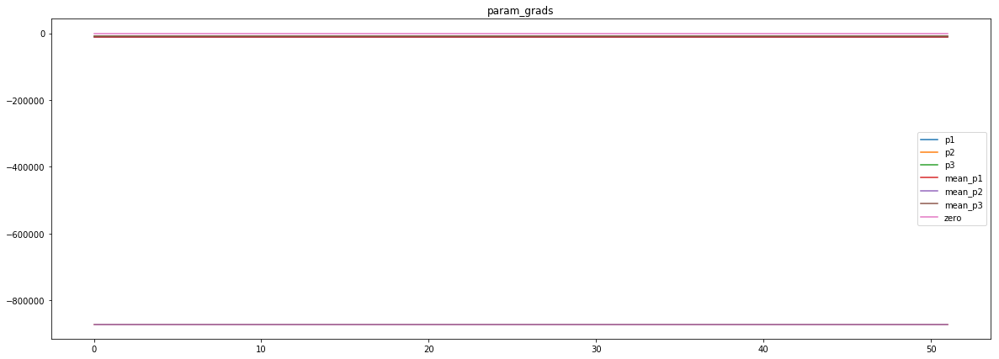

loss rate [0.031174515708216832]
Epoch [49] 
     train_loss[5944.827200082632] 
     eval_train[0.02067833297160877] 
     eval_test[0.020950765497631932]



aux preds: 0.4463781714439392           1.0011827945709229           9.922491073608398
main loss 0.0
aux loss 0.0
jord loss 5926.588909442608
combined loss 5926.588909442608 



Parameter containing:
tensor([[0.4464, 1.0012, 9.9225]], requires_grad=True)


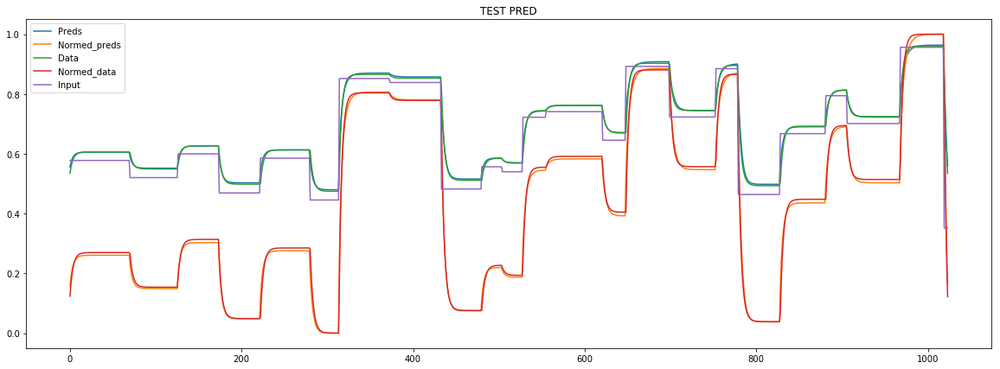

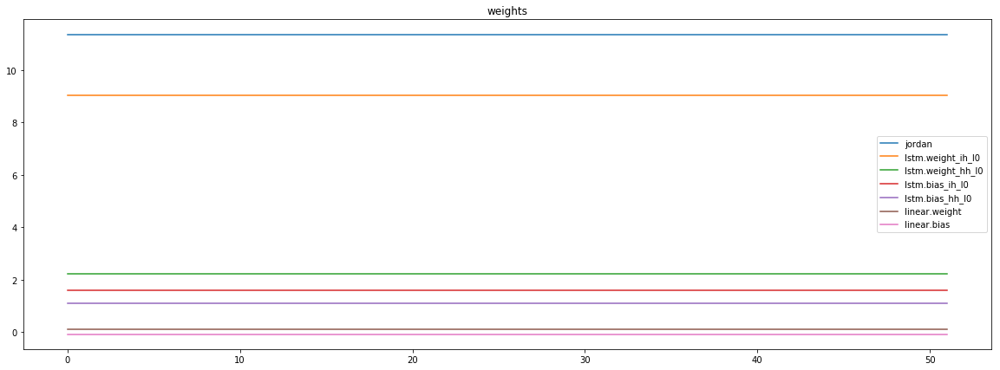

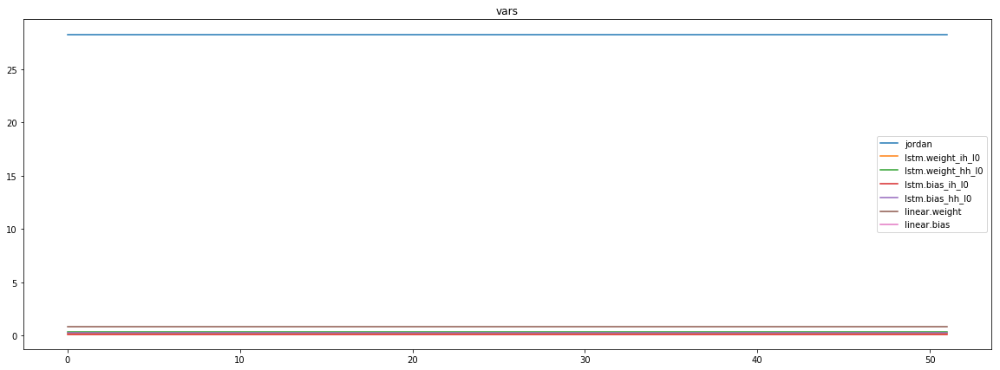

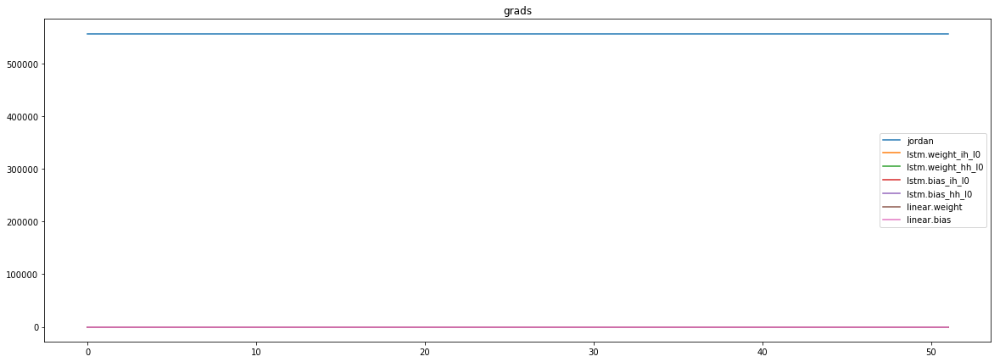

mean_p1 : 6873.15576171875
mean_p2 : 544640.75
mean_p3 : 4914.94970703125


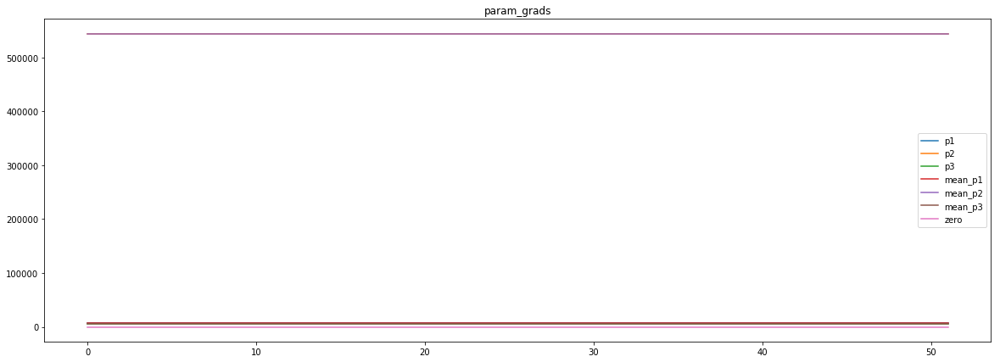

loss rate [0.05385376886234661]
Epoch [50] 
     train_loss[5926.588909442608] 
     eval_train[0.02018447781742557] 
     eval_test[0.020567639306880832]



aux preds: 0.4494319558143616           1.001145362854004           9.924277305603027
main loss 0.0
aux loss 0.0
jord loss 5915.0808668870195
combined loss 5915.0808668870195 



Parameter containing:
tensor([[0.4494, 1.0011, 9.9243]], requires_grad=True)


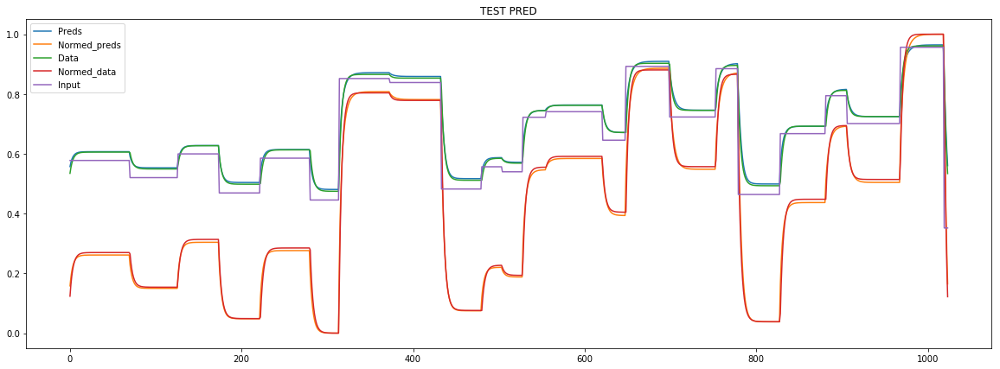

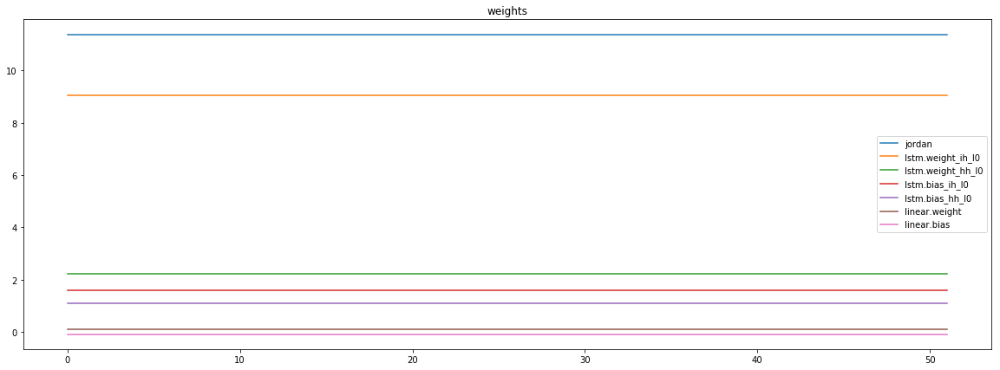

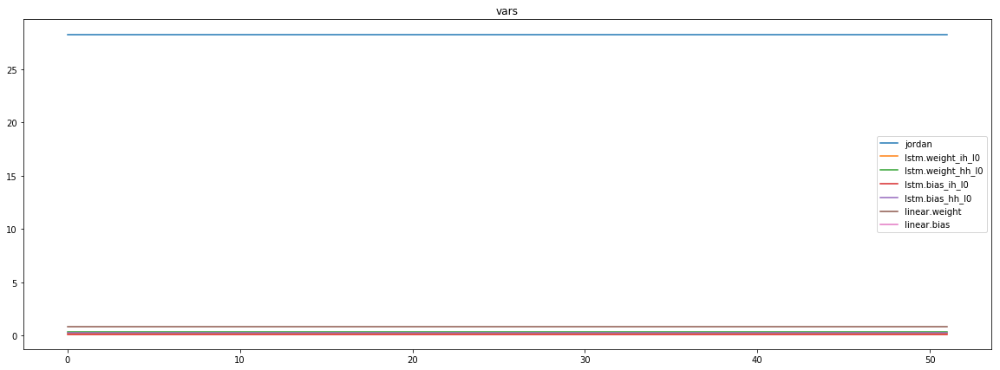

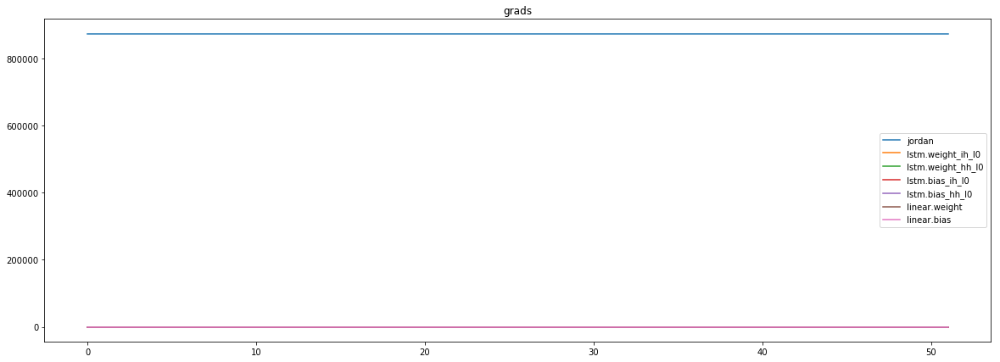

mean_p1 : -14967.2841796875
mean_p2 : 881455.75
mean_p3 : 8909.6416015625


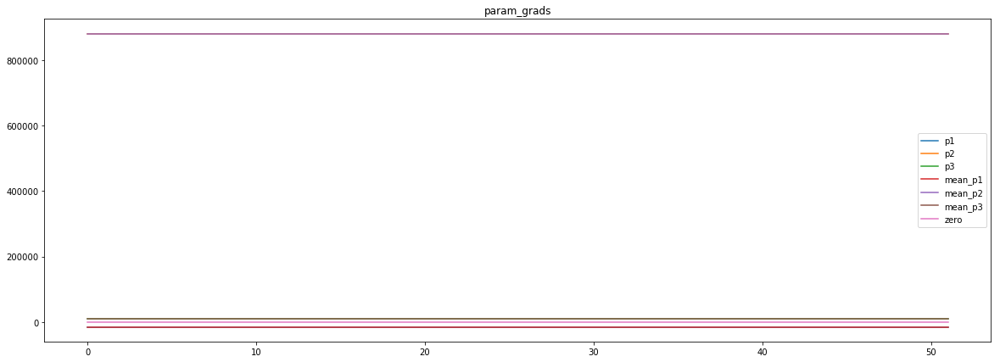

loss rate [-0.0025863039593849724]
Epoch [51] 
     train_loss[5915.0808668870195] 
     eval_train[0.020971566318901468] 
     eval_test[0.02144057691574827]



aux preds: 0.4485439658164978           1.0003774166107178           9.927693367004395
main loss 0.0
aux loss 0.0
jord loss 6167.965646597056
combined loss 6167.965646597056 



Parameter containing:
tensor([[0.4485, 1.0004, 9.9277]], requires_grad=True)


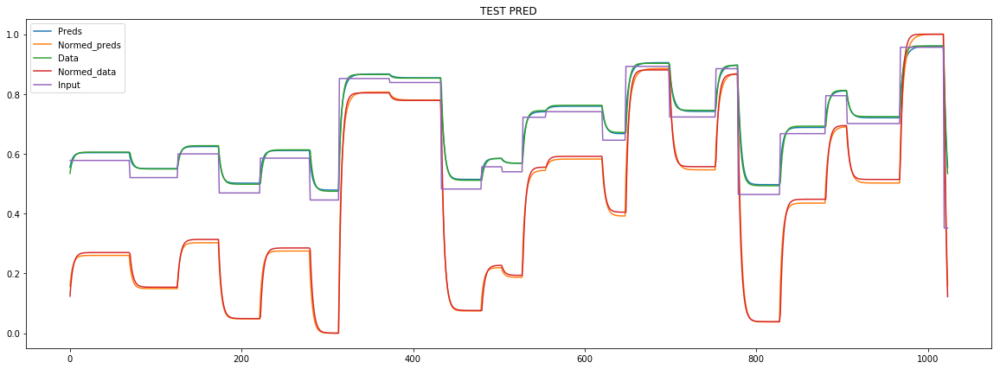

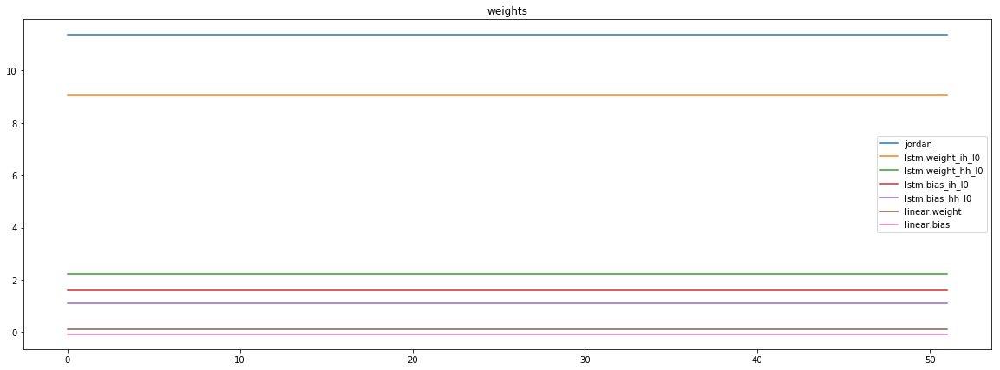

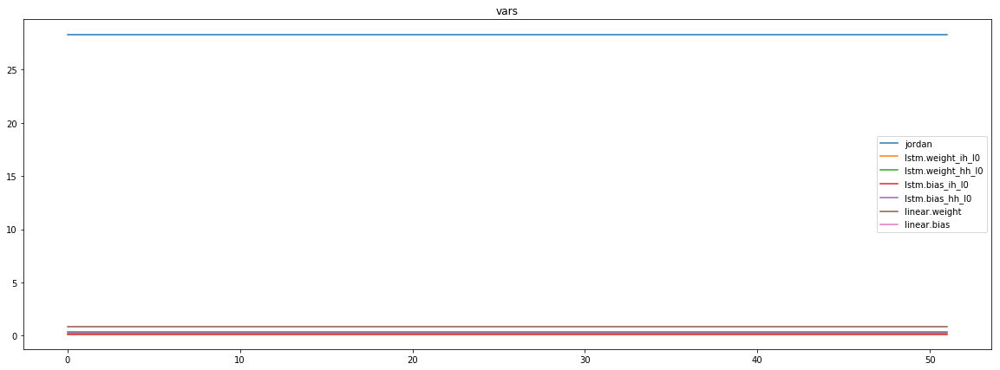

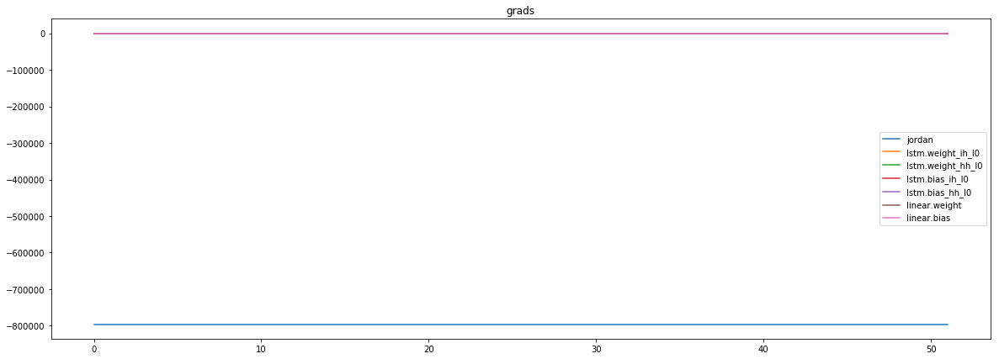

mean_p1 : 19929.017578125
mean_p2 : -807299.125
mean_p3 : -8156.7646484375


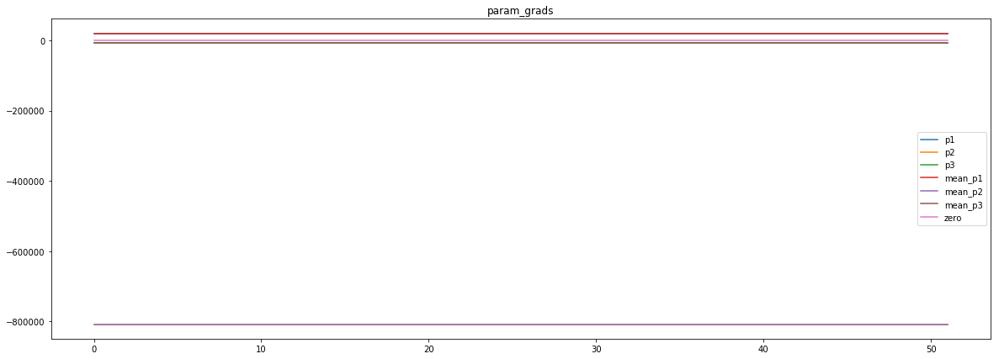

loss rate [0.032708328003471676]
Epoch [52] 
     train_loss[6167.965646597056] 
     eval_train[0.020022889933408387] 
     eval_test[0.02029989956513005]



aux preds: 0.44867169857025146           1.0009618997573853           9.937597274780273
main loss 0.0
aux loss 0.0
jord loss 5964.385732797476
combined loss 5964.385732797476 



Parameter containing:
tensor([[0.4487, 1.0010, 9.9376]], requires_grad=True)


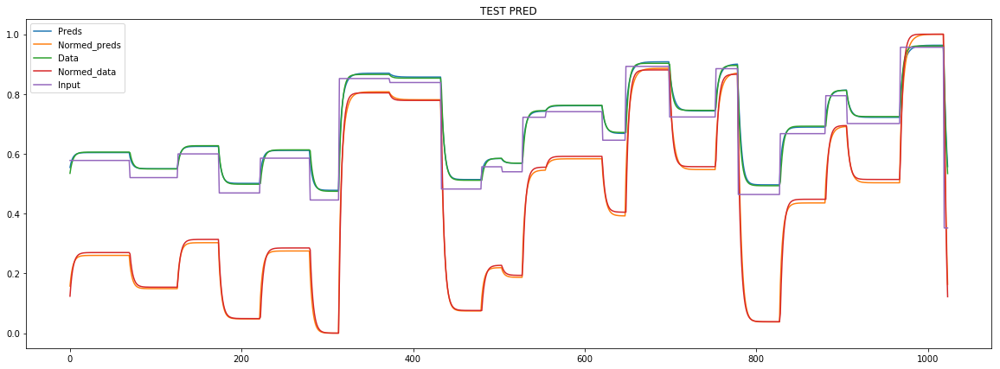

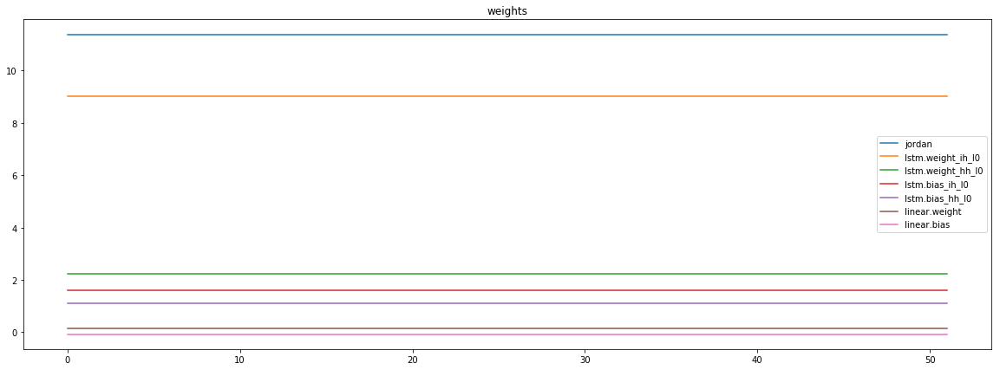

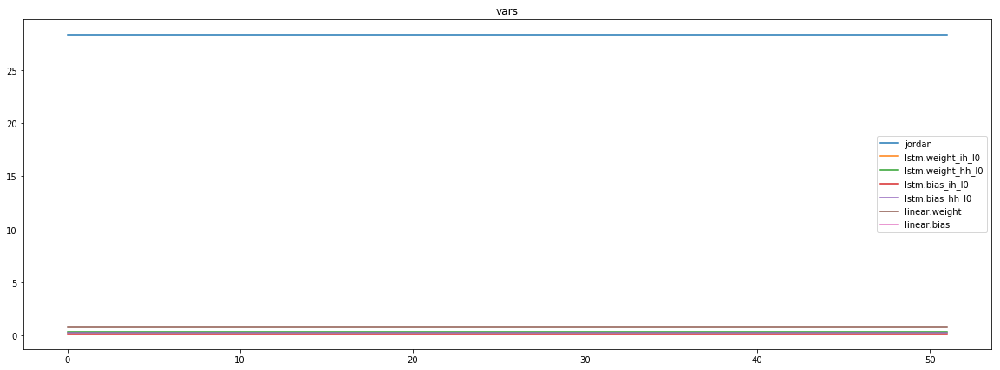

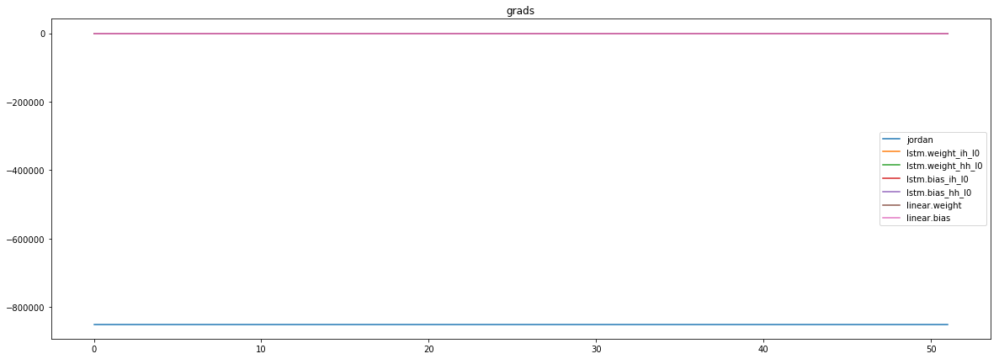

mean_p1 : 5047.47314453125
mean_p2 : -846430.625
mean_p3 : -8501.22265625


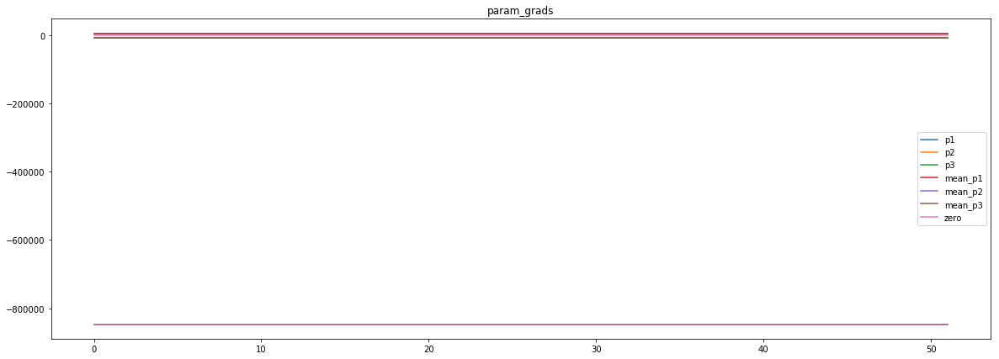

loss rate [0.034804395838227475]
Epoch [53] 
     train_loss[5964.385732797476] 
     eval_train[0.019708014571034046] 
     eval_test[0.020046506487315954]



aux preds: 0.4477423131465912           0.9979344606399536           9.940892219543457
main loss 0.0
aux loss 0.0
jord loss 6261.956819974459
combined loss 6261.956819974459 



Parameter containing:
tensor([[0.4477, 0.9979, 9.9409]], requires_grad=True)


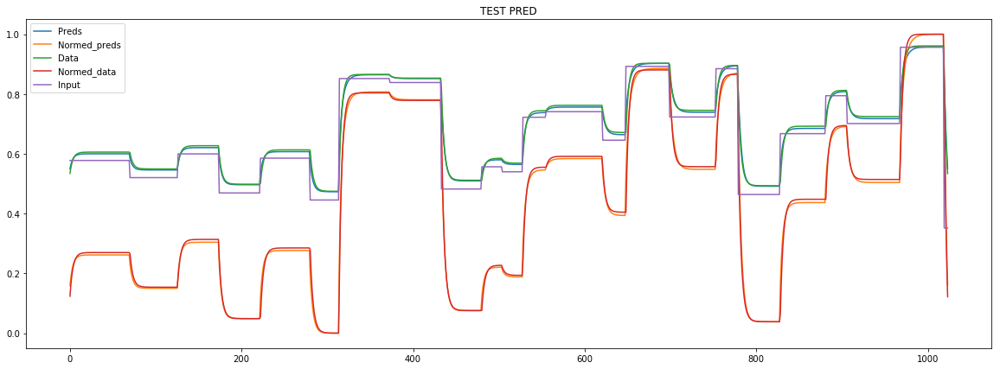

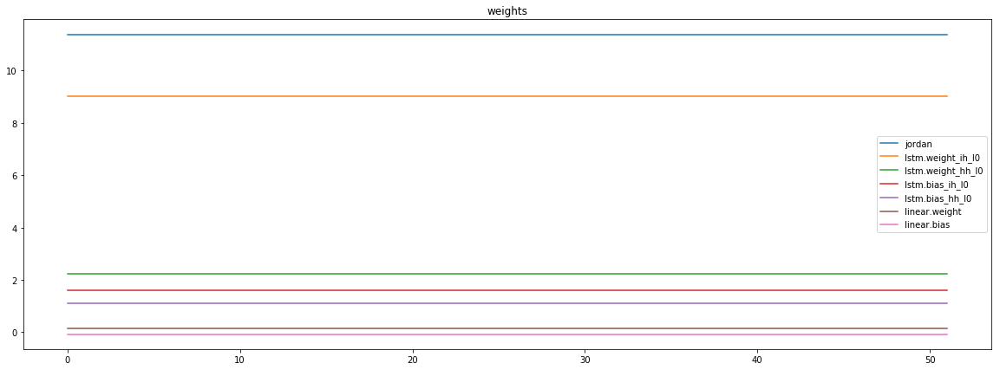

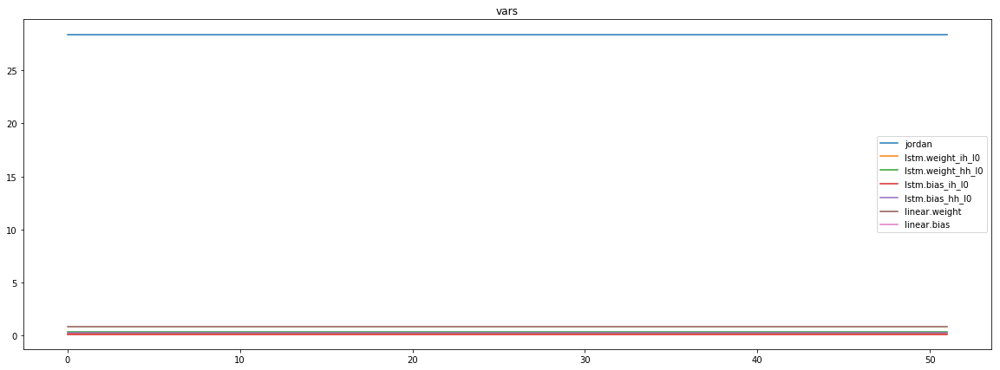

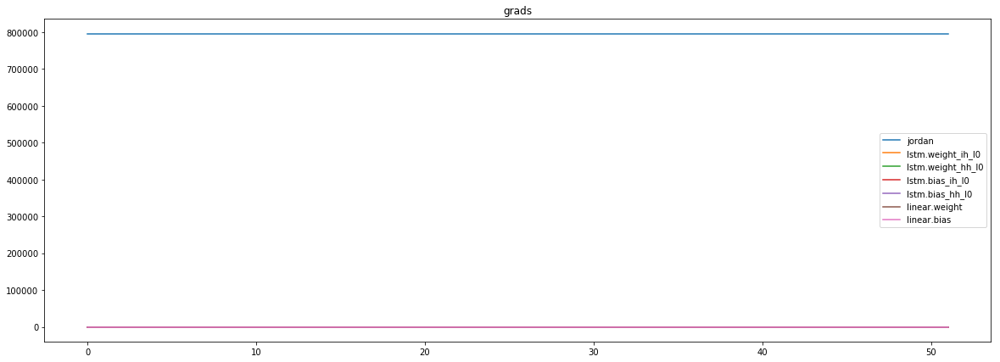

mean_p1 : -54579.90625
mean_p2 : 842013.25
mean_p3 : 8389.958984375


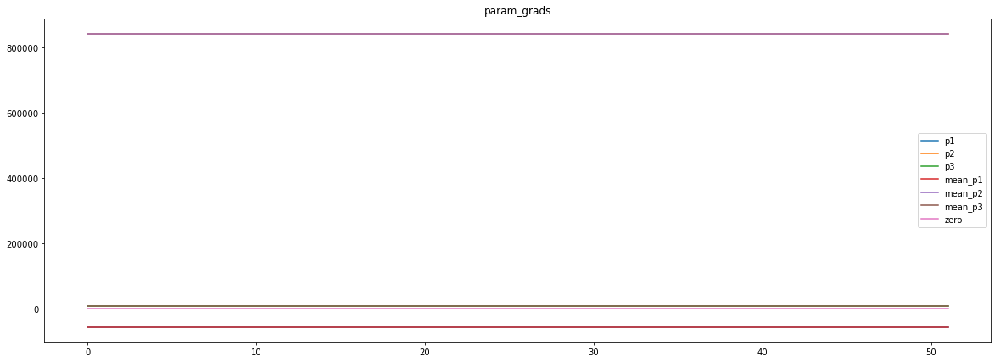

loss rate [-0.25748867324852864]
Epoch [54] 
     train_loss[6261.956819974459] 
     eval_train[0.02579949359362497] 
     eval_test[0.02589881041223469]



aux preds: 0.44930440187454224           1.0001837015151978           9.944125175476074
main loss 0.0
aux loss 0.0
jord loss 6116.568495530349
combined loss 6116.568495530349 



Parameter containing:
tensor([[0.4493, 1.0002, 9.9441]], requires_grad=True)


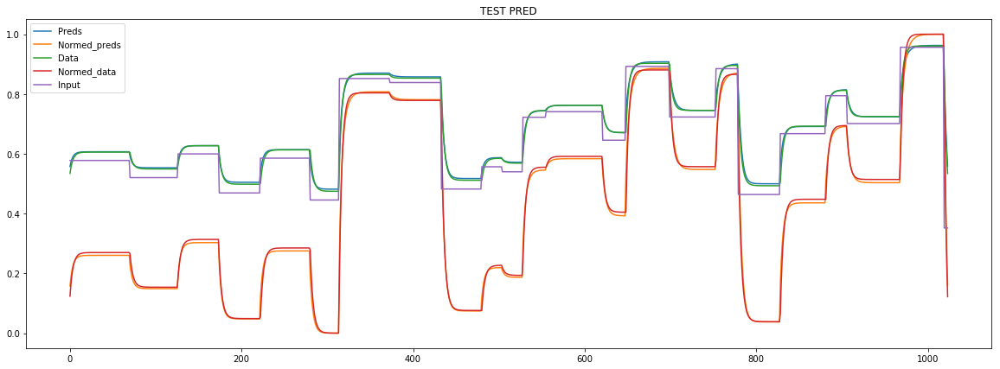

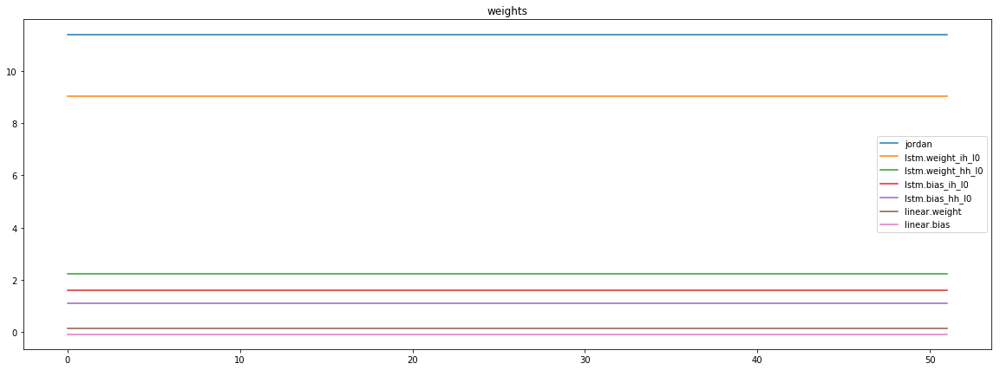

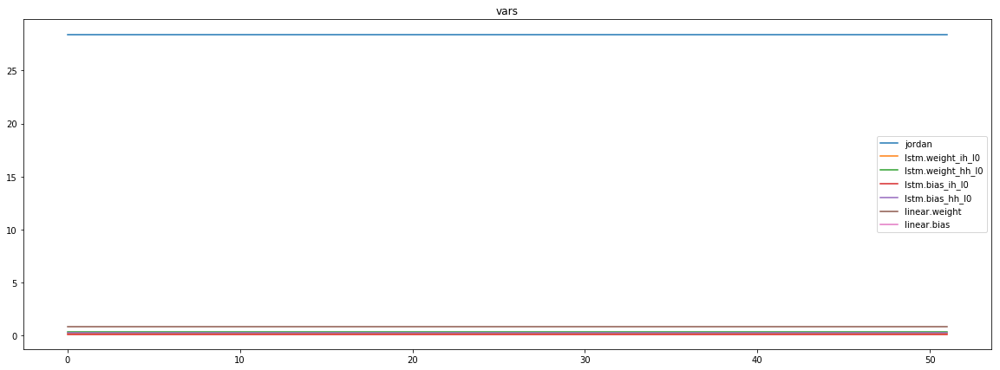

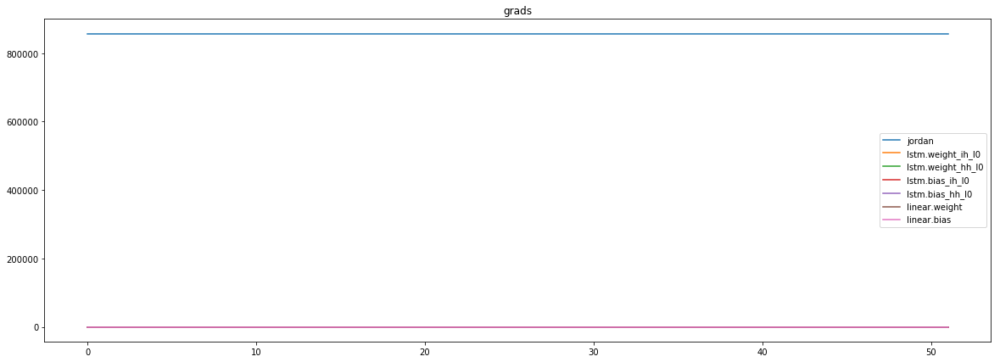

mean_p1 : 26060.052734375
mean_p2 : 823012.3125
mean_p3 : 8394.3916015625


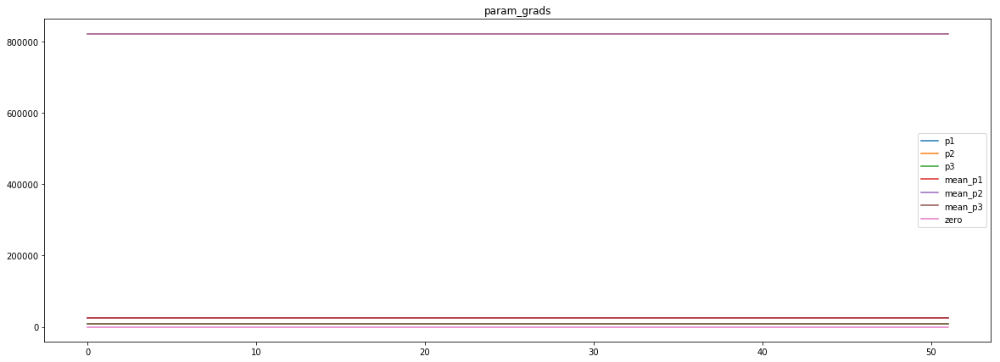

loss rate [0.05106101360112536]
Epoch [55] 
     train_loss[6116.568495530349] 
     eval_train[0.02060590975662098] 
     eval_test[0.020954222855256045]



aux preds: 0.44714316725730896           1.0004081726074219           9.951589584350586
main loss 0.0
aux loss 0.0
jord loss 5848.588857797476
combined loss 5848.588857797476 



Parameter containing:
tensor([[0.4471, 1.0004, 9.9516]], requires_grad=True)


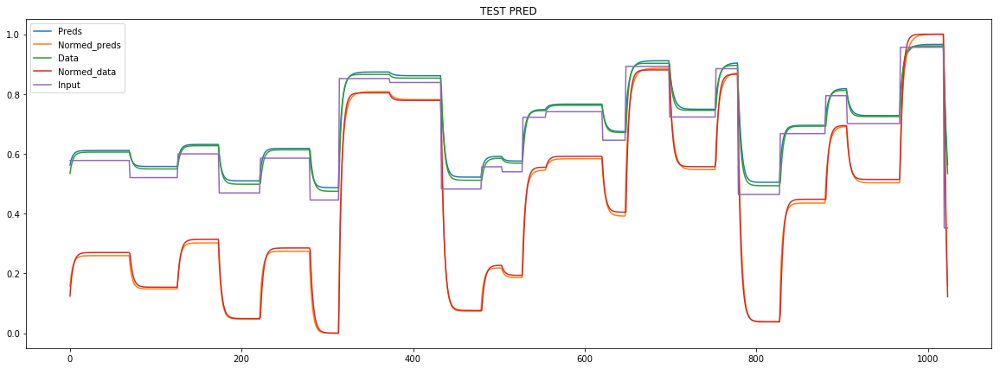

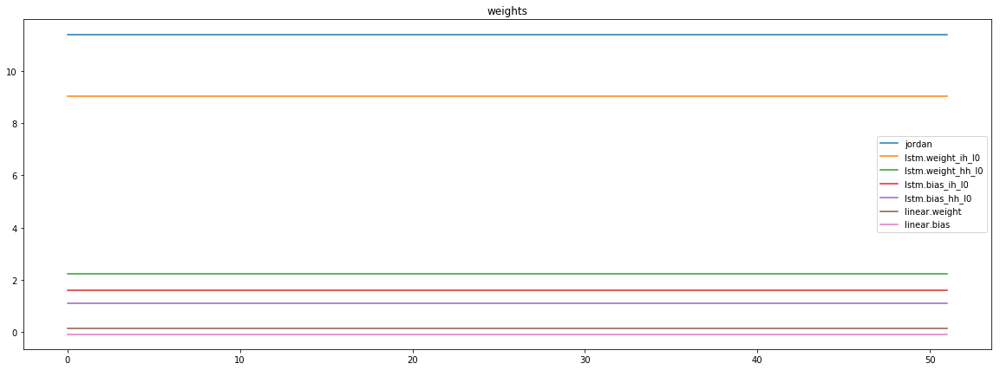

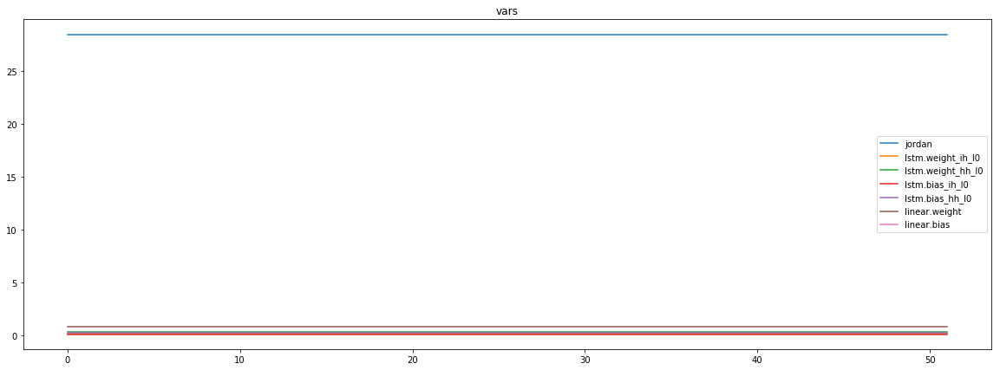

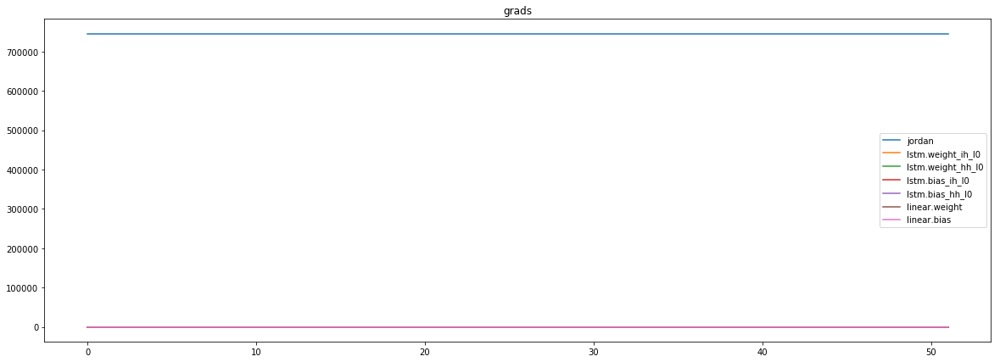

mean_p1 : -13921.875
mean_p2 : 751953.6875
mean_p3 : 7569.9970703125


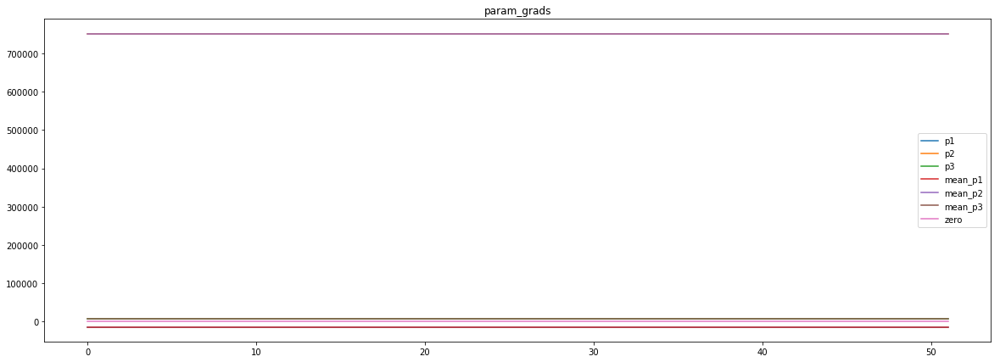

loss rate [-0.15132753582757452]
Epoch [56] 
     train_loss[5848.588857797476] 
     eval_train[0.025397076042281697] 
     eval_test[0.025674427417966814]



aux preds: 0.44807693362236023           0.9994673728942871           9.951318740844727
main loss 0.0
aux loss 0.0
jord loss 5966.480032113882
combined loss 5966.480032113882 



Parameter containing:
tensor([[0.4481, 0.9995, 9.9513]], requires_grad=True)


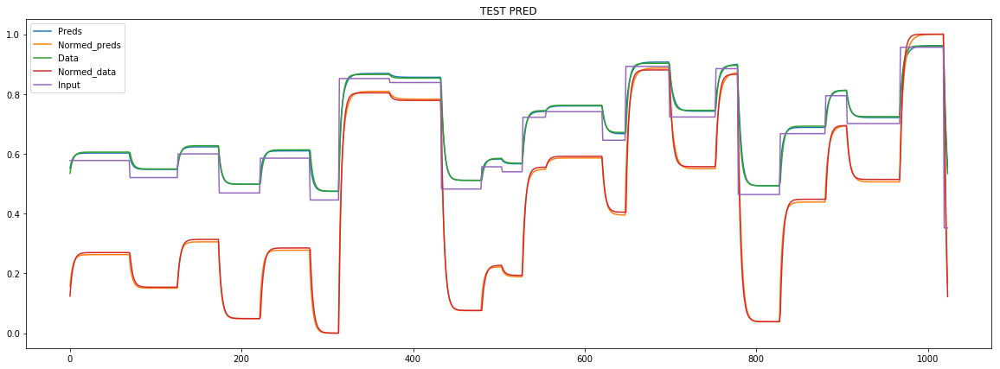

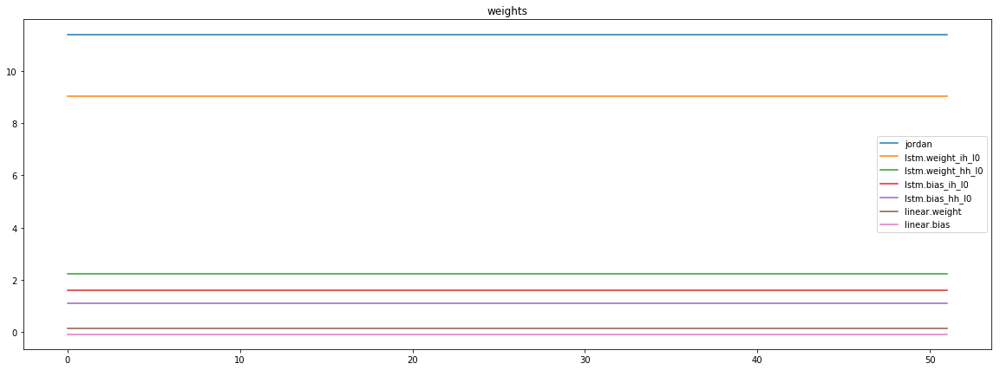

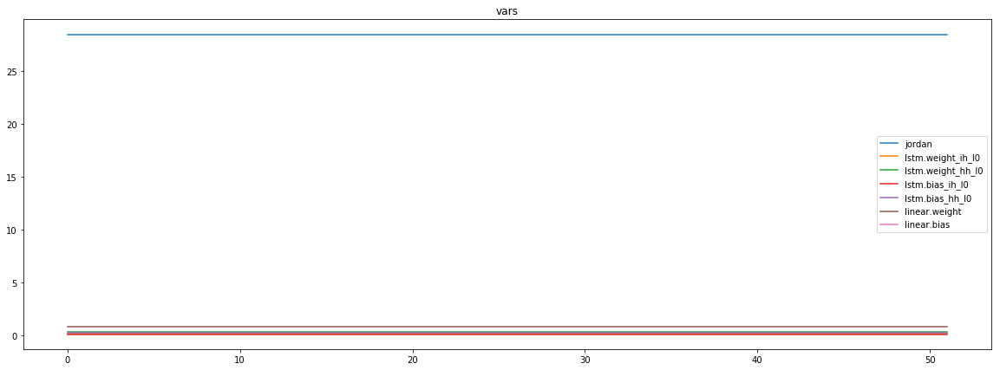

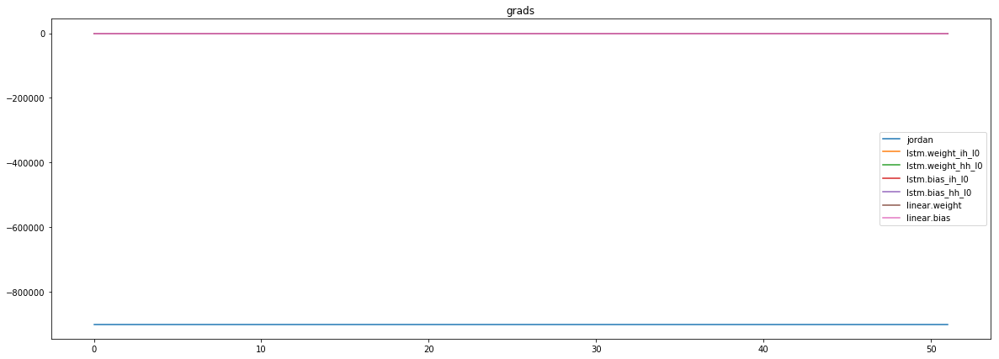

mean_p1 : -14939.0546875
mean_p2 : -876844.8125
mean_p3 : -8741.2890625


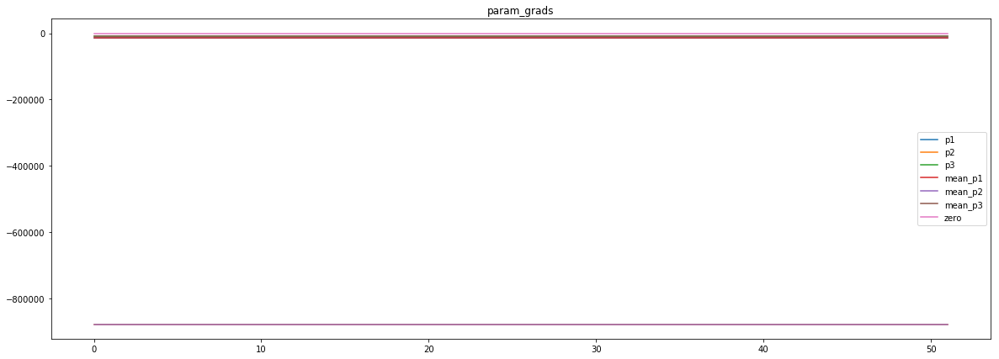

loss rate [0.1310574426426856]
Epoch [57] 
     train_loss[5966.480032113882] 
     eval_train[0.020841834815655602] 
     eval_test[0.021007399055551185]



aux preds: 0.4487866163253784           0.9982352256774902           9.959993362426758
main loss 0.0
aux loss 0.0
jord loss 6056.1438880333535
combined loss 6056.1438880333535 



Parameter containing:
tensor([[0.4488, 0.9982, 9.9600]], requires_grad=True)


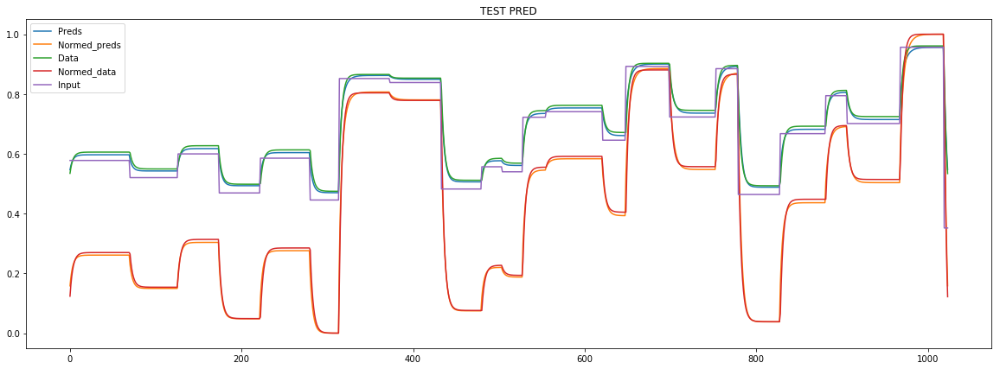

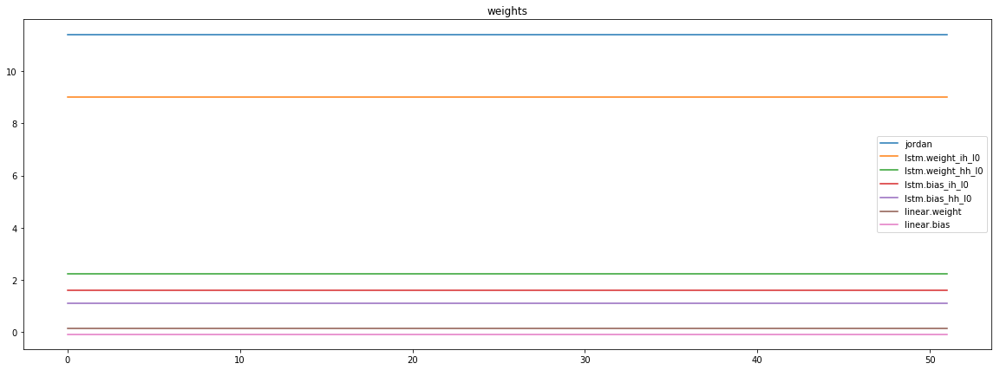

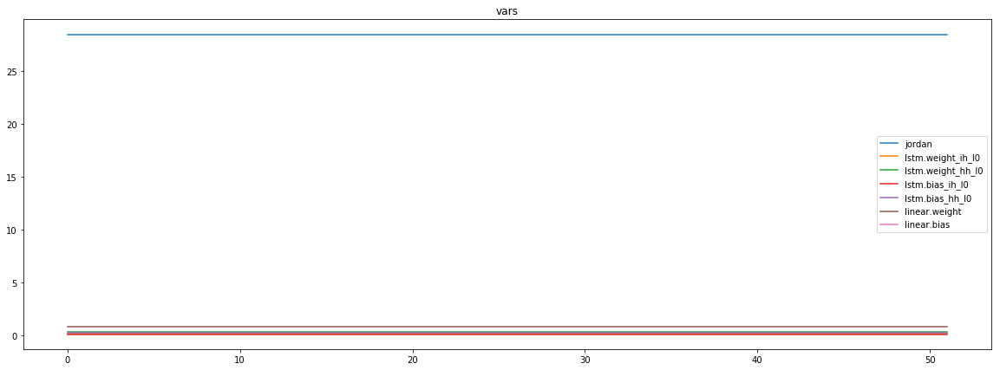

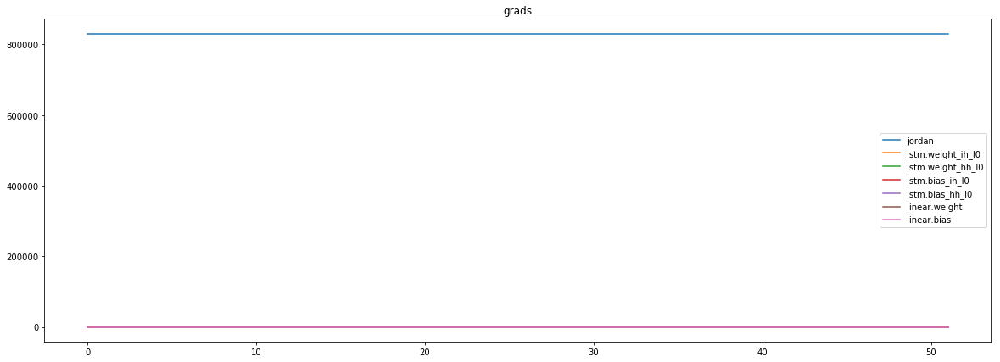

mean_p1 : -47173.8359375
mean_p2 : 869009.1875
mean_p3 : 8687.34765625


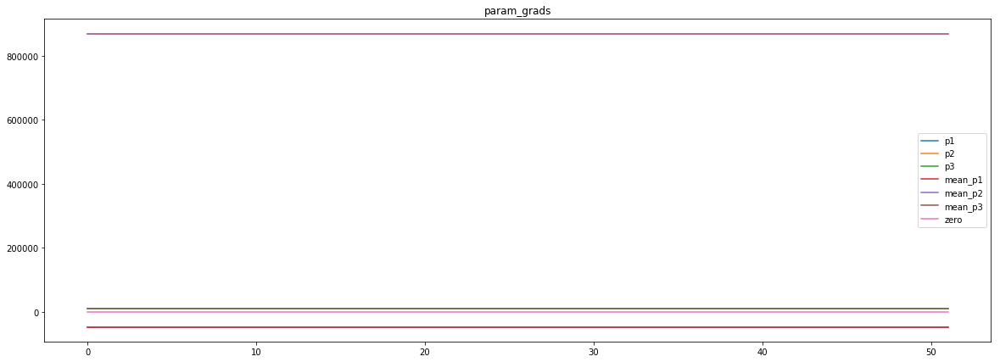

loss rate [-0.2697387739419803]
Epoch [58] 
     train_loss[6056.1438880333535] 
     eval_train[0.02859580354267494] 
     eval_test[0.02862670478299895]



aux preds: 0.4531400203704834           0.9970790147781372           9.957963943481445
main loss 0.0
aux loss 0.0
jord loss 6647.415931114783
combined loss 6647.415931114783 



Parameter containing:
tensor([[0.4531, 0.9971, 9.9580]], requires_grad=True)


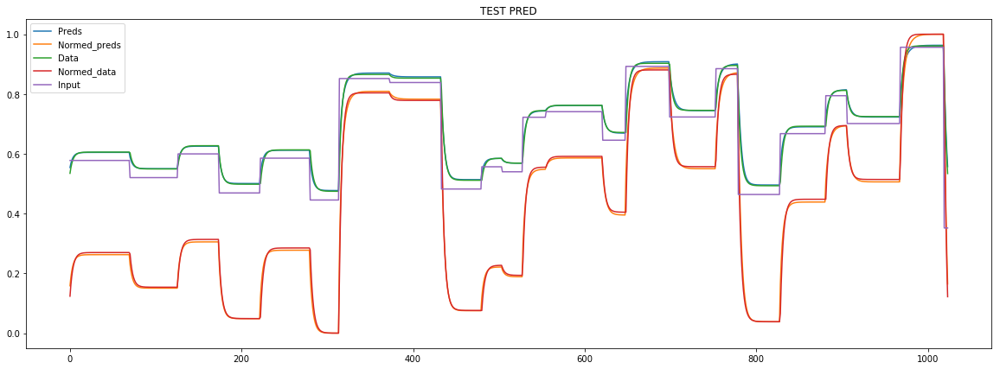

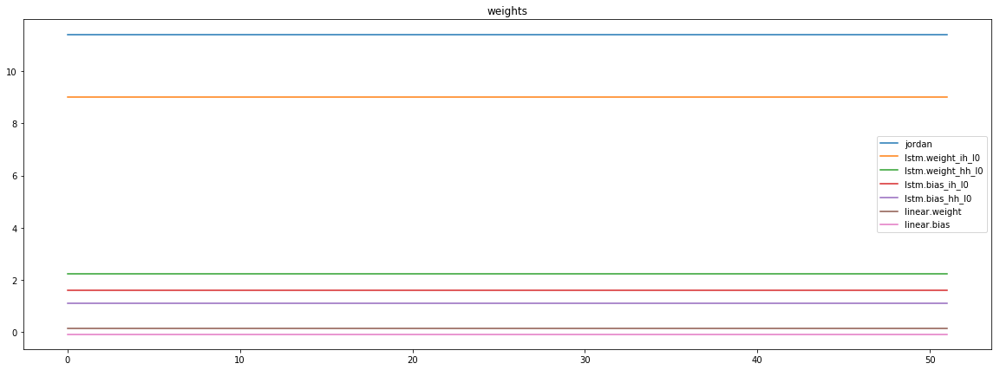

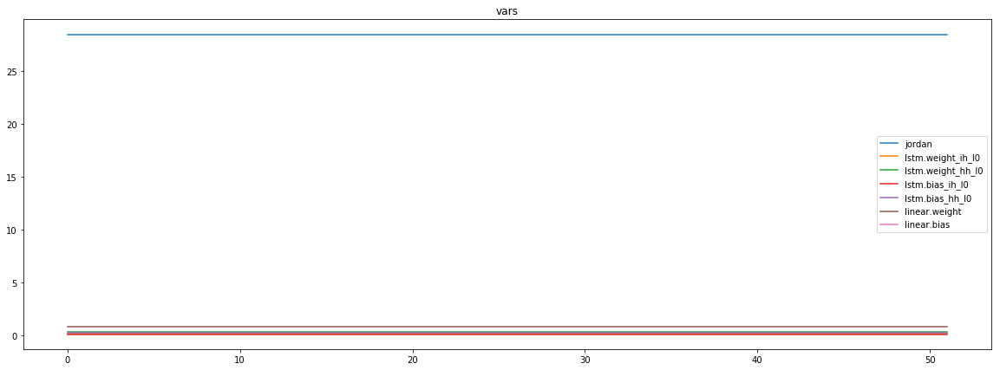

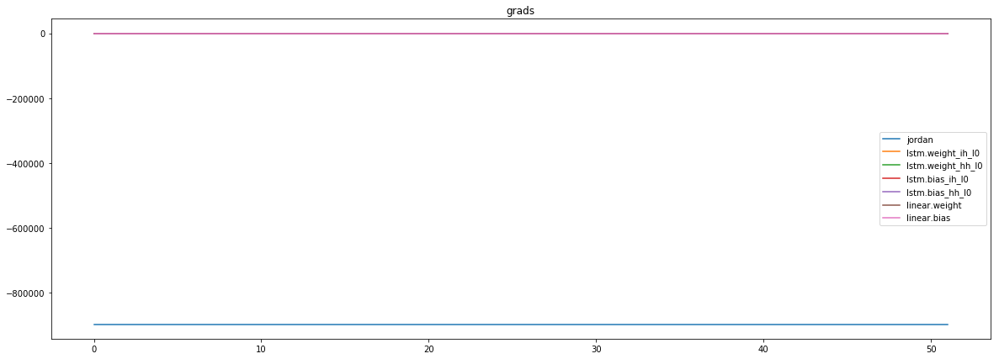

mean_p1 : -1478.428955078125
mean_p2 : -887576.0625
mean_p3 : -8890.93359375


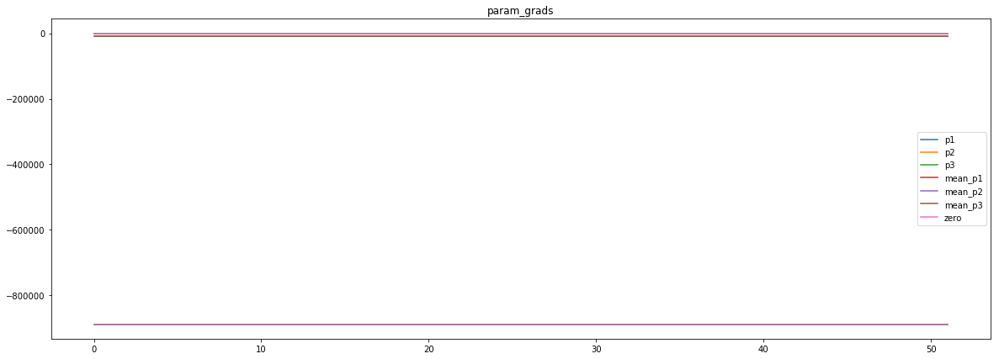

loss rate [0.1046077717746996]
Epoch [59] 
     train_loss[6647.415931114783] 
     eval_train[0.022202997238029917] 
     eval_test[0.02247689120204913]



aux preds: 0.4479537904262543           1.000391960144043           9.968160629272461
main loss 0.0
aux loss 0.0
jord loss 6232.9301523061895
combined loss 6232.9301523061895 



Parameter containing:
tensor([[0.4480, 1.0004, 9.9682]], requires_grad=True)


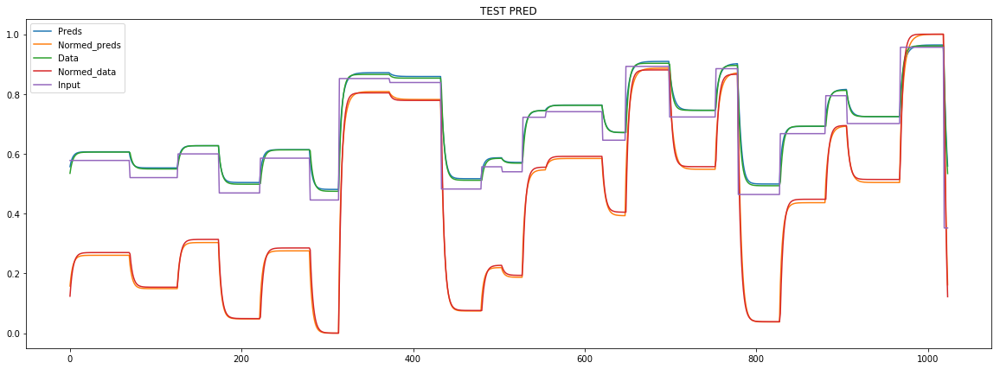

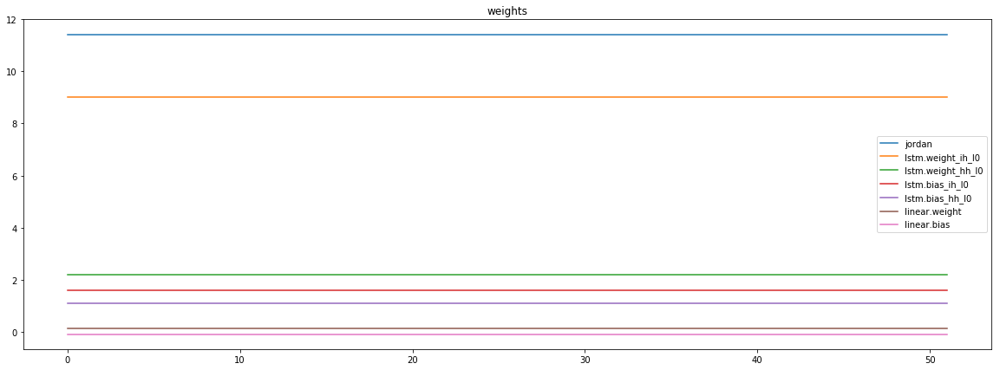

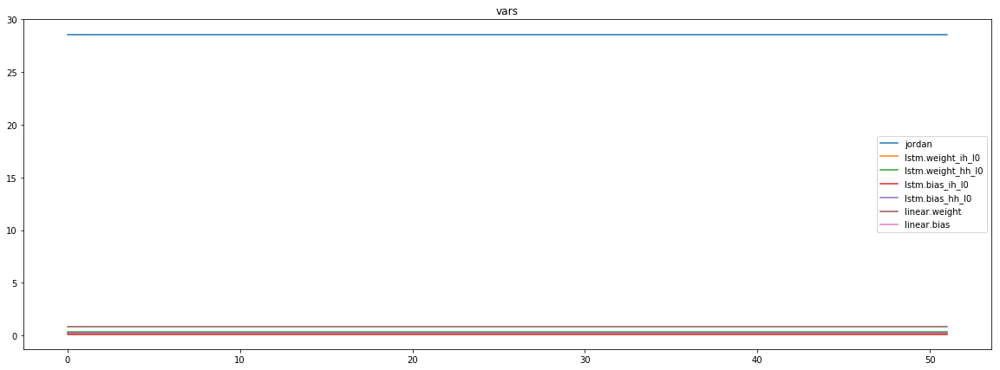

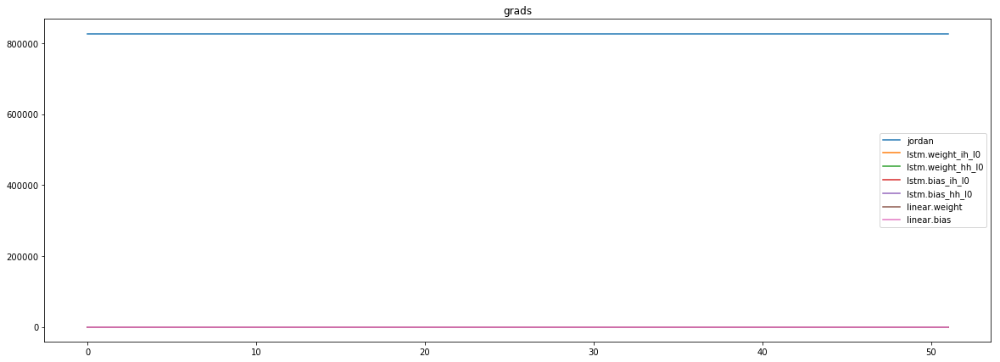

mean_p1 : -34181.75390625
mean_p2 : 852675.9375
mean_p3 : 8570.1865234375


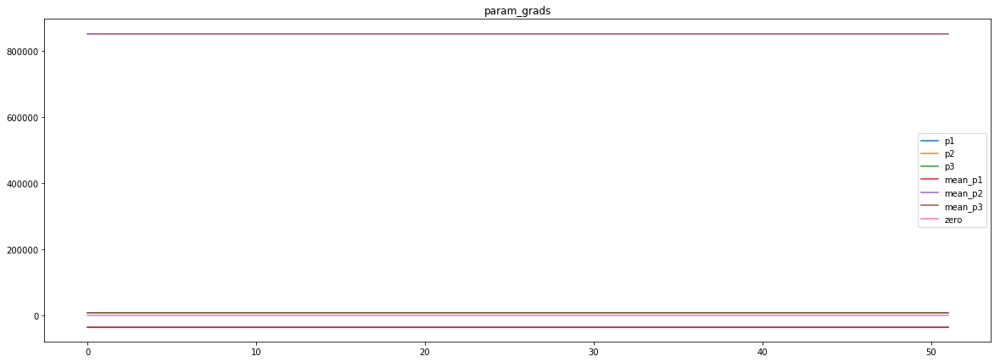

loss rate [0.13020193309599204]
Epoch [60] 
     train_loss[6232.9301523061895] 
     eval_train[0.02048893464983009] 
     eval_test[0.020907334696279246]



aux preds: 0.4488793909549713           1.0007121562957764           9.963409423828125
main loss 0.0
aux loss 0.0
jord loss 5964.853177584135
combined loss 5964.853177584135 



Parameter containing:
tensor([[0.4489, 1.0007, 9.9634]], requires_grad=True)


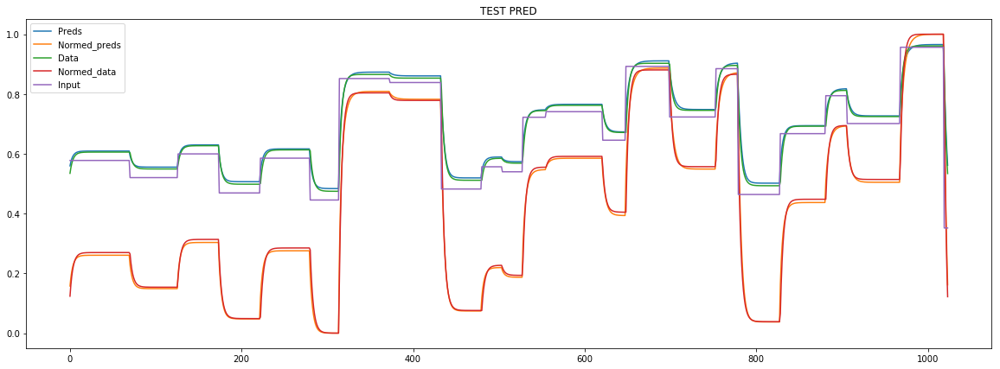

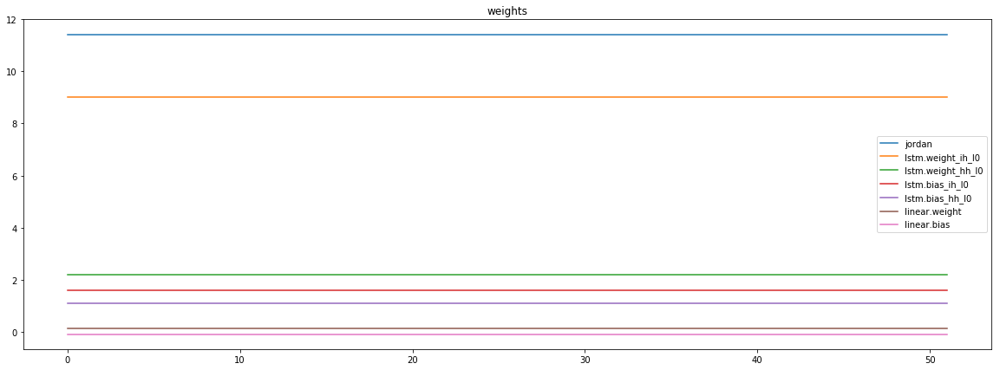

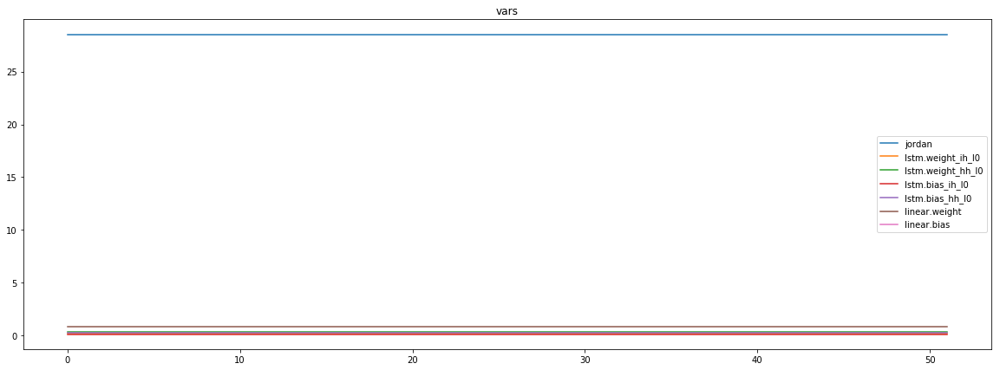

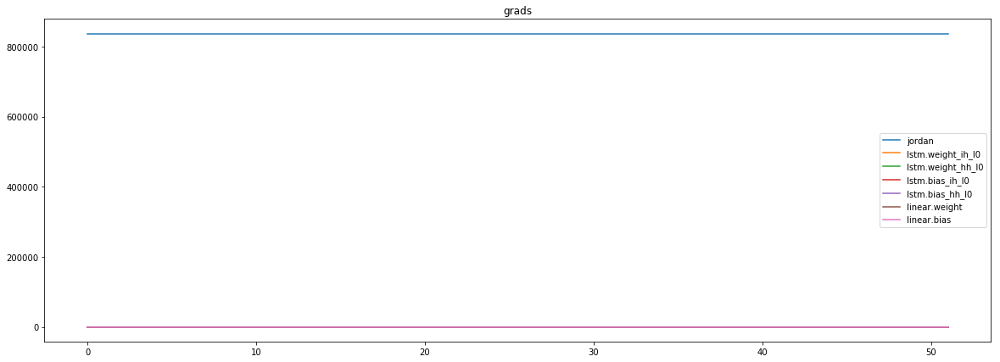

mean_p1 : -46170.71484375
mean_p2 : 874583.75
mean_p3 : 8754.802734375


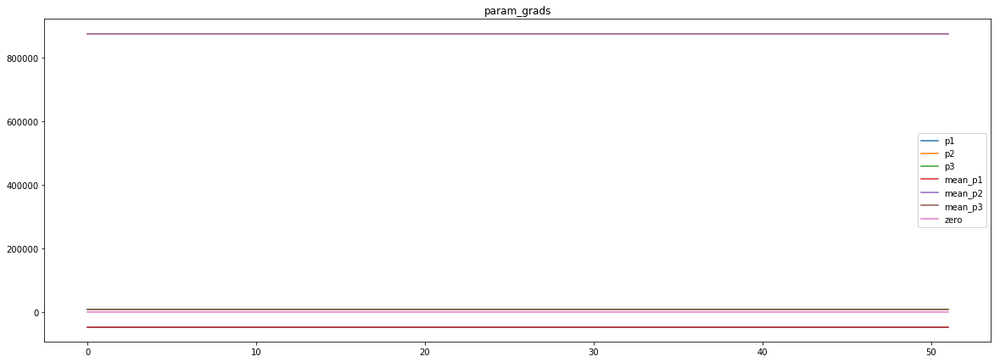

loss rate [-0.004857121115818153]
Epoch [61] 
     train_loss[5964.853177584135] 
     eval_train[0.02370976627277671] 
     eval_test[0.024120232164436442]



aux preds: 0.44931089878082275           0.9990767240524292           9.95955753326416
main loss 0.0
aux loss 0.0
jord loss 6122.081852839543
combined loss 6122.081852839543 



Parameter containing:
tensor([[0.4493, 0.9991, 9.9596]], requires_grad=True)


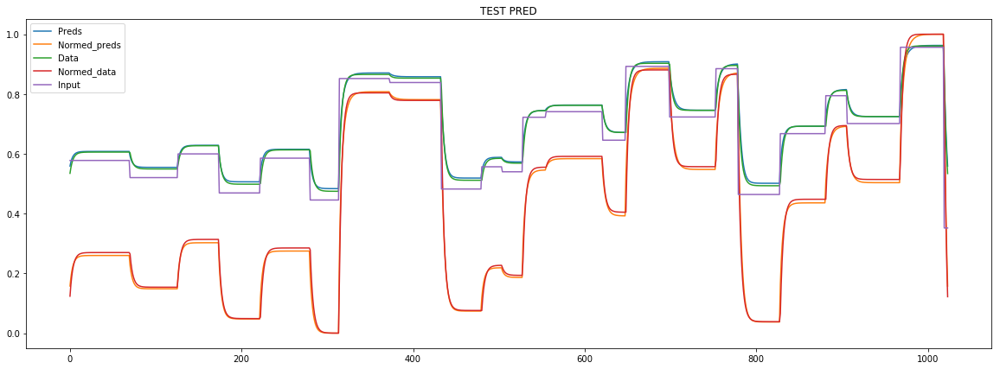

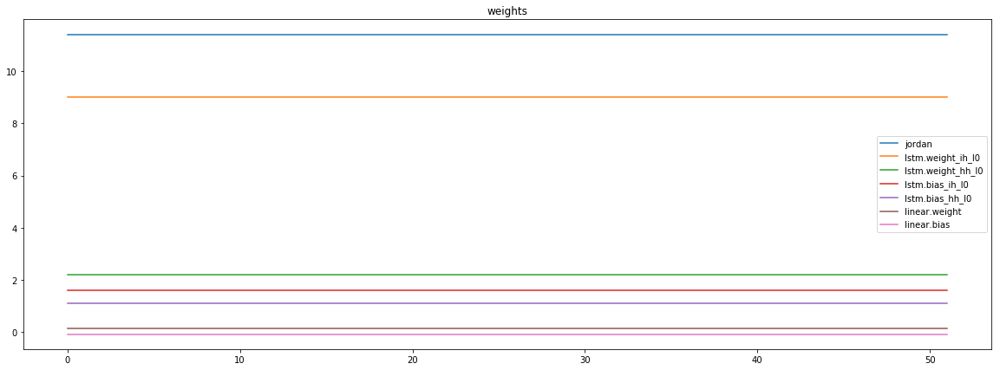

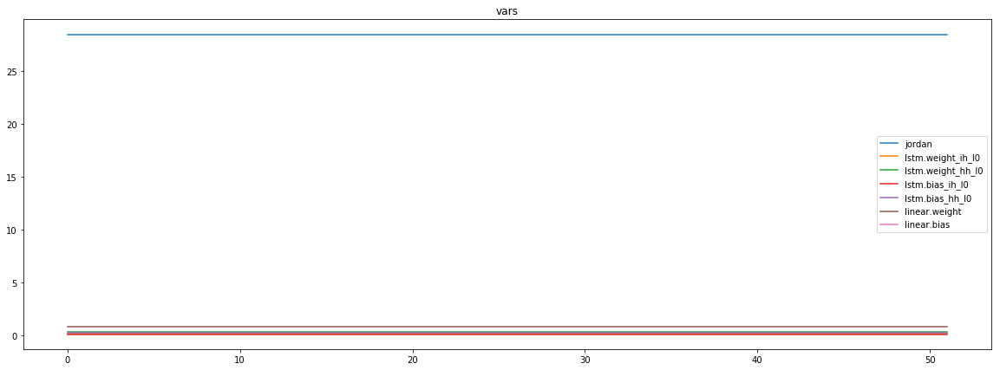

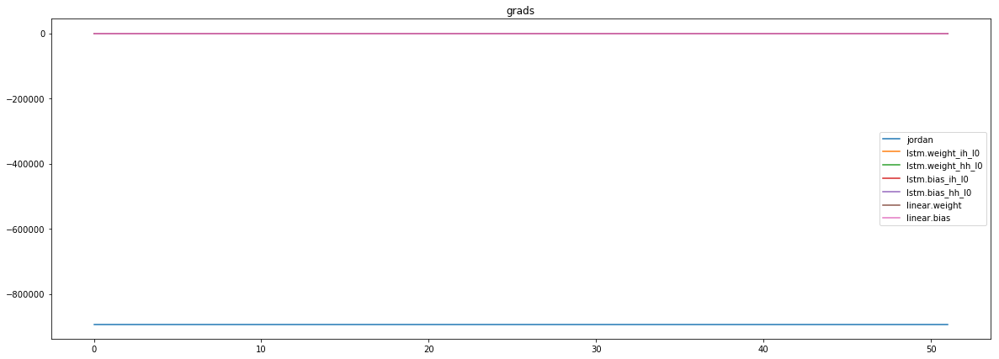

mean_p1 : -12751.244140625
mean_p2 : -871435.5
mean_p3 : -8698.8837890625


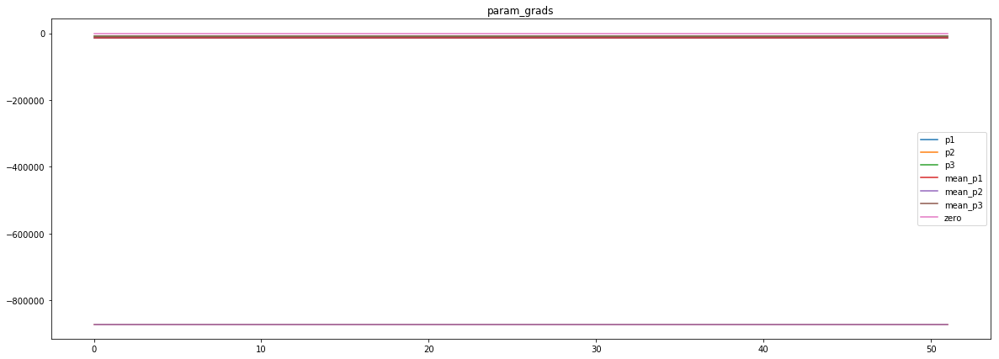

loss rate [0.006820065205868198]
Epoch [62] 
     train_loss[6122.081852839543] 
     eval_train[0.022072055269535873] 
     eval_test[0.022348024419029985]



aux preds: 0.4474151134490967           1.000778317451477           9.971638679504395
main loss 0.0
aux loss 0.0
jord loss 5924.061683067908
combined loss 5924.061683067908 



Parameter containing:
tensor([[0.4474, 1.0008, 9.9716]], requires_grad=True)


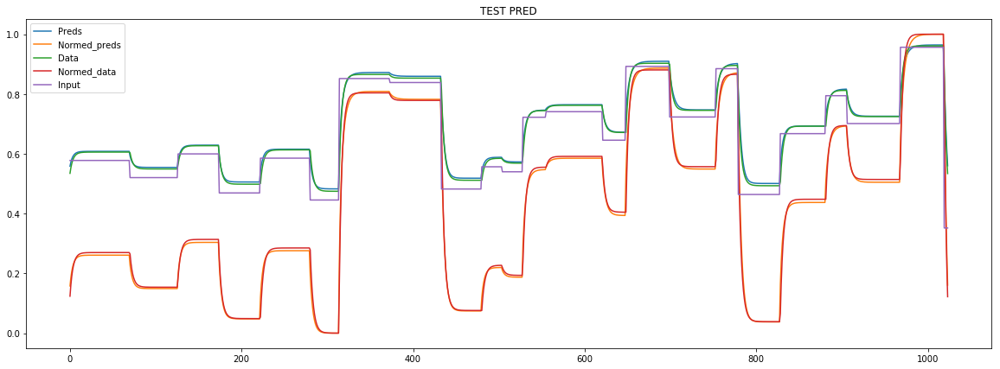

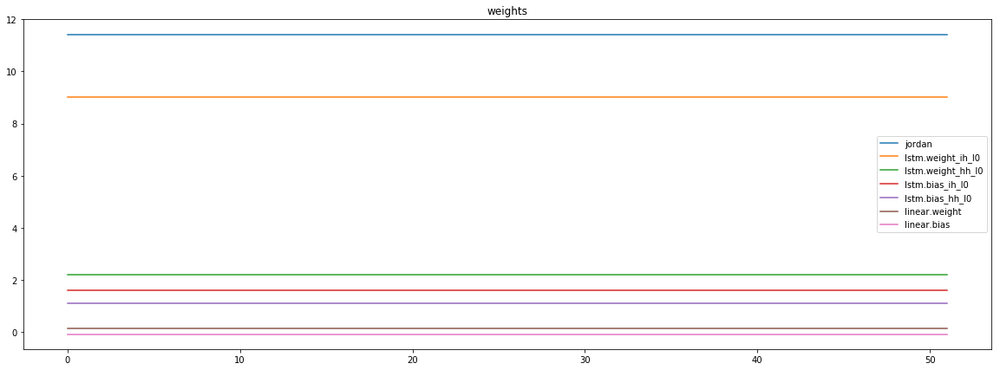

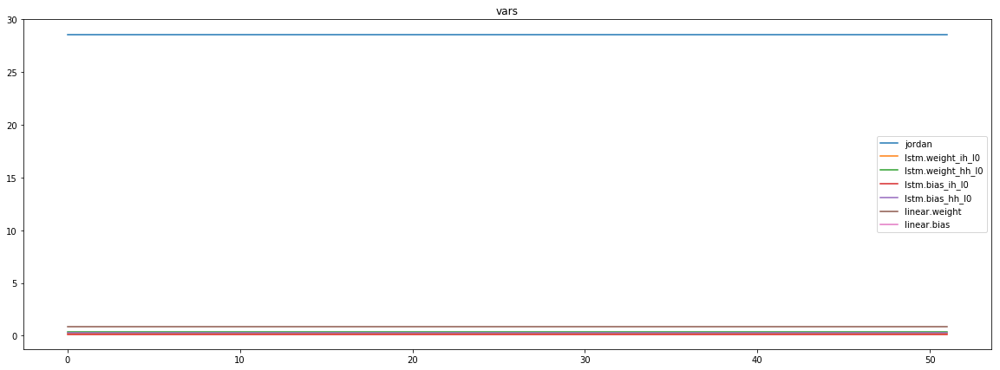

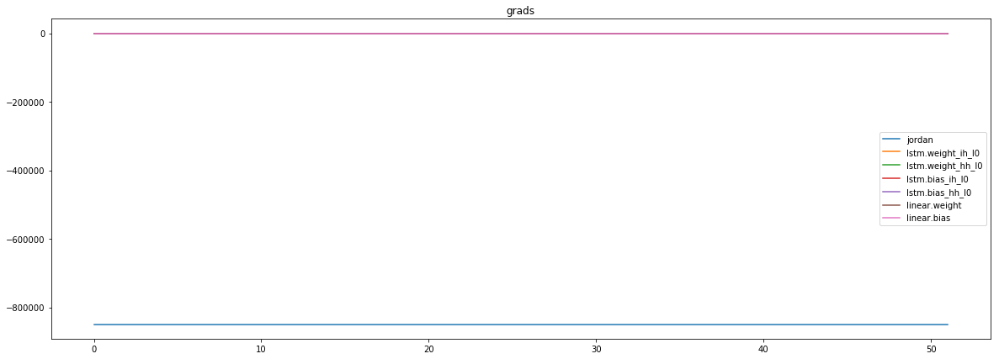

mean_p1 : -3942.488037109375
mean_p2 : -836642.3125
mean_p3 : -8387.228515625


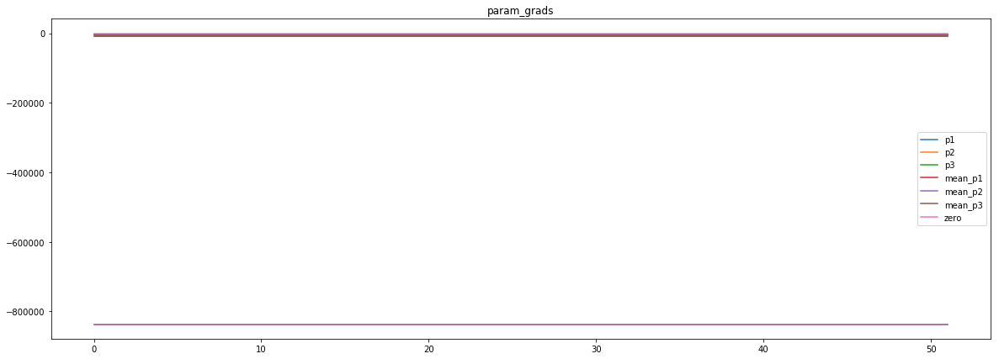

loss rate [-0.020879252345710864]
Epoch [63] 
     train_loss[5924.061683067908] 
     eval_train[0.022513857647796752] 
     eval_test[0.022927447750672316]



aux preds: 0.4497300386428833           0.9981679916381836           9.971421241760254
main loss 0.0
aux loss 0.0
jord loss 6275.515352689303
combined loss 6275.515352689303 



Parameter containing:
tensor([[0.4497, 0.9982, 9.9714]], requires_grad=True)


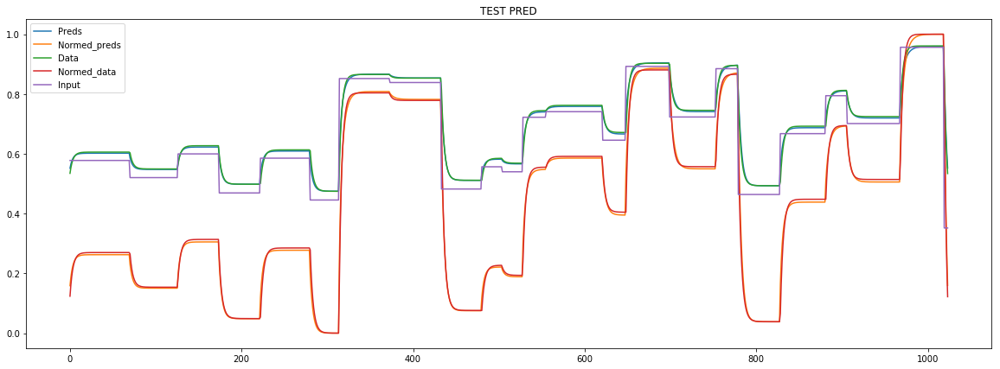

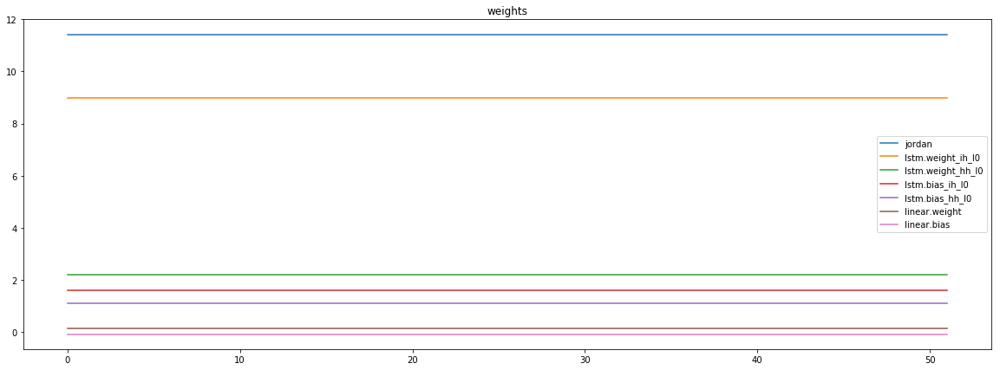

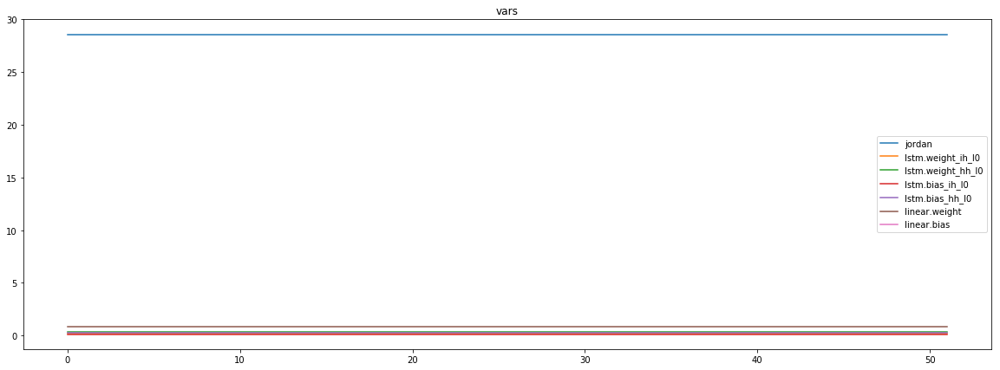

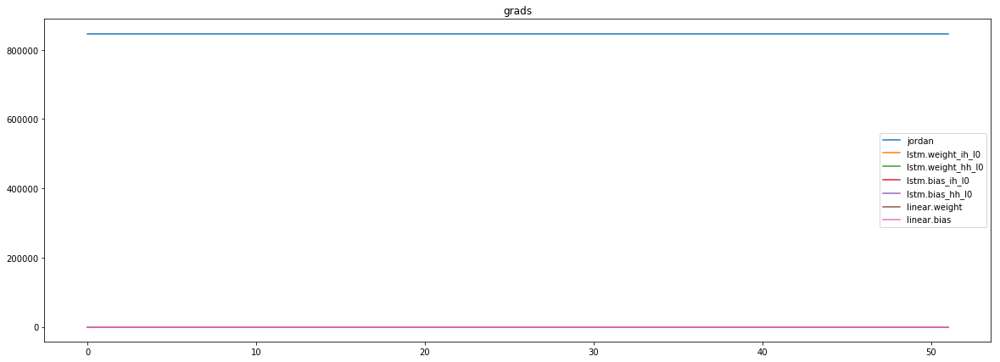

mean_p1 : -31433.908203125
mean_p2 : 869528.25
mean_p3 : 8742.16015625


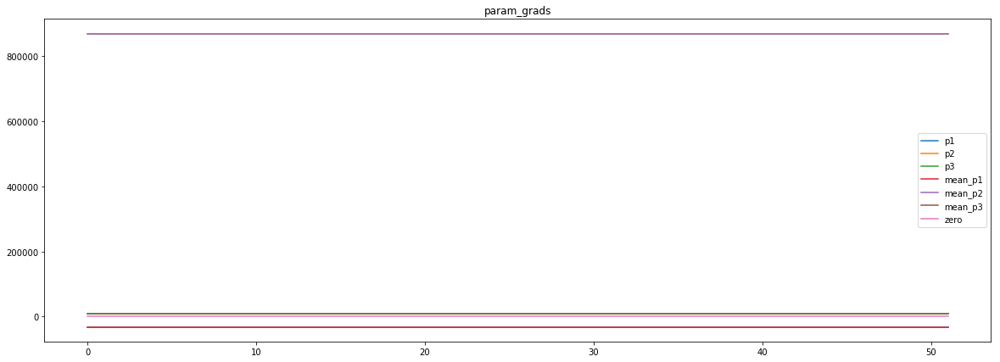

loss rate [0.012082245092438604]
Epoch [64] 
     train_loss[6275.515352689303] 
     eval_train[0.022723911974375927] 
     eval_test[0.02285241614200376]



aux preds: 0.45032748579978943           1.001181721687317           9.974618911743164
main loss 0.0
aux loss 0.0
jord loss 6025.617919921875
combined loss 6025.617919921875 



Parameter containing:
tensor([[0.4503, 1.0012, 9.9746]], requires_grad=True)


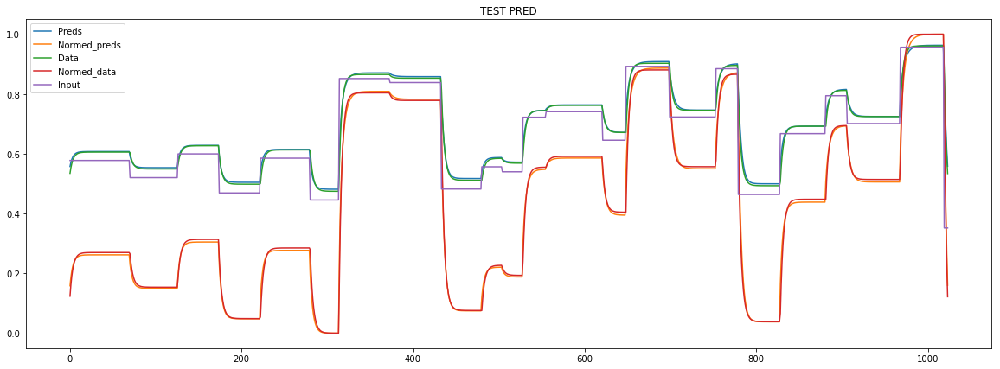

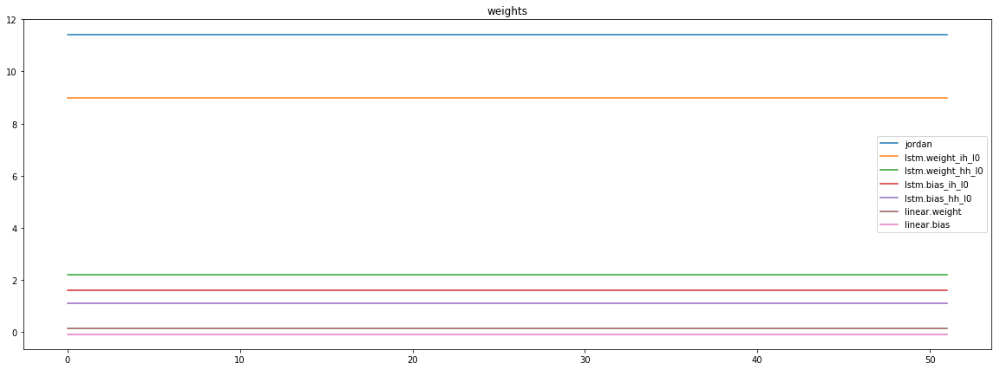

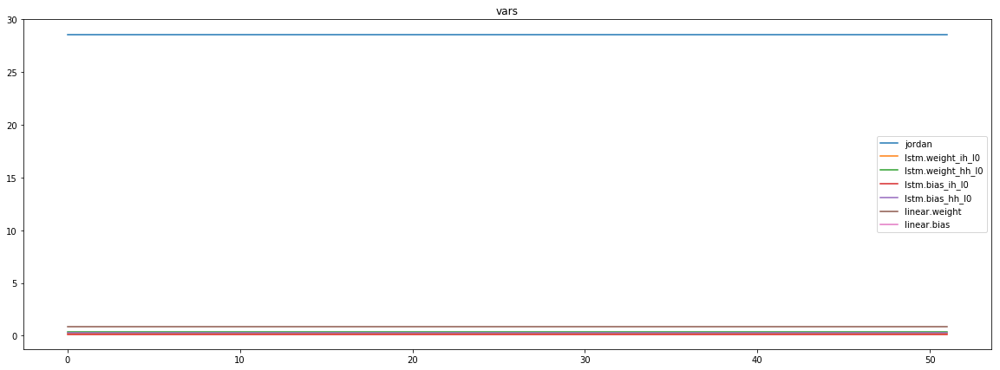

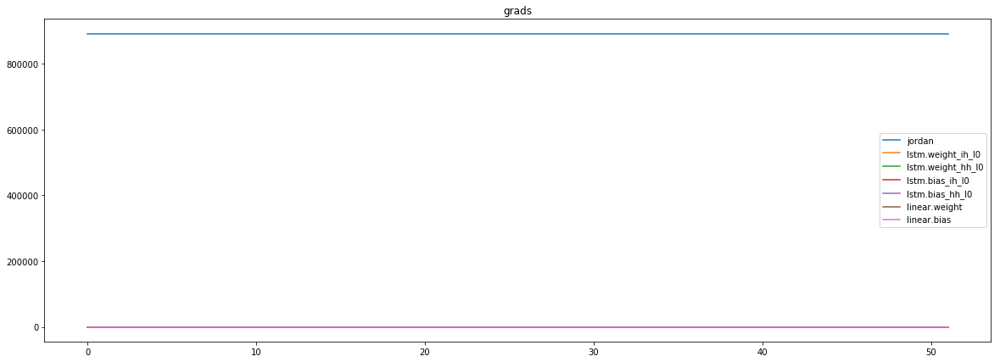

mean_p1 : -28675.384765625
mean_p2 : 910962.1875
mean_p3 : 9151.6455078125


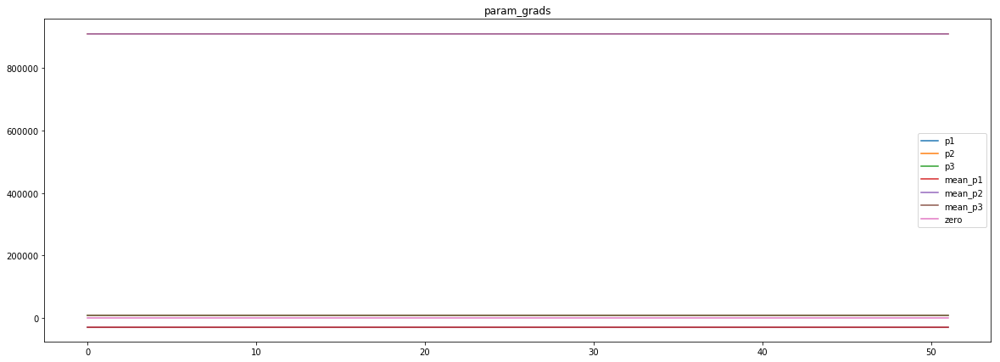

loss rate [0.013034730028355979]
Epoch [65] 
     train_loss[6025.617919921875] 
     eval_train[0.021978240729997475] 
     eval_test[0.02241328656005366]



aux preds: 0.44645044207572937           1.000182032585144           9.974771499633789
main loss 0.0
aux loss 0.0
jord loss 6609.94389460637
combined loss 6609.94389460637 



Parameter containing:
tensor([[0.4465, 1.0002, 9.9748]], requires_grad=True)


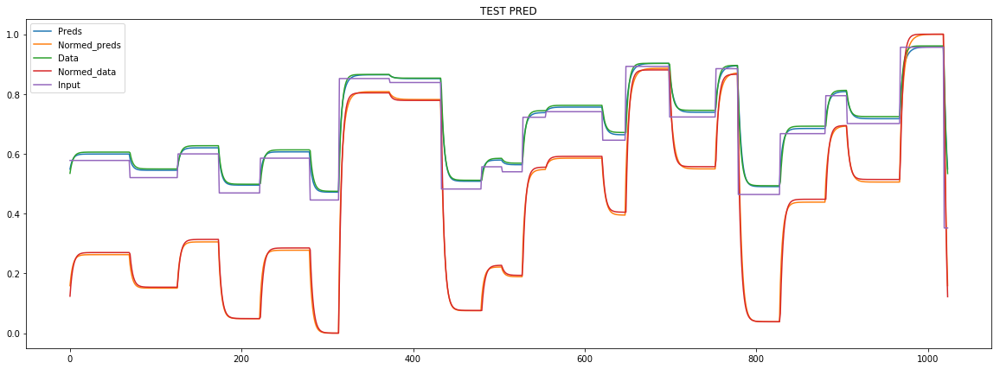

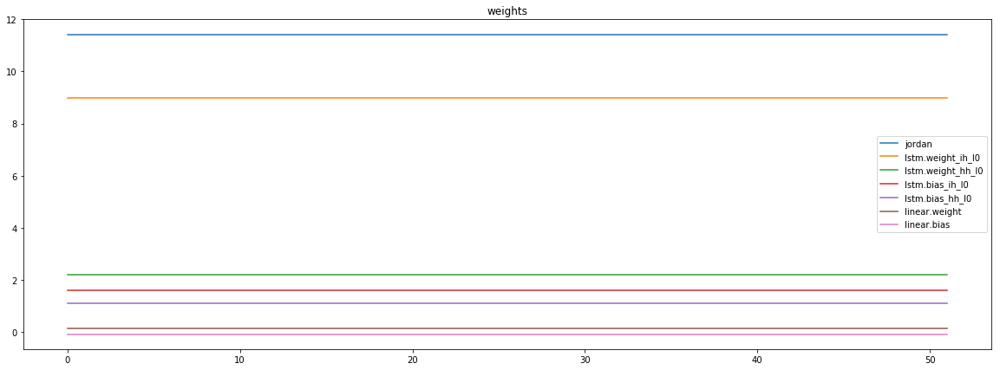

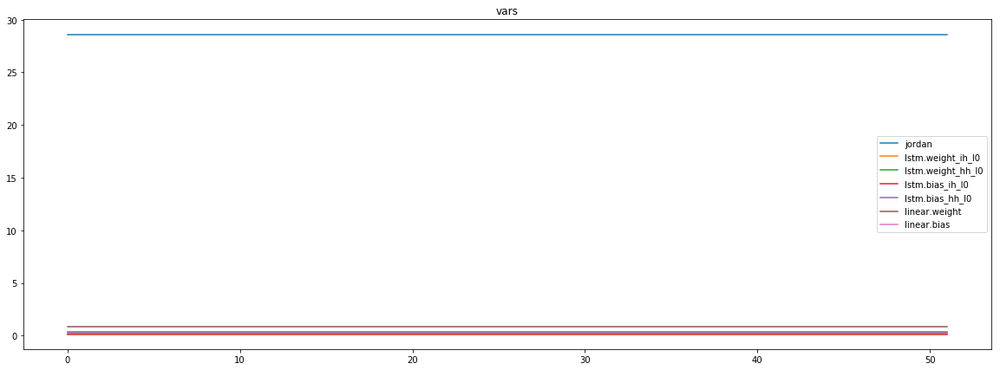

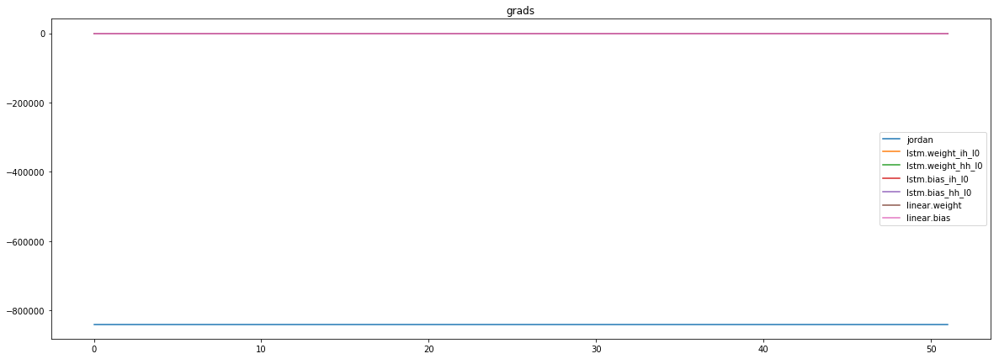

mean_p1 : 21451.107421875
mean_p2 : -852841.125
mean_p3 : -8603.052734375


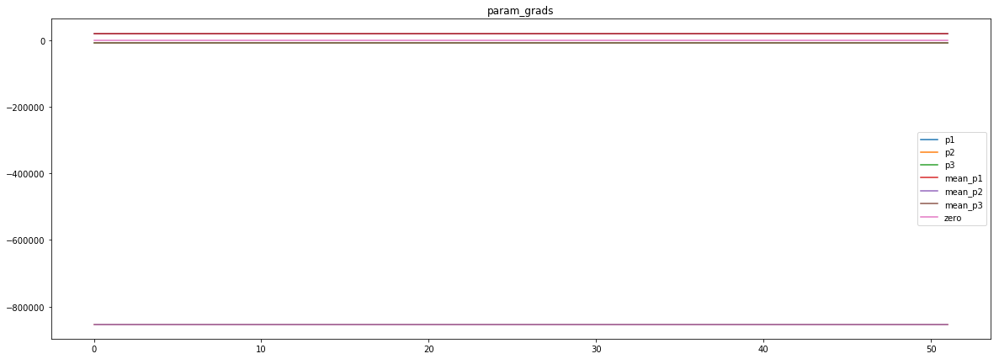

loss rate [-0.00045565124870616813]
Epoch [66] 
     train_loss[6609.94389460637] 
     eval_train[0.022736137373822903] 
     eval_test[0.022741407582295575]



aux preds: 0.45030996203422546           0.9995605945587158           9.973304748535156
main loss 0.0
aux loss 0.0
jord loss 6960.646221454327
combined loss 6960.646221454327 



Parameter containing:
tensor([[0.4503, 0.9996, 9.9733]], requires_grad=True)


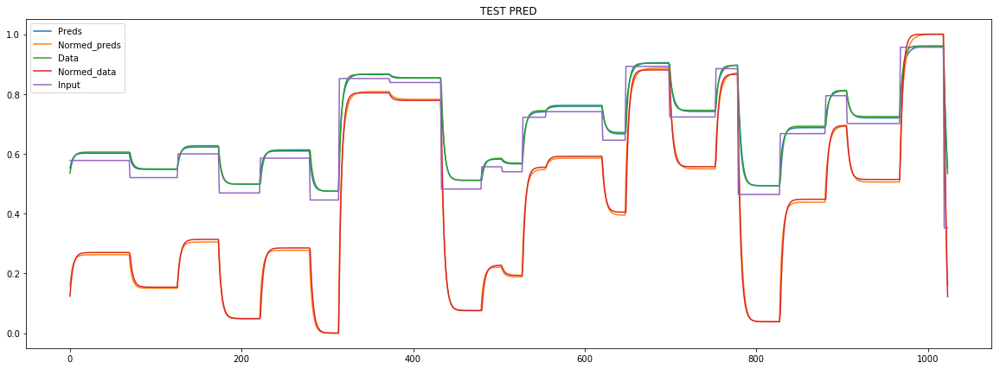

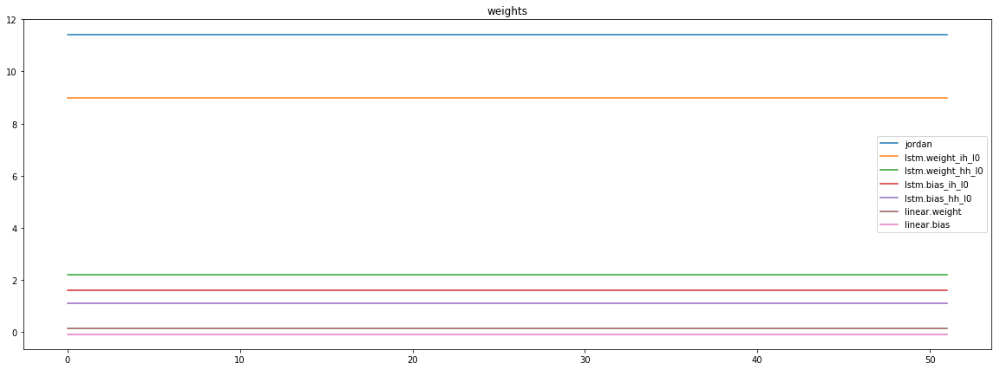

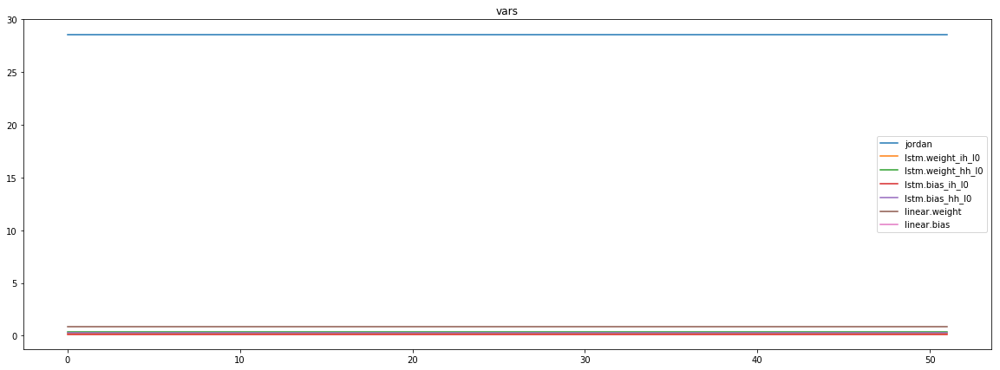

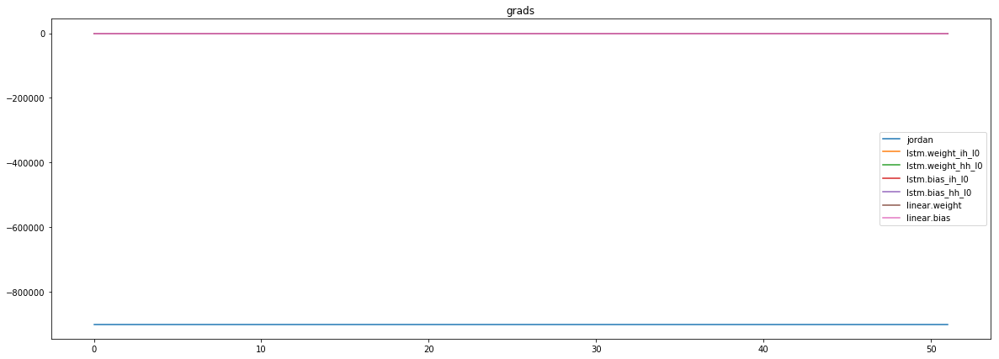

mean_p1 : -11345.2236328125
mean_p2 : -880569.0625
mean_p3 : -8796.798828125


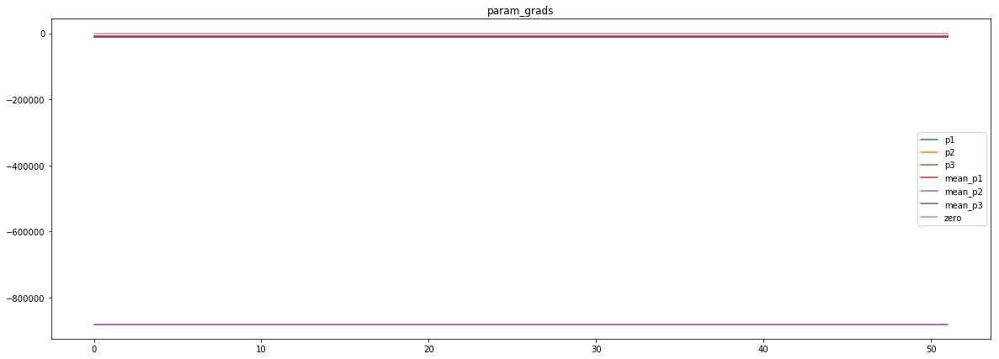

loss rate [0.08528135740661469]
Epoch [67] 
     train_loss[6960.646221454327] 
     eval_train[0.020567929924884362] 
     eval_test[0.02073579053533401]



aux preds: 0.4469371736049652           0.9996258616447449           9.973727226257324
main loss 0.0
aux loss 0.0
jord loss 6260.645925668569
combined loss 6260.645925668569 



Parameter containing:
tensor([[0.4469, 0.9996, 9.9737]], requires_grad=True)


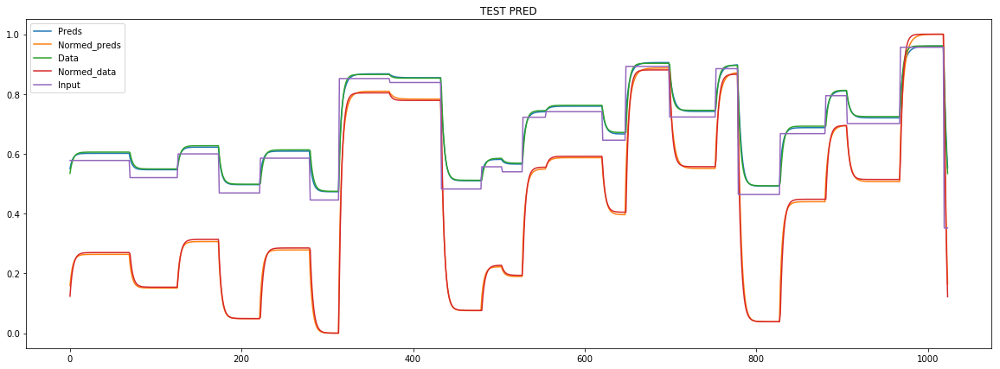

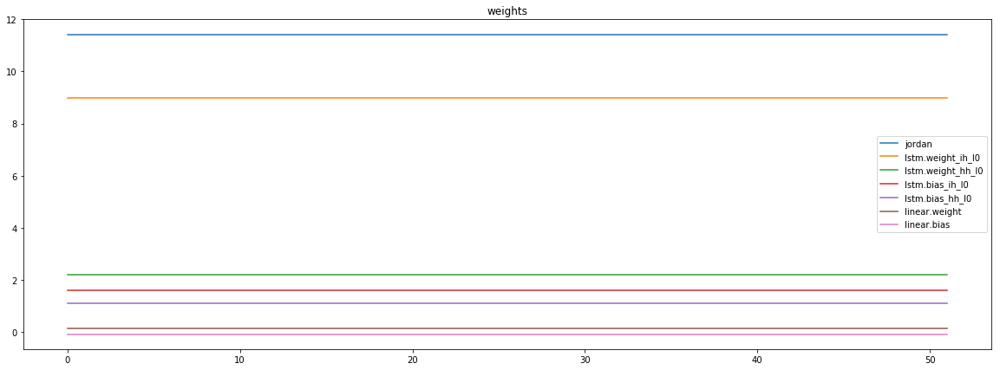

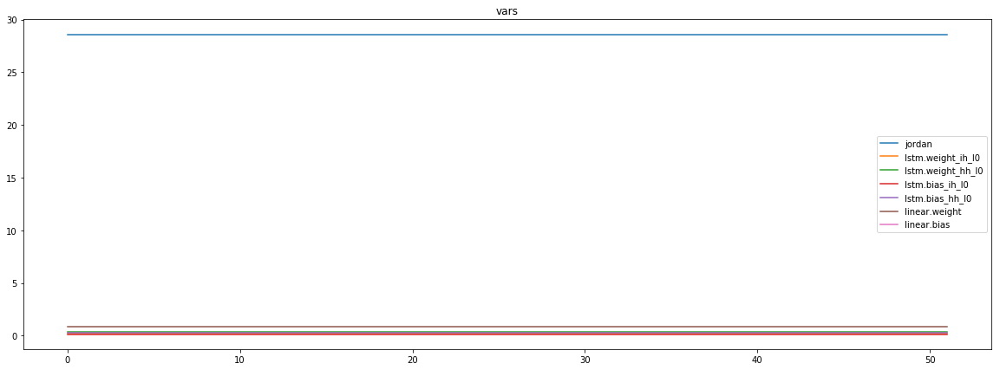

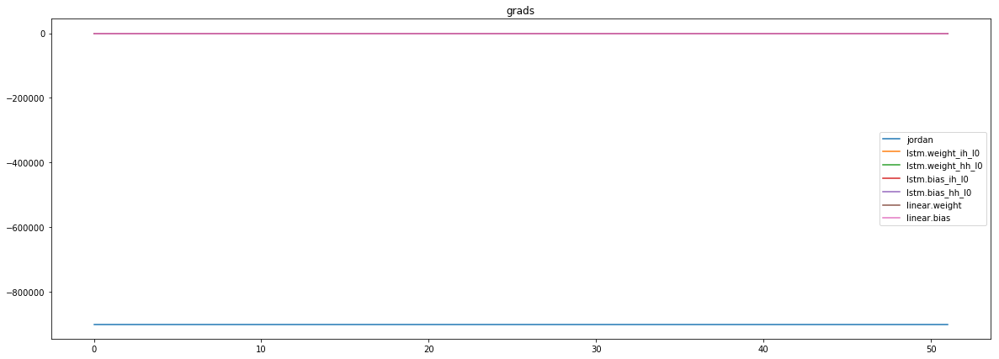

mean_p1 : -34288.33203125
mean_p2 : -856673.375
mean_p3 : -8522.01953125


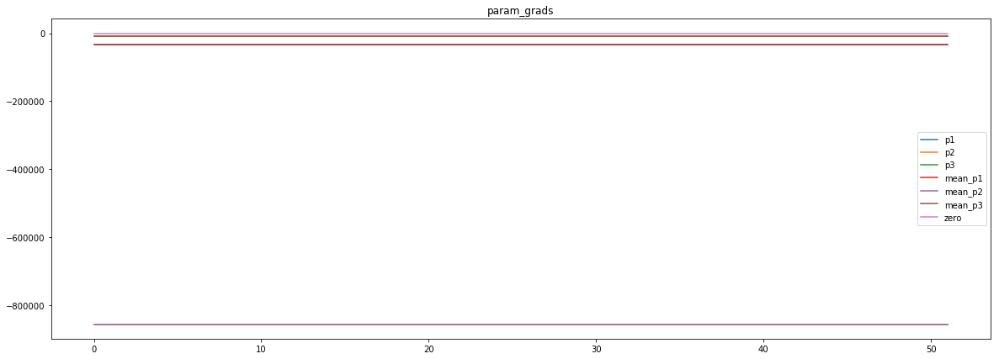

loss rate [0.029928486391636144]
Epoch [68] 
     train_loss[6260.645925668569] 
     eval_train[0.02122262094795028] 
     eval_test[0.021306160734556295]



aux preds: 0.4480290114879608           0.9994174242019653           9.97590160369873
main loss 0.0
aux loss 0.0
jord loss 6136.932100736178
combined loss 6136.932100736178 



Parameter containing:
tensor([[0.4480, 0.9994, 9.9759]], requires_grad=True)


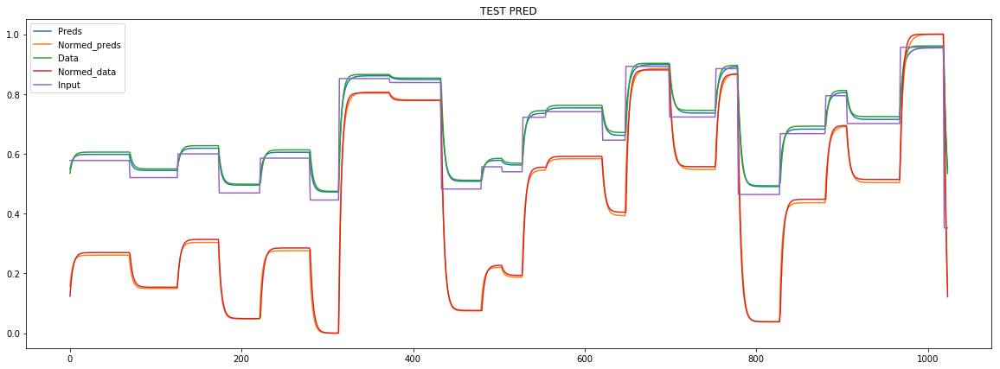

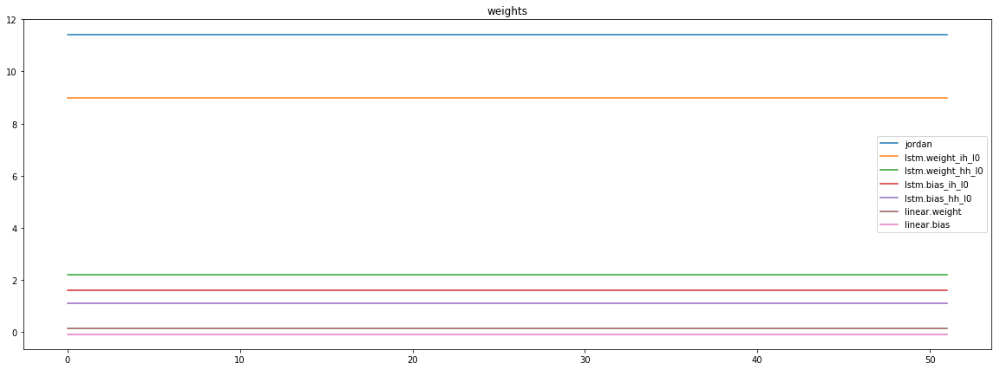

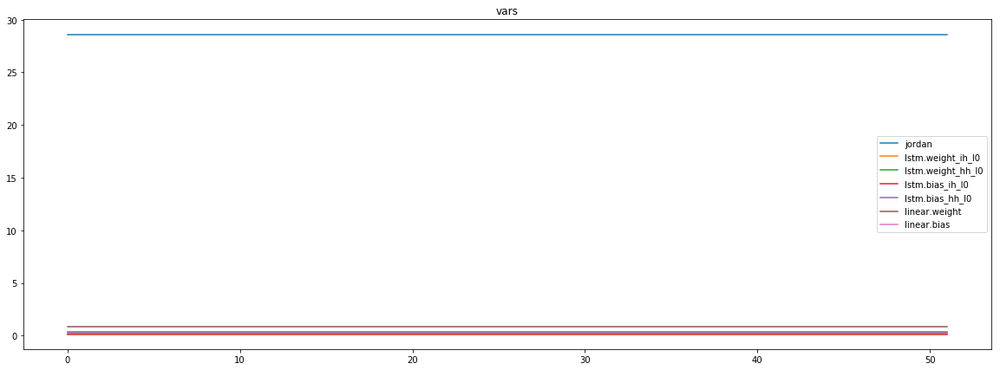

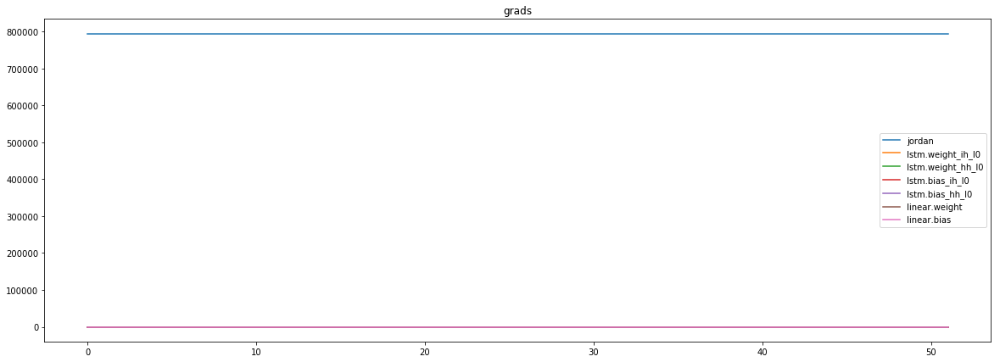

mean_p1 : -24335.7265625
mean_p2 : 810369.1875
mean_p3 : 8171.7822265625


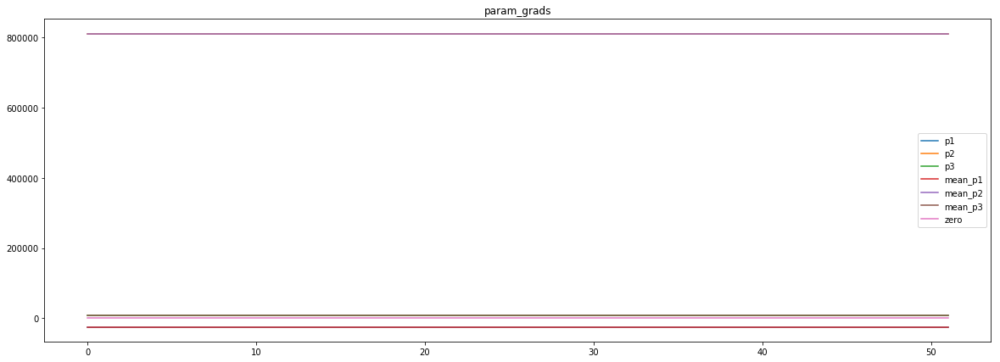

loss rate [-0.19218112247960706]
Epoch [69] 
     train_loss[6136.932100736178] 
     eval_train[0.02557622661739655] 
     eval_test[0.025744499158132716]



aux preds: 0.4489288330078125           0.9983448386192322           9.977294921875
main loss 0.0
aux loss 0.0
jord loss 5832.477116511418
combined loss 5832.477116511418 



Parameter containing:
tensor([[0.4489, 0.9983, 9.9773]], requires_grad=True)


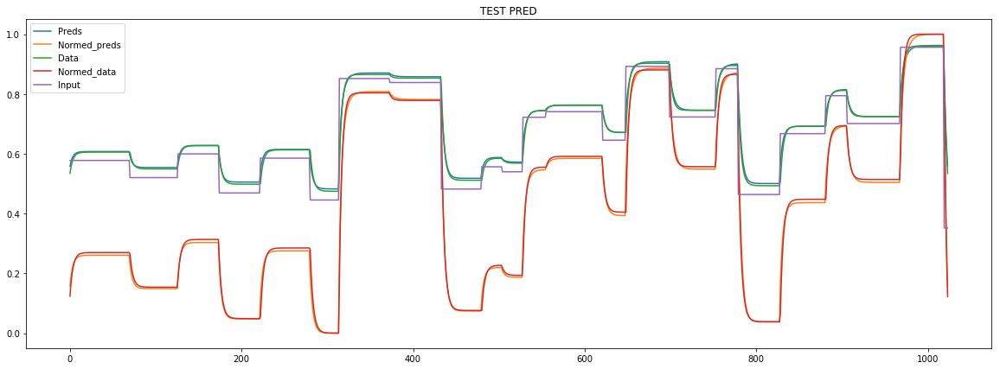

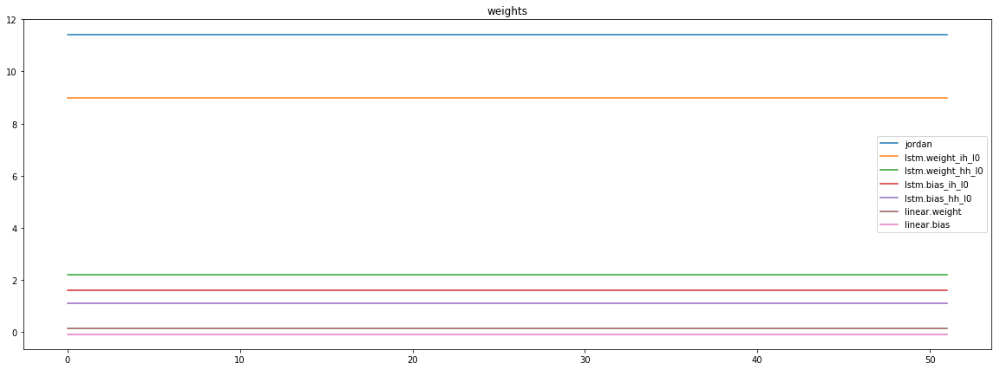

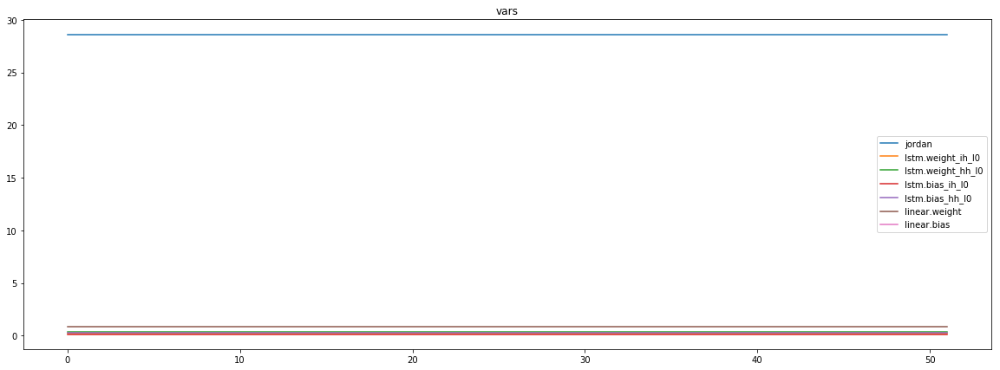

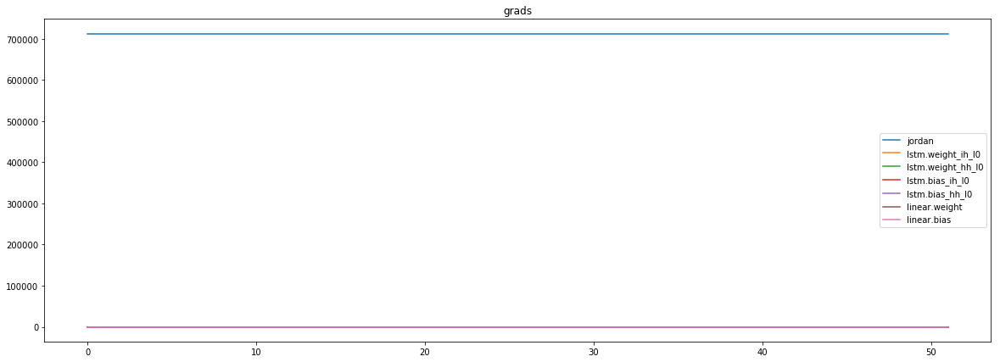

mean_p1 : -23783.447265625
mean_p2 : 728797.5
mean_p3 : 7377.87646484375


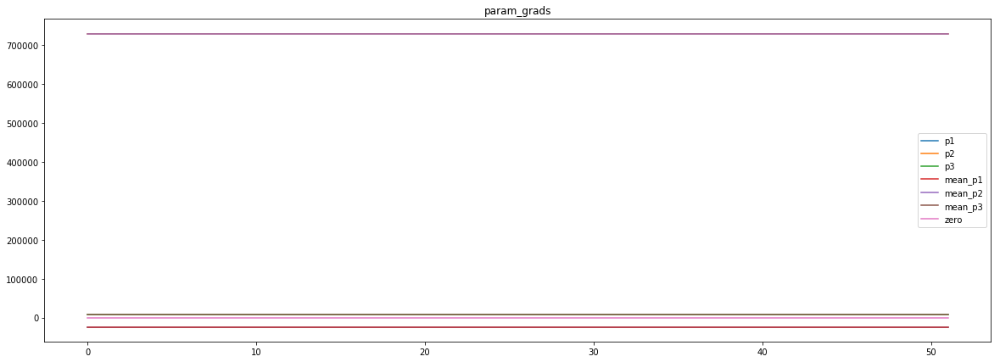

loss rate [0.01899274444524357]
Epoch [70] 
     train_loss[5832.477116511418] 
     eval_train[0.021868939136416327] 
     eval_test[0.022166333232731136]



aux preds: 0.45033395290374756           1.0027588605880737           9.978889465332031
main loss 0.0
aux loss 0.0
jord loss 5982.0401611328125
combined loss 5982.0401611328125 



Parameter containing:
tensor([[0.4503, 1.0028, 9.9789]], requires_grad=True)


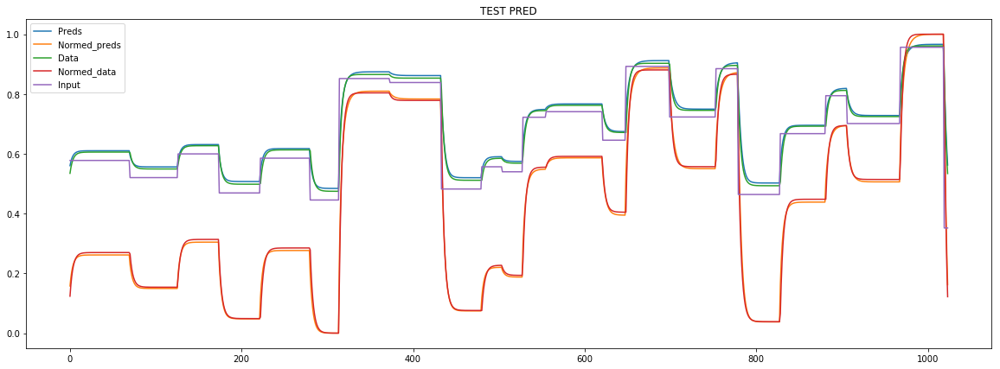

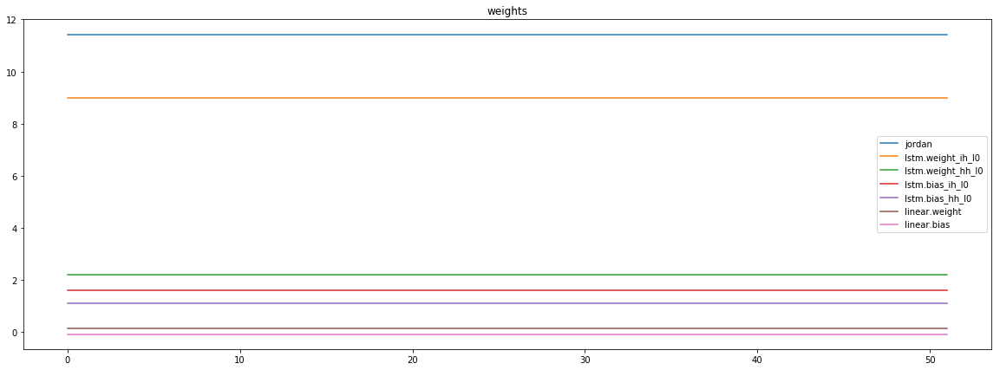

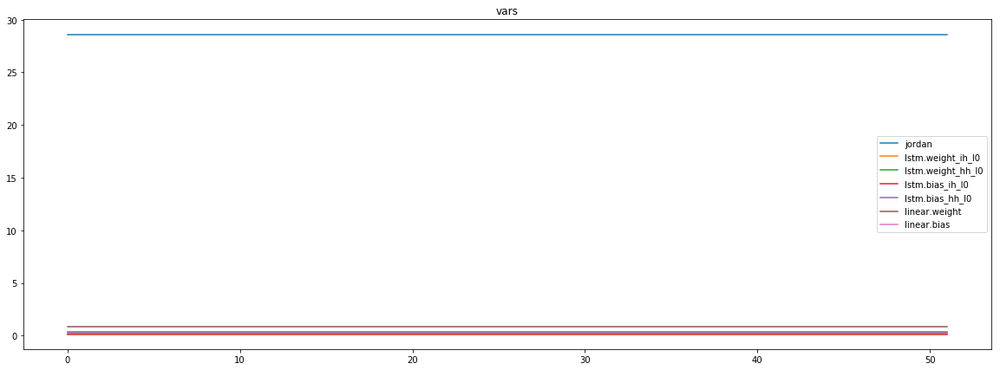

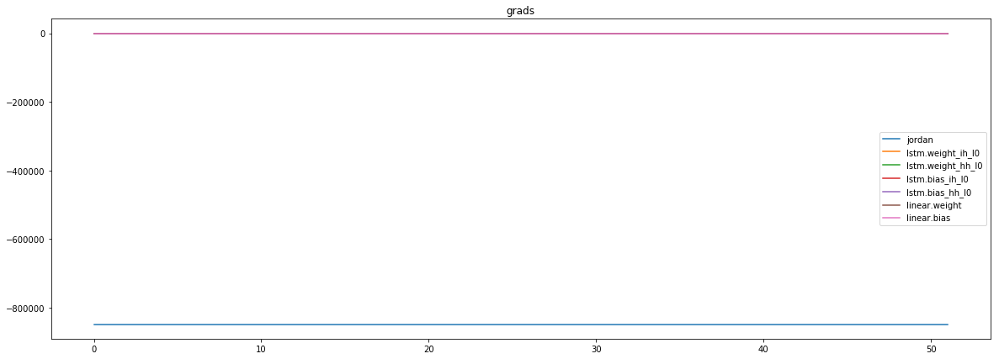

mean_p1 : -45509.30078125
mean_p2 : -794346.6875
mean_p3 : -7935.3056640625


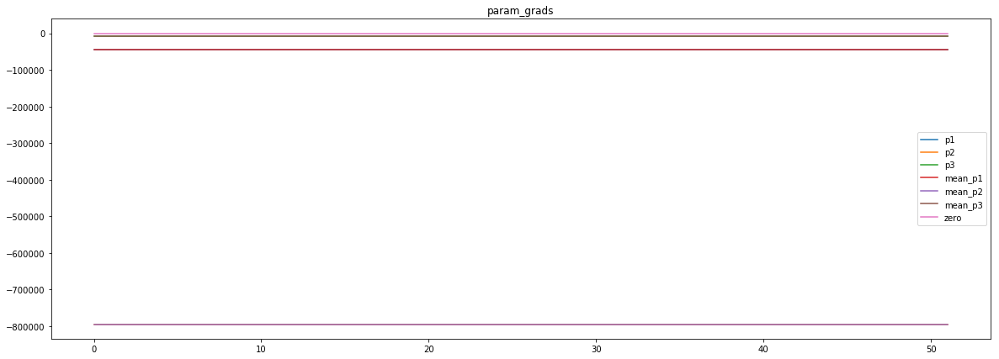

loss rate [-0.2445903424118372]
Epoch [71] 
     train_loss[5982.0401611328125] 
     eval_train[0.028215883255912698] 
     eval_test[0.02871560039156148]



aux preds: 0.44768810272216797           1.0006955862045288           9.976614952087402
main loss 0.0
aux loss 0.0
jord loss 6253.679941030649
combined loss 6253.679941030649 



Parameter containing:
tensor([[0.4477, 1.0007, 9.9766]], requires_grad=True)


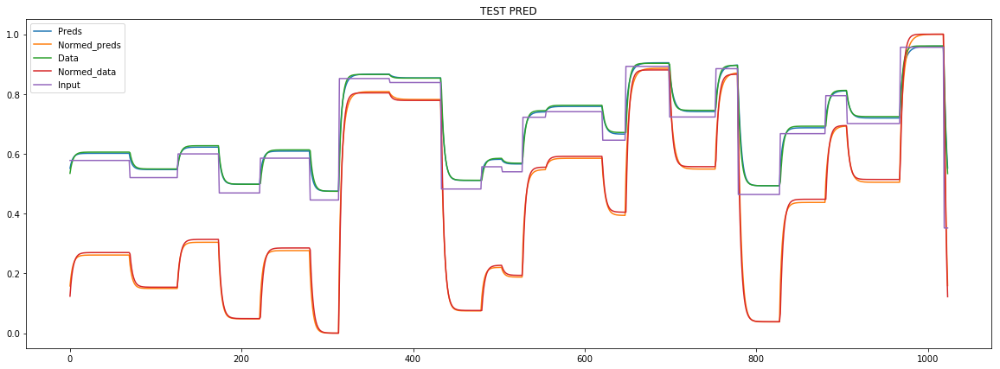

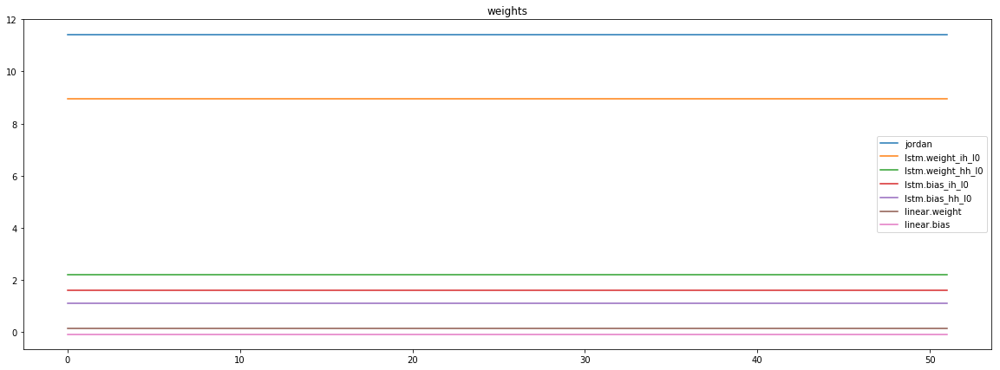

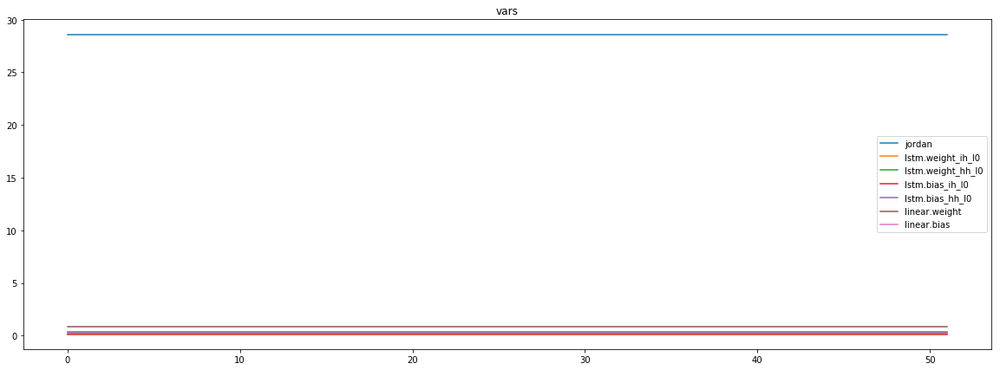

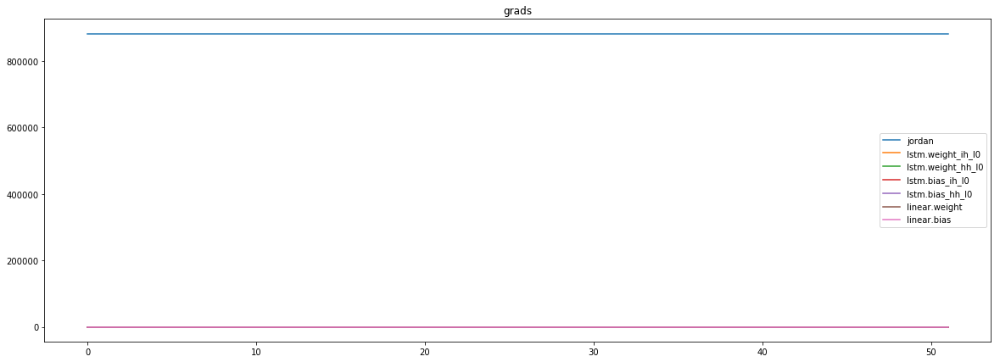

mean_p1 : -32441.306640625
mean_p2 : 905232.0625
mean_p3 : 9087.810546875


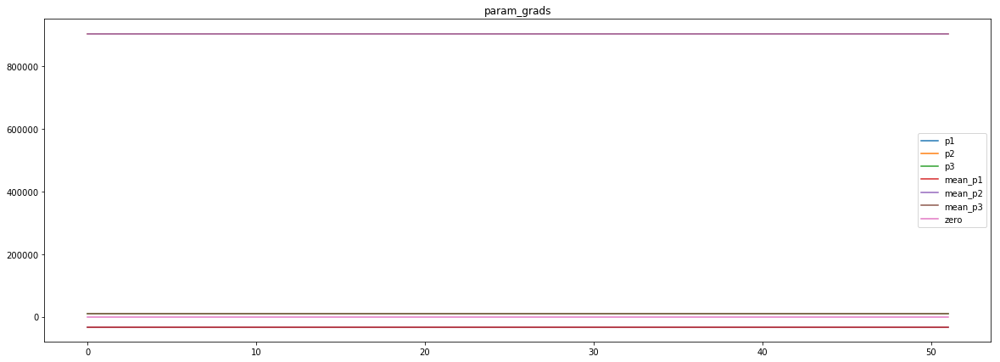

loss rate [0.20874829170612108]
Epoch [72] 
     train_loss[6253.679941030649] 
     eval_train[0.01996836056248587] 
     eval_test[0.020210265279853378]



aux preds: 0.45001840591430664           0.9978051781654358           9.971298217773438
main loss 0.0
aux loss 0.0
jord loss 6369.90517953726
combined loss 6369.90517953726 



Parameter containing:
tensor([[0.4500, 0.9978, 9.9713]], requires_grad=True)


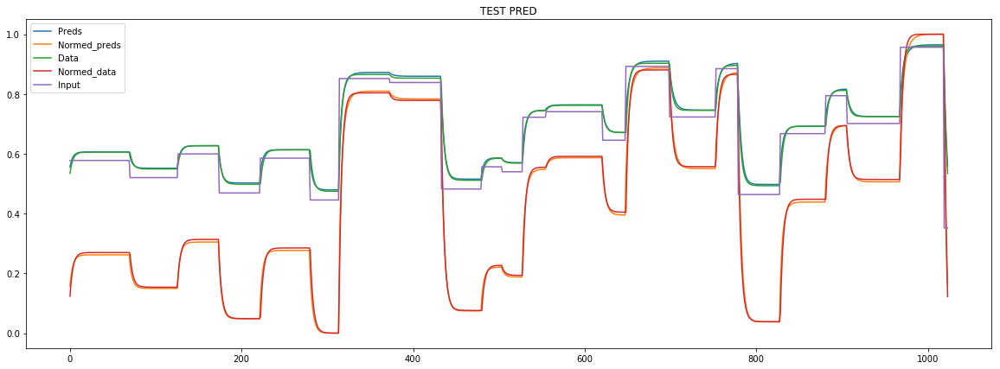

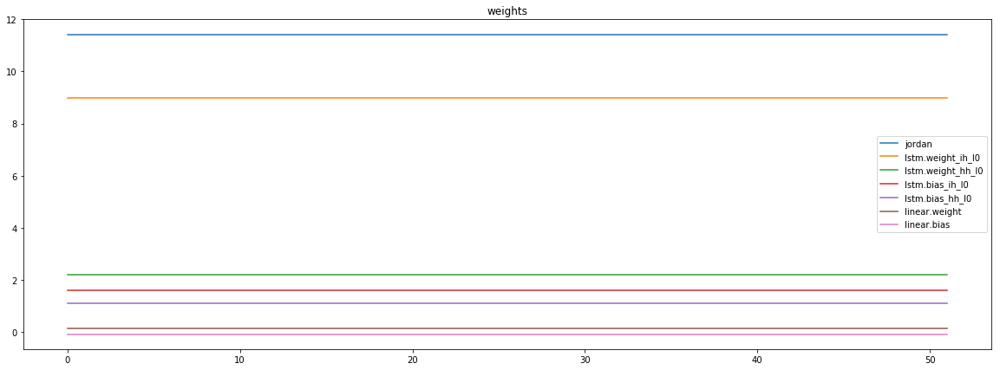

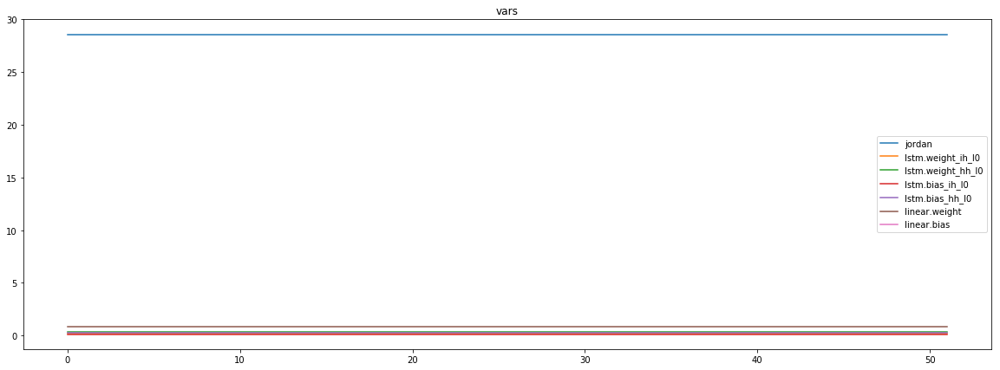

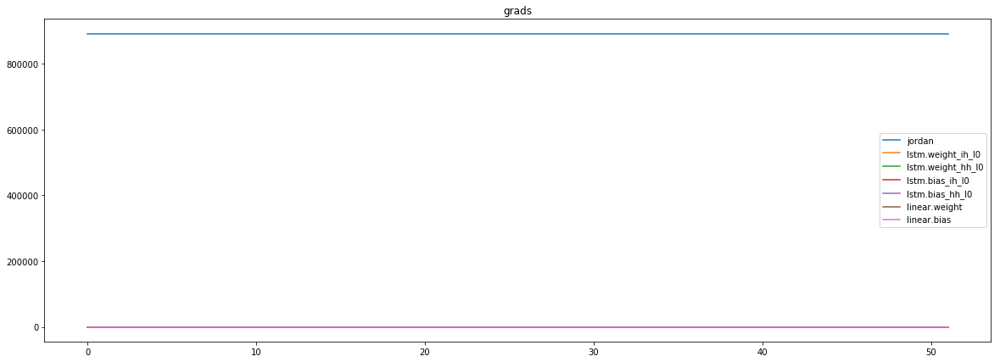

mean_p1 : -27687.060546875
mean_p2 : 910539.5
mean_p3 : 9153.0830078125


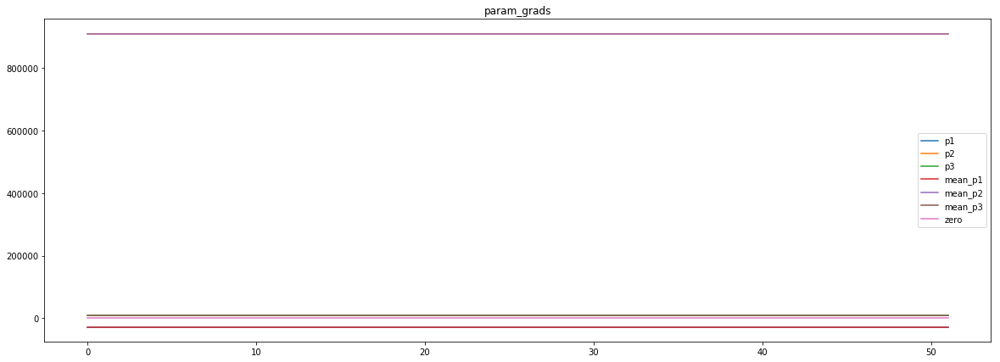

loss rate [0.08486875224456303]
Epoch [73] 
     train_loss[6369.90517953726] 
     eval_train[0.02128412735069455] 
     eval_test[0.021686230896276276]



aux preds: 0.44695377349853516           1.0014663934707642           9.984535217285156
main loss 0.0
aux loss 0.0
jord loss 6181.005385178786
combined loss 6181.005385178786 



Parameter containing:
tensor([[0.4470, 1.0015, 9.9845]], requires_grad=True)


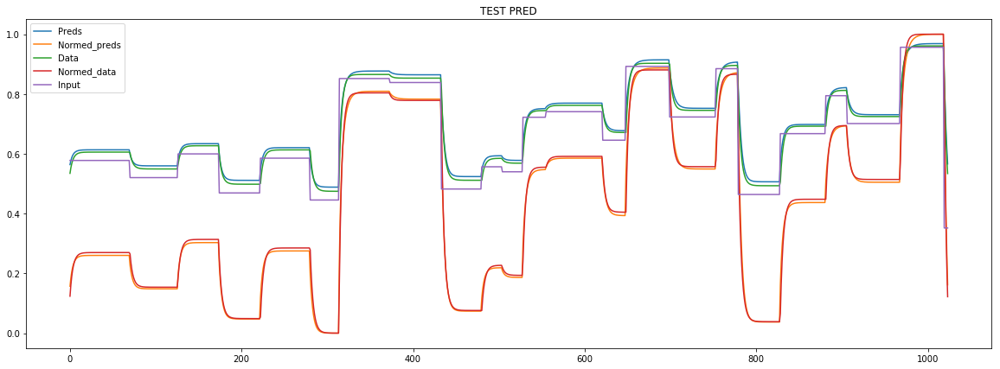

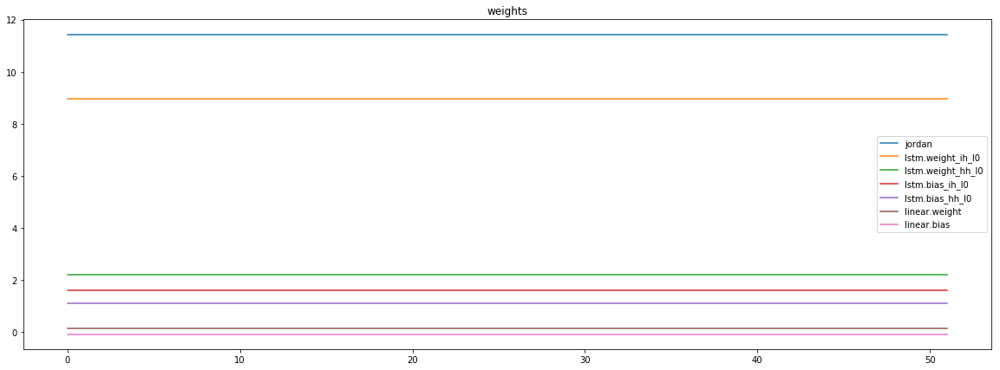

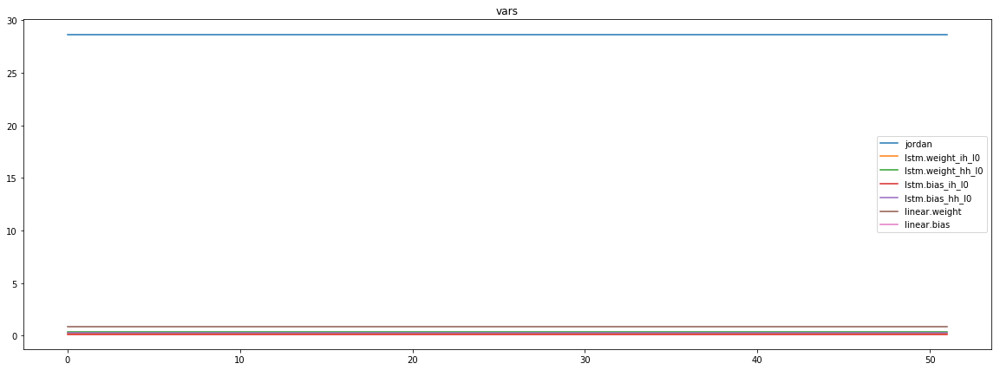

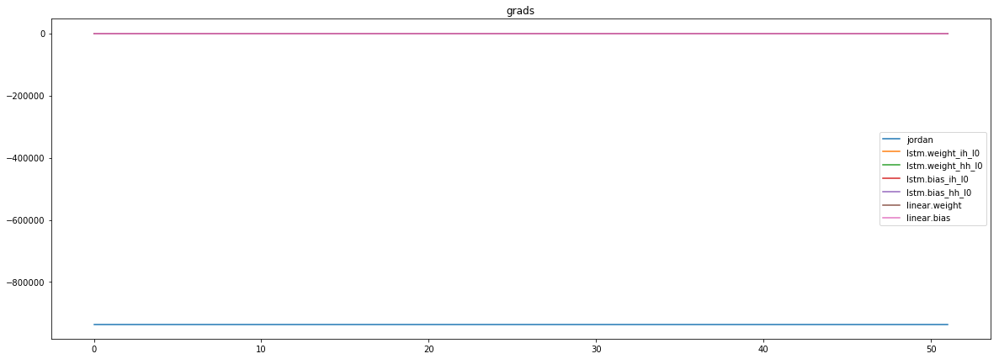

mean_p1 : -48012.86328125
mean_p2 : -878545.5625
mean_p3 : -8698.1533203125


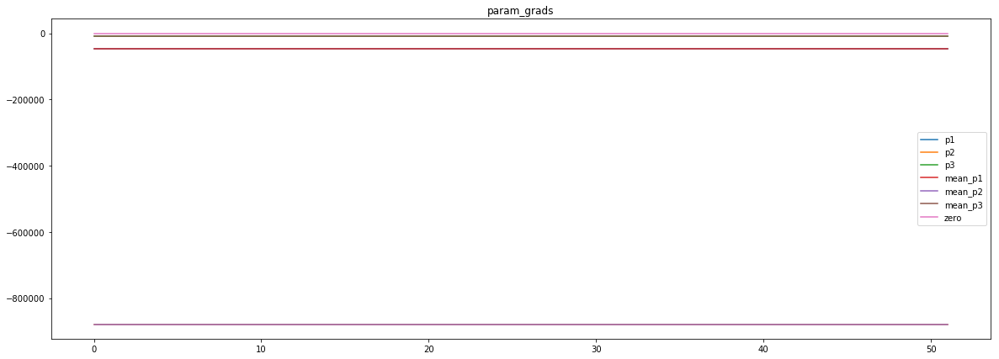

loss rate [-0.3254085037979688]
Epoch [74] 
     train_loss[6181.005385178786] 
     eval_train[0.03083658320541032] 
     eval_test[0.031196624420607062]



aux preds: 0.4508494734764099           0.9970888495445251           9.9802885055542
main loss 0.0
aux loss 0.0
jord loss 6042.699087289663
combined loss 6042.699087289663 



Parameter containing:
tensor([[0.4508, 0.9971, 9.9803]], requires_grad=True)


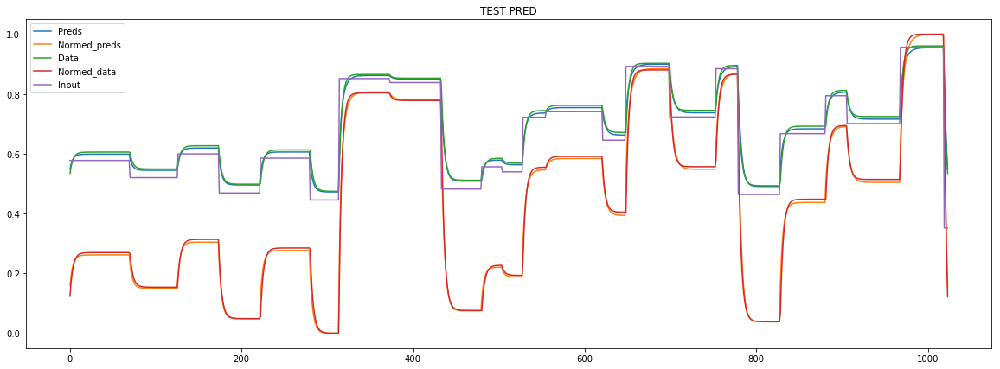

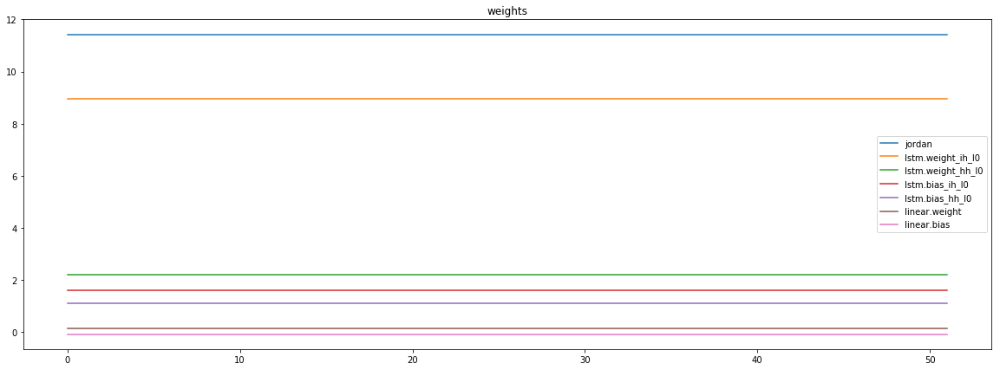

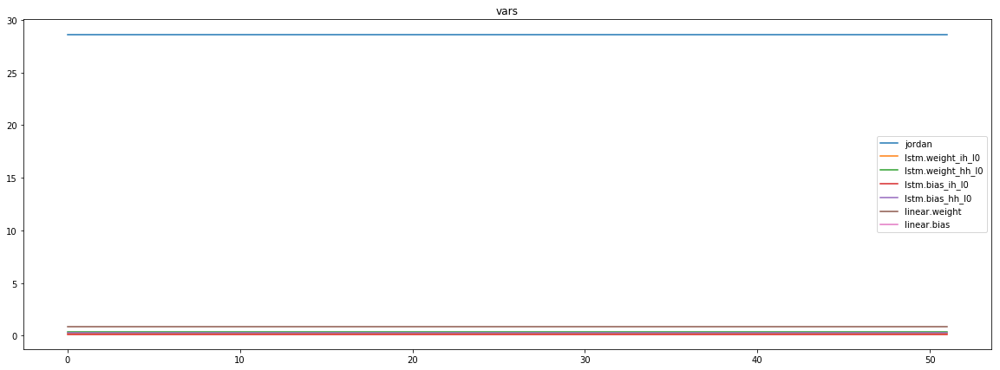

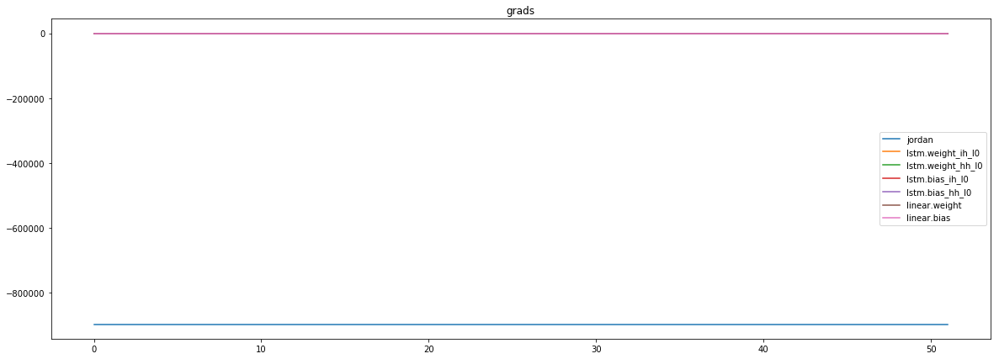

mean_p1 : -1071.24609375
mean_p2 : -887726.5625
mean_p3 : -8892.4423828125


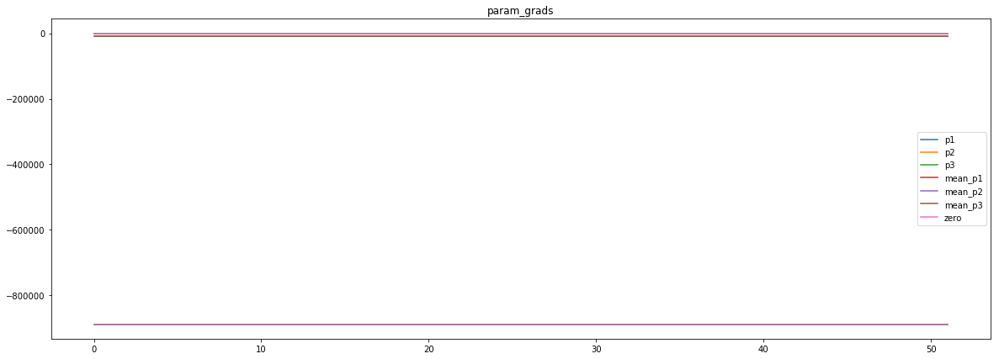

loss rate [-0.1642274667561865]
Epoch [75] 
     train_loss[6042.699087289663] 
     eval_train[0.028198369784289613] 
     eval_test[0.028365672876547746]



aux preds: 0.4490167498588562           1.0020302534103394           9.981161117553711
main loss 0.0
aux loss 0.0
jord loss 6202.528146597056
combined loss 6202.528146597056 



Parameter containing:
tensor([[0.4490, 1.0020, 9.9812]], requires_grad=True)


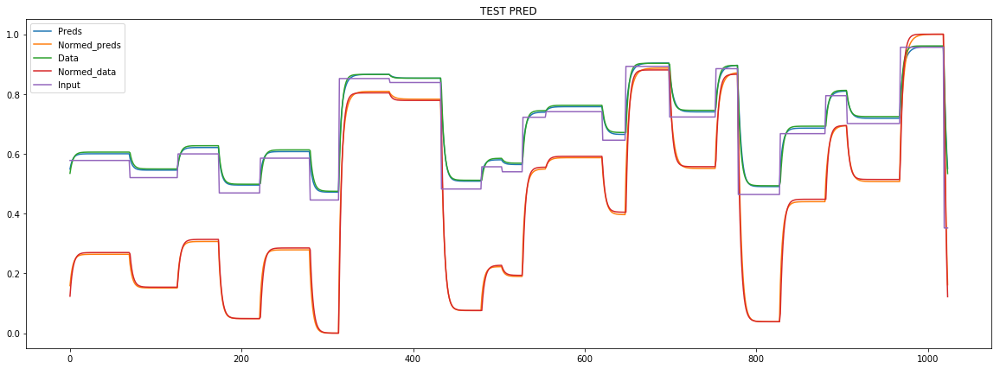

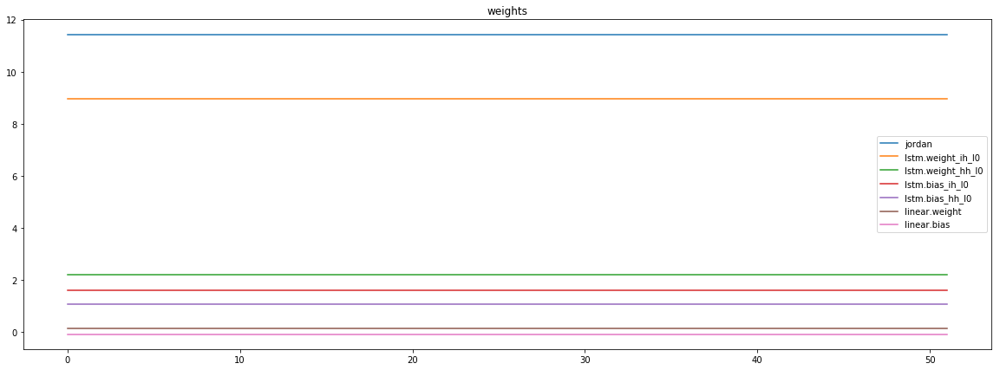

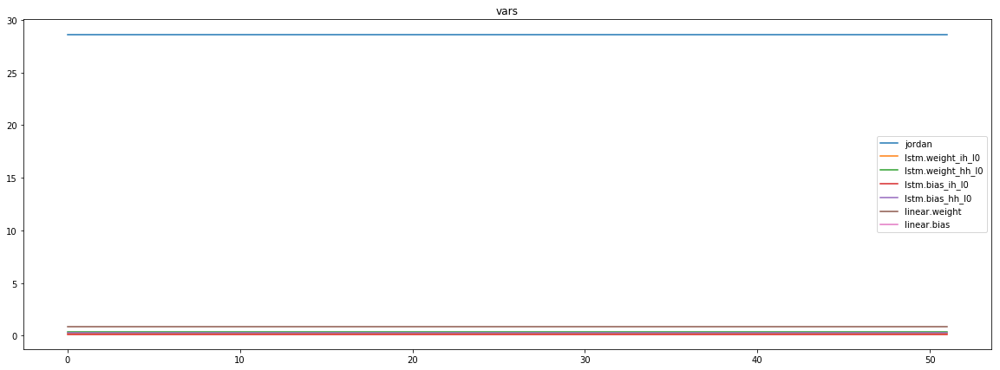

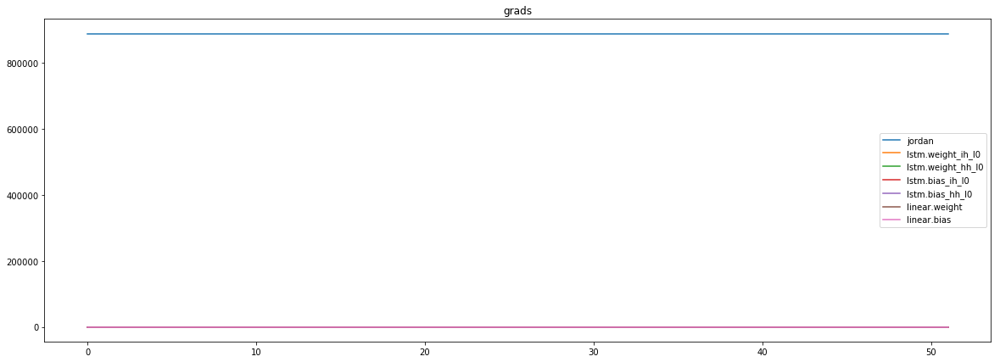

mean_p1 : -34685.15234375
mean_p2 : 914505.125
mean_p3 : 9174.8291015625


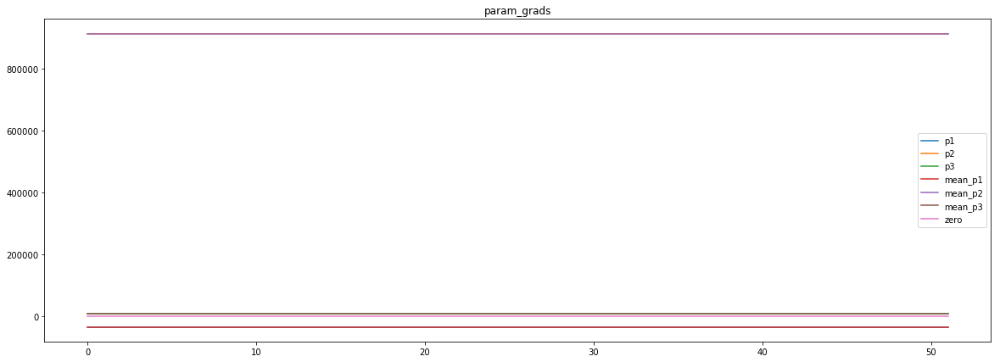

loss rate [0.1733301967853912]
Epoch [76] 
     train_loss[6202.528146597056] 
     eval_train[0.022328128268782166] 
     eval_test[0.02238856827104676]



aux preds: 0.44851061701774597           1.0001596212387085           9.988388061523438
main loss 0.0
aux loss 0.0
jord loss 6167.253619854267
combined loss 6167.253619854267 



Parameter containing:
tensor([[0.4485, 1.0002, 9.9884]], requires_grad=True)


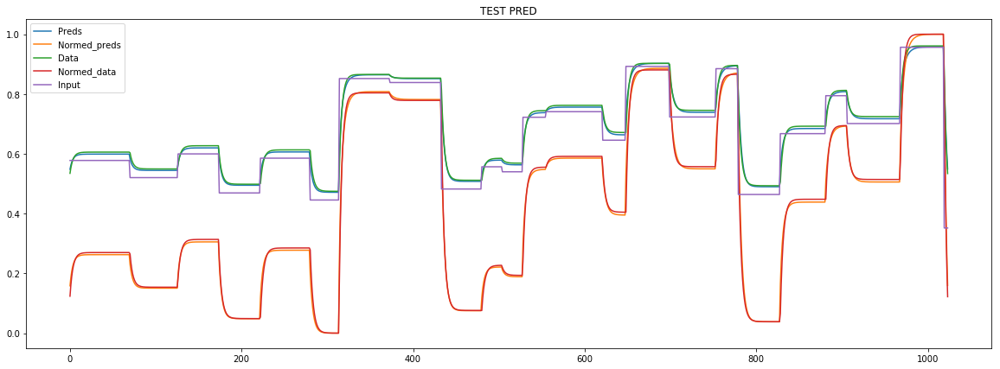

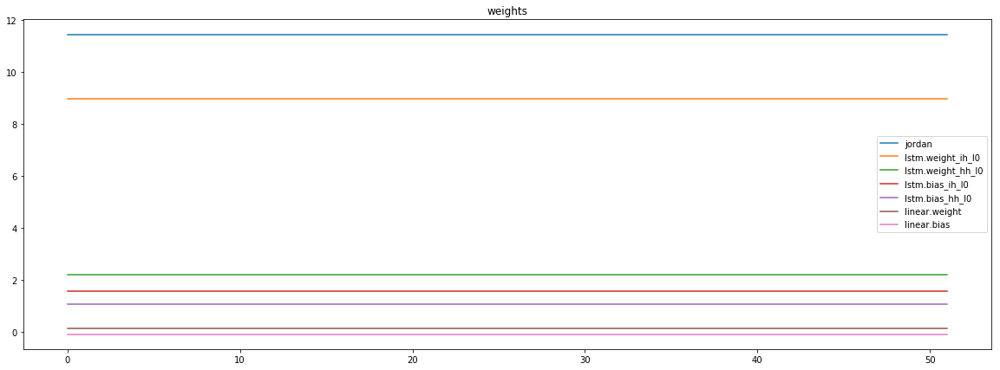

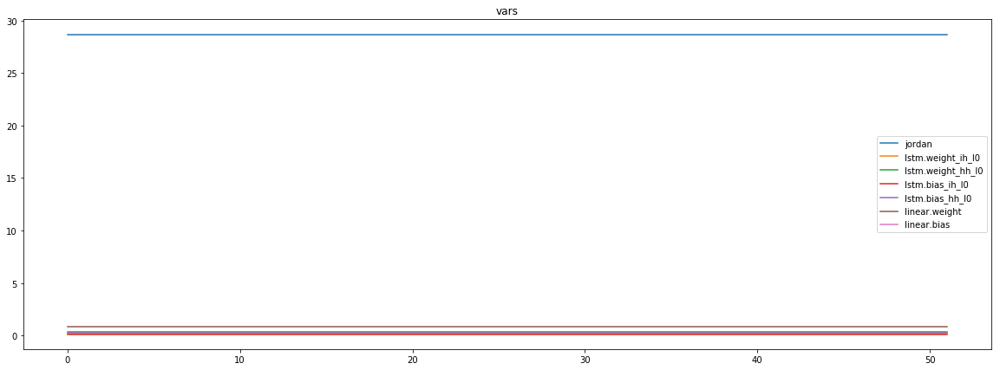

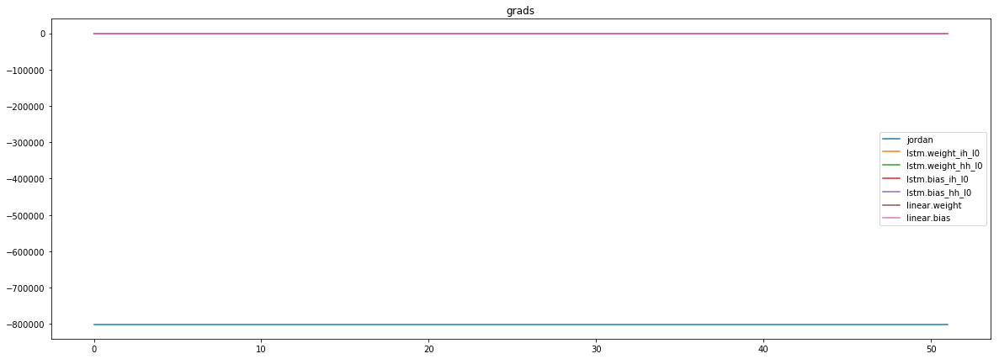

mean_p1 : 33143.4453125
mean_p2 : -824989.875
mean_p3 : -8344.00390625


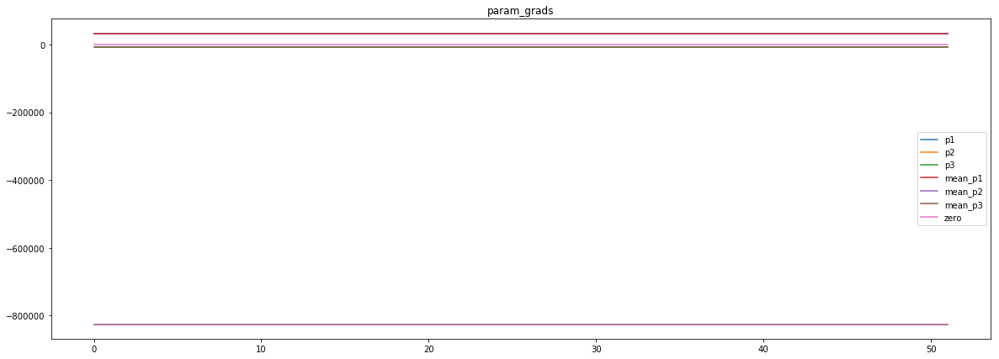

loss rate [0.16704384956448248]
Epoch [77] 
     train_loss[6167.253619854267] 
     eval_train[0.02276957846054127] 
     eval_test[0.022753825836182594]



aux preds: 0.4465150535106659           1.0019863843917847           9.99112319946289
main loss 0.0
aux loss 0.0
jord loss 5919.335561899038
combined loss 5919.335561899038 



Parameter containing:
tensor([[0.4465, 1.0020, 9.9911]], requires_grad=True)


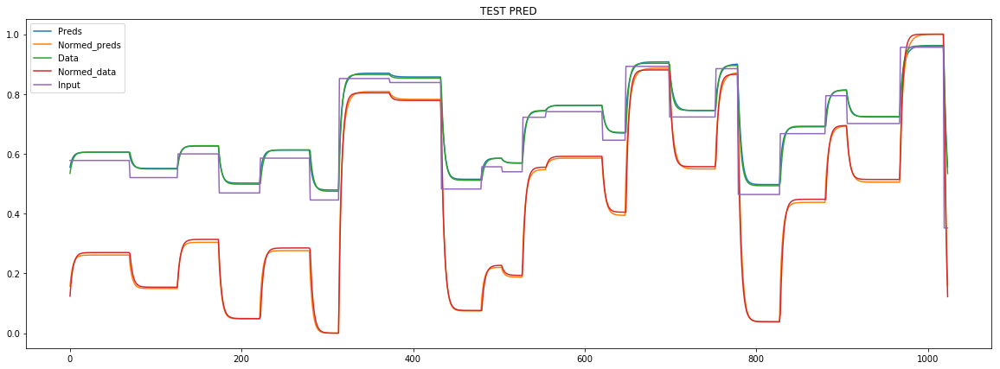

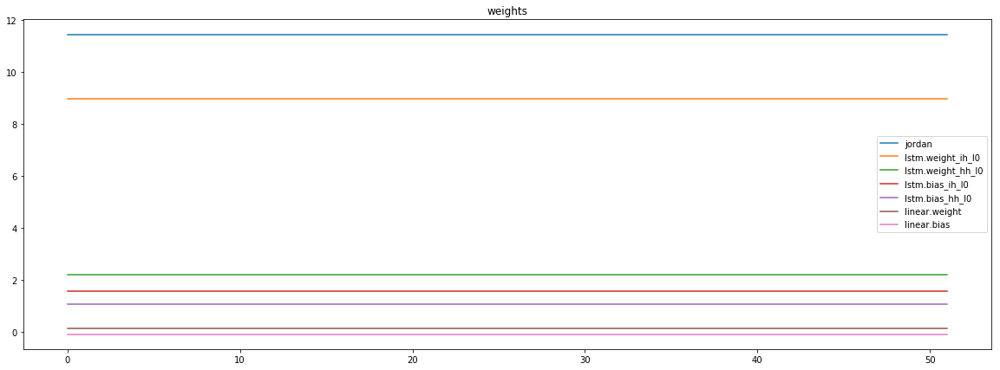

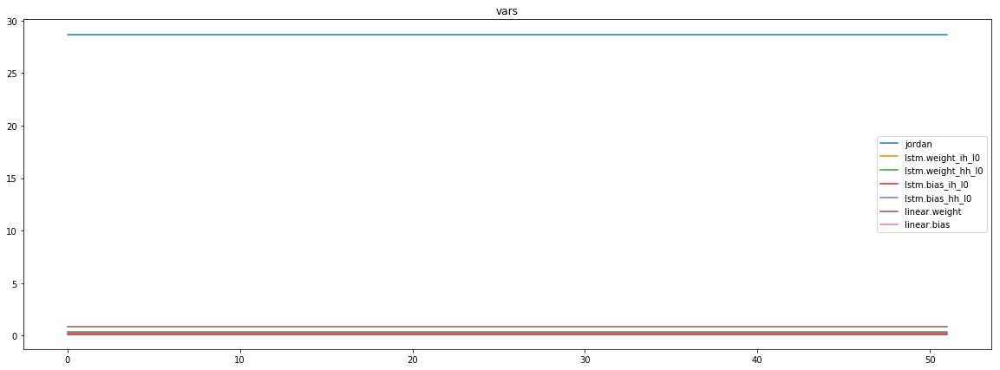

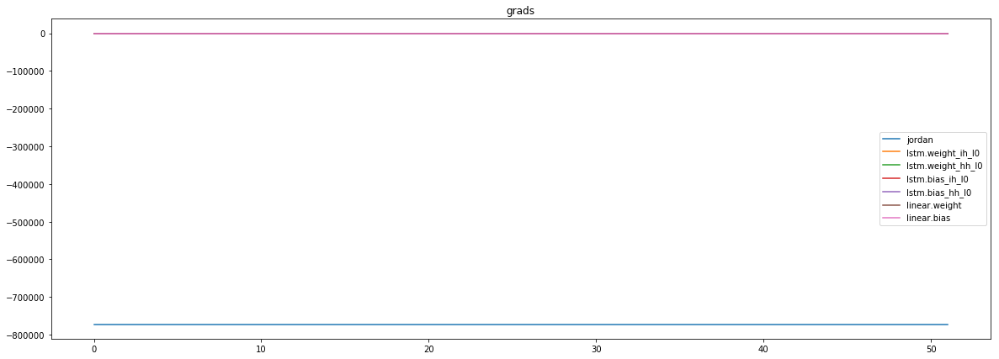

mean_p1 : -2393.403076171875
mean_p2 : -761916.4375
mean_p3 : -7691.53369140625


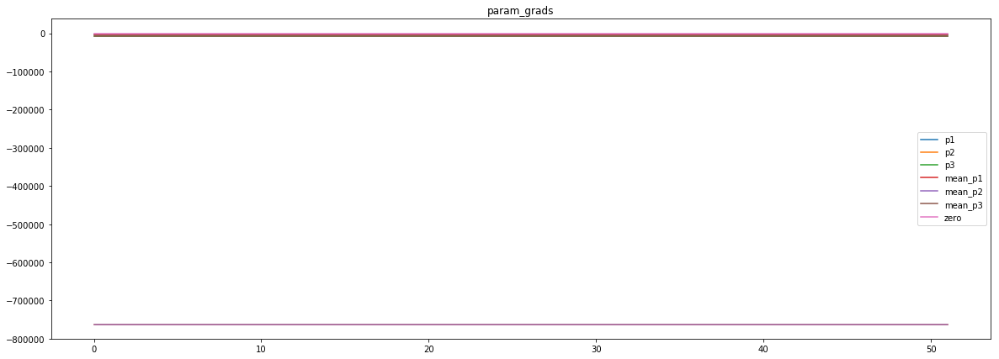

loss rate [0.10938102552822804]
Epoch [78] 
     train_loss[5919.335561899038] 
     eval_train[0.02137421751880398] 
     eval_test[0.021822559744164624]



aux preds: 0.44629374146461487           1.0005052089691162           9.982930183410645
main loss 0.0
aux loss 0.0
jord loss 6539.260544996995
combined loss 6539.260544996995 



Parameter containing:
tensor([[0.4463, 1.0005, 9.9829]], requires_grad=True)


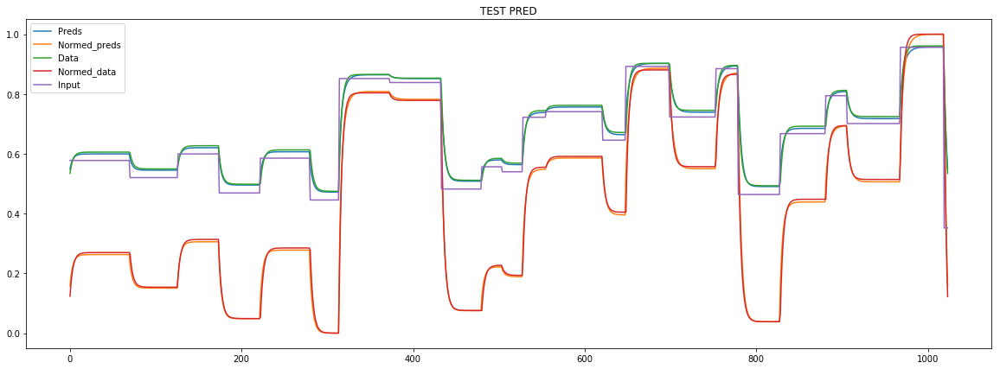

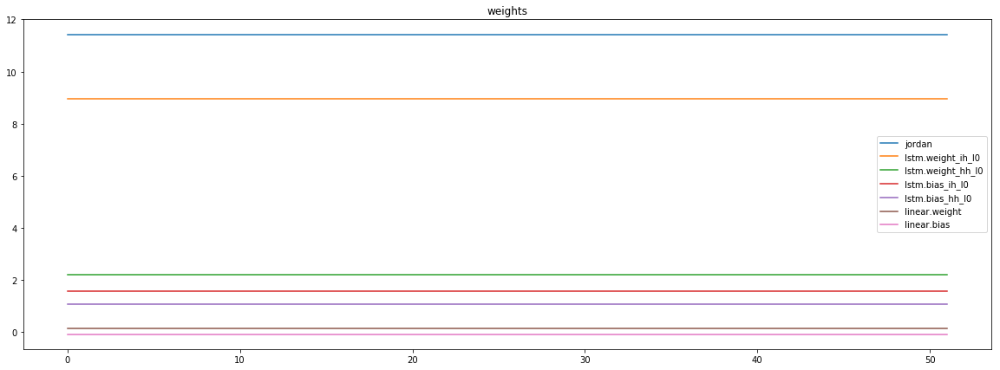

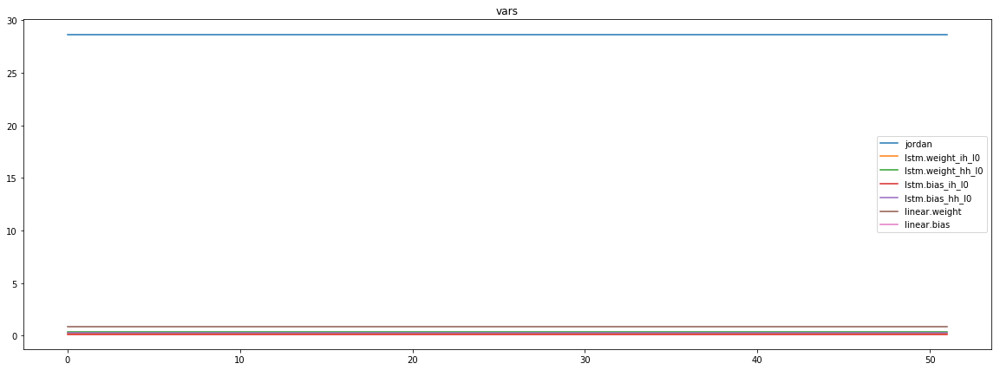

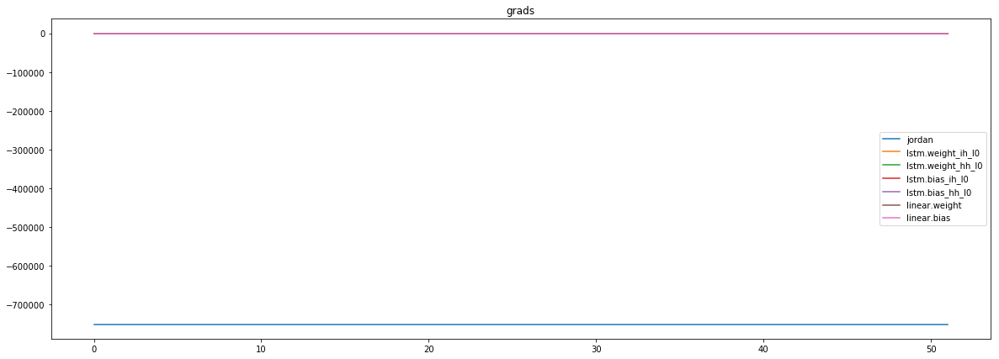

mean_p1 : 45572.7265625
mean_p2 : -788839.4375
mean_p3 : -7990.60791015625


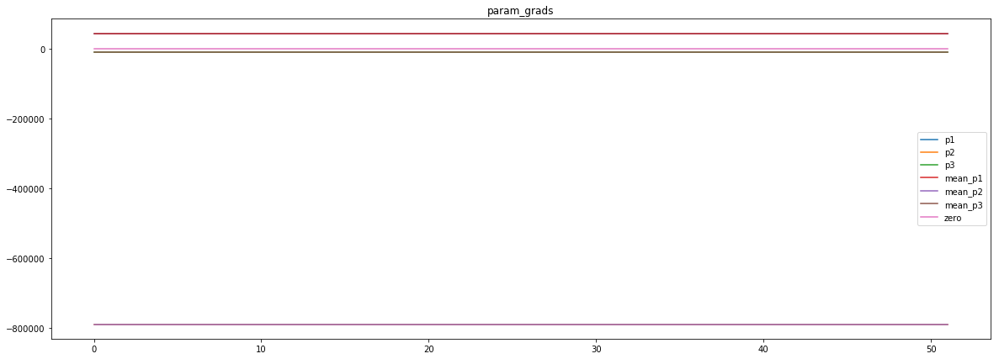

loss rate [-0.00021497218613242275]
Epoch [79] 
     train_loss[6539.260544996995] 
     eval_train[0.02228175137973337] 
     eval_test[0.022326449817972556]


In [21]:
logging.info("Training process STARTED")

model.hidden = model.init_hidden()


for t in range(num_epochs):
    
    batch_local_hist = hist["train"]["batches"]
    long_term_hist = hist["train"]["epochs"]
    
    for i, data in enumerate(tqdm(train_dl)):
        
        model.hidden = model.init_hidden()
        
        y_pred, jordan = batch_iteration(
            iter_index=i,
            model=model,
            optimizer=optimizer,
            batch_data=data,
            backprop=True,
            hist_part=batch_local_hist
        )
        
    hist['mean_params_sample']['1'][t] = jordan[:, 0].item()
    hist['mean_params_sample']['2'][t] = jordan[:, 1].item()
    hist['mean_params_sample']['3'][t] = jordan[:, 2].item()
    
    print(f"aux preds: {hist['mean_params_sample']['1'][t]} \
          {hist['mean_params_sample']['2'][t]} \
          {hist['mean_params_sample']['3'][t]}")
    
    mean_losses = update_long_term_hist(batches_hist=batch_local_hist,
                                                            long_term_hist=long_term_hist)
    mean_main, mean_aux, mean_jord = mean_losses
    # TODO add w8 decay
    print(f"main loss {mean_main}")
    print(f"aux loss {mean_aux}")
    print(f"jord loss {mean_jord}")
    print(f"combined loss {sum(mean_losses)} ")
    
    # VISUALISE TRAINING PROGRESS
#     x_batch, y_batch, indexes = data
#     plot_shared_scale([
#         (y_pred[:, 0].detach().numpy(),"Preds" ),
#          (y_batch[:, 0].detach().numpy(), "Data"),
#          (x_batch[-1].detach().numpy(), "Input")
#         ],
#         title="TRAIN PREDICT")
          
#     residuals = y_batch[:, 0] - y_pred[:, 0]
#     plot_multiscale([
#         (residuals.detach().numpy(), "Red"),
#         (y_batch[:, 0].detach().numpy(), "Green"),
#         (y_pred[:, 0].detach().numpy(), "Brown")
#     ],
#         title="TRAIN RESID"
#     ) 
    # /VISUALISE TRAINING PROGRESS

    # EVAL
    with torch.no_grad():
          
          model = model.eval()
          
          for i, data in enumerate(tqdm(train_dl)):
              batch_local_hist = hist['eval_train']['batches']
              long_term_hist=hist["eval_train"]["epochs"]
              y_pred, jordan = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          
          for i, data in enumerate(tqdm(test_dl)):
              batch_local_hist = hist['eval_test']['batches']
              long_term_hist=hist["eval_test"]["epochs"]
          
              y_pred_test, jordan = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          model = model.train()
    # /EVAL
          
    # VISUALISE ITERATION PRED
    x_batch_test, y_batch_test, indexes = data
    print(jordan)
          
    sample_y_pred_test = y_pred_test[:, 0].detach().numpy().copy()
    sample_y_pred_test -= np.min(sample_y_pred_test)
    sample_y_pred_test /= (np.max(sample_y_pred_test) - np.min(sample_y_pred_test))
    normed_data = y_batch_test[:, 0].detach().numpy().copy()
    normed_data -= np.min(normed_data)
    normed_data /= (np.max(normed_data) - np.min(normed_data))
    plot_shared_scale([
            (y_pred_test[:, 0].detach().numpy(), "Preds"),
            (sample_y_pred_test,"Normed_preds" ),
             (y_batch_test[:, 0].detach().numpy(), "Data"),
             (normed_data, "Normed_data"),
             (x_batch_test[-1].detach().numpy(), "Input")
    ],
        title = 'TEST PRED'
    )
    
#           print(y_pred.detach().numpy() == y_batch().detach().numpy())
#     plt.plot(y_pred.detach().numpy())
#     plt.show()
    
          # /VISUALISE ITERATION PRED
   
               
    plot_shared_scale([(v,k)for k, v in hist['weights']['batches'].items()], title='weights')
    plot_shared_scale([(v,k)for k, v in hist['vars']['batches'].items()], title='vars')
    plot_shared_scale([(v,k)for k, v in hist['grads']['batches'].items()], title='grads')
    
    param_grads = [(v,k) for k, v in hist['param_grads']['batches'].items()]
    param_grads_means = [ (np.full(v.shape, np.mean(v)), 'mean_' + k ) for v,k in param_grads]
    for par_gr_mean, name in param_grads_means:
          print(f"{name} : {par_gr_mean[0]}")
    plot_shared_scale(param_grads + param_grads_means +
                      [(np.zeros(len(train_dl)), 'zero')], title='param_grads')
          
    visualise_resid = False
    if visualise_resid:
        residuals = y_batch_test[:, 0] - y_pred_test[:, 0]
        plot_multiscale(
                [
                 (residuals.detach().numpy(), "Red"), 
                 (y_batch_test[:, 0].detach().numpy(),"Green")
                ],
            title = 'TEST RESID'
        )
    
    
    # UPDATE LR
    val_loss = slice_loss_sum(hist['eval_test']['epochs'], t)
    scheduler.step(val_loss)
    hist['weights_sum'][t] = torch.as_tensor([p.sum() for p in model.parameters(recurse=True)]).sum().item()
    hist['weights_var'][t] = torch.as_tensor([p.var() for p in model.parameters(recurse=True)]).sum().item()
    
    for name, parameter in model.named_parameters():
          hist['grads']['epochs'][name][t] = np.mean(hist['grads']['batches'][name])
          hist['weights']['epochs'][name][t] = np.mean(hist['weights']['batches'][name])
          hist['vars']['epochs'][name][t] = np.mean(hist['vars']['batches'][name])
    hist['param_grads']['epochs']['p1'][t] = np.mean(hist['param_grads']['batches']['p1'])
    hist['param_grads']['epochs']['p2'][t] = np.mean(hist['param_grads']['batches']['p2'])

    hist['param_grads']['epochs']['p3'][t] = np.mean(hist['param_grads']['batches']['p3'])
          
          
    
    hist['lr'][t] = scheduler.optimizer.param_groups[0]['lr']
#     if hist['lr'][t] <= 10**p_sched['early_stop_order'] * 1.0001: # 1+eps 
#           print("Loss critically low, EARLY STOPPING")
#           break
          
    if t > 3:
          h = hist["eval_test"]["epochs"]
          loss_rate = 1 - slice_loss_sum(h, t) / np.mean([slice_loss_sum(h, k) for k in range(t-3,t)])          
          hist['loss_rate'][t] = loss_rate              
          print(f"loss rate [{loss_rate}]")
    # /UPDATE LR
                       
    # FINAL PROGRESS LOGGING
    msg = "Epoch [{t}] \n \
    train_loss[{train_loss}] \n \
    eval_train[{eval_train}] \n \
    eval_test[{eval_test}]".format(t=t,
                                train_loss=sum([val[t] for val in hist['train']['epochs'].values()]), 
                                eval_train=sum([val[t] for val in hist['eval_train']['epochs'].values()]),
                                eval_test=sum([val[t] for val in hist['eval_test']['epochs'].values()])
                               )
    print(msg)
    logging.info(msg)
                       
    # /FINAL PROGRESS LOGGING

In [22]:
timestamp = datetime.datetime.now().strftime("%d_%B_%I_%M%p")
specifier = f"{p_net['jordan_nodes']}_{p_net['num_layers']}l_{p_net['hidden_size']}n_{int(p_net['bias'])}b"
print(specifier)
print(timestamp)
specifier = f"{p_net['num_layers']}l {p_net['hidden_size']}h {int(p_net['bias'])}b"
filename = f'jordan_full_{specifier}_{timestamp}.pt'
torch.save(model, filename)
filename

3_1l_2n_1b
18_May_04_09PM


'jordan_full_1l 2h 1b_18_May_04_09PM.pt'

In [23]:

filename

'jordan_full_1l 2h 1b_18_May_04_09PM.pt'

In [24]:
def get_size(dicts):
    acc = 0
    for key, val in dicts.items():
        if type(val) == dict:
            print(key)
            acc += get_size(val)            
        else:
            acc+=sys.getsizeof(val)
    return acc

In [25]:

get_size(hist) / 1024

train
batches
epochs
eval_train
batches
epochs
eval_test
batches
epochs
mean_params_sample
grads
batches
epochs
weights
batches
epochs
vars
batches
epochs
param_grads
batches
epochs
grad_global


328.515625

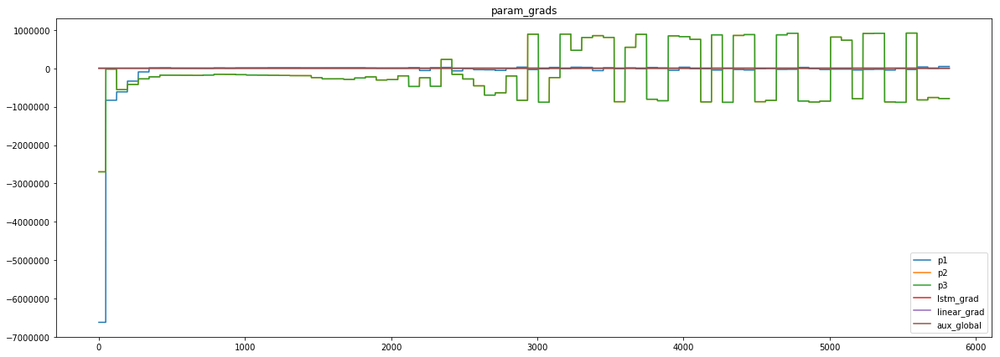

In [26]:
s = 100
e = -1
plot_shared_scale([
    (hist['grad_global']['p1'][s:e], 'p1'),
    (hist['grad_global']['p2'][s:e], 'p2'),
    (hist['grad_global']['p2'][s:e], 'p3'),
    (hist['grad_global']['lstm'][s:e], 'lstm_grad'),
    (hist['grad_global']['linear'][s:e], 'linear_grad'),
    (hist['aux_global'][s:e], 'aux_global')
], title="param_grads")
s =  10
e = -1

In [27]:
s, e = 0, t

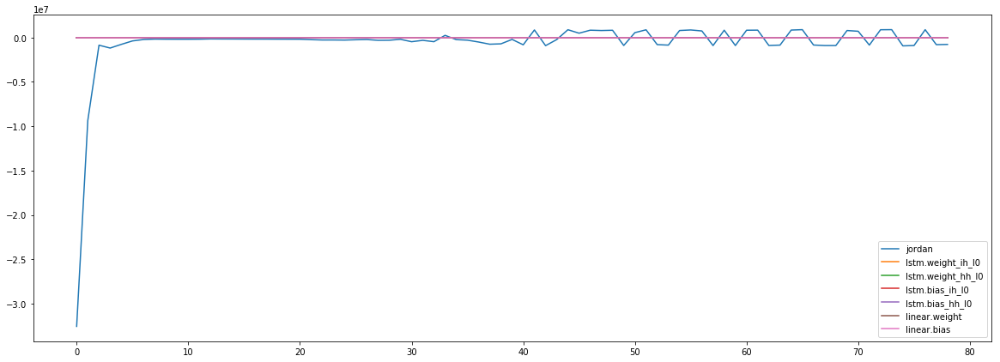

In [28]:
plot_shared_scale([(v[s:e],k)for k, v in hist['grads']['epochs'].items()])

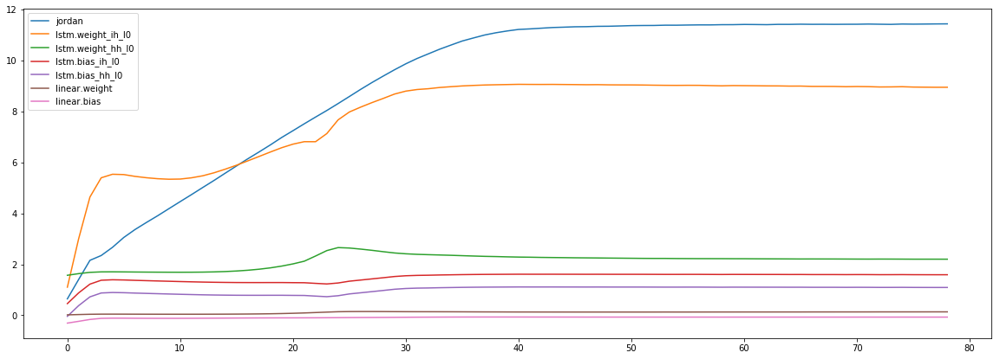

In [29]:
plot_shared_scale([(v[s:e],k)for k, v in hist['weights']['epochs'].items()])

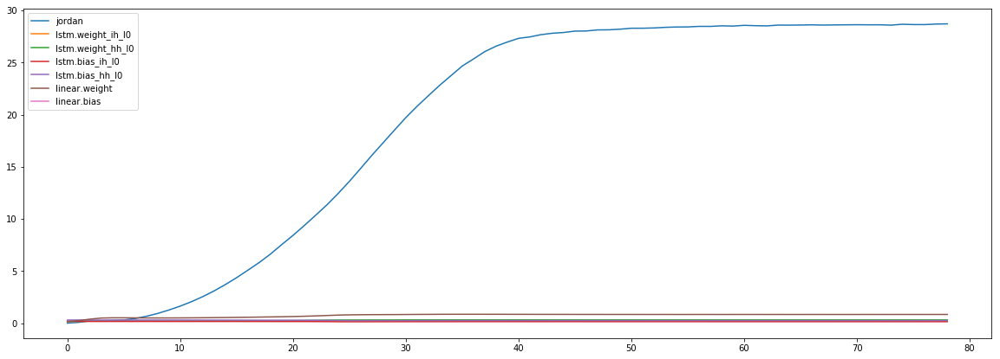

In [30]:
plot_shared_scale([(v[s:e],k)for k, v in hist['vars']['epochs'].items()])

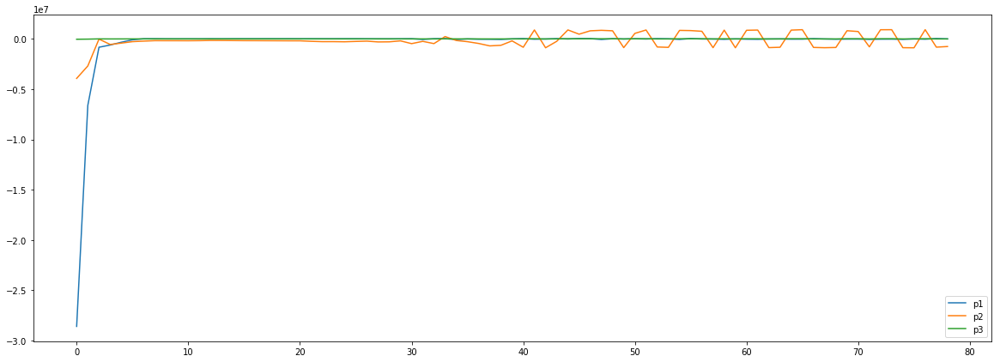

In [31]:
s = 0
plot_shared_scale([(v[s:e],k)for k, v in hist['param_grads']['epochs'].items()])

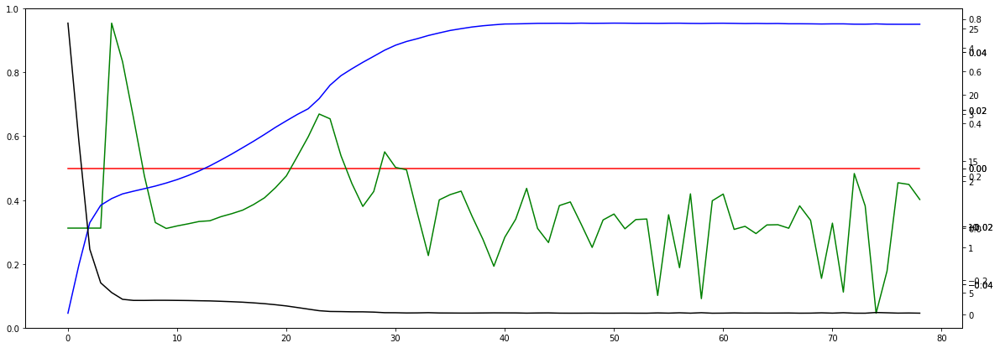

In [32]:
s, e = 0, t
plot_multiscale([
    (hist['lr'][s:e],"Red" ),
    (hist['loss_rate'][s:e], "Green"),
    (hist['weights_sum'][s:e], "Blue"),
    (hist['weights_var'][s:e], "Yellow"),
    (hist['eval_test']['epochs']['aux'][s:e], "Black")
])

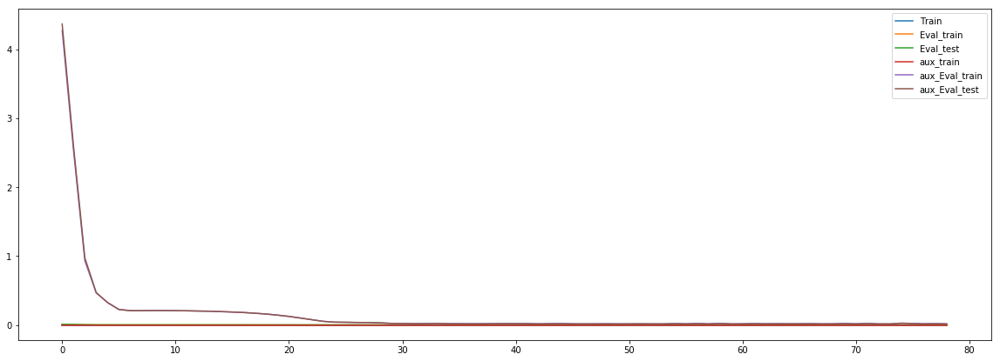

In [33]:
plot_shared_scale([
    (hist['train']["epochs"]['main'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

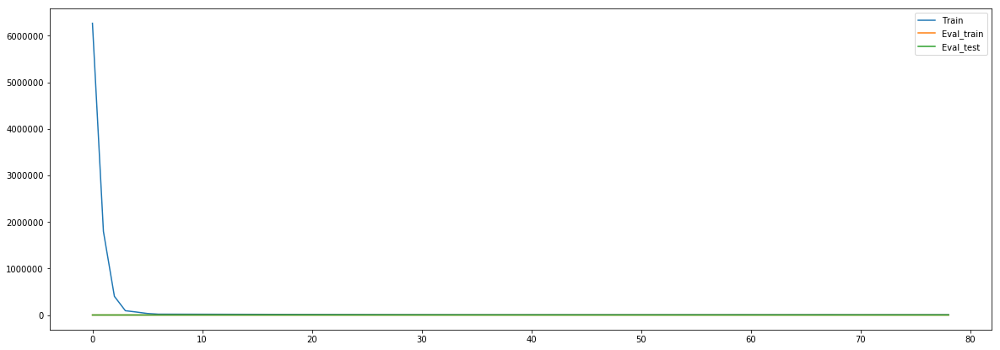

In [34]:
plot_shared_scale([
    (hist['train']["epochs"]['jordan'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['jordan'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['jordan'][s:e], "Eval_test"),
#     (hist['train']["epochs"]['aux'][s:e], "aux_train"),
#     (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
#     (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

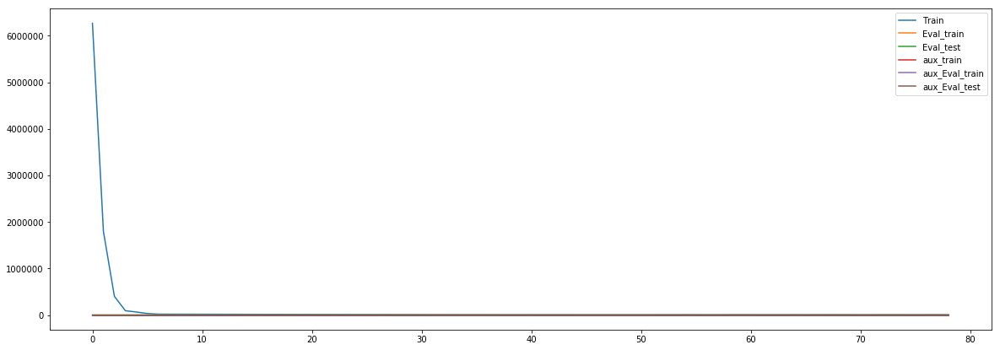

In [35]:
plot_shared_scale([
    (hist['train']["epochs"]['jordan'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['jordan'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['jordan'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

In [36]:
# To the prove of faster convergence

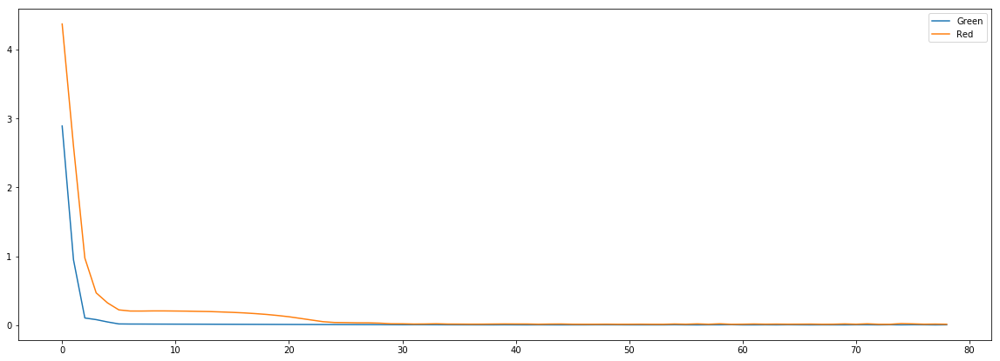

In [37]:
plot_shared_scale(
[
    (hist['eval_test']["epochs"]['jordan'][s:e], 'Green'),
    
    (hist['eval_test']["epochs"]['aux'][s:e], 'Red'),
]
)

In [38]:
for n, v in model.named_parameters():
    print(n, "\t", v.shape, "\t", v.sum())

jordan 	 torch.Size([1, 3]) 	 tensor(11.4297, grad_fn=<SumBackward0>)
lstm.weight_ih_l0 	 torch.Size([8, 4]) 	 tensor(8.9443, grad_fn=<SumBackward0>)
lstm.weight_hh_l0 	 torch.Size([8, 2]) 	 tensor(2.2014, grad_fn=<SumBackward0>)
lstm.bias_ih_l0 	 torch.Size([8]) 	 tensor(1.5913, grad_fn=<SumBackward0>)
lstm.bias_hh_l0 	 torch.Size([8]) 	 tensor(1.0914, grad_fn=<SumBackward0>)
linear.weight 	 torch.Size([1, 2]) 	 tensor(0.1358, grad_fn=<SumBackward0>)
linear.bias 	 torch.Size([1]) 	 tensor(-0.0703, grad_fn=<SumBackward0>)


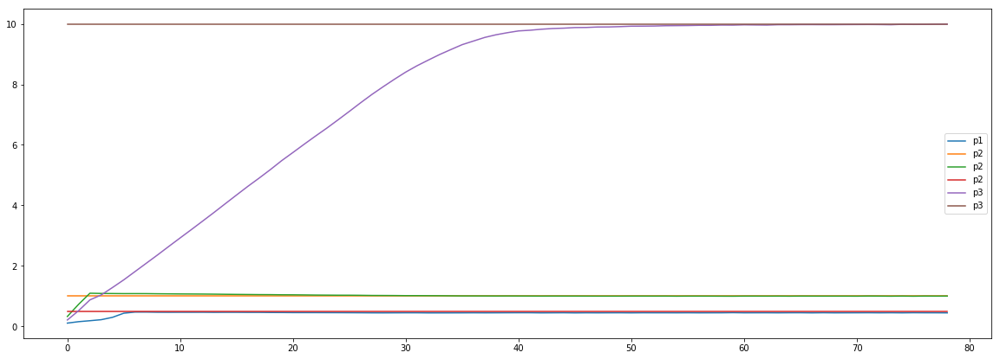

In [39]:
plot_shared_scale([
                  (hist['mean_params_sample']['1'][s:e], "p1"),
                  ((hist['mean_params_sample']['2']*0 + 1)[s:e], "p2"),
                  (hist['mean_params_sample']['2'][s:e], "p2"),
                  ((hist['mean_params_sample']['2']*0 + 0.5)[s:e], "p2"),
    (hist['mean_params_sample']['3'][s:e], "p3"),
                  ((hist['mean_params_sample']['2']*0 + 10)[s:e], "p3")
])

In [40]:
model.buffers

<bound method Module.buffers of LSTM_jordan(
  (lstm): LSTM(4, 2)
  (linear): Linear(in_features=2, out_features=1, bias=True)
)>

In [41]:
logging.info("Training process END")